# Imports

In [3]:
%%capture --no-stderr
#%%capture [--no-stderr] [--no-stdout] [--no-display] [output]  # just for reference...

# Clone CaImAn from Github
#!pip install h5py==2.10.0

# Install relevant packages
!git clone https://github.com/flatironinstitute/CaImAn.git

%cd /content/CaImAn
!pip install -r requirements.txt

# Install CaImAn package
!pip install -e .

#!git checkout e695785
# Install CaImAn manager for relevant datasets
!python caimanmanager.py install --inplace

!pip install -q moviepy
!apt install imagemagick
#!pip install imageio==2.5

'git' n�o � reconhecido como um comando interno
ou externo, um programa oper�vel ou um arquivo em lotes.
u:\Anconda\envs\caiman\lib\site-packages\IPython\core\magics\osm.py:393: UserWarning: using bookmarks requires you to install the `pickleshare` library.
  bkms = self.shell.db.get('bookmarks', {})
ERROR: Could not open requirements file: [Errno 2] No such file or directory: 'requirements.txt'
ERROR: file:///C:/Users/gabri/Desktop/Prog/LAbp/NeuroProg/Pesquisa does not appear to be a Python project: neither 'setup.py' nor 'pyproject.toml' found.
python: can't open file 'c:\\Users\\gabri\\Desktop\\Prog\\LAbp\\NeuroProg\\Pesquisa\\caimanmanager.py': [Errno 2] No such file or directory
'apt' n�o � reconhecido como um comando interno
ou externo, um programa oper�vel ou um arquivo em lotes.


In [1]:
import matplotlib.pyplot as plt
from matplotlib_venn import venn2
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from collections import Counter
import ipywidgets as widgets
import IPython.display as ipd
import numpy as np
import pandas as pd
import h5py
import cv2
import os
from sklearn.cluster import KMeans
from scipy.signal import resample
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import tslearn
from scipy import stats, signal
from scipy.signal import find_peaks, welch
from sklearn.metrics import mutual_info_score
from scipy.stats import entropy

from scipy.ndimage import gaussian_filter1d
from scipy.stats import skew, kurtosis
import matplotlib.gridspec as gridspec
import plotly.graph_objects as go
import plotly.express as px
from collections import Counter
from scipy.signal import find_peaks
from scipy.spatial import KDTree

from statsmodels.tsa.stattools import acf

#caiman

import caiman as cm
from caiman.motion_correction import motion_correct_oneP_rigid, motion_correct_oneP_nonrigid, MotionCorrect
from caiman.source_extraction.cnmf import cnmf as cnmf
from caiman.source_extraction.cnmf import params as params
from caiman.utils.utils import download_demo
from caiman.utils.visualization import plot_contours, nb_view_patches, nb_plot_contour,nb_inspect_correlation_pnr
from caiman.utils import visualization
from caiman.summary_images import local_correlations_movie_offline

# PreTrauma and PosTrauma Data import

In [2]:
dispositivo=int(input('Qual o dispositivo de aquisição? '))
if dispositivo==1:
    f0='/content/drive/MyDrive/GabrielQueiroz/CAIMAN-ANALYSIS/Analysis Resulsts(hdf5)/Animal 1/analysis_results_pre.hdf5'
    f1='/content/drive/MyDrive/GabrielQueiroz/CAIMAN-ANALYSIS/Analysis Resulsts(hdf5)/Animal 1/analysis_results_pos.hdf5'
    posi='/content/drive/MyDrive/GabrielQueiroz/CAIMAN-ANALYSIS/Analysis Resulsts(hdf5)/Animal 1/Positions.npy'
    print(f'Caminho a ser analisado:{f0} {f1}')
elif dispositivo==2:
    f0=r'C:/Users/IC/Documents/PythonCampScript/pretraumaResults/analysis_results_pre.hdf5'
    f1=r'C:/Users/IC/Documents/PythonCampScript/postraumaResults/analysis_results_pos.hdf5'
    posi=r'C:/Users/IC/Documents/PythonCampScript/Positions.npy'
    #PnrPre = plt.imread(r'F:/IC/caimandata/prePnrResult.jpg')#/content/drive/MyDrive/GabrielQueiroz/CAIMAN-ANALYSIS/Analysis Resulsts(hdf5)/Animal 1/prePnrResult.jpg"C:/Users\IC/Documents/PythonCampScript/pretraumaResults/prePnrResult.jpg
    #PnrPos = plt.imread(r'F:/IC/caimandata/posPnrResult.jpg')
    print(f'Caminho a ser analisado:{f0} {f1}')
elif dispositivo ==3: 
    f0=r'F:/IC/caimandata/analysis_results_pre.hdf5'
    f1=r'F:/IC/caimandata/analysis_results_pos.hdf5'
    posi=r'F:/IC/caimandata/Positions.npy'
    PnrPre = plt.imread(r'F:/IC/caimandata/prePnrResult.jpg')#/content/drive/MyDrive/GabrielQueiroz/CAIMAN-ANALYSIS/Analysis Resulsts(hdf5)/Animal 1/prePnrResult.jpg"C:/Users\IC/Documents/PythonCampScript/pretraumaResults/prePnrResult.jpg
    PnrPos = plt.imread(r'F:/IC/caimandata/posPnrResult.jpg')#"/content/drive/MyDrive/GabrielQueiroz/CAIMAN-ANALYSIS/Analysis Resulsts(hdf5)/Animal 1/posPnrResult.jpg"C:/Users\IC/Documents/PythonCampScript/postraumaResults/posPnrResult.jpg
elif dispositivo ==4:
    f0=r'C:/Users/gabri/Desktop/Prog/LAbp/NeuroProg/Pesquisa/analysis_results_pre.hdf5'#'C:/Users/gabri/Desktop/Prog/LAbp/NeuroProg/Pesquisa/analysis_results_pre.hdf5'
    f1=r'C:/Users/gabri/Desktop/Prog/LAbp/NeuroProg/Pesquisa/analysis_results_pos.hdf5'
    posi=r'C:/Users/gabri/Desktop/Prog/LAbp/NeuroProg/Pesquisa/Positions.npy'
    PnrPre = plt.imread(r'U:/Pesquisa/Camp/Comparative/prePnrResult.jpg')
    PnrPos = plt.imread(r'U:/Pesquisa/Camp/Comparative/posPnrResult.jpg')
    print(f'Caminho a ser analisado:{f0} {f1}')
elif dispositivo ==5:
    f0=r'U:/Pesquisa/CAnalysis/prenew/results2/analysis_results_pre.hdf5'
    f1=r'U:/Pesquisa/CAnalysis/posnew/results2/analysis_results_pos.hdf5'
    posi=r'U:/Pesquisa/CAnalysis/Positions.npy'
    #PnrPre = plt.imread(r'U:/Pesquisa/Camp/Comparative/prePnrResult.jpg')
    #PnrPos = plt.imread(r'U:/Pesquisa/Camp/Comparative/posPnrResult.jpg')
    PnrPre = plt.imread(r'U:/Pesquisa/CAnalysis/prenew/results2/prePnrResult.jpg')
    PnrPos = plt.imread(r'U:/Pesquisa/CAnalysis/posnew/results2/posPnrResult.jpg')
    print(f'Caminho a ser analisado:{f0} {f1}')
elif dispositivo ==6:
    f0=r'/home/orion/Desktop/Prog/Python/Lab/caimanNalaysis/Data/analysis_results_pre.hdf5'#/content/drive/MyDrive/GabrielQueiroz/CAIMAN-ANALYSIS/Analysis Resulsts(hdf5)/Animal 1/analysis_results_pre.hdf5' #C:/Users/IC/Documents/PythonCampScript/pretraumaResults/analysis_results_pre.hdf5'#'U:/Flife/Life/UFRN/Prog/Lab/PreTraumaResults/analysis_results_pre.hdf5  '#'#'/home/orion/Desktop/Prog/Python/Lab/Data/analysis_results_pre.hdf5'#
    f1=r'/home/orion/Desktop/Prog/Python/Lab/caimanNalaysis/Data/analysis_results_pos.hdf5'#''/content/drive/MyDrive/GabrielQueiroz/CAIMAN-ANALYSIS/Analysis Resulsts(hdf5)/Animal 1/analysis_results_pos.hdf5' #'C:/Users/IC/Documents/PythonCampScript/postraumaResults/analysis_results_pos.hdf5'   #'U:/Flife/Life/UFRN/Prog/Lab/PosTraumaResults/analysis_results_pos.hdf5'    #'C:/Users/IC/Documents/PythonCampScript/postraumaResults/analysis_results_pos.hdf5'#
    posi=r'/home/orion/Desktop/Prog/Python/Lab/caimanNalaysis/Data/Positions.npy'
    PnrPre = plt.imread(r'/home/orion/Desktop/Prog/Python/Lab/caimanNalaysis/Data/prePnrResult.jpg')#/content/drive/MyDrive/GabrielQueiroz/CAIMAN-ANALYSIS/Analysis Resulsts(hdf5)/Animal 1/prePnrResult.jpg"C:/Users\IC/Documents/PythonCampScript/pretraumaResults/prePnrResult.jpg
    PnrPos = plt.imread(r'/home/orion/Desktop/Prog/Python/Lab/caimanNalaysis/Data/posPnrResult.jpg')
    print(f'Caminho a ser analisado:{f0} {f1}')
else:
    f0=r'D:/Master_Gabriel/Progaming/Calciumdata/Animal1/metadata/Animal 1/analysis_results_pre.hdf5'#'C:/Users/gabri/Desktop/Prog/LAbp/NeuroProg/Pesquisa/analysis_results_pre.hdf5'
    f1=r'D:/Master_Gabriel/Progaming/Calciumdata/Animal1/metadata/Animal 1/analysis_results_pos.hdf5'
    posi=r'D:/Master_Gabriel/Progaming/Calciumdata/Animal1/metadata/Animal 1/Positions.npy'
    PnrPre = plt.imread(r'D:/Master_Gabriel/Progaming/Calciumdata/Animal1/metadata/Animal 1/prePnrResult.jpg')
    PnrPos = plt.imread(r'D:/Master_Gabriel/Progaming/Calciumdata/Animal1/metadata/Animal 1/posPnrResult.jpg')
    print(f'Caminho a ser analisado:{f0} {f1}')
protocol=np.array(['2','', '10','', '17','', '4','', '12','', '18','', '6','', '14','','19','', '8','', '16','', '20',''])
protocol=protocol.astype(str)



abvstd = np.array([])
posabvstd = np.array([])
abvmean = np.array([])
posabvmean = np.array([])
ind = np.array([])


Possible_Matches = np.array([])
PossiblePre_idx = np.array([])
PossiblePos_idx = np.array([])

PreClusterMax = np.array([])
PreClusterSum = np.array([])
PreClusterMean = np.array([])
PreClusterStd = np.array([])
PreClusterVelocity = np.array([])

PosClusterMax = np.array([])
PosClustersSum = np.array([])
PosClusterMean = np.array([])
PosClusterStd = np.array([])
PosClusterVelocity = np.array([])

global Possible_Matches, PossiblePre_idx, PossiblePos_idx, NewaPossible_Matches, PreClusterMax, PreClusterSum, PreClusterMean, PreClusterStd, PreClusterVelocity, PosClusterMax, PosClustersSum, PosClusterMean, PosClusterStd, PosClusterVelocity,abvmean,abvstd,posabvmean,posabvstd,ind

def Dataimport(PrePath,PosPath):# Read data from hdf5 files
    hdf5_pre = PrePath
    hdf5_pos = PosPath
    fpre=h5py.File(hdf5_pre, "r")
    fpos=h5py.File(hdf5_pos, "r")
    return fpre,fpos

def Positionplot(posi):# Plot the position of the neurons
    tag =1 
    if tag == 0:
        
        prepre=np.load(r"dir1",allow_pickle=True)
        pospos=np.load(r"dir2",allow_pickle=True)

        Position=np.vstack((prepre,pospos))
        np.save(r'U:/Pesquisa/CAnalysis/Positions.npy',Position)
    else:
        Position=np.load(posi,allow_pickle=True)
    return Position

def load_data(pre_path, pos_path, posi_path):
    fpre, fpos = Dataimport(pre_path, pos_path)
    position = Positionplot(posi_path)
    return fpre, fpos, position
def zscore_traces(traces):
    """Compute Z-score for each neuron using the entire trace as baseline."""
    mean = np.mean(traces, axis=1, keepdims=True)
    std = np.std(traces, axis=1, keepdims=True)
    zscore = (traces - mean) / (std + 1e-6)  # Add epsilon to avoid division by zero
    z_traces = zscore/zscore.max(axis=1, keepdims=True)  # Normalize to max value of each neuron

    return z_traces

# Usage:
def preprocess_traces(fpre, fpos):
    pre_trace = np.array(fpre['estimates']['C'][963:])
    pos_trace = np.array(fpos['estimates']['C'][::])
    

    pre_trace = zscore_traces(pre_trace)
    pos_trace = zscore_traces(pos_trace) 

    pos_trace = resample(pos_trace, len(pre_trace), axis=1)

    return pre_trace-0.01, pos_trace-0.01

def get_coordinates(position, dimensions):
    center_of_mass = np.array([_['CoM'] for _ in visualization.get_contours(position, dimensions)])
    cells_coordinates = [_['coordinates'] for _ in visualization.get_contours(position, dimensions)]
    return center_of_mass, cells_coordinates

def convfunc(f1,f2,sf):
    if len(f1)!=len(f2):
        if len(f1)>len(f2):
            f2=np.append(f2,0)
    NewSignal=(f1-(f2*sf))
    return NewSignal
def Nmatches(index,matches,select):
    if select==0:
        Neuron=matches[index][0]
    elif select==1:
        Neuron=matches[index][1]
    elif select==2:
        Neuron=matches[index]
    return Neuron
def NeuronId(index,select,auto=False):
    if auto==False:
        index=int(input('Enter the index of the neuron you want to select: '))
        if select==0:
            Neuron=matches[index][0]
        elif select==1:
            Neuron=matches[index][1]
        elif select==2:
            Neuron=matches[index]
    else:
        Neuron=index
        if select==0:
            Neuron=matches[index][0]
        elif select==1:
            Neuron=matches[index][1]
        elif select==2:
            Neuron=matches[index]
    return Neuron

def highlight_intervals(ax, protocol):
        for i in range(0, 24, 1):
            if i % 2 == 0:
                ax[0].axvspan(i/2, (i/2)+0.5, facecolor='#9999', alpha=0.5)
                ax[1].axvspan(i/2, (i/2)+0.5, facecolor='#9999', alpha=0.5)
                ax[2].axvspan(i/2, (i/2)+0.5, facecolor='#9999', alpha=0.5)
                ax[3].axvspan(i/2, (i/2)+0.5, facecolor='#9999', alpha=0.5)
        plt.subplots_adjust(wspace=1.5, hspace=1.5)

def traces(bool,index,tamanho): # Return the traces of the neurons
    if (bool==False) and (tamanho==False):
        Trace=Pre_Trace[index][963::]
    elif bool==True and tamanho==False:
        Trace=Pos_Trace[index][164::]
    elif bool==False and tamanho==True:
        Trace=Pre_Trace[index][963::10]
    elif bool==True and tamanho==True:
        Trace=Pos_Trace[index][164::10]
    return Trace

def plotcounto(index,bool,img,ax,coordinates): ## Plot the countours of the neurons
    if bool==0:
        if ax!=0:
            ax.plot(coordinates[0][index].T[0],coordinates[0][index].T[1],c='g')
            ax.imshow(img,cmap='gray')
        else:
            plt.plot(coordinates[0][index].T[0],coordinates[0][index].T[1],c='g')           
            plt.imshow(img,cmap='gray')
            
    elif bool==1:
        if ax!=0:
           ax.plot(coordinates[1][index].T[0],coordinates[1][index].T[1],c='g')
           ax.imshow(img,cmap='gray')
        else:
            plt.plot(coordinates[1][index].T[0],coordinates[1][index].T[1],c='g')
            plt.imshow(img,cmap='gray')
    else:
        if ax!=0:
            ax.plot(coordinates[0][index].T[0],coordinates[0][index].T[1],c='g')
            ax.plot(coordinates[1][index].T[0],coordinates[1][index].T[1],c='r')
            ax.imshow(img,cmap='gray')
            
        else:
            plt.plot(coordinates[0][index].T[0],coordinates[0][index].T[1],c='g')
            plt.plot(coordinates[1][index].T[0],coordinates[1][index].T[1],c='r')
            plt.imshow(img,cmap='gray')
def match_neurons(Pre_CenterOfMass, Pos_CenterOfMass, Pre_Trace, Pos_Trace, 
                  Pre_CellsCoordinates=None, Pos_CellsCoordinates=None, 
                  max_distance=1.95, activity_threshold=0.25):
    """
    Enhanced neuron matching algorithm that combines:
    - Spatial distance (CoM)
    - Activity pattern correlation
    - Contour shape similarity
    - Intensity profile similarity
    
    Parameters:
        Pre_CenterOfMass: List/array of pre-session center of mass coordinates
        Pos_CenterOfMass: List/array of post-session center of mass coordinates
        Pre_Trace: Pre-session calcium traces (neurons x time)
        Pos_Trace: Post-session calcium traces (neurons x time)
        max_distance: Maximum allowed spatial distance (pixels)
        activity_threshold: Minimum correlation coefficient for activity patterns
        
    Returns:
        List of matched neuron pairs (pre_index, post_index)
    """
    
    # 1. Input validation and preprocessing
    print("Validating inputs and preprocessing data...")
    
    # Convert inputs to numpy arrays if they aren't already
    Pre_CenterOfMass = np.array(Pre_CenterOfMass)
    Pos_CenterOfMass = np.array(Pos_CenterOfMass)
    Pre_Trace = np.array(Pre_Trace)
    Pos_Trace = np.array(Pos_Trace)
    
    # Check for empty inputs
    if len(Pre_CenterOfMass) == 0 or len(Pos_CenterOfMass) == 0:
        print("Warning: Empty input arrays")
        return []
    
    # 2. Preprocess coordinates to handle NaN values
    def preprocess_coordinates(coords):
        """Ensure coordinates are clean numpy arrays"""
        processed = []
        for coord in coords:
            if coord is None:
                processed.append(np.array([]))
                continue
                
            if isinstance(coord, np.ndarray):
                # Remove NaN rows
                clean_coord = coord[~np.isnan(coord).any(axis=1)]
            else:
                # Convert to numpy and remove NaNs
                clean_coord = np.array(coord)
                clean_coord = clean_coord[~np.isnan(clean_coord).any(axis=1)]
            processed.append(clean_coord)
        return processed
    
    if Pre_CellsCoordinates is None:
        Pre_CellsCoordinates = [None] * len(Pre_CenterOfMass)
    if Pos_CellsCoordinates is None:
        Pos_CellsCoordinates = [None] * len(Pos_CenterOfMass)
        
    Pre_CellsCoordinates = preprocess_coordinates(Pre_CellsCoordinates)
    Pos_CellsCoordinates = preprocess_coordinates(Pos_CellsCoordinates)
    
    # 3. Precompute features for all neurons
    print("Precomputing features for all neurons...")
    
    # Spatial features (already have CoM)
    pre_spatial = Pre_CenterOfMass
    pos_spatial = Pos_CenterOfMass
    
    # Activity features (from traces)
    def compute_activity_features(trace):
        """Compute features from calcium trace"""
        try:
            # Basic statistics
            trace_mean = np.mean(trace)
            trace_std = np.std(trace)
            trace_skew = skew(trace) if len(trace) > 0 else 0
            trace_kurt = kurtosis(trace) if len(trace) > 0 else 0
            
            # Event detection
            peaks, _ = find_peaks(trace, height=trace_mean+trace_std, distance=2)
            n_peaks = len(peaks)
            
            return np.array([trace_mean, trace_std, trace_skew, trace_kurt, n_peaks])
        except:
            return np.zeros(5)
    
    pre_activity = np.array([compute_activity_features(trace) for trace in Pre_Trace])
    pos_activity = np.array([compute_activity_features(trace) for trace in Pos_Trace])
    
    # Contour shape features (if available)
    def compute_contour_features(contour):
        """Compute shape features from cell contour with NaN handling"""
        if len(contour) == 0:
            return np.zeros(4)
        
        try:
            # Reshape for OpenCV (needs to be in specific format)
            contour_reshaped = contour.reshape(-1, 1, 2).astype(np.float32)
            
            # Basic features
            area = cv2.contourArea(contour_reshaped)
            perimeter = cv2.arcLength(contour_reshaped, True)
            circularity = (4 * np.pi * area) / (perimeter ** 2) if perimeter > 0 else 0
            
            # Ellipse fitting (requires at least 5 points)
            if len(contour_reshaped) >= 5:
                try:
                    ellipse = cv2.fitEllipse(contour_reshaped)
                    (x,y), (MA,ma), angle = ellipse
                except:
                    MA, ma, angle = 0, 0, 0
            else:
                MA, ma, angle = 0, 0, 0
                
            return np.array([MA, ma, angle, circularity])
        except Exception as e:
            print(f"Contour processing error: {e}")
            return np.zeros(4)
    
    pre_contour = np.array([compute_contour_features(c) for c in Pre_CellsCoordinates])
    pos_contour = np.array([compute_contour_features(c) for c in Pos_CellsCoordinates])
    
    # 4. Build distance matrix considering all features
    print("Building distance matrix...")
    distance_matrix = np.zeros((len(Pre_CenterOfMass), len(Pos_CenterOfMass)))
    
    for i in range(len(Pre_CenterOfMass)):
        for j in range(len(Pos_CenterOfMass)):
            # Skip if either center is invalid
            if (np.isnan(Pre_CenterOfMass[i]).any() or 
                np.isnan(Pos_CenterOfMass[j]).any() or
                len(Pre_CellsCoordinates[i]) == 0 or 
                len(Pos_CellsCoordinates[j]) == 0):
                distance_matrix[i,j] = 0
                continue
                
            # Spatial distance (weight: 0.4)
            spatial_dist = np.linalg.norm(pre_spatial[i] - pos_spatial[j])
            spatial_score = 1 - min(spatial_dist/max_distance, 1)
            
            # Activity correlation (weight: 0.3)
            try:
                act_corr = np.corrcoef(pre_activity[i], pos_activity[j])[0,1]
                act_score = max(act_corr, 0)  # clip negative correlations
            except:
                act_score = 0
                
            # Contour similarity (weight: 0.3)
            contour_diff = np.linalg.norm(pre_contour[i] - pos_contour[j])
            contour_score = 1 - min(contour_diff/10, 1)  # normalize
                
            # Combined score
            distance_matrix[i,j] = (0.9 * spatial_score + 
                                  0.0 * act_score + 
                                  0.1 * contour_score)
    
    # 5. Find mutually best matches
    print("Finding optimal matches...")
    matches = []
    used_pre = set()
    used_pos = set()
    
    # Sort potential matches by score
    potential_matches = []
    for i in range(distance_matrix.shape[0]):
        for j in range(distance_matrix.shape[1]):
            if distance_matrix[i,j] > activity_threshold:
                potential_matches.append((i, j, distance_matrix[i,j]))
    
    # Sort by descending score
    potential_matches.sort(key=lambda x: x[2], reverse=True)
    
    # Greedy selection of best non-conflicting matches
    for i, j, score in potential_matches:
        if i not in used_pre and j not in used_pos:
            matches.append((i, j))
            used_pre.add(i)
            used_pos.add(j)
    
    print(f"Found {len(matches)} matched pairs (out of {len(Pre_CenterOfMass)} pre and {len(Pos_CenterOfMass)} pos neurons)")
    return matches
def matchesneurons(Pre_CenterOfMass, Pos_CenterOfMass):
    global matches
    PossiblePre_idx=np.array([])
    PossiblePos_idx=np.array([])
    NewaPossible_Matches = np.array([])
    Pre_Idx = np.array([])
    Pos_pIdx = np.array([])
    for i in range(len(Pre_CenterOfMass)):
        for j in range(len(Pos_CenterOfMass)):
            if abs(Pre_CenterOfMass[i][0] - Pos_CenterOfMass[j][0]) <= 2 and abs(Pre_CenterOfMass[i][1] - Pos_CenterOfMass[j][1]) <= 5:
                Pre_Idx = np.append(Pre_Idx, i)
                Pos_pIdx = np.append(Pos_pIdx, j)
                Possible_Matches = np.stack((Pre_Idx, Pos_pIdx), axis=1)

    Pre_Idx = Pre_Idx.astype(int)
    Pos_pIdx = Pos_pIdx.astype(int)

    for match in Possible_Matches:
        
        PossiblePre_idx = np.append(PossiblePre_idx, match[0])
        PossiblePos_idx = np.append(PossiblePos_idx, match[1])

    print(len(np.unique(PossiblePre_idx)))
    print(len(np.unique(PossiblePos_idx)))

    for i in PossiblePre_idx.astype(int):
        for j in PossiblePos_idx.astype(int):
            if abs(Pre_CenterOfMass[i][0] - Pos_CenterOfMass[j][0]) <= 1.5 and abs(Pre_CenterOfMass[i][1] - Pos_CenterOfMass[j][1]) <= 1.5:
                if abs(Pre_CenterOfMass[i][0] - Pos_CenterOfMass[j][0]) <= 1 and abs(Pre_CenterOfMass[i][1] - Pos_CenterOfMass[j][1]) <= 1.25:
                    if 25 <= Pre_CenterOfMass[i][1] <= 325:
                        plt.scatter(Pre_CenterOfMass[i][1], Pre_CenterOfMass[i][0], c='g')
                        plt.scatter(Pos_CenterOfMass[j][1], Pos_CenterOfMass[j][0], c='r')
                        Pre_Idx = np.append(Pre_Idx, i)
                        Pos_pIdx = np.append(Pos_pIdx, j)
                        NewaPossible_Matches = np.vstack((Pre_Idx, Pos_pIdx))

    plt.imshow(PnrPos)
    NewaPossible_Matches = NewaPossible_Matches.astype(int)
    print(len(NewaPossible_Matches[0]))

    matches = [(NewaPossible_Matches[0][i], NewaPossible_Matches[1][i]) for i in range(len(NewaPossible_Matches[0]))]

    return matches
def process_and_match_neurons(Pre_CenterOfMass,Pre_CellsCoordinates, Pos_CenterOfMass,Pos_CellsCoordinates):
    # Process Pre_CellsCoordinates
    contour_lengths_pre = [len(contour) for contour in Pre_CellsCoordinates]
    contour_lengths_pre = np.array(contour_lengths_pre)
    mean_length_pre = contour_lengths_pre.mean()
    std_length_pre = contour_lengths_pre.std()
    threshold_pre = mean_length_pre + std_length_pre/2

    # Filter Pre data - both coordinates and center of mass together
    filtered_pre = [(contour, com) for contour, com in zip(Pre_CellsCoordinates, Pre_CenterOfMass) 
                if len(contour) <= threshold_pre]
    Pre_CellsCoordinates, Pre_CenterOfMass = zip(*filtered_pre) if filtered_pre else ([], [])

    # Convert back to lists (zip returns tuples)
    Pre_CellsCoordinates = list(Pre_CellsCoordinates)
    Pre_CenterOfMass = list(Pre_CenterOfMass)

    # Process Pos_CellsCoordinates
    contour_lengths = [len(contour) for contour in Pos_CellsCoordinates]
    contour_lengths = np.array(contour_lengths)
    mean_length = contour_lengths.mean()
    std_length = 2*contour_lengths.std()
    threshold = mean_length + std_length/2

    # Filter Pos data - both coordinates and center of mass together
    filtered_pos = [(contour, com) for contour, com in zip(Pos_CellsCoordinates, Pos_CenterOfMass) 
                if len(contour) <= threshold]
    Pos_CellsCoordinates, Pos_CenterOfMass = zip(*filtered_pos) if filtered_pos else ([], [])

    # Convert back to lists
    Pos_CellsCoordinates = list(Pos_CellsCoordinates)
    Pos_CenterOfMass = list(Pos_CenterOfMass)
    # Now perform the matching
    global matches
    PossiblePre_idx = []
    PossiblePos_idx = []
    NewaPossible_Matches = []
    
    # First pass matching with looser thresholds
    for i in range(len(Pre_CenterOfMass)):
        for j in range(len(Pos_CenterOfMass)):
            # Convert to numpy arrays for vectorized comparison
            pre_com = np.array(Pre_CenterOfMass[i])
            pos_com = np.array(Pos_CenterOfMass[j])
            
            # Use np.all for explicit boolean aggregation
            if np.all(np.abs(pre_com - pos_com) <= [2, 5]):  # x ≤ 2, y ≤ 5
                PossiblePre_idx.append(i)
                PossiblePos_idx.append(j)
    
    print(f"Initial potential matches - Pre: {len(np.unique(PossiblePre_idx))}, Pos: {len(np.unique(PossiblePos_idx))}")
    
    # Second pass with stricter thresholds
    final_matches = []
    for i in np.unique(PossiblePre_idx):
        for j in np.unique(PossiblePos_idx):
            pre_com = np.array(Pre_CenterOfMass[i])
            pos_com = np.array(Pos_CenterOfMass[j])
            
            # First check
            if not np.all(np.abs(pre_com - pos_com) <= [1.5, 1.5]):
                continue
                
            # Second check
            if not np.all(np.abs(pre_com - pos_com) <= [1, 1.25]):
                continue
                
            # Y-coordinate check
            if 25 <= pre_com[1] <= 325:
                plt.scatter(pre_com[1], pre_com[0], c='g')
                plt.scatter(pos_com[1], pos_com[0], c='r')
                final_matches.append((i, j))
    
    plt.imshow(PnrPos)
    print(f"Final matches found: {len(final_matches)}")
    matches = final_matches
def zoomed_plot(index,Neuron):
    
    print(f'Number of matches : {len(matches)}')
    
    Neuron=int(input('Enter the index of the neuron you want to select: '))
    x1,x2=int(input('Enter the x axis limits: ')),int(input('Enter the x axis limits: '))
    if Neuron > len(matches):
        print('Invalid index')
        return 
        
    fig, ax = plt.subplots(2,1,figsize=(15, 10))

    # Plot pre-cluster centers

    ax[0].plot(np.linspace(0,24,len(traces(0,matches[Neuron][0],0))), traces(0,matches[Neuron][0],0), linestyle='-', lw=0.7,c='g')

    # Plot pos-cluster centers Plot pos-cluster centers

    ax[1].plot(np.linspace(0,24,len(traces(1,matches[Neuron][1],0))), traces(1,matches[Neuron][1],0), linestyle='-', lw=0.7,c='r')

    # Ensure the directory exists
    output_dir = 'C:/Users/gabri/Desktop/Prog/LAbp/NeuroProg/Pesquisa/fig/NewFig'
    os.makedirs(output_dir, exist_ok=True)
    y1, y2 = 0, .5 # specify the limits for the inset

    ax[0].set_title(f'{Neuron} Pre Noise')
    ax[0].set_xlabel('Frequency [kHz]')
    ax[0].set_ylabel('Fluorescense[A.u]')
    ax[0].legend()
    ax[0].set_xticks(np.arange(0, 24, 1))
    ax[0].set_xticklabels(protocol)
    ax[0].set_xlim(x1, x2) # apply the x-limits
    ax[0].set_ylim(y1, y2) # apply the y-limits
    ax[1].set_title(f'{Neuron} Pos Noise')
    ax[1].set_xlabel('Frequency [kHz]')
    ax[1].set_ylabel('Fluorescence[A.u]')
    ax[1].legend() 
    ax[1].set_xticks(np.arange(0, 24, 1))
    ax[1].set_xticklabels(protocol)
    ax[1].set_xlim(x1, x2) # appdef zoomed_plot(index,Neuron):
    ax[1].set_ylim(y1, y2) # appdef zoomed_plot(index,Neuron):

    
    axins0 = inset_axes(ax[0], width="20%", height="20%", loc='upper right')
    axins1 = inset_axes(ax[1], width="20%", height="20%", loc='upper right')
    axins0.set_xticks(np.arange(0, 24, 1))
    axins0.set_xticklabels(protocol)
    axins1.set_xticks(np.arange(0, 24, 1))
    axins1.set_xticklabels(protocol)
    axins0.set_xlim(x1-2, x2+2) # apply the x-limits
    axins0.set_ylim(y1, y2) # apply the y-limits
    axins1.set_xlim(x1-2, x2+2) # apply the x-limits
    axins1.set_ylim(y1, y2-0.1) # apply the y-limits

    # Plot the same data on the inset axes
    axins0.plot(np.linspace(0,24,len(traces(0,matches[Neuron][0],0))), traces(0,matches[Neuron][0],0), linestyle='-',lw=0.2)    

    axins1.plot(np.linspace(0,24,len(traces(1,matches[Neuron][1],0))), traces(1,matches[Neuron][1],0), linestyle='-',lw=0.2)
    
def clean_data(Astd_df, Amean_df):
  Astd_df = pd.DataFrame(Astd_df)
  Astd_df = Astd_df.drop_duplicates()
  Astd_df = Astd_df.round({0: 3, 1: 3})
  Astd_df = Astd_df[(Astd_df[0] >= 0) & (Astd_df[0] < 1)]
  Astd_df = Astd_df[(Astd_df[1] >= 0) & (Astd_df[1] < 1)]
  
  Amean_df = pd.DataFrame(Amean_df)
  Amean_df = Amean_df.drop_duplicates()
  Amean_df = Amean_df.round({0: 3, 1: 3})
  Amean_df = Amean_df[(Amean_df[0] >= 0) & (Amean_df[0] < 1)]
  Amean_df = Amean_df[(Amean_df[1] >= 0) & (Amean_df[1] < 1)]
  return Amean_df, Astd_df

def compute_dff(traces, percentile=8):
    """Vectorized ΔF/F calculation."""
    baseline = np.percentile(traces, percentile, axis=1, keepdims=True)  # Axis-wise percentile
    return (traces - baseline) / (baseline + 1e-6)
def activity_analysis(pre_trace, pos_trace):
    """Analyze activity patterns of neurons."""
    pre_dff = compute_dff(pre_trace)
    pos_dff = compute_dff(pos_trace)

    # Compute mean and std for each neuron
    pre_mean = np.mean(pre_dff, axis=1)
    pre_std = np.std(pre_dff, axis=1)
    pos_mean = np.mean(pos_dff, axis=1)
    pos_std = np.std(pos_dff, axis=1)
    

    # Create DataFrames
    pre_df = pd.DataFrame({'mean': pre_mean, 'std': pre_std})
    pos_df = pd.DataFrame({'mean': pos_mean, 'std': pos_std})

    return pre_df, pos_df


Caminho a ser analisado:D:/Master_Gabriel/Progaming/Calciumdata/Animal1/metadata/Animal 1/analysis_results_pre.hdf5 D:/Master_Gabriel/Progaming/Calciumdata/Animal1/metadata/Animal 1/analysis_results_pos.hdf5


In [58]:
prepre=np.load(r"U:/Pesquisa/CAnalysis/prenew/results2/pre_cnm_estimates.npy",allow_pickle=True)
pospos=np.load(r"U:/Pesquisa/CAnalysis/posnew/results2/pos_cnm_estimates.npy",allow_pickle=True)

Position=np.vstack((prepre,pospos))
np.save(r'U:/Pesquisa/CAnalysis/Positions.npy',Position)


#posi=r'U:/Pesquisa/CAnalysis/Positions.npy'


In [3]:
global matches,Pre_Trace,Pos_Trace

class Neuron:
    def __init__(self, pre_path, pos_path,posi, PnrPre, PnrPos):
        self.fpre, self.fpos,self.Position = self.load_data(pre_path, pos_path, posi)
        self.pre_trace, self.pos_trace = self.preprocess_traces(self.fpre, self.fpos)
        self.pre_idx = self.fpre['estimates']['idx_components'][:]
        self.pos_idx = self.fpos['estimates']['idx_components'][:]
           
        self.pre_deco = self.fpre['estimates']['S'][:]
        self.pos_deco = self.fpos['estimates']['S'][:]
        self.pre_deco=self.pre_deco- self.pre_deco.min(axis=1)[:, None] + 0.01
        self.pos_deco=self.pos_deco- self.pos_deco.min(axis=1)[:, None] + 0.01
        self.pre_deco=self.pre_deco/self.pre_deco.max(axis=1)[:, None]
        self.pos_deco=self.pos_deco/self.pos_deco.max(axis=1)[:, None]
        self.pos_deco = resample(self.pos_deco, 14000, axis=1)
        
        
        self.pre_deco_mean = self.pre_deco.mean()
        self.pos_deco_mean = self.pos_deco.mean()

        # Transform the traces into an array
        self.pre_trace = np.array(self.pre_trace)
        self.pos_trace = np.array(self.pos_trace)

        # Subtract the minimum value of the trace and add 0.01
        self.pre_trace = self.pre_trace - self.pre_trace.min(axis=1)[:, None] + 0.01
        self.pos_trace = self.pos_trace - self.pos_trace.min(axis=1)[:, None] + 0.01
        
        Pre_Trace=self.pre_trace
        Pos_Trace=self.pos_trace
        
        gray_prn_pre = cv2.cvtColor(PnrPre, cv2.COLOR_BGR2GRAY)
        gray_prn_pos = cv2.cvtColor(PnrPos, cv2.COLOR_BGR2GRAY)
        print(f'{gray_prn_pre.shape} {gray_prn_pos.shape}')
        print(f'{PnrPre.shape} {PnrPos.shape}')
        print(f'')
        self.pre_dimensions = np.shape(gray_prn_pre)
        self.pos_dimensions = np.shape(gray_prn_pos)
        #self.Position[0]=self.fpre['estimates']['A']['data']
        #self.Position[1]=self.fpos['estimates']['A']['data']
        
        self.pre_center_of_mass, self.pre_cells_coordinates =self.get_coordinates(self.Position[0][0], self.pre_dimensions)
        self.pos_center_of_mass, self.pos_cells_coordinates = self.get_coordinates(self.Position[1][0], self.pos_dimensions)
        #self.matches = matchesneurons(self.pre_center_of_mass,self.pos_center_of_mass)#(self.pre_center_of_mass, self.pos_center_of_mass,self.pre_cells_coordinates, self.pos_cells_coordinates)
        self.matches = self.match_neurons()

    def data_import(self, pre_path, pos_path):
        return Dataimport(pre_path, pos_path)

    def position_plot(self, posi):
        return Positionplot(posi)

    def load_data(self, pre_path, pos_path, posi):
        return load_data(pre_path, pos_path, posi)
    def zscore_traces(traces):
        """Compute Z-score for each neuron using the entire trace as baseline."""
        mean = np.mean(traces, axis=1, keepdims=True)
        std = np.std(traces, axis=1, keepdims=True)
        zscore = (traces - mean) / (std + 1e-6)  # Add epsilon to avoid division by zero
        z_traces = zscore/zscore.max(axis=1, keepdims=True)  # Normalize to max value of each neuron
        z_traces = z_traces - z_traces.min(axis=1)[:, None]

        return z_traces
    def preprocess_traces(self, fpre, fpos):
        global Pre_Trace, Pos_Trace
        pre_trace = np.array(fpre['estimates']['C'][::])
        pos_trace = np.array(fpos['estimates']['C'][::])

        pre_trace = zscore_traces(pre_trace) #- pre_trace.min(axis=1)[:, None] + 0.01
        pos_trace = zscore_traces(pos_trace) #- pos_trace.min(axis=1)[:, None] + 0.01

        #pre_trace = pre_trace / pre_trace.max(axis=1)[:, None]
        #pos_trace = pos_trace / pos_trace.max(axis=1)[:, None]

        pos_trace = resample(pos_trace, 14000, axis=1)
        
        Pre_Trace=pre_trace
        Pos_Trace=pos_trace
        return Pre_Trace, Pos_Trace

    def get_coordinates(self, position, dimensions):

        center_of_mass = np.array([_['CoM'] for _ in visualization.get_contours(position, dimensions)])
        cells_coordinates = [_['coordinates'] for _ in visualization.get_contours(position, dimensions)]
        return center_of_mass, cells_coordinates
    def match_neurons(self):
            """Enhanced neuron matching with multiple features"""
            print("Matching neurons with enhanced algorithm...")
            
            # Get the traces (already preprocessed)
            pre_trace = self.pre_trace
            pos_trace = self.pos_trace
            
            # Ensure traces are the same length (resample if needed)
            if pre_trace.shape[1] != pos_trace.shape[1]:
                min_len = min(pre_trace.shape[1], pos_trace.shape[1])
                pre_trace = pre_trace[:, :min_len]
                pos_trace = pos_trace[:, :min_len]
            
            # Call the enhanced matching function
            matches = match_neurons(
                self.pre_center_of_mass,
                self.pos_center_of_mass,
                pre_trace,
                pos_trace,
                self.pre_cells_coordinates,
                self.pos_cells_coordinates
            )
            
            # Store matches and return
            self.matches = matches
            return matches
    def conv_func(self, f1, f2, sf):
        return convfunc(f1, f2, sf)

    def highlight_intervals(self, ax, protocol):
        return highlight_intervals(ax, protocol)

    def traces(self, bool, index, tamanho):
        return traces(bool, index, tamanho)

    def plot_contour(self, index, bool, img, ax):
        return plotcounto(index, bool, img, ax,coordinates=[self.pre_cells_coordinates, self.pos_cells_coordinates])
    
    def zoomed_plot(self, index, neuron):
        return zoomed_plot(index, neuron)
    def clean_data(self, Astd_df, Amean_df):
        return clean_data(Astd_df, Amean_df)
# Example usage
neuron = Neuron(f0, f1, posi, PnrPre, PnrPos)



C:\Users\AetherCheeta\AppData\Local\Temp\ipykernel_18768\3446984996.py:109: RuntimeWarning: invalid value encountered in divide
  z_traces = zscore/zscore.max(axis=1, keepdims=True)  # Normalize to max value of each neuron


(240, 376) (240, 376)
(240, 376, 3) (240, 376, 3)

Matching neurons with enhanced algorithm...
Validating inputs and preprocessing data...
Precomputing features for all neurons...


C:\Users\AetherCheeta\AppData\Local\Temp\ipykernel_18768\3446984996.py:287: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  trace_skew = skew(trace) if len(trace) > 0 else 0
C:\Users\AetherCheeta\AppData\Local\Temp\ipykernel_18768\3446984996.py:288: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  trace_kurt = kurtosis(trace) if len(trace) > 0 else 0


Building distance matrix...
Finding optimal matches...
Found 30 matched pairs (out of 494 pre and 435 pos neurons)


In [4]:
def calculate_neuron_overlap(neuron, match_index=None, pre_index=None, pos_index=None, plot=True):
    """
    Calculate the area of overlap between matched neuron contours
    
    Parameters:
        neuron: Neuron object containing the data
        match_index: Index of the match pair to analyze (if using matched pairs)
        pre_index: Direct pre-session neuron index (alternative to match_index)
        pos_index: Direct post-session neuron index (alternative to match_index)
        plot: Whether to visualize the results
        
    Returns:
        overlap_area: Area of overlap in pixels^2
        overlap_fraction: Fraction of pre-neuron area that overlaps
    """
    # Get the indices based on input parameters
    if match_index is not None:
        pre_idx, pos_idx = neuron.matches[match_index]
    elif pre_index is not None and pos_index is not None:
        pre_idx, pos_idx = pre_index, pos_index
    else:
        raise ValueError("Must provide either match_index or both pre_index and pos_index")
    
    # Clean the coordinates
    def clean_coords(coords):
        if coords is None or len(coords) == 0:
            return None
        # Remove NaN values
        clean = coords[~np.isnan(coords).any(axis=1)]
        return clean if len(clean) > 2 else None  # Need at least 3 points for a polygon
    
    pre_coords = clean_coords(neuron.pre_cells_coordinates[pre_idx])
    pos_coords = clean_coords(neuron.pos_cells_coordinates[pos_idx])
    
    if pre_coords is None or pos_coords is None:
        print("Warning: Invalid contours for one or both neurons")
        return 0, 0
    
    # Create polygons
    pre_poly = plt.Polygon(pre_coords, closed=True, fill=False, edgecolor='g', linewidth=2)
    pos_poly = plt.Polygon(pos_coords, closed=True, fill=False, edgecolor='r', linewidth=2)
    
    # Calculate areas
    pre_area = pre_poly.get_path().get_extents().width * pre_poly.get_path().get_extents().height
    pos_area = pos_poly.get_path().get_extents().width * pos_poly.get_path().get_extents().height
    
    # Create a grid for overlap calculation
    x_min = min(pre_coords[:,0].min(), pos_coords[:,0].min())
    x_max = max(pre_coords[:,0].max(), pos_coords[:,0].max())
    y_min = min(pre_coords[:,1].min(), pos_coords[:,1].min())
    y_max = max(pre_coords[:,1].max(), pos_coords[:,1].max())
    
    grid_size = 100  # Resolution of the grid
    x, y = np.meshgrid(
        np.linspace(x_min, x_max, grid_size),
        np.linspace(y_min, y_max, grid_size)
    )
    points = np.vstack((x.flatten(), y.flatten())).T
    
    # Check points in polygons
    pre_mask = pre_poly.get_path().contains_points(points)
    pos_mask = pos_poly.get_path().contains_points(points)
    overlap_mask = pre_mask & pos_mask
    
    # Calculate overlap metrics
    pixel_area = (x_max - x_min) * (y_max - y_min) / (grid_size ** 2)
    overlap_area = overlap_mask.sum() * pixel_area
    overlap_fraction = overlap_area / pre_area if pre_area > 0 else 0
    
    if plot:
        # Create figure
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
        
        # Plot contours and overlap
        ax1.add_patch(pre_poly)
        ax1.add_patch(pos_poly)
        ax1.scatter(points[overlap_mask, 0], points[overlap_mask, 1], 
                   c='blue', s=1, alpha=0.5, label='Overlap')
        ax1.imshow(PnrPre, cmap='gray')
        ax1.set_title(f'Neuron Contours (Overlap: {overlap_area:.2f} px²)')
        ax1.legend()
        
        # Plot activity traces
        ax2.plot(np.linspace(0, 24, len(neuron.pre_trace[pre_idx])), 
                neuron.pre_trace[pre_idx], 'g-', label='Pre Trace', lw=1)
        ax2.plot(np.linspace(0, 24, len(neuron.pos_trace[pos_idx])), 
                neuron.pos_trace[pos_idx], 'r-', label='Pos Trace', lw=1)
        
        # Find and mark peaks
        pre_peaks, _ = find_peaks(neuron.pre_trace[pre_idx], 
                                height=3*neuron.pre_trace[pre_idx].std(), 
                                distance=10)
        pos_peaks, _ = find_peaks(neuron.pos_trace[pos_idx], 
                                height=3*neuron.pos_trace[pos_idx].std(), 
                                distance=10)
        
        ax2.scatter(np.linspace(0, 24, len(neuron.pre_trace[pre_idx]))[pre_peaks],
                   neuron.pre_trace[pre_idx][pre_peaks], marker='x', c='g', label='Pre Peaks')
        ax2.scatter(np.linspace(0, 24, len(neuron.pos_trace[pos_idx]))[pos_peaks],
                   neuron.pos_trace[pos_idx][pos_peaks], marker='x', c='r', label='Pos Peaks')
        
        ax2.set_title(f'Activity (Pre: {len(pre_peaks)} peaks, Pos: {len(pos_peaks)} peaks)')
        ax2.set_xlabel('Time')
        ax2.set_ylabel('Fluorescence (a.u.)')
        ax2.legend()
        
        plt.tight_layout()
        plt.show()
    
    return overlap_area, overlap_fraction

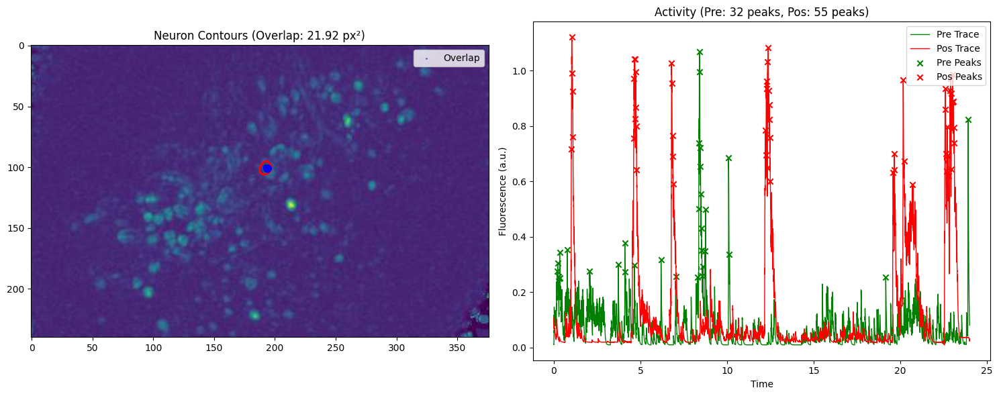

Overlap area: 21.92 pixels² (67.0% of pre-neuron area)


In [192]:
overlap_area, overlap_frac = calculate_neuron_overlap(neuron, match_index=29)
print(f"Overlap area: {overlap_area:.2f} pixels² ({overlap_frac:.1%} of pre-neuron area)")

(31, 13)
Overlap area: 41.94


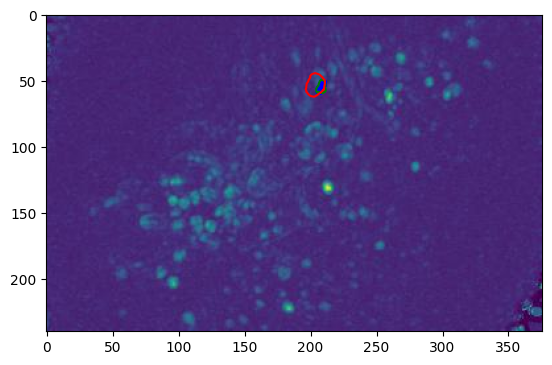

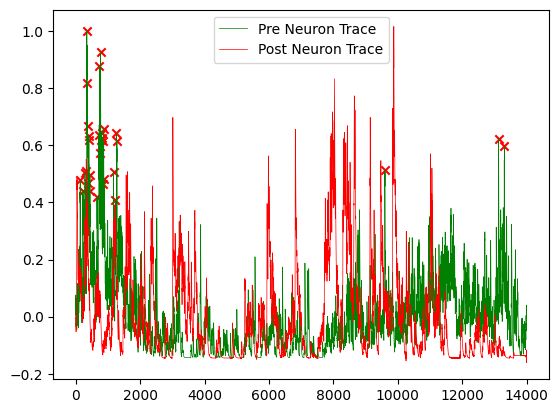

Number of peaks: 31


In [165]:

# Calculate the area of overlap between the two sets of coordinates

o= Nmatches(int(input("Neuron index: ")),matches,2)
print(o)

def clean_neuron_coordinates(pre_coords, pos_coords):
    def clean_coords(coords):
        clean_coords_list = []
        for i in range(len(coords)):
            x = coords[i].T[0]
            y = coords[i].T[1]
            
            # Remove NaNs
            valid_x = x[~np.isnan(x)]
            valid_y = y[~np.isnan(y)]
            
            # Stack valid coordinates
            if len(valid_x) == len(valid_y):
                clean_coords_list.append(np.column_stack((valid_x, valid_y)))
        
        return clean_coords_list

    pre_cleaned = clean_coords(pre_coords)
    pos_cleaned = clean_coords(pos_coords)
    
    return pre_cleaned, pos_cleaned

# Use the function
pre_clean, pos_clean = clean_neuron_coordinates(neuron.pre_cells_coordinates, neuron.pos_cells_coordinates)
plt.plot(pre_clean[o[0]].T[0],pre_clean[o[0]].T[1],c='g')
plt.plot(pos_clean[o[1]].T[0],pos_clean[o[1]].T[1],c='r')

pre_polygon = plt.Polygon(pre_clean[o[0]], closed=True)
pos_polygon = plt.Polygon(pos_clean[o[1]], closed=True)

pre_path = pre_polygon.get_path()
pos_path = pos_polygon.get_path()

# Create a grid of points to check for overlap
x_min = min(pre_polygon.xy[:, 0].min(), pos_polygon.xy[:, 0].min())
x_max = max(pre_polygon.xy[:, 0].max(), pos_polygon.xy[:, 0].max())
y_min = min(pre_polygon.xy[:, 1].min(), pos_polygon.xy[:, 1].min())
y_max = max(pre_polygon.xy[:, 1].max(), pos_polygon.xy[:, 1].max())

x, y = np.meshgrid(np.linspace(x_max, x_min, 100), np.linspace(y_max, y_min, 100))
points = np.vstack((x.flatten(), y.flatten())).T

# Check which points are inside both polygons
pre_mask = pre_path.contains_points(points)
pos_mask = pos_path.contains_points(points)
overlap_mask = pre_mask & pos_mask

# Calculate the area of overlap
overlap_area = overlap_mask.sum() * (x_max - x_min) * (y_max - y_min) / 10000
print(f'Overlap area: {overlap_area:.2f}')

# Plot the overlap area
plt.scatter(points[overlap_mask, 0], points[overlap_mask, 1], c='blue', s=1)
plt.imshow(PnrPre)
plt.plot()

plt.show()
# Example data
# Find peaks
peaks, _ = find_peaks(Pre_Trace[o[0]], height=3*Pre_Trace[o[0]].std(), distance=10)
np.linspace(0,24,len(Pre_Trace[o[0]]))
# Plot
plt.scatter(peaks,_['peak_heights'],marker='x',c='r')
#plt.plot(Pre_Trace[o[0]])
sns.lineplot(data=Pre_Trace[o[0]],lw=0.5 ,label='Pre Neuron Trace', color='g')
sns.lineplot(data=Pos_Trace[o[1]],lw=0.5 ,label='Post Neuron Trace', color='r')

plt.legend()
plt.show()
print(f'Number of peaks: {len(peaks)}')

In [193]:
for i in neuron.matches:
    print(f"Pre neuron {i[0]} matches with Post neuron {i[1]}")

Pre neuron 278 matches with Post neuron 220
Pre neuron 345 matches with Post neuron 244
Pre neuron 220 matches with Post neuron 133
Pre neuron 90 matches with Post neuron 59
Pre neuron 348 matches with Post neuron 225
Pre neuron 155 matches with Post neuron 99
Pre neuron 45 matches with Post neuron 24
Pre neuron 126 matches with Post neuron 66
Pre neuron 51 matches with Post neuron 26
Pre neuron 161 matches with Post neuron 78
Pre neuron 228 matches with Post neuron 140
Pre neuron 394 matches with Post neuron 259
Pre neuron 277 matches with Post neuron 219
Pre neuron 92 matches with Post neuron 50
Pre neuron 271 matches with Post neuron 184
Pre neuron 328 matches with Post neuron 252
Pre neuron 234 matches with Post neuron 156
Pre neuron 322 matches with Post neuron 239
Pre neuron 146 matches with Post neuron 82
Pre neuron 227 matches with Post neuron 121
Pre neuron 131 matches with Post neuron 67
Pre neuron 111 matches with Post neuron 46
Pre neuron 73 matches with Post neuron 28
Pre 

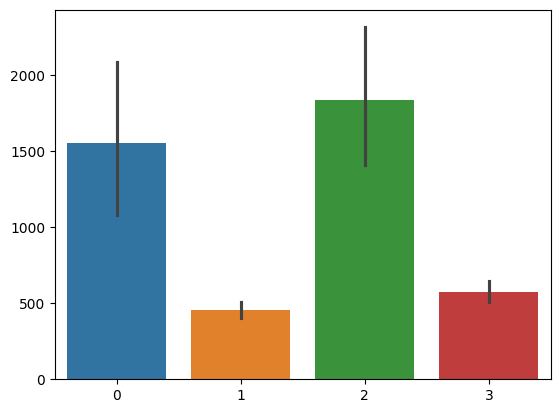

Pre Neuron Area: 1551.779178203964 Post Neuron Area: 1833.7445389380337


Pre Noise % activity: [0.40828571 0.15442857 0.22257143 0.69842857 0.16021429 0.63157143
 0.10314286 0.40442857 0.24092857 0.61685714 0.26564286 0.21714286
 0.19185714 0.46092857 0.4335     0.44621429 0.26292857 0.35757143
 0.38485714 0.11464286 0.47221429 0.36578571 0.16842857 0.20007143
 0.57871429 0.56814286 0.18292857 0.24635714 0.09271429 0.28728571]

Post Noise % activity: [0.17707143 0.39507143 0.50471429 0.51292857 0.41657143 0.59664286
 0.19221429 0.36778571 0.26735714 0.47764286 0.49664286 0.19478571
 0.44228571 0.316      0.92385714 0.20292857 0.29235714 0.38071429
 0.64378571 0.16914286 0.42864286 0.30992857 0.221      0.56021429
 0.23721429 0.63785714 0.85942857 0.56107143 0.19814286 0.15      ]

Pre Noise Area Activity: [356.6436022  165.95309487 138.23732923 945.30406462 142.39863373
 673.23553499 115.18029697 442.92954345 164.08858671 757.66175252
 192.05453417 163.54946027 138.58093574 495.161803

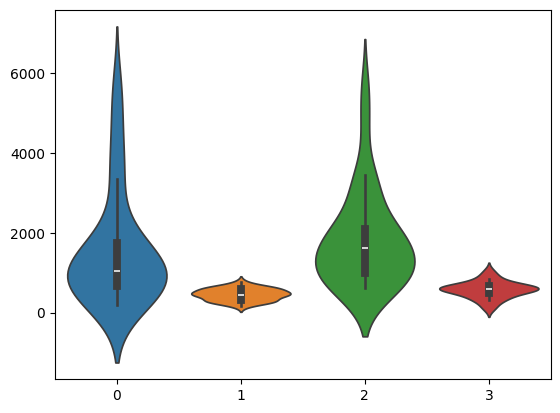

In [5]:
Sarea=np.array([])
Sarea2=np.array([])
NSarea=np.array([])
NSarea2=np.array([])
Pre_Act=np.array([])
Pos_Act=np.array([])
for i,l in enumerate(neuron.matches):
    threshold_pre = neuron.pre_trace[l[0]].std()  # or define a better threshold
    threshold_pos = neuron.pos_trace[l[1]].std()
    
    mask_pre = neuron.pre_trace[l[0]] >= threshold_pre
    mask_pos = neuron.pos_trace[l[1]] >= threshold_pos
    
    Sarea = np.append(Sarea, neuron.pre_trace[l[0]][mask_pre].sum())
    Sarea2 = np.append(Sarea2, neuron.pos_trace[l[1]][mask_pos].sum())
    
    mask_pre_low = neuron.pre_trace[l[0]] < threshold_pre
    mask_pos_low = neuron.pos_trace[l[1]] < threshold_pos

    NSarea = np.append(NSarea, neuron.pre_trace[l[0]][mask_pre_low].sum())
    NSarea2 = np.append(NSarea2, neuron.pos_trace[l[1]][mask_pos_low].sum())
    Pre_Act=np.append(Pre_Act,(len(neuron.pre_trace[l[0]][mask_pre])/ len(neuron.pre_trace[l[0]])))
    Pos_Act=np.append(Pos_Act,(len(neuron.pos_trace[l[1]][mask_pos])/ len(neuron.pos_trace[l[1]])))
    
sns.barplot(data=[Sarea,NSarea,Sarea2,NSarea2], label='Post Neuron Area')
plt.show()
sns.violinplot(data=[Sarea,NSarea,Sarea2,NSarea2], label='Post Neuron Area')
print(f'Pre Neuron Area: {Sarea.mean()}'
      f' Post Neuron Area: {Sarea2.mean()}')

print(f'\n\nPre Noise % activity: {Pre_Act}\n\nPost Noise % activity: {Pos_Act}\n\nPre Noise Area Activity: {(Sarea/NSarea)*100}\n\nPost Noise Area Activity: {(Sarea2/NSarea2)*100}')

In [6]:
def AUC_calc(matches):
    """
    Calculate the Area Under Curve (AUC) for pre and post neuron traces.
    
    Parameters:
        matches: List of matched neuron pairs (pre_idx, pos_idx)      
    Returns:
        sauc_pre:Significant AUC for pre neuron trace
        sauc_pos:Significant AUC for post neuron trace
        nsauc_pre:Non Significant AUC for pre neuron trace
        nsauc_pos:Non Significant AUC for post neuron trace
    """
    sauc_pre, sauc_pos = np.array([]), np.array([])
    nsauc_pre, nsauc_pos = np.array([]), np.array([])
    #
    Shasauc_pre, Shasauc_pos = np.array([]), np.array([])
    Shansauc_pre, Shansauc_pos = np.array([]), np.array([])
    for i,l in enumerate(neuron.matches):
        pre_trace = neuron.pre_trace[l[0]]
        pos_trace = neuron.pos_trace[l[1]]
        #Method 1 Individual Thresholds
        thresh_pre_spec = pre_trace.std()
        thresh_pos_spec = pos_trace.std()
        
        thresh_shared=threshold_pre
    for method, (thresh_pre, thresh_pos) in zip(
        ['spec', 'shared'],
        [(thresh_pre_spec, thresh_pos_spec), (thresh_shared, thresh_shared)]
    ):
        # Above threshold
        mask_pre = pre_trace >= thresh_pre
        mask_pos = pos_trace >= thresh_pos
        
        # Below threshold
        mask_pre_low = pre_trace < thresh_pre
        mask_pos_low = pos_trace < thresh_pos
        
        # Store results
        if method == 'spec':
            sauc_pre = np.append(sauc_pre, pre_trace[mask_pre].sum())
            sauc_pos = np.append(sauc_pos, pos_trace[mask_pos].sum())
            nsauc_pre = np.append(nsauc_pre, pre_trace[mask_pre_low].sum())
            nsauc_pos = np.append(nsauc_pos, pos_trace[mask_pos_low].sum())
        else:
            Shasauc_pre = np.append(Shasauc_pre, pre_trace[mask_pre].sum())
            Shasauc_pos = np.append(Shasauc_pos, pos_trace[mask_pos].sum())
            Shansauc_pre = np.append(Shansauc_pre, pre_trace[mask_pre_low].sum())
            Shansauc_pos = np.append(Shansauc_pos, pos_trace[mask_pos_low].sum())

        # Visualization
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

    # Method 1: Condition-specific
    sns.barplot(data=[sauc_pre, nsauc_pre, sauc_pos, nsauc_pos], 
                ax=ax1)
    ax1.set_title("Condition-Specific Thresholds")
    ax1.set_xticks([0,1,2,3])
    ax1.set_xticklabels(['Pre "Significant" ', 'Pre " Non Significant" ', 'Post "Significant" ', 'Post " Non Significant" '])

    # Method 2: Shared threshold
    sns.barplot(data=[Shasauc_pre, Shasauc_pos, Shansauc_pre, Shansauc_pos], 
                ax=ax2)
    ax2.set_title("Shared Baseline Threshold")
    ax2.set_xticks([0,1,2,3])
    ax2.set_xticklabels(['Pre "Significant" ', 'Pre " Non Significant" ', 'Post "Significant" ', 'Post " Non Significant" '])

    plt.tight_layout()
    plt.show()

    # Statistical comparison
    def print_stats(name, pre, post):
        t_stat, p_val = stats.ttest_rel(pre, post)
        print(f"\n{name}:")
        print(f"  Pre: {np.mean(pre):.2f} ± {np.std(pre):.2f}")
        print(f"  Post: {np.mean(post):.2f} ± {np.std(post):.2f}")
        print(f"  Paired t-test: p = {p_val:.8f}")

    print_stats("Condition-Specific (≥thresh)", sauc_pre, sauc_pos)
    print_stats("Shared Threshold (≥thresh)", Shasauc_pre, Shasauc_pos)

    # Effect size comparison
    cohen_d_spec = (np.mean(sauc_pos) - np.mean(sauc_pre)) / np.sqrt(
        (np.std(sauc_pre)**2 + np.std(sauc_pos)**2) / 2)
    cohen_d_shared = (np.mean(Shasauc_pos) - np.mean(Shasauc_pre)) / np.sqrt(
        (np.std(Shasauc_pre)**2 + np.std(Shasauc_pos)**2) / 2)

    print(f"\nEffect sizes:")
    print(f"  Condition-Specific: Cohen's d = {cohen_d_spec:.2f}")
    print(f"  Shared Threshold: Cohen's d = {cohen_d_shared:.2f}")
    return sauc_pre, sauc_pos, nsauc_pre, nsauc_pos, Shasauc_pre, Shasauc_pos, Shansauc_pre, Shansauc_pos

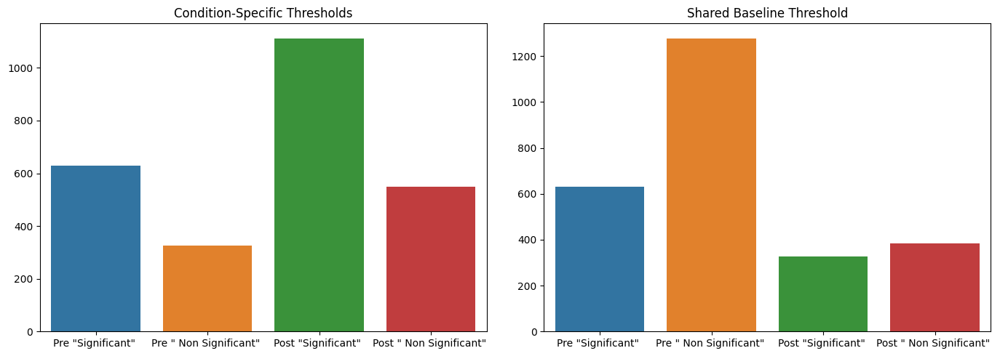


Condition-Specific (≥thresh):
  Pre: 630.25 ± 0.00
  Post: 1112.60 ± 0.00
  Paired t-test: p = nan

Shared Threshold (≥thresh):
  Pre: 630.25 ± 0.00
  Post: 1278.52 ± 0.00
  Paired t-test: p = nan

Effect sizes:
  Condition-Specific: Cohen's d = inf
  Shared Threshold: Cohen's d = inf
Significant AUC Pre: 630.247055938722, Post: 1112.5952724756314
Non-Significant AUC Pre: 325.45493315606143, Post: 548.9859923639626
Shared Significant AUC Pre: 630.247055938722, Post: 1278.5237193198868
Shared Non-Significant AUC Pre: 325.45493315606143, Post: 383.05754551970733


d:\Anaconda\envs\caiman\lib\site-packages\scipy\stats\_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
d:\Anaconda\envs\caiman\lib\site-packages\scipy\stats\_stats_py.py:1214: RuntimeWarning: invalid value encountered in scalar multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
C:\Users\AetherCheeta\AppData\Local\Temp\ipykernel_18768\2275565546.py:82: RuntimeWarning: divide by zero encountered in scalar divide
  cohen_d_spec = (np.mean(sauc_pos) - np.mean(sauc_pre)) / np.sqrt(
C:\Users\AetherCheeta\AppData\Local\Temp\ipykernel_18768\2275565546.py:84: RuntimeWarning: divide by zero encountered in scalar divide
  cohen_d_shared = (np.mean(Shasauc_pos) - np.mean(Shasauc_pre)) / np.sqrt(


In [8]:
AUC_results = AUC_calc(neuron.matches)
print(f"Significant AUC Pre: {AUC_results[0].mean()}, Post: {AUC_results[1].mean()}")
print(f"Non-Significant AUC Pre: {AUC_results[2].mean()}, Post: {AUC_results[3].mean()}")
print(f"Shared Significant AUC Pre: {AUC_results[4].mean()}, Post: {AUC_results[5].mean()}")
print(f"Shared Non-Significant AUC Pre: {AUC_results[6].mean()}, Post: {AUC_results[7].mean()}")

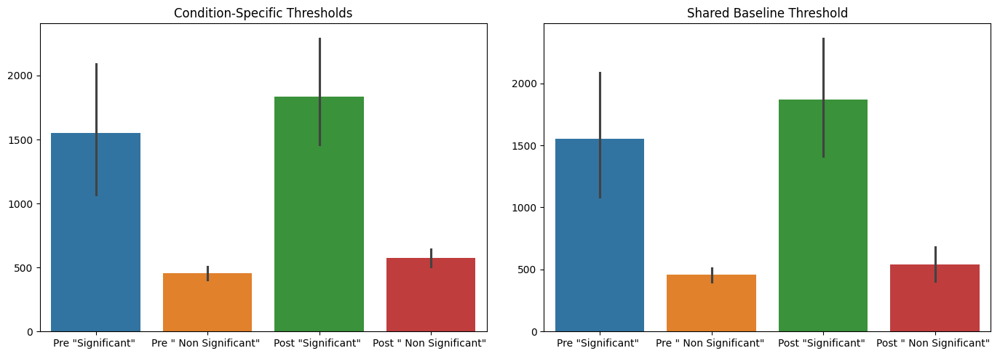

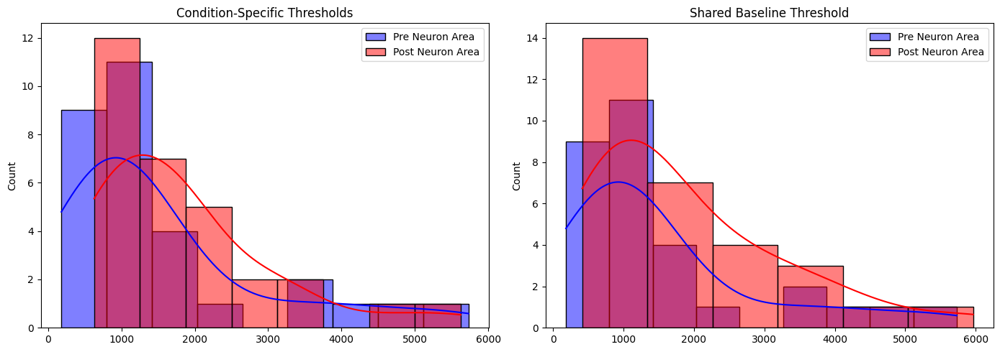


Condition-Specific (≥thresh):
  Pre: 1551.78 ± 1387.84
  Post: 1833.74 ± 1186.20
  Paired t-test: p = 0.38492932

Shared Threshold (≥thresh):
  Pre: 1551.78 ± 1387.84
  Post: 1868.76 ± 1357.48
  Paired t-test: p = 0.41728143

Effect sizes:
  Condition-Specific: Cohen's d = 0.22
  Shared Threshold: Cohen's d = 0.23


In [9]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
# Initialize arrays for both methods
# Condition-specific thresholds (your original approach)
Sarea_spec, Sarea2_spec = np.array([]), np.array([])
NSarea_spec, NSarea2_spec = np.array([]), np.array([])

# Shared threshold approach (using pre_trace std for both)
Sarea_shared, Sarea2_shared = np.array([]), np.array([])
NSarea_shared, NSarea2_shared = np.array([]), np.array([])

for i, l in enumerate(neuron.matches):
    pre_trace = neuron.pre_trace[l[0]]
    pos_trace = neuron.pos_trace[l[1]]
    
    # Method 1: Condition-specific thresholds
    thresh_pre_spec = pre_trace.std()
    thresh_pos_spec = pos_trace.std()
    
    # Method 2: Shared threshold (using pre_trace std for both)
    thresh_shared = pre_trace.std()
    
    # Calculate for both methods
    for method, (thresh_pre, thresh_pos) in zip(
        ['spec', 'shared'],
        [(thresh_pre_spec, thresh_pos_spec), (thresh_shared, thresh_shared)]
    ):
        # Above threshold
        mask_pre = pre_trace >= thresh_pre
        mask_pos = pos_trace >= thresh_pos
        
        # Below threshold
        mask_pre_low = pre_trace < thresh_pre
        mask_pos_low = pos_trace < thresh_pos
        
        # Store results
        if method == 'spec':
            Sarea_spec = np.append(Sarea_spec, pre_trace[mask_pre].sum())
            Sarea2_spec = np.append(Sarea2_spec, pos_trace[mask_pos].sum())
            NSarea_spec = np.append(NSarea_spec, pre_trace[mask_pre_low].sum())
            NSarea2_spec = np.append(NSarea2_spec, pos_trace[mask_pos_low].sum())
        else:
            Sarea_shared = np.append(Sarea_shared, pre_trace[mask_pre].sum())
            Sarea2_shared = np.append(Sarea2_shared, pos_trace[mask_pos].sum())
            NSarea_shared = np.append(NSarea_shared, pre_trace[mask_pre_low].sum())
            NSarea2_shared = np.append(NSarea2_shared, pos_trace[mask_pos_low].sum())

# Visualization
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Method 1: Condition-specific
sns.barplot(data=[Sarea_spec, NSarea_spec, Sarea2_spec, NSarea2_spec], 
            ax=ax1)
ax1.set_title("Condition-Specific Thresholds")
ax1.set_xticks([0,1,2,3])
ax1.set_xticklabels(['Pre "Significant" ', 'Pre " Non Significant" ', 'Post "Significant" ', 'Post " Non Significant" '])

# Method 2: Shared threshold
sns.barplot(data=[Sarea_shared, NSarea_shared, Sarea2_shared, NSarea2_shared], 
            ax=ax2)
ax2.set_title("Shared Baseline Threshold")
ax2.set_xticks([0,1,2,3])
ax2.set_xticklabels(['Pre "Significant" ', 'Pre " Non Significant" ', 'Post "Significant" ', 'Post " Non Significant" '])

plt.tight_layout()
plt.show()

fig,(ax1,ax2)=plt.subplots(1,2,figsize=(14,5))
sns.histplot(Sarea_spec,ax=ax1,color='blue',label='Pre Neuron Area',kde=True)
sns.histplot(Sarea2_spec,ax=ax1,color='r',label='Post Neuron Area',kde=True)
ax1.set_title('Condition-Specific Thresholds')
ax1.legend()

sns.histplot(Sarea_shared,ax=ax2,color='blue',label='Pre Neuron Area',kde=True)
sns.histplot(Sarea2_shared,ax=ax2,color='r',label='Post Neuron Area',kde=True)
ax2.set_title('Shared Baseline Threshold')
ax2.legend()

plt.tight_layout()
plt.show()
# Statistical comparison
def print_stats(name, pre, post):
    t_stat, p_val = stats.ttest_rel(pre, post)
    print(f"\n{name}:")
    print(f"  Pre: {np.mean(pre):.2f} ± {np.std(pre):.2f}")
    print(f"  Post: {np.mean(post):.2f} ± {np.std(post):.2f}")
    print(f"  Paired t-test: p = {p_val:.8f}")

print_stats("Condition-Specific (≥thresh)", Sarea_spec, Sarea2_spec)
print_stats("Shared Threshold (≥thresh)", Sarea_shared, Sarea2_shared)

# Effect size comparison
cohen_d_spec = (np.mean(Sarea2_spec) - np.mean(Sarea_spec)) / np.sqrt(
    (np.std(Sarea_spec)**2 + np.std(Sarea2_spec)**2) / 2)
cohen_d_shared = (np.mean(Sarea2_shared) - np.mean(Sarea_shared)) / np.sqrt(
    (np.std(Sarea_shared)**2 + np.std(Sarea2_shared)**2) / 2)

print(f"\nEffect sizes:")
print(f"  Condition-Specific: Cohen's d = {cohen_d_spec:.2f}")
print(f"  Shared Threshold: Cohen's d = {cohen_d_shared:.2f}")

## checking overlap and clusterization

### Running the overlaps

C:\Users\gabri\AppData\Local\Temp\ipykernel_3544\1828633915.py:102: RuntimeWarning: invalid value encountered in divide
  z_traces = zscore/zscore.max(axis=1, keepdims=True)  # Normalize to max value of each neuron


134
117
205


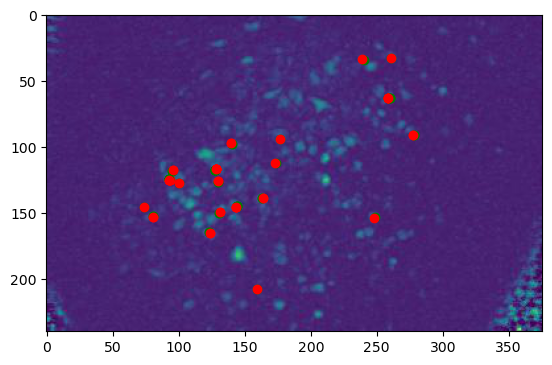

In [21]:

fpre, fpos = Dataimport(f0, f1)
Position = Positionplot(posi)

global Pre_Trace, Pos_Trace, Pre_idx, Pos_idx, Pre_x, Pos_x

Ttick = np.arange(0, 12, 0.5)
Pre_Trace = fpre['estimates']['C'][::]
Pre_idx = fpre['estimates']['idx_components'][:]
Pos_idx = fpos['estimates']['idx_components'][:]
Pos_Trace = fpos['estimates']['C'][::]

Pre_Trace = np.array(Pre_Trace)# Transfrom the traces into an array
Pos_Trace = np.array(Pos_Trace)

Pre_Trace = zscore_traces(Pre_Trace) #- Pre_Trace.min(axis=1)[:, None] + 0.01 #Subtract the minimum value of the trace and add 0.01 
Pos_Trace = zscore_traces(Pos_Trace) #- Pos_Trace.min(axis=1)[:, None] + 0.01

#Pre_Trace = Pre_Trace / Pre_Trace.max(axis=1)[:, None]#Normalize the traces
#Pos_Trace = Pos_Trace / Pos_Trace.max(axis=1)[:, None]

Pos_Trace = resample(Pos_Trace, 14000, axis=1)#Resample the Post traces 

Pre_x = np.linspace(0, 12, len(Pre_Trace[0][963::]))
Pos_x = np.linspace(0, 12, len(Pos_Trace[0][164::]))

# All neurons used for cluster
APre_X = Pre_Trace
APos_X = Pos_Trace

# CaImAn Neurons used for Cluster
CPre_X = Pre_Trace[Pre_idx]
CPos_X = Pos_Trace[Pos_idx]

Pre_Position = Position[0][0]#Get the position of the neurons PRe
Pos_Position = Position[1][0]#Get the position of the neurons Pos

GrayPrnPre = cv2.cvtColor(PnrPre, cv2.COLOR_BGR2GRAY)#Convert the image to gray
GrayPrnPos = cv2.cvtColor(PnrPos, cv2.COLOR_BGR2GRAY)#Convert the image to gray

Pre_Dimensions = np.shape(GrayPrnPre)
Pre_CenterOfMass = np.array([_['CoM'] for _ in visualization.get_contours(Pre_Position, Pre_Dimensions)])#Get the center of mass of the neurons
Pre_CellsCoordinates = [_['coordinates'] for _ in visualization.get_contours(Pre_Position, Pre_Dimensions)]

for index in range(len(Pre_Trace)):#Get the coordinates of the neurons
    globals()[f'idx{index}_coord'] = Pre_CellsCoordinates[index]

Pos_Dimensions = np.shape(GrayPrnPos)#Get the dimensions of the image
Pos_CenterOfMass = np.array([_['CoM'] for _ in visualization.get_contours(Pos_Position, Pos_Dimensions)])#Get the center of mass of the neurons
Pos_CellsCoordinates = [_['coordinates'] for _ in visualization.get_contours(Pos_Position, Pos_Dimensions)]#Get the coordinates of the neurons

for index in range(len(Pos_Trace)):#Get the coordinates of the neurons
    globals()[f'idx{index}_coord1'] = Pos_CellsCoordinates[index]
    #
# Process Pre_CellsCoordinates
# Process Pre_CellsCoordinates
contour_lengths_pre = [len(contour) for contour in Pre_CellsCoordinates]
contour_lengths_pre = np.array(contour_lengths_pre)
mean_length_pre = contour_lengths_pre.mean()
std_length_pre = contour_lengths_pre.std()
threshold_pre = mean_length_pre + std_length_pre

Pre_CellsCoordinates = [contour for contour in Pre_CellsCoordinates if len(contour) <= threshold_pre]
Pre_CenterOfMass = [Pre_CenterOfMass[i] for i in range(len(Pre_CellsCoordinates)) if len(Pre_CellsCoordinates[i]) <= threshold_pre]

# Process Pos_CellsCoordinates
contour_lengths = [len(contour) for contour in Pos_CellsCoordinates]
contour_lengths = np.array(contour_lengths)
mean_length = contour_lengths.mean()
std_length = 2*contour_lengths.std()
threshold = mean_length + std_length

Pos_CellsCoordinates = [contour for contour in Pos_CellsCoordinates if len(contour) <= threshold]
Pos_CenterOfMass = [Pos_CenterOfMass[i] for i in range(len(Pos_CellsCoordinates)) if len(Pos_CellsCoordinates[i]) <= threshold]

# Initialize arrays
abvstd = np.array([])
posabvstd = np.array([])
abvmean = np.array([])
posabvmean = np.array([])
ind = np.array([])

Pre_Idx = np.array([])
Pos_pIdx = np.array([])
Possible_Matches = np.array([])
PossiblePre_idx = np.array([])
PossiblePos_idx = np.array([])
NewaPossible_Matches = np.array([])
PreClusterMax = np.array([])
PreClusterSum = np.array([])
PreClusterMean = np.array([])
PreClusterStd = np.array([])
PreClusterVelocity = np.array([])

PosClusterMax = np.array([])
PosClustersSum = np.array([])
PosClusterMean = np.array([])
PosClusterStd = np.array([])
PosClusterVelocity = np.array([])

AllMean = np.array([])
Postimes = np.arange(0, len(Pos_Trace[0][168::10]), 1)
Pretimes = np.arange(0, len(Pre_Trace[0][963::10]), 1)


matches=matchesneurons(Pre_CenterOfMass, Pos_CenterOfMass)

match_counts = Counter(matches)

repeated_values = [value for value, count in match_counts.items() if count > 1]
repeated_positions = [position for position, match in enumerate(matches) if match in repeated_values]

not_repeated_values = [value for value, count in match_counts.items() if count == 1]
not_repeated_positions = [position for position, match in enumerate(matches) if match in not_repeated_values]






PosI = []
matches_array = np.array([np.array(t) for t in matches])
indices_0 = np.array([])
indices_1 = np.array([])

for match in matches_array:
  indices_0 = np.append(indices_0, match[0])
  indices_1 = np.append(indices_1, match[1])
indices_0 = indices_0.astype(int)
indices_1 = indices_1.astype(int)

for l, i in enumerate(indices_0):
  prestd = 1 * (Pre_Trace[i]).std()
  premean = 1 * (Pre_Trace[i]).mean()
  
  posmean = 1 * (Pos_Trace[indices_1[l]]).mean()
  posstd = 1 * (Pos_Trace[indices_1[l]]).std()
  
  abvmean = np.append(abvmean, len(np.where(Pre_Trace[i] > premean)[0]) / len(Pre_Trace[i]))
  posabvmean = np.append(posabvmean, len(np.where(Pos_Trace[indices_1[l]] > posmean)[0]) / len(Pos_Trace[indices_1[l]]))
  
  abvstd = np.append(abvstd, len(np.where(Pre_Trace[i] > prestd)[0]) / len(Pre_Trace[i]))
  posabvstd = np.append(posabvstd, len(np.where(Pos_Trace[l] > posstd)[0]) / len(Pos_Trace[l]))

Amean = np.vstack((abvmean, posabvmean)).T
Astd = np.vstack((abvstd, posabvstd, indices_0, indices_1)).T

Amean_df_clean, Astd_df_clean = clean_data(Astd, Amean)


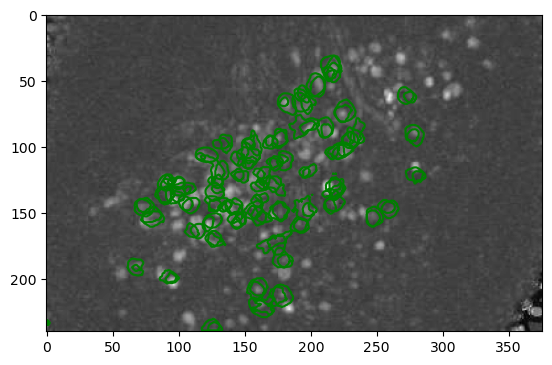

In [9]:
cle=Astd_df_clean.drop_duplicates(3)
cle=cle.loc[cle.groupby(0)[1].idxmin()]
allofthem=pd.merge(Astd_df_clean,cle,how='inner')

#cle=cle.drop_duplicates(0)
for i in allofthem.iloc[:,3]:
    #
    plotcounto(int(i),1,GrayPrnPos,0,[neuron.pre_cells_coordinates,neuron.pos_cells_coordinates])
for i in allofthem.iloc[:,2]:
    plotcounto(int(i),0,GrayPrnPre,0,[neuron.pre_cells_coordinates,neuron.pos_cells_coordinates])
#np.save('truemach',cle)

<Axes: >

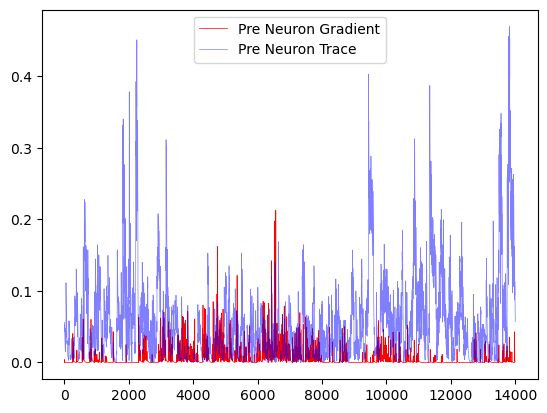

In [83]:
gradx,grady,=np.gradient(neuron.pre_trace[indices_0])
i=8
sns.lineplot(data=abs(grady[i]), label='Pre Neuron Gradient', color='r',lw=0.5)
sns.lineplot(data=abs(gradx[i]), label='Pre Neuron Trace', color='b', lw=0.5,alpha=0.5)


In [ ]:
neuron.zoomed_plot()

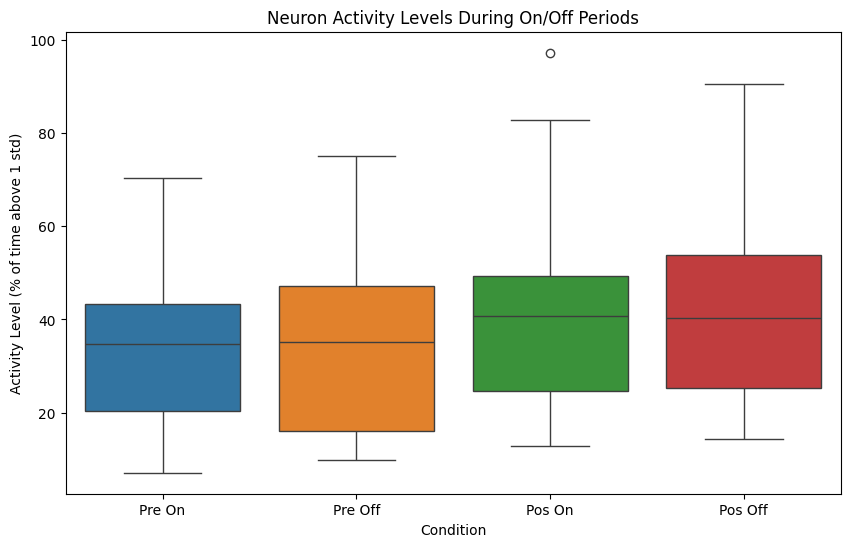

Protocol frequencies: [2, 10, 17, 4, 12, 18, 6, 14, 19, 8, 16, 20]
PRE neuron responses (each row is a neuron, columns match protocol order):
[[ 83.33  42.67  21.67   0.67  35.5    8.33  13.33  58.33  49.33  92.83
   22.83   0.  ]
 [  7.67  14.33  44.17  22.67  34.5    3.33   0.     4.67   0.83  45.
    4.17   0.  ]
 [ 21.17   2.    10.67   6.17  49.5    0.5   56.    19.17  35.17  30.17
   50.5    0.  ]
 [ 23.17  95.5   69.67  82.5   67.5   93.67  57.5   92.    52.33  80.17
   84.5    0.  ]
 [ 10.    13.83  54.17   9.83  20.83  60.5    0.    14.     0.     0.33
    4.33   0.  ]
 [ 93.5   39.    19.5   65.    80.83  23.    93.83  58.67  95.67  46.5
  100.     0.  ]
 [  4.17  26.67   2.83   9.33   0.    28.83   0.     4.83   9.17  11.
    3.33   0.  ]
 [  3.17  63.83  93.33  96.83  85.5   96.67   2.17  13.5    0.     0.
    6.5    0.  ]
 [ 62.5    2.83  23.17   3.17  57.17   1.     0.    43.     2.83  27.33
   31.17   0.  ]
 [100.    31.33  14.5    3.33   9.67   0.    91.17  59.67 100.  

In [175]:
# Define the frequency protocol in the correct order
protocol = [2, 10, 17, 4, 12, 18, 6, 14, 19, 8, 16, 20]

# Determine number of complete 600-point segments available
pre_intervals = int(len(neuron.pre_trace[neuron.matches[0][0]][965::])/600)
pos_intervals = int(len(neuron.pos_trace[neuron.matches[0][1]][164::])/600)

# Initialize storage
pre_on_traces = []  # Each will be [n_on_segments × 600]
pre_off_traces = []  # Each will be [n_off_segments × 600]
pos_on_traces = []
pos_off_traces = []
pre_freq_responses = []  # Will store arrays of responses in protocol order for each PRE neuron
pos_freq_responses = []  # Will store arrays of responses in protocol order for each POS neuron

pre_on_traces_activity = []  # To store overall activity levels
pre_off_traces_activity = []
pos_on_traces_activity = []
pos_off_traces_activity = []

for pre_idx, pos_idx in neuron.matches:
    pre_trace = neuron.pre_trace[pre_idx]
    pos_trace = neuron.pos_trace[pos_idx]
    
    # Initialize response arrays for this neuron pair
    pre_neuron_responses = np.zeros(len(protocol))  # Will store responses in protocol order
    pos_neuron_responses = np.zeros(len(protocol))
    
    # Process PRE neuron - alternate on/off collection
    pre_on_segments = []
    pre_off_segments = []
    freq_counter = 0  # Tracks which frequency we're on in the protocol
    
    for i in range(pre_intervals):
        segment = pre_trace[965 + i*600 : 965 + (i+1)*600]
        response = round(len(np.where(segment >= pre_trace.std())[0])/len(segment), 4) * 100
        
        if i % 2 == 0:  # Even indices are "on" segments (frequency presentations)
            pre_on_segments.append(segment)
            if freq_counter < len(protocol):  # Only store if we have protocol frequencies left
                pre_neuron_responses[freq_counter] = response
                freq_counter += 1
        else:           # Odd indices are "off"
            pre_off_segments.append(segment)
    
    # Process POST neuron - alternate on/off collection
    pos_on_segments = []
    pos_off_segments = []
    freq_counter = 0  # Reset for POST neuron
    
    for i in range(pos_intervals):
        segment = pos_trace[164 + i*600 : 164 + (i+1)*600]
        response = round(len(np.where(segment >= pos_trace.std())[0])/len(segment), 4) * 100
        
        if i % 2 == 0:  # Even indices are "on" segments (frequency presentations)
            pos_on_segments.append(segment)
            if freq_counter < len(protocol):  # Only store if we have protocol frequencies left
                pos_neuron_responses[freq_counter] = response
                freq_counter += 1
        else:           # Odd indices are "off"
            pos_off_segments.append(segment)
    
    # Concatenate all segments for this neuron
    segmented_pre_on = np.concatenate(pre_on_segments)
    segmented_pre_off = np.concatenate(pre_off_segments)
    segmented_pos_on = np.concatenate(pos_on_segments)
    segmented_pos_off = np.concatenate(pos_off_segments)
    
    # Store the traces
    pre_on_traces.append(segmented_pre_on)
    pre_off_traces.append(segmented_pre_off)
    pos_on_traces.append(segmented_pos_on)
    pos_off_traces.append(segmented_pos_off)
    
    # Store frequency responses (in protocol order)
    pre_freq_responses.append(pre_neuron_responses)
    pos_freq_responses.append(pos_neuron_responses)

# Convert to numpy arrays
pre_on_traces = np.array(pre_on_traces)
pre_off_traces = np.array(pre_off_traces)
pos_on_traces = np.array(pos_on_traces)
pos_off_traces = np.array(pos_off_traces)
pre_freq_responses = np.array(pre_freq_responses)  # Shape: [n_neurons, n_frequencies]
pos_freq_responses = np.array(pos_freq_responses)

# Calculate overall activity levels (same as before)
for i in pre_on_traces:
    pre_on_traces_activity.append((round(len(np.where(i>=i.std())[0])/len(i),4)*100))
for i in pre_off_traces:
    pre_off_traces_activity.append((round(len(np.where(i>=i.std())[0])/len(i),4)*100))
for i in pos_on_traces:
    pos_on_traces_activity.append((round(len(np.where(i>=i.std())[0])/len(i),4)*100))
for i in pos_off_traces:
    pos_off_traces_activity.append((round(len(np.where(i>=i.std())[0])/len(i),4)*100))

# Create activity matrix
Actvmatrix = np.array([pre_on_traces_activity, pre_off_traces_activity, 
                      pos_on_traces_activity, pos_off_traces_activity])
Actvmatrix = pd.DataFrame(Actvmatrix.T, columns=['Pre On','Pre Off','Pos On','Pos Off'])

# Plot
plt.figure(figsize=(10,6))
sns.boxplot(data=Actvmatrix)
plt.title('Neuron Activity Levels During On/Off Periods')
plt.ylabel('Activity Level (% of time above 1 std)')
plt.xlabel('Condition')
plt.show()

# Now you can access frequency responses in protocol order:
print("Protocol frequencies:", protocol)
print("PRE neuron responses (each row is a neuron, columns match protocol order):")
print(pre_freq_responses)
print("POS neuron responses (each row is a neuron, columns match protocol order):")
print(pos_freq_responses)

# Find best frequency for each neuron (index into protocol)
pre_best_freq_indices = np.argmax(pre_freq_responses, axis=1)
pos_best_freq_indices = np.argmax(pos_freq_responses, axis=1)

pre_best_frequencies = [protocol[i] for i in pre_best_freq_indices]
pos_best_frequencies = [protocol[i] for i in pos_best_freq_indices]

print("\nPRE neuron best frequencies:", pre_best_frequencies)
print("POS neuron best frequencies:", pos_best_frequencies)

<Axes: >

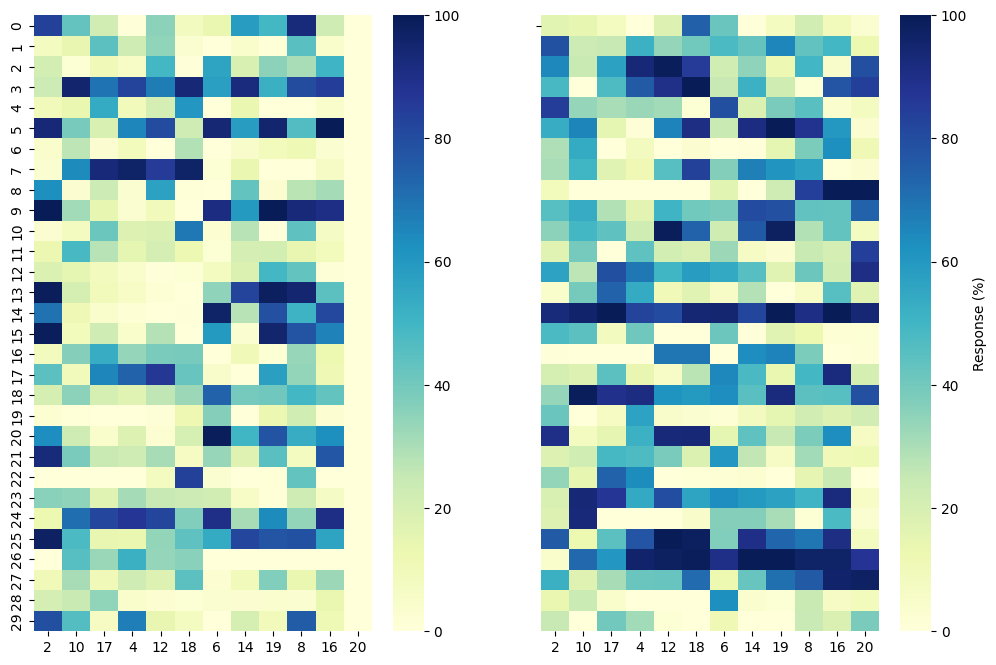

In [176]:
fig,ax=plt.subplots(1,2,figsize=(12,8))
sns.heatmap(pre_freq_responses,  cmap="YlGnBu",
            xticklabels=protocol, yticklabels=np.arange(len(neuron.matches)), ax=ax[0])
sns.heatmap(pos_freq_responses, cmap="YlGnBu",
            xticklabels=protocol, yticklabels=[''],
            cbar_kws={'label': 'Response (%)'}, ax=ax[1])

<Axes: ylabel='Count'>

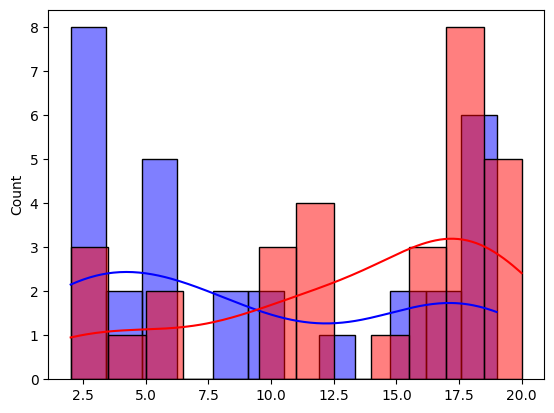

In [151]:
sns.histplot(pre_best_frequencies, bins=len(protocol), kde=True, color='blue', label='Pre Neuron Best Frequencies')
sns.histplot(pos_best_frequencies, bins=len(protocol), kde=True, color='red', label='Post Neuron Best Frequencies')

KS Statistic Pre: 1.0
KS Statistic Post: 1.0
P-Value Pre: 0.0
P-Value Post: 0.0
Two-Sample KS Statistic: 0.23333333333333334
Two-Sample P-Value: 0.39294501397971776
The two samples Pre and Pos are not significantly different.


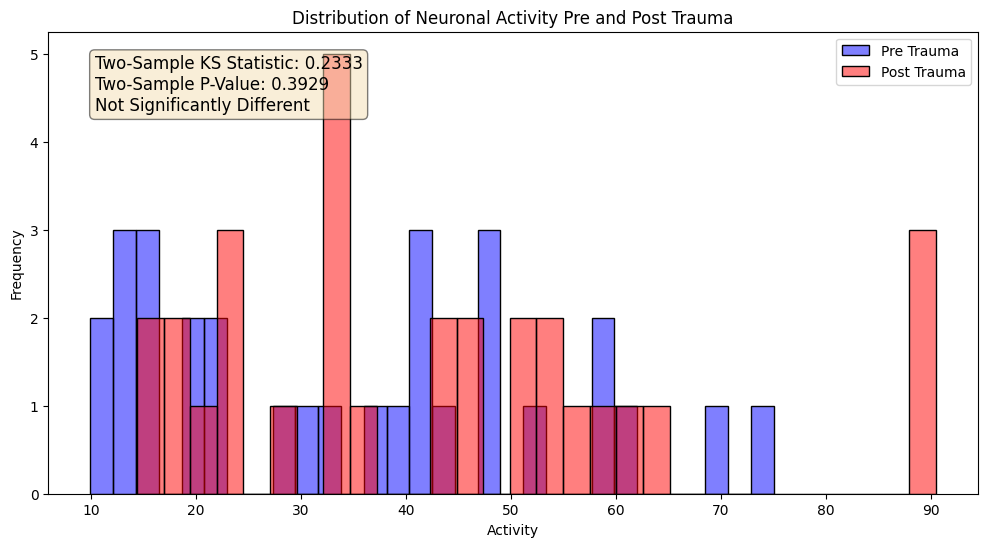

In [183]:
from scipy.stats import kstest, ks_2samp

# Perform the Kolmogorov-Smirnov test for normality
ks_statistic, p_value = kstest(Actvmatrix['Pre Off'].values, 'norm')
ks_statistic1, p_value1 = kstest(Actvmatrix["Pos Off"].values, 'norm')

print(f"KS Statistic Pre: {ks_statistic}\nKS Statistic Post: {ks_statistic1}")
print(f"P-Value Pre: {p_value}\nP-Value Post: {p_value1}")

# Perform the two-sample Kolmogorov-Smirnov test
ks_statistic_2samp, p_value_2samp = ks_2samp(Actvmatrix['Pre Off'].values, Actvmatrix['Pos Off'].values)

print(f"Two-Sample KS Statistic: {ks_statistic_2samp}")
print(f"Two-Sample P-Value: {p_value_2samp}")

# Interpretation
if p_value_2samp < 0.05:
    print("The two samples Pre and Pos are significantly different.")
else:
    print("The two samples Pre and Pos are not significantly different.")

# Plot the distributions of the two samples
plt.figure(figsize=(12, 6))
sns.histplot(Actvmatrix['Pre Off'].values, bins=30, alpha=0.5, label='Pre Trauma', color='blue')
sns.histplot(Actvmatrix['Pos Off'].values, bins=30, alpha=0.5, label='Post Trauma', color='red')
plt.xlabel('Activity')
plt.ylabel('Frequency')
plt.title('Distribution of Neuronal Activity Pre and Post Trauma')
plt.legend(loc='upper right')

# Add text box with KS test results
textstr = '\n'.join((
    f'Two-Sample KS Statistic: {ks_statistic_2samp:.4f}',
    f'Two-Sample P-Value: {p_value_2samp:.4f}',
    'Significantly Different' if p_value_2samp < 0.05 else 'Not Significantly Different'
))

# Place a text box in upper left in axes coords
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.gca().text(0.05, 0.95, textstr, transform=plt.gca().transAxes, fontsize=12,
               verticalalignment='top', bbox=props)

plt.show()

In [169]:
Actvmatrix['Pre Off'].values

array([38.75, 13.32, 10.37, 75.03, 14.68, 61.47,  9.93, 41.35, 32.43,
       68.68, 29.68, 22.88, 14.8 , 48.98, 47.28, 47.07, 27.85, 37.95,
       41.83, 14.15, 51.9 , 40.95, 20.3 , 20.22, 57.95, 57.92, 22.37,
       13.48, 14.78, 44.15])

<Axes: >

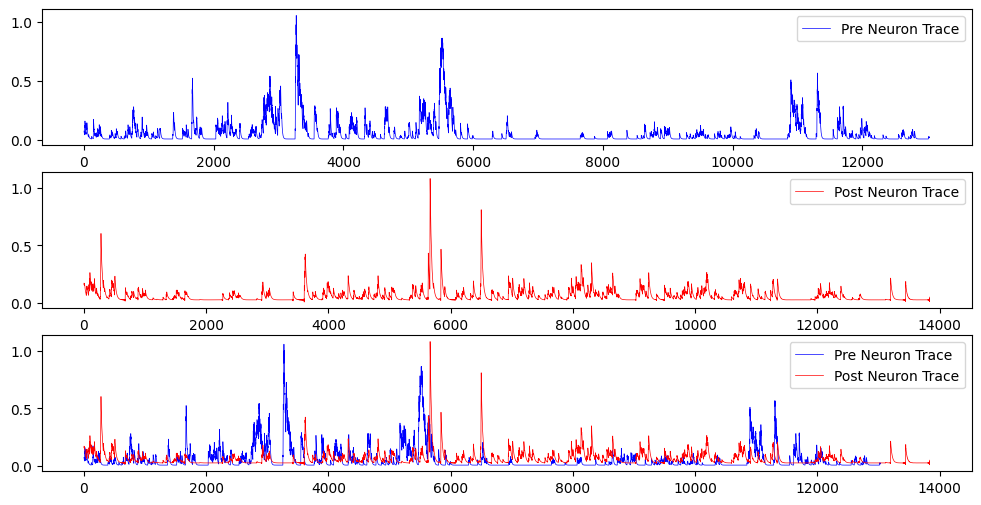

In [213]:
a=1
pre_trace=[neuron.pre_trace[pre_index][965::] for (pre_index,pos_index) in neuron.matches]
pos_trace=[neuron.pos_trace[pos_index][164::] for (pre_index,pos_index) in neuron.matches]
fig,ax=plt.subplots(3,1,figsize=(12,6))
sns.lineplot(data=pre_trace[a],ax=ax[0], label='Pre Neuron Trace', color='blue',lw=0.5)
sns.lineplot(data=pos_trace[a],ax=ax[1], label='Post Neuron Trace', color='red',lw=0.5)
sns.lineplot(data=pre_trace[a] ,ax=ax[2],color='blue', label='Pre Neuron Trace',lw=0.5)
sns.lineplot(data=pos_trace[a],ax=ax[2],color='red', label='Post Neuron Trace',lw=0.5)


36.449999999999996
54.949999999999996


<Axes: >

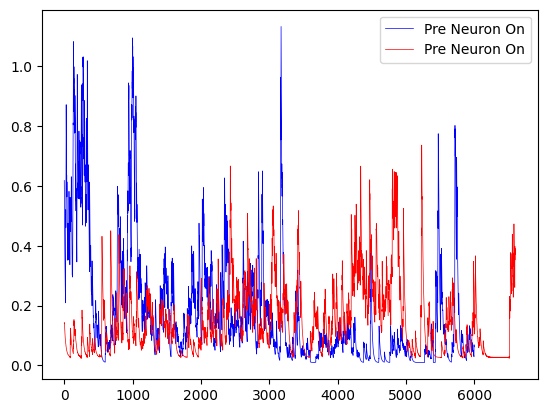

In [28]:
a=10
print((len(np.where(pre_off_traces[a]>neuron.pre_trace[neuron.matches[a][0]][965::].std())[0])/6000)*100)
print((len(np.where(pos_off_traces[a]>neuron.pos_trace[neuron.matches[a][1]][164::].std())[0])/6000)*100)
sns.lineplot(data=pre_off_traces[a], label='Pre Neuron On', color='b', lw=0.5)
sns.lineplot(data=pos_off_traces[a], label='Pre Neuron On', color='r', lw=0.5)



12.316666666666666

In [ ]:

#963 is the correct for pre neurons/signals stamp
#164 is the correct for pos neurons/signals stamp
#600 is the correct for the duration of the stimulus at 20fps
cmatrix = []
Sound=[]
preiterations = int(len(Pre_Trace[0][965:]) / 600)  # How many frames are going to be analyzed in that interval
positerations = int(len(Pos_Trace[0][164:]) / 600)

for o in range(len(neuron.matches)):
    soon_list = []#Vector to store the pre-stimulus traces Only with stim on
    soof_list = []#Vector to store the post-stimulus traces Only with stim on
    
    for i in range(preiterations):
        if i % 2 != 0:
            start = 965 + (i * 600)
            end = start + 600
            slice_to_append = neuron.pre_trace[neuron.matches[o][0]][start:end]  # Slicing the trace to be analyzed
            soon_list.append(slice_to_append)  # Append slice_to_append to soon_list

    # Repeating the same process for the post-stimulus trace
    for i in range(positerations):
        if i % 2 != 0:
            posstart = 164 + (i * 600)
            posend = posstart + 600
            posslice = neuron.pos_trace[neuron.matches[o][1]][posstart:posend]
            soof_list.append(posslice)

    # Convert the lists to numpy arrays
    soon = np.concatenate(soon_list, axis=0)
    soof = np.concatenate(soof_list, axis=0)
    
    if len(np.where(soon >= neuron.pre_trace[neuron.matches[o][0]].std())[0]):  # Compare the number of elements in the array that are greater than the mean of the pre-stimulus trace
        cmatrix.append(round(len(np.where(soof >= neuron.pre_trace[neuron.matches[o][0]].std())[0]) / len(np.where(soon >= neuron.pre_trace[neuron.matches[o][0]].std())[0]), 3))  # If they are, check how many of them are greater than the std of the pre-stimulus trace
        Sound.append(round(len(np.where(soon >= neuron.pre_trace[neuron.matches[o][0]].std())[0]) / len(soof), 3))  # If they are, check how many of them are greater than the std of the pre-stimulus trace

#print(f'{len(np.where(cle[0]<=cle[1])[0])} neurons with a higher activity in the Pos trauma group\n{len(np.where(cle[0]>cle[1])[0])} neurons with less activity in the Pos trauma group\nthis shows an increase of activity in {round(len(np.where(cle[0]<=cle[1])[0])/len(cle[0])*100,2)}% of the neurons') 
print(f'{len(np.where(np.array(cmatrix) > 1)[0]) / len(cmatrix) * 100} have a higher activity in silence')
print(f'{len(np.where(np.array(cmatrix) < 1)[0]) / len(cmatrix) * 100} have a lower activity in silence\n\n')
print(f'{len(np.where(np.array(Sound) > 1)[0]) / len(Sound) * 100} have a higher activity in sound')
print(f'{len(np.where(np.array(Sound) < 1)[0]) / len(Sound) * 100} have a lower activity in sound')

70.0 have a higher activity in silence
30.0 have a lower activity in silence


0.0 have a higher activity in sound
100.0 have a lower activity in sound


In [112]:
pre_trace=[]
pos_trace=[]
all_trace=[]
for l, (pre_idx, pos_idx) in enumerate(neuron.matches):
    pre_trace.append(neuron.pre_trace[pre_idx])
    pos_trace.append(neuron.pos_trace[pos_idx])
    all_trace.append(neuron.pre_trace[pre_idx])
    all_trace.append(neuron.pos_trace[pos_idx])

pre_timeseries = np.array(pre_trace)
pos_timeseries = np.array(pos_trace)
all_timeseries = np.array(all_trace)

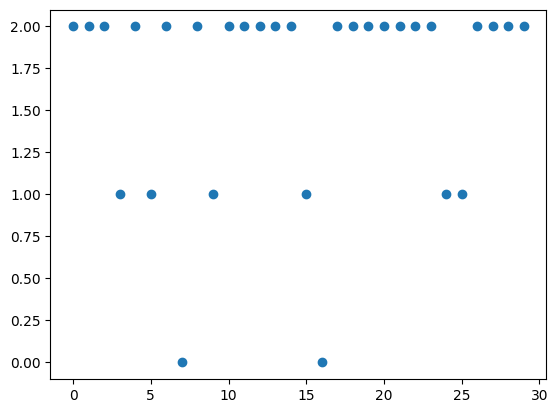

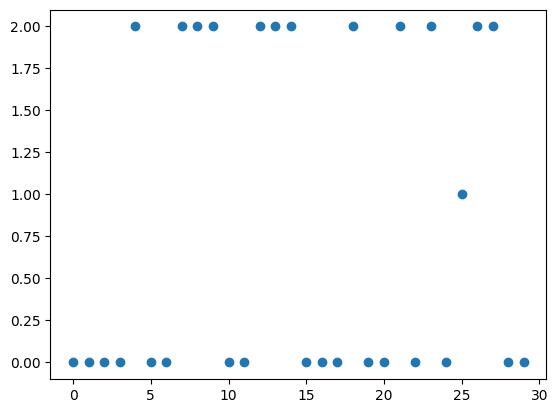

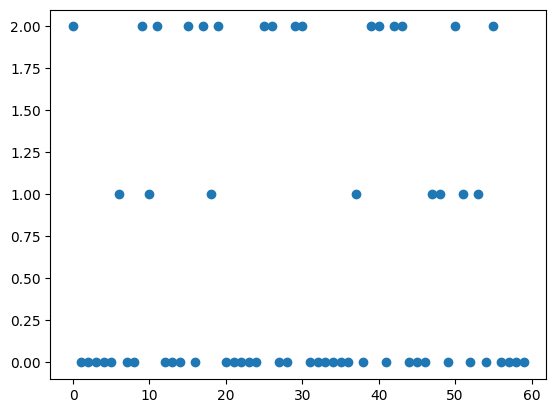

In [114]:
prekmeans= KMeans(n_clusters=3, random_state=0)
prekmeans.fit_predict(pre_timeseries)
precluster_labels = prekmeans.labels_
poskmeans = KMeans(n_clusters=3, random_state=0)
poskmeans.fit_predict(pos_timeseries)
poscluster_labels = poskmeans.labels_
allkmeans = KMeans(n_clusters=3, random_state=0)
allkmeans.fit_predict(all_timeseries)
allcluster_labels = allkmeans.labels_
plt.scatter(np.arange(0,len(precluster_labels)),precluster_labels)
plt.show()
plt.scatter(np.arange(0,len(poscluster_labels)),poscluster_labels)
plt.show()
plt.scatter(np.arange(0,len(allcluster_labels)),allcluster_labels)
plt.show()

In [111]:
print(f'{precluster_labels}\n\n{poscluster_labels}\n\nPre:{allcluster_labels[::2]}\n\nPos:{allcluster_labels[1::2]}')

[0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0]

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0]

Pre:[0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0]

Pos:[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 1 1 0 0]


In [ ]:
from scipy.stats import kstest, ks_2samp

# Perform the Kolmogorov-Smirnov test for normality
ks_statistic, p_value = kstest(cle[0], 'norm')
ks_statistic1, p_value1 = kstest(cle[1], 'norm')

print(f"KS Statistic Pre: {ks_statistic}\nKS Statistic Post: {ks_statistic1}")
print(f"P-Value Pre: {p_value}\nP-Value Post: {p_value1}")

# Perform the two-sample Kolmogorov-Smirnov test
ks_statistic_2samp, p_value_2samp = ks_2samp(cle[0], cle[1])

print(f"Two-Sample KS Statistic: {ks_statistic_2samp}")
print(f"Two-Sample P-Value: {p_value_2samp}")

# Interpretation
if p_value_2samp < 0.05:
    print("The two samples Pre and Pos are significantly different.")
else:
    print("The two samples Pre and Pos are not significantly different.")

# Plot the distributions of the two samples
plt.figure(figsize=(12, 6))
plt.hist(cle[0], bins=30, alpha=0.5, label='Pre Trauma', color='blue')
plt.hist(cle[1], bins=30, alpha=0.5, label='Post Trauma', color='red')
plt.xlabel('Activity')
plt.ylabel('Frequency')
plt.title('Distribution of Neuronal Activity Pre and Post Trauma')
plt.legend(loc='upper right')

# Add text box with KS test results
textstr = '\n'.join((
    f'Two-Sample KS Statistic: {ks_statistic_2samp:.4f}',
    f'Two-Sample P-Value: {p_value_2samp:.4f}',
    'Significantly Different' if p_value_2samp < 0.05 else 'Not Significantly Different'
))

# Place a text box in upper left in axes coords
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.gca().text(0.05, 0.95, textstr, transform=plt.gca().transAxes, fontsize=12,
               verticalalignment='top', bbox=props)

plt.show()

##  Artigo v2

### Fig 1

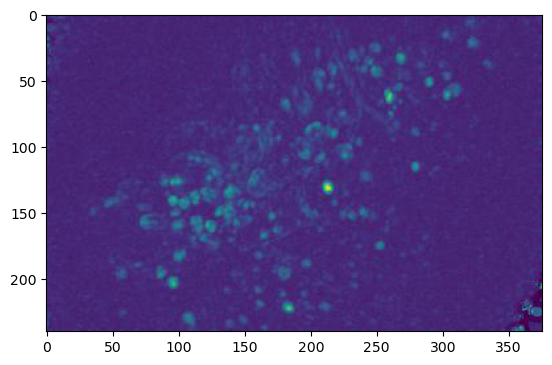

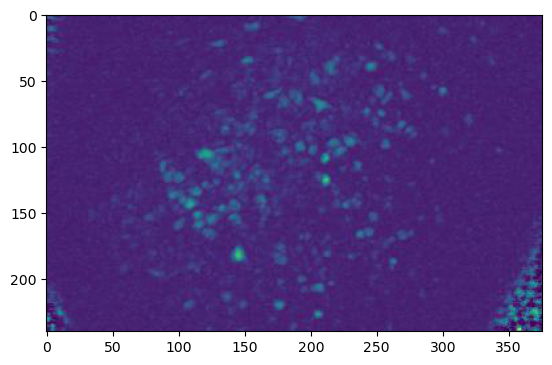

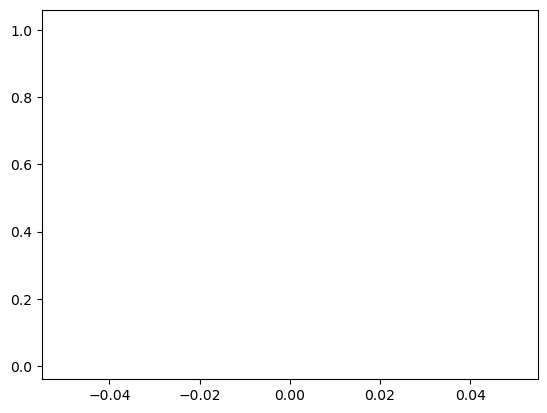

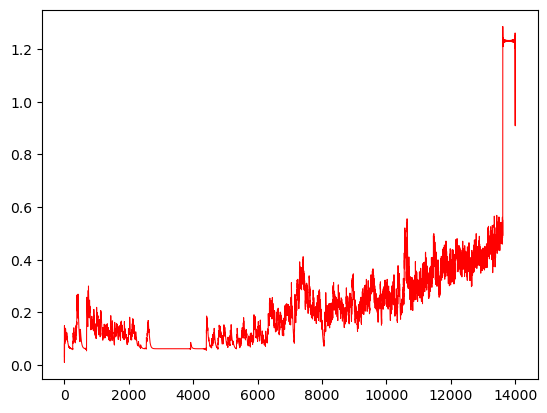

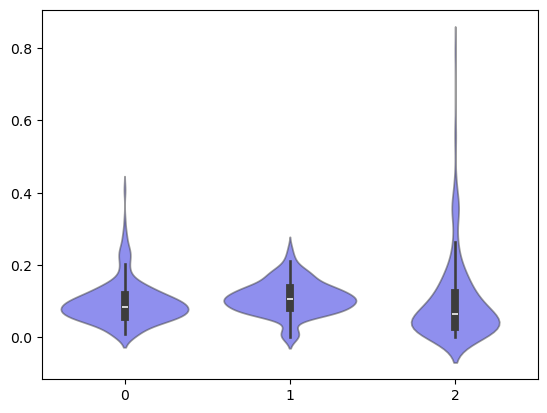

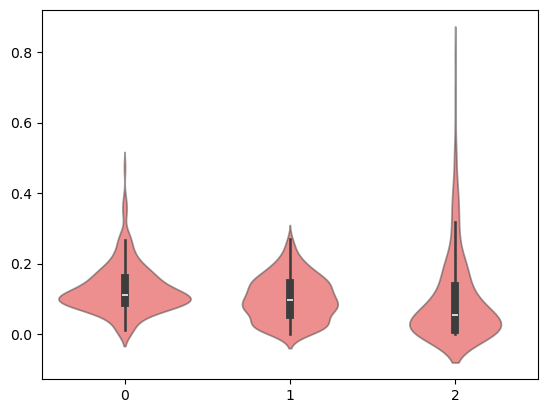

In [7]:
# Violin plot for pre and pos traces
#ax,fig=plt.subplots(1,2,figsize=(10, 5))
#média 

Label=["Mean","Std","Activity"]
PreValid=neuron.pre_trace[neuron.pre_idx[~np.isnan(neuron.pre_trace[neuron.pre_idx].std(axis=1))]]
PosValid=neuron.pos_trace[neuron.pos_idx[~np.isnan(neuron.pos_trace[neuron.pos_idx].std(axis=1))]]

PreValidMean=PreValid.mean(axis=1)
PosValidMean=PosValid.mean(axis=1)

PreValidSd=PreValid.std(axis=1)
PosValidSd=PosValid.std(axis=1)


PreValidActivity=[]
PosValidActivity=[]

for i in PreValid:
    PreValidActivity.append(len(np.where(i>=PreValidSd.max())[0])/len(i))
for j in PosValid:
    PosValidActivity.append(len(np.where(j>=PosValidSd.max())[0])/len(j))
PreValidActivity,PosValidActivity=np.array(PreValidActivity),np.array(PosValidActivity)

pos_mean=neuron.pos_trace[neuron.pos_idx].mean(axis=1)
plt.imshow(PnrPre,cmap='gray')
plt.show()
plt.imshow(PnrPos,cmap='gray')
plt.show()
plt.plot(PreValid[[4]],lw=0.75,c='b')
plt.show()
plt.plot(PosValid[4],lw=0.75,c='r')
plt.show()
sns.violinplot(data=[PreValidMean,PreValidSd,PreValidActivity], color='b', alpha=0.5)
plt.show()
sns.violinplot(data=[PosValidMean,PosValidSd,PosValidActivity], color='r', alpha=0.5)
plt.show()

C:\Users\gabri\AppData\Local\Temp\ipykernel_9848\2797992053.py:44: UserWarning: 
The palette list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.violinplot(data=pd.DataFrame(metrics['Pre']), ax=axes[0, 2],
C:\Users\gabri\AppData\Local\Temp\ipykernel_9848\2797992053.py:68: UserWarning: 
The palette list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.violinplot(data=pd.DataFrame(metrics['Post']), ax=axes[1, 2],


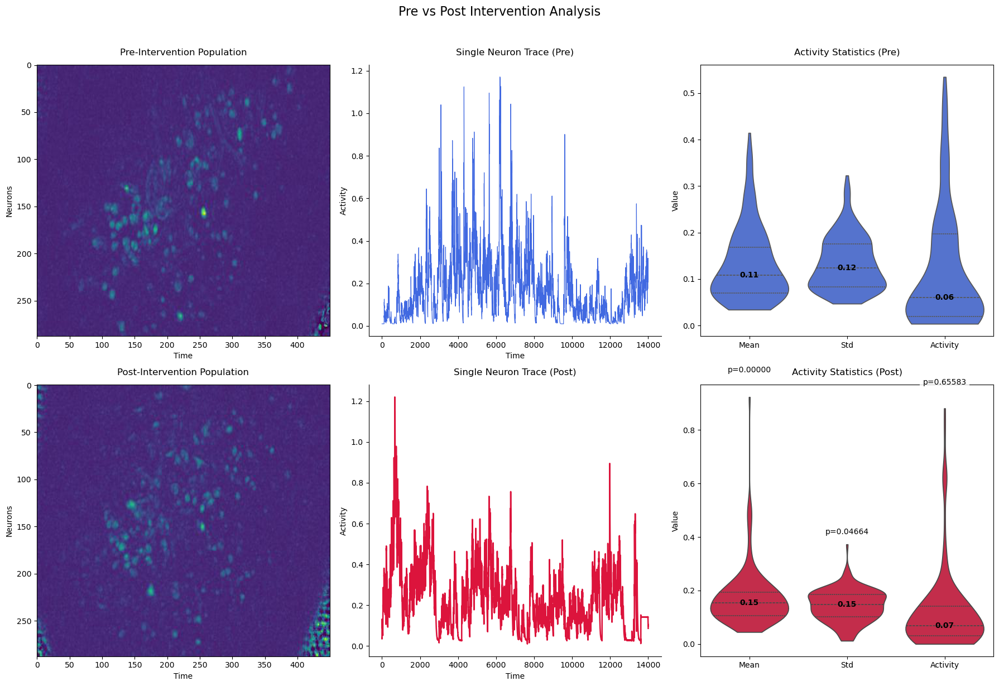

In [144]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import pandas as pd

# Data processing
PreValid = neuron.pre_trace[indices_0[~np.isnan(neuron.pre_trace[indices_0].std(axis=1))]]
PosValid = neuron.pos_trace[indices_1[~np.isnan(neuron.pos_trace[indices_1].std(axis=1))]]

# Calculate metrics
metrics = {
    'Pre': {
        'Mean': PreValid.mean(axis=1),
        'Std': PreValid.std(axis=1),
        'Activity': [(trace >= PreValid.std(axis=1).max()).mean() for trace in PreValid]
    },
    'Post': {
        'Mean': PosValid.mean(axis=1),
        'Std': PosValid.std(axis=1),
        'Activity': [(trace >= PosValid.std(axis=1).max()).mean() for trace in PosValid]
    }
}

# Create figure
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
plt.suptitle('Pre vs Post Intervention Analysis', y=1.02, fontsize=16)
i=2
# Row 1: Pre-intervention
# 1. Left: Population raster
axes[0, 0].imshow(PnrPre, cmap='gray', aspect='auto')
axes[0, 0].set_title('Pre-Intervention Population', pad=12)
axes[0, 0].set_xlabel('Time')
axes[0, 0].set_ylabel('Neurons')

# 2. Middle: Example trace
axes[0, 1].plot(PreValid[neuron.pre_idx[i]], lw=0.85, c='royalblue')
axes[0, 1].set_title('Single Neuron Trace (Pre)', pad=12)
axes[0, 1].set_xlabel('Time')
axes[0, 1].set_ylabel('Activity')
sns.despine(ax=axes[0, 1])

# 3. Right: Violin plots
sns.violinplot(data=pd.DataFrame(metrics['Pre']), ax=axes[0, 2], 
               palette=['royalblue'], inner='quartile', cut=0)
axes[0, 2].set_title('Activity Statistics (Pre)', pad=12)
axes[0, 2].set_ylabel('Value')
for i, metric in enumerate(['Mean', 'Std', 'Activity']):
    median_val = np.median(metrics['Pre'][metric])
    axes[0, 2].text(i, median_val, f'{median_val:.2f}', 
                   ha='center', va='center', fontweight='bold')

# Row 2: Post-intervention
# 1. Left: Population raster
axes[1, 0].imshow(PnrPos, cmap='gray', aspect='auto')
axes[1, 0].set_title('Post-Intervention Population', pad=12)
axes[1, 0].set_xlabel('Time')
axes[1, 0].set_ylabel('Neurons')

# 2. Middle: Example trace
axes[1, 1].plot(PosValid[neuron.pre_idx[i]], lw=1.85, c='crimson')
axes[1, 1].set_title('Single Neuron Trace (Post)', pad=12)
axes[1, 1].set_xlabel('Time')
axes[1, 1].set_ylabel('Activity')
sns.despine(ax=axes[1, 1])

# 3. Right: Violin plots with statistics
sns.violinplot(data=pd.DataFrame(metrics['Post']), ax=axes[1, 2], 
               palette=['crimson'], inner='quartile', cut=0)
axes[1, 2].set_title('Activity Statistics (Post)', pad=12)
axes[1, 2].set_ylabel('Value')

# Add p-values comparing pre vs post
for i, metric in enumerate(['Mean', 'Std', 'Activity']):
    # Median value
    median_val = np.median(metrics['Post'][metric])
    axes[1, 2].text(i, median_val, f'{median_val:.2f}', 
                   ha='center', va='center', fontweight='bold')
    
    # Statistical comparison
    _, pval = stats.mannwhitneyu(metrics['Pre'][metric], metrics['Post'][metric])
    y_pos = max(np.array(metrics['Pre'][metric]).max(), np.array(metrics['Post'][metric]).max()) * 1.1
    axes[1, 2].text(i, y_pos, f'p={pval:.5f}', ha='center', color='black',
                   bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

plt.tight_layout()
plt.show()

C:\Users\gabri\AppData\Local\Temp\ipykernel_9848\3371921290.py:34: UserWarning: 
The palette list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.violinplot(data=pd.DataFrame(metrics['Pre']), ax=axes[0, 2],
C:\Users\gabri\AppData\Local\Temp\ipykernel_9848\3371921290.py:58: UserWarning: 
The palette list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.violinplot(data=pd.DataFrame(metrics['Post']), ax=axes[1, 2],


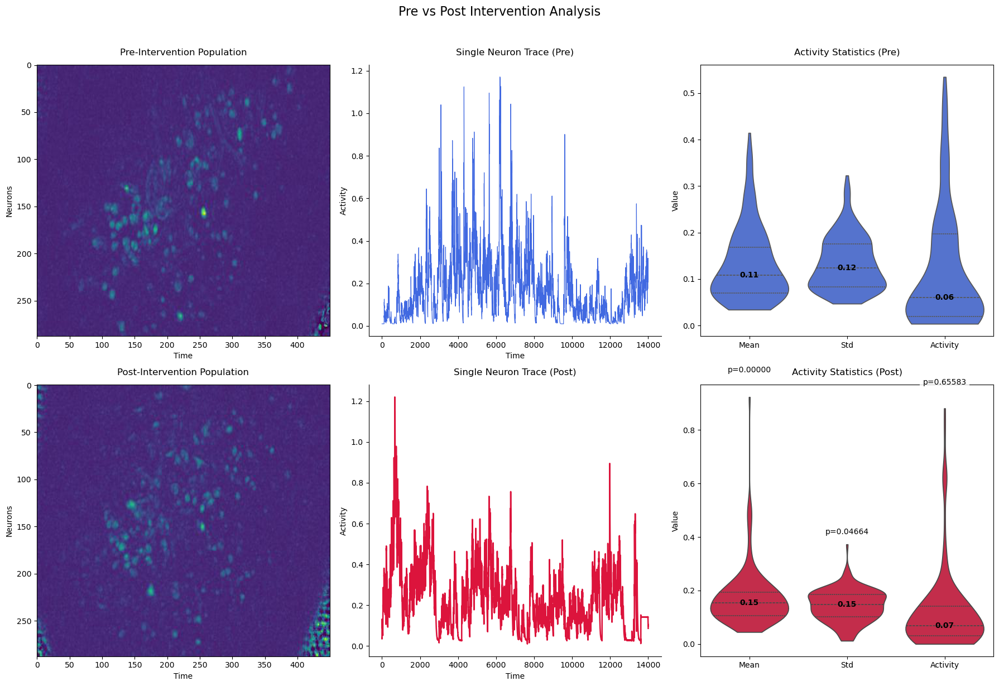

In [ ]:


# Data processing
PreValid = neuron.pre_trace[neuron.pre_idx[~np.isnan(neuron.pre_trace[neuron.pre_idx].std(axis=1))]]
PosValid = neuron.pos_trace[neuron.pos_idx[~np.isnan(neuron.pos_trace[neuron.pos_idx].std(axis=1))]]

# Calculate metrics
metrics = {
    'Pre': {
        'Mean': PreValid.mean(axis=1),
        'Std': PreValid.std(axis=1),
        'Activity': [(trace >= PreValid.std(axis=1).max()).mean() for trace in PreValid]
    },
    'Post': {
        'Mean': PosValid.mean(axis=1),
        'Std': PosValid.std(axis=1),
        'Activity': [(trace >= PosValid.std(axis=1).max()).mean() for trace in PosValid]
    }
}

# Create figure
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
plt.suptitle('Pre vs Post Intervention Analysis', y=1.02, fontsize=16)
i=2
# Row 1: Pre-intervention
# 1. Left: Population raster
axes[0, 0].imshow(PnrPre, cmap='gray', aspect='auto')
axes[0, 0].set_title('Pre-Intervention Population', pad=12)
axes[0, 0].set_xlabel('Time')
axes[0, 0].set_ylabel('Neurons')

# 2. Middle: Example trace
axes[0, 1].plot(PreValid[neuron.pre_idx[i]], lw=0.85, c='royalblue')
axes[0, 1].set_title('Single Neuron Trace (Pre)', pad=12)
axes[0, 1].set_xlabel('Time')
axes[0, 1].set_ylabel('Activity')
sns.despine(ax=axes[0, 1])

# 3. Right: Violin plots
sns.violinplot(data=pd.DataFrame(metrics['Pre']), ax=axes[0, 2], 
               palette=['royalblue'], inner='quartile', cut=0)
axes[0, 2].set_title('Activity Statistics (Pre)', pad=12)
axes[0, 2].set_ylabel('Value')
for i, metric in enumerate(['Mean', 'Std', 'Activity']):
    median_val = np.median(metrics['Pre'][metric])
    axes[0, 2].text(i, median_val, f'{median_val:.2f}', 
                   ha='center', va='center', fontweight='bold')

# Row 2: Post-intervention
# 1. Left: Population raster
axes[1, 0].imshow(PnrPos, cmap='gray', aspect='auto')
axes[1, 0].set_title('Post-Intervention Population', pad=12)
axes[1, 0].set_xlabel('Time')
axes[1, 0].set_ylabel('Neurons')

# 2. Middle: Example trace
axes[1, 1].plot(PosValid[neuron.pre_idx[i]], lw=1.85, c='crimson')
axes[1, 1].set_title('Single Neuron Trace (Post)', pad=12)
axes[1, 1].set_xlabel('Time')
axes[1, 1].set_ylabel('Activity')
sns.despine(ax=axes[1, 1])

# 3. Right: Violin plots with statistics
sns.violinplot(data=pd.DataFrame(metrics['Post']), ax=axes[1, 2], 
               palette=['crimson'], inner='quartile', cut=0)
axes[1, 2].set_title('Activity Statistics (Post)', pad=12)
axes[1, 2].set_ylabel('Value')

# Add p-values comparing pre vs post
for i, metric in enumerate(['Mean', 'Std', 'Activity']):
    # Median value
    median_val = np.median(metrics['Post'][metric])
    axes[1, 2].text(i, median_val, f'{median_val:.2f}', 
                   ha='center', va='center', fontweight='bold')
    
    # Statistical comparison
    _, pval = stats.mannwhitneyu(metrics['Pre'][metric], metrics['Post'][metric])
    y_pos = max(np.array(metrics['Pre'][metric]).max(), np.array(metrics['Post'][metric]).max()) * 1.1
    axes[1, 2].text(i, y_pos, f'p={pval:.5f}', ha='center', color='black',
                   bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

plt.tight_layout()
plt.show()

### Fig 2

In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from scipy import stats
from typing import Tuple
def analyze_cluster_transitions(
    PreValid: np.ndarray,
    PosValid: np.ndarray,
    n_clusters: int = 2,
    random_state: int = 42
) -> Tuple[pd.DataFrame, dict]:
    """
    Perform cluster transition analysis with comprehensive visualization.
    
    Parameters:
    -----------
    PreValid : np.ndarray
        Pre-intervention valid traces (neurons x time)
    PosValid : np.ndarray
        Post-intervention valid traces (neurons x time)
    n_clusters : int
        Number of clusters for K-means
    random_state : int
        Random seed for reproducibility
        
    Returns:
    --------
    Tuple[pd.DataFrame, dict]
        - Transition matrix (pd.DataFrame)
        - Dictionary containing cluster labels and silhouette scores
    """
    
    # 1. Clustering
    pre_kmeans = KMeans(n_clusters, random_state=random_state)
    pos_kmeans = KMeans(n_clusters, random_state=random_state)
    
    pre_labels = pre_kmeans.fit_predict(PreValid)
    pos_labels = pos_kmeans.fit_predict(PosValid)
    
    # 2. Transition Analysis
    transitions = list(zip(pre_labels, pos_labels))
    df_trans = pd.DataFrame(transitions, columns=['Pre', 'Post'])
    trans_matrix = pd.crosstab(df_trans['Pre'], df_trans['Post'])
    
    # 3. Visualization
    plt.figure(figsize=(18, 12))
    
    # Heatmap of transition matrix
    plt.subplot(2, 3, 1)
    sns.heatmap(trans_matrix, annot=True, cmap='Blues', fmt='d')
    plt.title('Cluster Transition Matrix')
    plt.xlabel('Post Clusters')
    plt.ylabel('Pre Clusters')
    
    # Silhouette plots
    for i, (data, labels, title) in enumerate(zip(
        [PreValid, PosValid],
        [pre_labels, pos_labels],
        ['Pre-Intervention', 'Post-Intervention']
    )):
        plt.subplot(2, 3, 2+i)
        silhouette_avg = silhouette_score(data, labels)
        sample_silhouette_values = silhouette_samples(data, labels)
        
        y_lower = 10
        for j in range(n_clusters):
            jth_values = sample_silhouette_values[labels == j]
            jth_values.sort()
            y_upper = y_lower + jth_values.shape[0]
            plt.fill_betweenx(np.arange(y_lower, y_upper), 0, jth_values)
            plt.text(-0.05, y_lower + 0.5 * jth_values.shape[0], str(j))
            y_lower = y_upper + 10
            
        plt.title(f"{title}\nSilhouette: {silhouette_avg:.2f}")
        plt.xlabel("Silhouette Coefficient")
        plt.ylabel("Cluster")
    
    # Violin plots with statistical testing
    plt.subplot(2, 3, 4)
    activity_data = pd.DataFrame({
        'Activity': np.concatenate([PreValid.mean(axis=1), PosValid.mean(axis=1)]),
        'Group': ['Pre']*len(PreValid) + ['Post']*len(PosValid),
        'Cluster': np.concatenate([pre_labels, pos_labels])
    })
    
    sns.violinplot(x='Cluster', y='Activity', hue='Group', 
                  data=activity_data, split=True, inner='quartile')
    
    # Add statistical annotations
    for cluster in range(n_clusters):
        pre_data = activity_data[(activity_data['Cluster'] == cluster) & 
                               (activity_data['Group'] == 'Pre')]['Activity']
        post_data = activity_data[(activity_data['Cluster'] == cluster) & 
                                (activity_data['Group'] == 'Post')]['Activity']
        _, p_value = stats.ttest_ind(pre_data, post_data)
        y_pos = activity_data['Activity'].max() * (0.9 - cluster*0.1)
        plt.text(cluster, y_pos, f'p={p_value:.3f}', ha='center')
    
    plt.title('Activity Distribution by Cluster')
    
    # Cluster activity heatmaps
    for i, (data, labels, title) in enumerate(zip(
        [PreValid, PosValid],
        [pre_labels, pos_labels],
        ['Pre-Intervention', 'Post-Intervention']
    ), 5):
        plt.subplot(2, 3, i)
        cluster_order = np.argsort([data[labels==k].mean() for k in range(n_clusters)])
        sorted_data = np.concatenate([data[labels==k] for k in cluster_order])
        sns.heatmap(sorted_data, cmap='viridis', cbar_kws={'label': 'Activity'})
        plt.title(f'{title} Activity Heatmap')
        plt.xlabel('Time')
        plt.ylabel('Neurons (clustered)')
    
    plt.tight_layout()
    plt.show()
    
    return trans_matrix, {
        'pre_labels': pre_labels,
        'pos_labels': pos_labels,
        'pre_silhouette': silhouette_score(PreValid, pre_labels),
        'pos_silhouette': silhouette_score(PosValid, pos_labels)
    }

# Usage example:
# trans_matrix, cluster_info = analyze_cluster_transitions(PreValid, PosValid, n_clusters=2)

u:\Anconda\envs\caiman\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
u:\Anconda\envs\caiman\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
u:\Anconda\envs\caiman\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
u:\Anconda\envs\caiman\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less ch

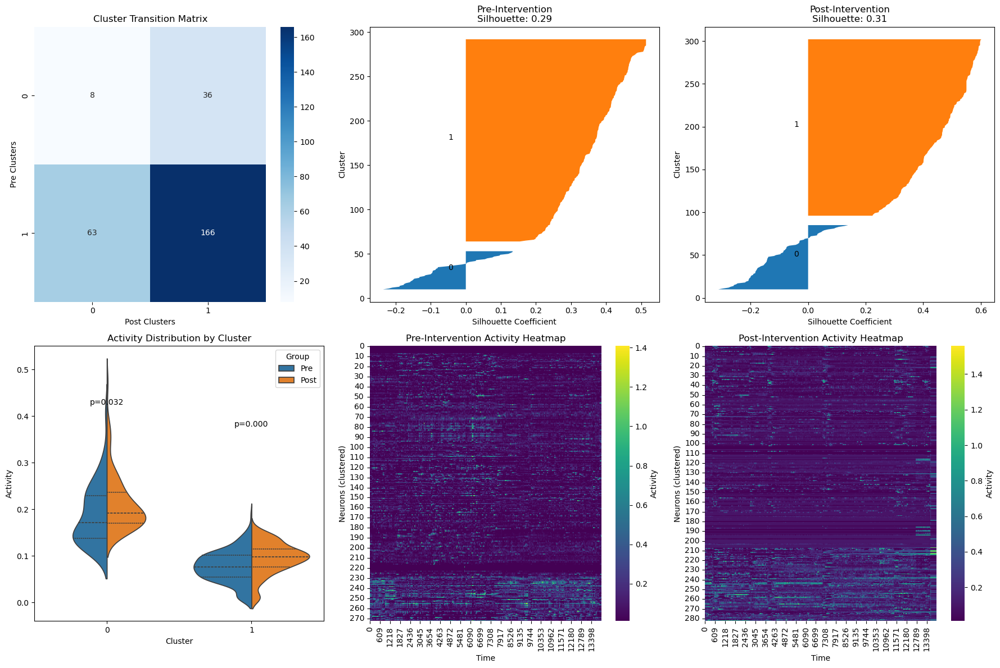

In [9]:
# After getting PreValid and PosValid from previous steps:
trans_matrix, cluster_info = analyze_cluster_transitions(
    PreValid, 
    PosValid,
    n_clusters=2,
    random_state=42
)

### Fig 3

u:\Anconda\envs\caiman\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
u:\Anconda\envs\caiman\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
u:\Anconda\envs\caiman\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
u:\Anconda\envs\caiman\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less ch

Matriz de Transição:
Depois   0   1
Antes         
0        3   9
1       18  44


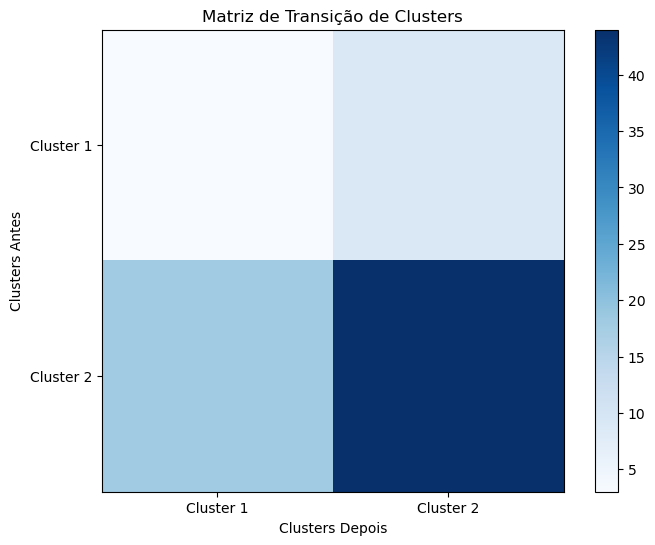

In [126]:
n_clusters = 2
preKmeans=KMeans(n_clusters, random_state=0)
#PreValid[neuron.pre_idx]
posKmeans=KMeans(n_clusters, random_state=0)#PosValid[neuron.pos_idx]

preKmeans.fit_predict(PreValid)
posKmeans.fit_predict(PosValid)

precluster_labels = preKmeans.labels_
poscluster_labels = posKmeans.labels_

transicoes = list(zip(precluster_labels, poscluster_labels))

# Crie uma matriz de transição usando pandas
df = pd.DataFrame(transicoes, columns=['Antes', 'Depois'])
matriz_transicao = pd.crosstab(df['Antes'], df['Depois'])

# Exiba a matriz de transição
print("Matriz de Transição:")
print(matriz_transicao)

# Visualização da matriz de transição
plt.figure(figsize=(8, 6))
plt.imshow(matriz_transicao, cmap='Blues', interpolation='nearest')
plt.colorbar()
plt.xticks(range(n_clusters), labels=[f'Cluster {i+1}' for i in range(n_clusters)])
plt.yticks(range(n_clusters), labels=[f'Cluster {i+1}' for i in range(n_clusters)])
plt.xlabel('Clusters Depois')
plt.ylabel('Clusters Antes')
plt.title('Matriz de Transição de Clusters')
plt.show()


## All init


67


u:\Anconda\envs\caiman\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
u:\Anconda\envs\caiman\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
u:\Anconda\envs\caiman\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
u:\Anconda\envs\caiman\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less ch

Time series 1: Cluster 3
Time series 2: Cluster 3
Time series 3: Cluster 3
Time series 4: Cluster 3
Time series 5: Cluster 3
Time series 6: Cluster 1
Time series 7: Cluster 3
Time series 8: Cluster 3
Time series 9: Cluster 3
Time series 10: Cluster 1
Time series 11: Cluster 2
Time series 12: Cluster 2
Time series 13: Cluster 3
Time series 14: Cluster 1
Time series 15: Cluster 3
Time series 16: Cluster 3
Time series 17: Cluster 3
Time series 18: Cluster 3
Time series 19: Cluster 1
Time series 20: Cluster 3
Time series 21: Cluster 3
Time series 22: Cluster 3
Time series 23: Cluster 3
Time series 24: Cluster 1
Time series 25: Cluster 3
Time series 26: Cluster 3
Time series 27: Cluster 3
Time series 28: Cluster 1
Time series 29: Cluster 3
Time series 30: Cluster 3
Time series 31: Cluster 1
Time series 32: Cluster 1
Time series 33: Cluster 3
Time series 34: Cluster 1
Time series 35: Cluster 3
Time series 36: Cluster 3
Time series 37: Cluster 1
Time series 38: Cluster 3
Time series 39: Clust

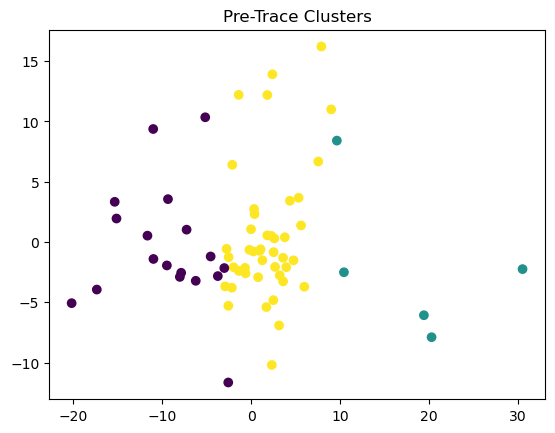

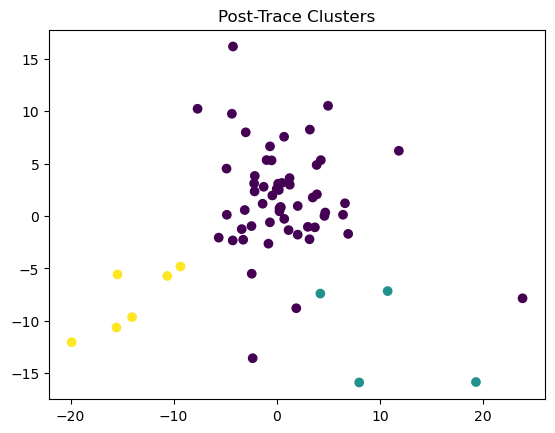

Matriz de Transição:
Depois   0  1  2
Antes           
0       14  1  3
1        5  0  0
2       38  3  3


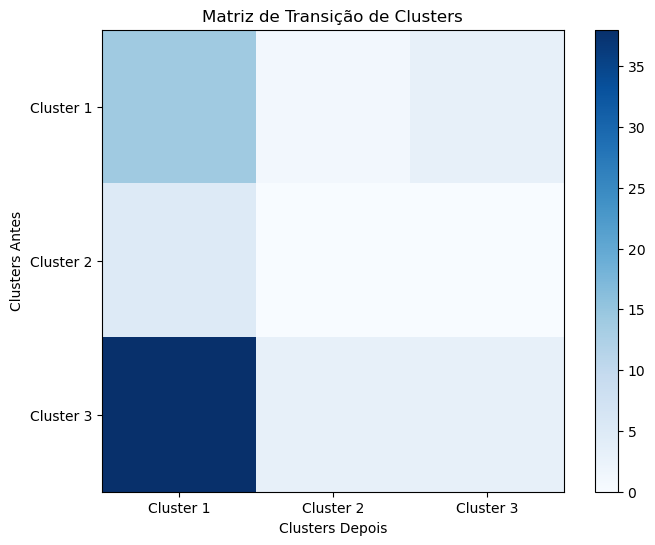

Neurônio 2: Cluster 2 → 0


In [49]:
#indices_0
#indices_1
good=[int(index) for index in cle.iloc[:,2]]
good1=[int(index) for index in cle.iloc[:,3]]

good=np.array(good)
good1=np.array(good1)
good.sort()
good1.sort()
type(good)
print(len(good))
type(good[0])
timepre=[]
timepos=[]
for i in range(len(good)):
    if Pre_Trace[good[i]].mean()<1:
        timepre.append(Pre_Trace[good[i]])
    if Pos_Trace[good1[i]].mean()<1:
        timepos.append(Pos_Trace[good1[i]])

# Generate sample time series data
pretime_series =timepre  # 100 time series with 10 data points each
postime_series =timepos



# Reshape the time series data to fit the input format of KMeans


# Define the number of clusters
n_clusters = 3

# Initialize and fit the KMeans model
prekmeans = KMeans(n_clusters=n_clusters)
prekmeans.fit_predict(pretime_series)
#
poskmeans = KMeans(n_clusters=n_clusters)
poskmeans.fit_predict(postime_series)
# Get the cluster labels for each time series
precluster_labels = prekmeans.labels_
poscluster_labels = poskmeans.labels_

# Print the cluster labels for each time series
for i, label in enumerate(precluster_labels):
    print(f"Time series {i+1}: Cluster {label+1}")
#plt.scatter(np.arange(0,len(cluster_labels)),cluster_labels)
plt.show()

# Visualize clusters
pca = PCA(n_components=2)
pre_reduced = pca.fit_transform(pretime_series)
pos_reduced = pca.fit_transform(postime_series)

plt.scatter(pre_reduced[:, 0], pre_reduced[:, 1], c=precluster_labels, cmap='viridis')
plt.title("Pre-Trace Clusters")
plt.show()

plt.scatter(pos_reduced[:, 0], pos_reduced[:, 1], c=poscluster_labels, cmap='viridis')
plt.title("Post-Trace Clusters")
plt.show()

transicoes = list(zip(precluster_labels, poscluster_labels))

# Crie uma matriz de transição usando pandas
df = pd.DataFrame(transicoes, columns=['Antes', 'Depois'])
matriz_transicao = pd.crosstab(df['Antes'], df['Depois'])

# Exiba a matriz de transição
print("Matriz de Transição:")
print(matriz_transicao)

# Visualização da matriz de transição
plt.figure(figsize=(8, 6))
plt.imshow(matriz_transicao, cmap='Blues', interpolation='nearest')
plt.colorbar()
plt.xticks(range(n_clusters), labels=[f'Cluster {i+1}' for i in range(n_clusters)])
plt.yticks(range(n_clusters), labels=[f'Cluster {i+1}' for i in range(n_clusters)])
plt.xlabel('Clusters Depois')
plt.ylabel('Clusters Antes')
plt.title('Matriz de Transição de Clusters')
plt.show()

# Exemplo: Rastrear o neurônio de índice 5
indice_neuronio = 2
cluster_antes = precluster_labels[indice_neuronio]
cluster_depois = poscluster_labels[indice_neuronio]

print(f"Neurônio {indice_neuronio}: Cluster {cluster_antes} → {cluster_depois}")

In [308]:
### Test clustering both at the same time
Bothtoget=np.vstack((timepre,timepos))
Bothseries=Bothtoget


# Define the number of clusters
n_clusters =4 

# Initialize and fit the KMeans model
Bothkmeans = KMeans(n_clusters=n_clusters)
Bothkmeans.fit_predict(Bothseries)
# Get the cluster labels for each time series
Bothseries_labels = Bothkmeans.labels_

# Print the cluster labels for each time series
#for i, label in enumerate(Bothseries_labels):
    #print(f"Time series {i+1}: Cluster {label+1}")
#plt.scatter(np.arange(0,len(cluster_labels)),cluster_labels)


u:\Anconda\envs\caiman\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

u:\Anconda\envs\caiman\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.



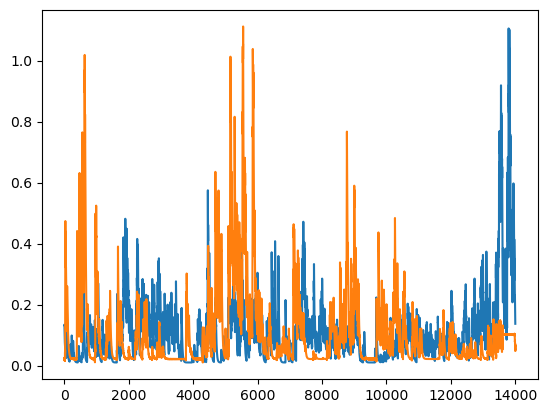

In [198]:
plt.plot(neuron.pre_trace[good[4]])
plt.plot(neuron.pos_trace[good1[4]])

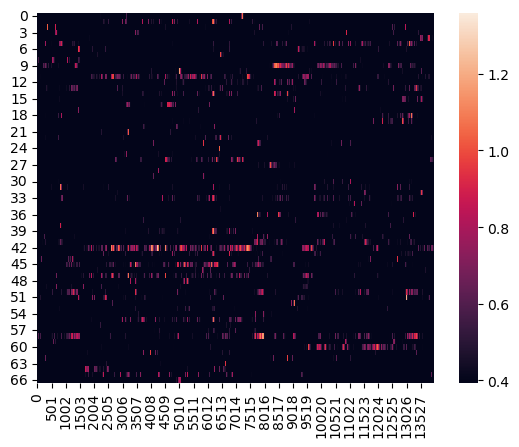

<Axes: >

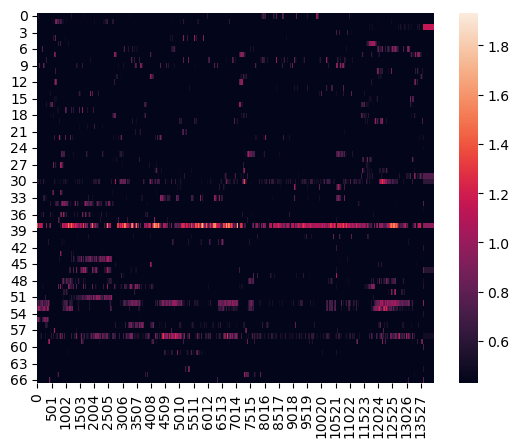

In [217]:
sns.heatmap(neuron.pre_trace[good],vmin=3*neuron.pre_trace[good].std(axis=1).mean())
plt.show()
sns.heatmap(neuron.pos_trace[good1],vmin=3*neuron.pos_trace[good1].std(axis=1).mean())#

In [218]:
pdx=np.diff(neuron.pre_trace[np.argsort(good)])
pdx1=np.diff(neuron.pos_trace[np.argsort(good)])


In [219]:
pdx.std(axis=1).mean()

0.020752380643240125

<Axes: >

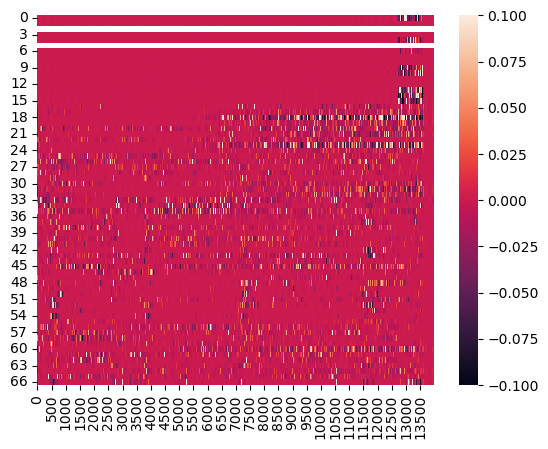

In [223]:
sns.heatmap(pdx1,vmin=pdx1.std(axis=1).min())

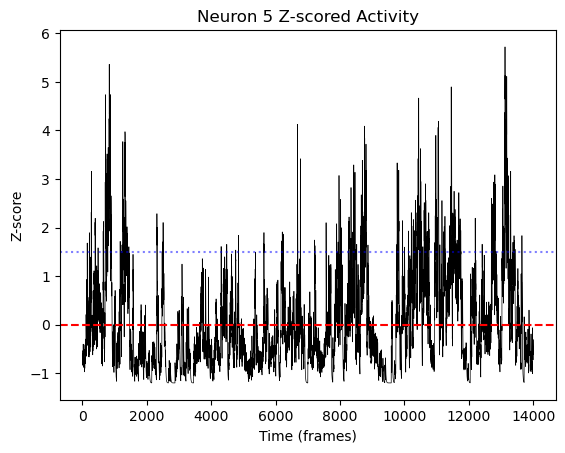

In [199]:

def zscore_traces(traces):
    """Compute Z-score for each neuron using the entire trace as baseline."""
    mean = np.mean(traces, axis=1, keepdims=True)
    std = np.std(traces, axis=1, keepdims=True)
    zscore = (traces - mean) / (std + 1e-6)  # Add epsilon to avoid division by zero
    return zscore

# Usage:
z_traces = zscore_traces(neuron.pre_trace[good])  # Input shape: (neurons × time)

# Plot Z-scored traces for a neuron
neuron_idx = 5
plt.plot(z_traces[neuron_idx], 'k', linewidth=0.5)
plt.axhline(y=0, color='r', linestyle='--')  # Mean line
plt.axhline(y=1.5, color='b', linestyle=':', alpha=0.5)  # 3σ threshold for events
plt.xlabel("Time (frames)")
plt.ylabel("Z-score")
plt.title(f"Neuron {neuron_idx} Z-scored Activity")
plt.show()

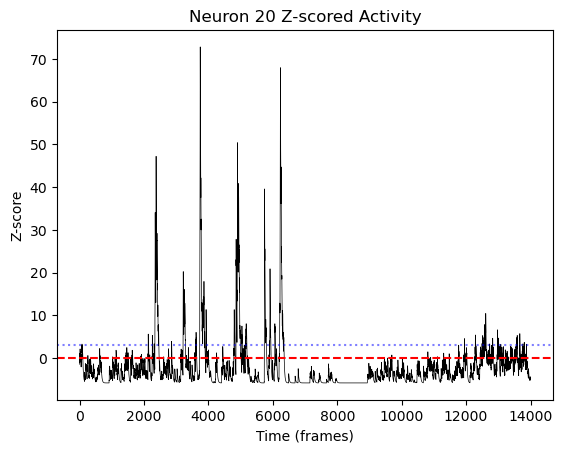

In [200]:
def zscore_baseline(traces, baseline_frames=300):
    """Compute Z-score using a defined baseline period."""
    baseline = traces[:, :baseline_frames]
    mean = np.mean(baseline, axis=1, keepdims=True)
    std = np.std(baseline, axis=1, keepdims=True)
    zscore = (traces - mean) / (std + 1e-6)
    return zscore

# Usage:
z_traces = zscore_baseline(neuron.pre_trace[good], baseline_frames=50)
# Plot Z-scored traces for a neuron
neuron_idx = 20
plt.plot(z_traces[neuron_idx], 'k', linewidth=0.5)
plt.axhline(y=0, color='r', linestyle='--')  # Mean line
plt.axhline(y=3, color='b', linestyle=':', alpha=0.5)  # 3σ threshold for events
plt.xlabel("Time (frames)")
plt.ylabel("Z-score")
plt.title(f"Neuron {neuron_idx} Z-scored Activity")
plt.show()

In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import ipywidgets as widgets
from IPython.display import display

def create_interactive_comparison(neuron, good, good1, protocol):
    def update_plot(index, normalize=True, show_stimulus=True):
        # Create subplot with secondary axis
        fig = make_subplots(
            rows=2, cols=2,
            subplot_titles=('Mean Activity Distribution', 'Standard Deviation Distribution',
                          'Activity Heatmap', 'Time Series Comparison'),
            specs=[[{}, {}], 
                  [{"colspan": 2}, None]]
        )
        
        # Plot 1: Mean Activity Distribution
        pre_mean = neuron.pre_trace[good].mean(axis=1)
        pos_mean = neuron.pos_trace[good1].mean(axis=1)
        
        fig.add_trace(
            go.Histogram(x=pre_mean, name='Pre Trauma', opacity=0.75),
            row=1, col=1
        )
        fig.add_trace(
            go.Histogram(x=pos_mean, name='Post Trauma', opacity=0.75),
            row=1, col=1
        )

        # Plot 2: Std Distribution  
        pre_std = neuron.pre_trace[good].std(axis=1)
        pos_std = neuron.pos_trace[good1].std(axis=1)
        
        fig.add_trace(
            go.Histogram(x=pre_std, name='Pre Trauma', opacity=0.75),
            row=1, col=2
        )
        fig.add_trace(
            go.Histogram(x=pos_std, name='Post Trauma', opacity=0.75), 
            row=1, col=2
        )

        # Plot 3: Activity Heatmap
        a = neuron.pre_trace[np.argsort(neuron.pre_trace[good].mean(axis=1))]
        b = neuron.pos_trace[np.argsort(neuron.pos_trace[good1].mean(axis=1))]
        
        combined = np.hstack((a,b))
        if normalize:
            combined = (combined - combined.min()) / (combined.max() - combined.min())
            
        fig.add_trace(
            go.Heatmap(z=combined, colorscale='Hot', showscale=True),
            row=2, col=1
        )

        # Add stimulus period markers if enabled
        if show_stimulus:
            for i in range(0,24,2):
                fig.add_vrect(
                    x0=i/2, x1=i/2+0.5,
                    fillcolor="gray", opacity=0.2,
                    layer="below", row=2, col=1
                )

        # Update layout
        fig.update_layout(
            height=800,
            width=1200,
            title_text=f"Neuron Activity Analysis - Index {index}",
            showlegend=True,
            barmode='overlay'
        )

        # Update axes labels
        fig.update_xaxes(title_text="Activity Level", row=1, col=1)
        fig.update_xaxes(title_text="Standard Deviation", row=1, col=2)
        fig.update_xaxes(title_text="Time", row=2, col=1)
        fig.update_xaxes(ticktext=protocol, tickvals=np.arange(0,12,0.5), row=2, col=1)
        
        fig.update_yaxes(title_text="Count", row=1, col=1)
        fig.update_yaxes(title_text="Count", row=1, col=2)
        fig.update_yaxes(title_text="Neuron #", row=2, col=1)

        return fig

    # Create widgets
    index_slider = widgets.IntSlider(
        value=0, min=0, max=len(good)-1, 
        description='Neuron Index:'
    )
    normalize_checkbox = widgets.Checkbox(
        value=True,
        description='Normalize Data'
    )
    stimulus_checkbox = widgets.Checkbox(
        value=True, 
        description='Show Stimulus Periods'
    )

    # Interactive update function
    def on_change(change):
        fig = update_plot(
            index_slider.value,
            normalize_checkbox.value,
            stimulus_checkbox.value
        )
        fig.show()

    # Link widgets
    index_slider.observe(on_change, names='value')
    normalize_checkbox.observe(on_change, names='value')
    stimulus_checkbox.observe(on_change, names='value')

    # Display initial plot
    fig = update_plot(0, True, True)
    display(widgets.VBox([index_slider, normalize_checkbox, stimulus_checkbox]))
    fig.show()

# Usage
create_interactive_comparison(neuron, good, good1, protocol)

In [213]:
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

class VectorChangeVisualizer:
    def __init__(self, pre_trace, pos_trace, indexes):
        self.pre_trace = pre_trace 
        self.pos_trace = pos_trace
        self.indexes = indexes
        
    def calculate_vector_change(self, neuron_idx):
        """Calculate vector changes between pre and post traces"""
        pre_vec = self.pre_trace[self.indexes[0][neuron_idx]]
        pos_vec = self.pos_trace[self.indexes[1][neuron_idx]]
        
        # Calculate differences
        diff = pos_vec - pre_vec
        mag_change = np.linalg.norm(diff)
        direction_change = np.arccos(np.dot(pre_vec, pos_vec)/(np.linalg.norm(pre_vec)*np.linalg.norm(pos_vec)))
        
        return diff, mag_change, direction_change

    def plot_comparison(self, neuron_idx):
        """Create interactive comparison plot"""
        diff, mag, angle = self.calculate_vector_change(neuron_idx)
        
        # Create subplots
        fig = make_subplots(
            rows=2, cols=2,
            subplot_titles=('Pre vs Post Traces', 'Vector Change',
                          'Magnitude Distribution', 'Direction Change')
        )

        # Plot 1: Pre vs Post traces
        fig.add_trace(
            go.Scatter(y=self.pre_trace[self.indexes[0][neuron_idx]], name='Pre'),
            row=1, col=1
        )
        fig.add_trace(
            go.Scatter(y=self.pos_trace[self.indexes[1][neuron_idx]], name='Post'),
            row=1, col=1
        )

        # Plot 2: Vector change
        fig.add_trace(
            go.Scatter(y=diff, name='Difference'),
            row=1, col=2
        )

        # Plot 3: Magnitude distribution
        fig.add_trace(
            go.Histogram(x=diff, name='Change Distribution'),
            row=2, col=1
        )

        # Plot 4: Direction change over time
        fig.add_trace(
            go.Scatter(y=np.cumsum(diff), name='Cumulative Change'),
            row=2, col=2
        )

        # Update layout
        fig.update_layout(
            title=f'Vector Change Analysis - Neuron {neuron_idx}',
            height=800,
            showlegend=True
        )
        
        # Add metrics as annotations
        fig.add_annotation(
            text=f'Magnitude Change: {mag:.2f}<br>Direction Change: {angle:.2f} rad',
            xref='paper', yref='paper',
            x=0, y=1,
            showarrow=False
        )

        return fig

    def plot_population_changes(self):
        """Plot changes across population"""
        mags = []
        angles = []
        
        for i in range(len(self.indexes[0]),5):
            _, mag, angle = self.calculate_vector_change(i)
            mags.append(mag)
            angles.append(angle)
            
        fig = go.Figure()
        
        # Add magnitude vs angle scatter plot
        fig.add_trace(
            go.Scatter(
                x=mags,
                y=angles,
                mode='markers',
                marker=dict(
                    size=8,
                    color=mags,
                    colorscale='Viridis',
                    showscale=True
                ),
                text=[f'Neuron {i}' for i in range(len(mags))],
                name='Vector Changes'
            )
        )
        
        fig.update_layout(
            title='Population Vector Changes',
            xaxis_title='Magnitude Change',
            yaxis_title='Direction Change (rad)',
            height=600
        )
        
        return fig

# Example usage:
visualizer = VectorChangeVisualizer(neuron.pre_trace[indices_0], neuron.pos_trace[indices_1], [indices_0, indices_1])

# Plot single neuron comparison
fig1 = visualizer.plot_comparison(int(input("Neuron index: ")))
fig1.show()

# Plot population changes
fig2 = visualizer.plot_population_changes() 
fig2.show()

In [52]:


def analyze_calcium_traces_large(trace1, trace2, sampling_rate=20, window_size=60):
    """
    Enhanced analysis for large calcium imaging datasets with windowed analysis
    
    Parameters:
    -----------
    trace1, trace2 : np.array
        Calcium activity traces
    sampling_rate : float
        Recording sampling rate in Hz (default 20Hz)
    window_size : int
        Size of analysis window in seconds
    
    Returns:
    --------
    dict
        Dictionary containing various metrics
    """
    # Smooth traces to reduce noise (adjust sigma based on your needs)
    smooth1 = gaussian_filter1d(trace1, sigma=1.0)
    smooth2 = gaussian_filter1d(trace2, sigma=1.0)
    
    # Normalize traces
    norm1 = (smooth1 - np.mean(smooth1)) / np.std(smooth1)
    norm2 = (smooth2 - np.mean(smooth2)) / np.std(smooth2)
    
    # Calculate dynamic threshold using rolling statistics
    window_points = int(sampling_rate * 30)  # 5-second window
    rolling_std1 = pd.Series(norm1).rolling(window_points, center=True).std()
    rolling_std2 = pd.Series(norm2).rolling(window_points, center=True).std()
    
    # Use median + std for thresholding
    thresh1 = np.median(norm1) + 2 * rolling_std1
    thresh2 = np.median(norm2) + 2 * rolling_std2
    
    # Event detection with adaptive parameters
    min_distance = int(0.2 * sampling_rate)  # 200ms minimum between events
    events1, properties1 = find_peaks(norm1, 
                                    height=thresh1,
                                    distance=min_distance,
                                    prominence=0.5,  # Adjust based on your data
                                    width=(int(0.1*sampling_rate), int(2*sampling_rate)))
    
    events2, properties2 = find_peaks(norm2,
                                    height=thresh2,
                                    distance=min_distance,
                                    prominence=0.5,
                                    width=(int(0.1*sampling_rate), int(2*sampling_rate)))
    
    # Windowed analysis
    window_points = int(window_size * sampling_rate)
    n_windows1 = len(trace1) // window_points
    n_windows2 = len(trace2) // window_points
    
    windowed_metrics = {
        'time_windows': [],
        'event_rates1': [],
        'event_rates2': [],
        'mean_amplitudes1': [],
        'mean_amplitudes2': [],
        'event_durations1': [],
        'event_durations2': []
    }
    
    for i in range(min(n_windows1, n_windows2)):
        start_idx = i * window_points
        end_idx = (i + 1) * window_points
        
        # Find events in this window
        window_events1 = events1[(events1 >= start_idx) & (events1 < end_idx)]
        window_events2 = events2[(events2 >= start_idx) & (events2 < end_idx)]
        
        # Calculate metrics for this window
        windowed_metrics['time_windows'].append(i * window_size)
        windowed_metrics['event_rates1'].append(len(window_events1) / window_size)
        windowed_metrics['event_rates2'].append(len(window_events2) / window_size)
        
        if len(window_events1) > 0:
            windowed_metrics['mean_amplitudes1'].append(np.mean(properties1['peak_heights'][
                (events1 >= start_idx) & (events1 < end_idx)]))
            windowed_metrics['event_durations1'].append(np.mean(properties1['widths'][
                (events1 >= start_idx) & (events1 < end_idx)]) / sampling_rate)
        else:
            windowed_metrics['mean_amplitudes1'].append(0)
            windowed_metrics['event_durations1'].append(0)
            
        if len(window_events2) > 0:
            windowed_metrics['mean_amplitudes2'].append(np.mean(properties2['peak_heights'][
                (events2 >= start_idx) & (events2 < end_idx)]))
            windowed_metrics['event_durations2'].append(np.mean(properties2['widths'][
                (events2 >= start_idx) & (events2 < end_idx)]) / sampling_rate)
        else:
            windowed_metrics['mean_amplitudes2'].append(0)
            windowed_metrics['event_durations2'].append(0)
    
    # Calculate inter-event interval statistics
    iei1 = np.diff(events1) / sampling_rate
    iei2 = np.diff(events2) / sampling_rate
    
    # Calculate burst metrics
    burst_threshold = 1.0  # 1 second between events within a burst
    bursts1 = np.split(events1, np.where(np.diff(events1) / sampling_rate > burst_threshold)[0] + 1)
    bursts2 = np.split(events2, np.where(np.diff(events2) / sampling_rate > burst_threshold)[0] + 1)
    
    burst_metrics = {
        'burst_lengths1': [len(b) for b in bursts1 if len(b) > 1],
        'burst_lengths2': [len(b) for b in bursts2 if len(b) > 1],
        'burst_durations1': [(b[-1] - b[0])/sampling_rate for b in bursts1 if len(b) > 1],
        'burst_durations2': [(b[-1] - b[0])/sampling_rate for b in bursts2 if len(b) > 1]
    }
    
    return {
        'events_trace1': events1,
        'events_trace2': events2,
        'event_properties1': properties1,
        'event_properties2': properties2,
        'total_events1': len(events1),
        'total_events2': len(events2),
        'event_rate1': len(events1) / (len(trace1) / sampling_rate),
        'event_rate2': len(events2) / (len(trace2) / sampling_rate),
        'mean_amplitude1': np.mean(properties1['peak_heights']),
        'mean_amplitude2': np.mean(properties2['peak_heights']),
        'median_iei1': np.median(iei1),
        'median_iei2': np.median(iei2),
        'iei_std1': np.std(iei1),
        'iei_std2': np.std(iei2),
        'burst_metrics': burst_metrics,
        'windowed_metrics': windowed_metrics
    }

def summarize_analysis(analysis_results, sampling_rate=20):
    """
    Provide a comprehensive summary of the analysis results
    """
    duration1 = len(analysis_results['events_trace1']) / sampling_rate / 60  # in minutes
    duration2 = len(analysis_results['events_trace2']) / sampling_rate / 60  # in minutes
    
    summary = {
        'Recording Durations': {
            'Trace 1': f"{duration1:.2f} minutes",
            'Trace 2': f"{duration2:.2f} minutes"
        },
        'Event Counts': {
            'Trace 1': analysis_results['total_events1'],
            'Trace 2': analysis_results['total_events2']
        },
        'Event Rates': {
            'Trace 1': f"{analysis_results['event_rate1']:.2f} events/sec",
            'Trace 2': f"{analysis_results['event_rate2']:.2f} events/sec"
        },
        'Inter-event Intervals': {
            'Trace 1 Median': f"{analysis_results['median_iei1']:.2f} sec",
            'Trace 2 Median': f"{analysis_results['median_iei2']:.2f} sec"
        },
        'Burst Analysis': {
            'Trace 1 Bursts': len([b for b in analysis_results['burst_metrics']['burst_lengths1'] if len(b) > 1]),
            'Trace 2 Bursts': len([b for b in analysis_results['burst_metrics']['burst_lengths2'] if len(b) > 1]),
            'Mean Burst Length 1': f"{np.mean(analysis_results['burst_metrics']['burst_lengths1']):.2f} events",
            'Mean Burst Length 2': f"{np.mean(analysis_results['burst_metrics']['burst_lengths2']):.2f} events"
        }
    }
    
    return pd.DataFrame([summary]).transpose()

In [53]:
import numpy as np
from scipy import stats, signal
import matplotlib.pyplot as plt

class CalciumContinuousAnalyzer:
    def __init__(self, window_size=700, fps=20):
        self.window_size = window_size
        self.fps = fps
        self.time_per_window = window_size / fps
        
    def segment_trace(self, trace):
        """Segment trace into windows of defined size"""
        n_windows = len(trace) // self.window_size
        windows = np.array_split(trace[:n_windows * self.window_size], n_windows)
        return windows
    
    def calculate_power_spectrum(self, window):
        """Calculate power spectrum of the window"""
        freqs, psd = signal.welch(window, fs=self.fps, nperseg=min(256, len(window)))
        return freqs, psd
    
    def calculate_activity_metrics(self, window):
        """Calculate metrics suitable for continuous calcium activity"""
        # Remove linear trend to focus on fluctuations
        detrended = signal.detrend(window)
        
        # Calculate frequency domain characteristics
        freqs, psd = self.calculate_power_spectrum(detrended)
        
        # Calculate various activity metrics
        metrics = {
            # Signal energy and variation
            'signal_energy': np.sum(np.square(detrended)),
            'coefficient_of_variation': np.std(window) / np.mean(window),
            
            # Frequency domain characteristics
            'dominant_frequency': freqs[np.argmax(psd)],
            'spectral_entropy': -np.sum(psd * np.log2(psd + 1e-10)) / np.log2(len(psd)),
            
            # Time domain characteristics
            'skewness': stats.skew(window),
            'kurtosis': stats.kurtosis(window),
            
            # Activity levels
            'time_above_mean': np.mean(window > np.mean(window)),
            'mean_activity': np.mean(window),
            'median_activity': np.median(window)
        }
        
        return metrics
    
    def compare_windows(self, window1, window2):
        """Compare two windows of calcium activity"""
        # Calculate metrics for each window
        metrics1 = self.calculate_activity_metrics(window1)
        metrics2 = self.calculate_activity_metrics(window2)
        
        # Calculate comparisons
        comparisons = {
            # Basic similarity measures
            'correlation': stats.pearsonr(window1, window2)[0],
            'mutual_info': self.estimate_mutual_information(window1, window2),
            
            # Compare activity metrics
            'energy_ratio': metrics2['signal_energy'] / metrics1['signal_energy'],
            'cv_ratio': metrics2['coefficient_of_variation'] / metrics1['coefficient_of_variation'],
            'activity_ratio': metrics2['mean_activity'] / metrics1['mean_activity'],
            
            # Compare frequency characteristics
            'freq_shift': metrics2['dominant_frequency'] - metrics1['dominant_frequency'],
            'spectral_entropy_ratio': metrics2['spectral_entropy'] / metrics1['spectral_entropy']
        }
        
        return comparisons
    
    def estimate_mutual_information(self, window1, window2, bins=20):
        """Estimate mutual information between two windows"""
        hist_2d, _, _ = np.histogram2d(window1, window2, bins=bins)
        hist_2d_normalized = hist_2d / np.sum(hist_2d)
        
        # Calculate marginal distributions
        p_x = np.sum(hist_2d_normalized, axis=1)
        p_y = np.sum(hist_2d_normalized, axis=0)
        
        # Calculate mutual information
        mutual_info = 0
        for i in range(bins):
            for j in range(bins):
                if hist_2d_normalized[i,j] > 0:
                    mutual_info += hist_2d_normalized[i,j] * np.log2(
                        hist_2d_normalized[i,j] / (p_x[i] * p_y[j] + 1e-10)
                    )
        return mutual_info
    
    def plot_comparison(self, window1, window2, title="Window Comparison"):
        """Create comprehensive comparison plot"""
        time = np.arange(len(window1)) / self.fps
        
        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 10))
        
        # Time domain plot
        ax1.plot(time, window1, label='Trace 1', alpha=0.7)
        ax1.plot(time, window2, label='Trace 2', alpha=0.7)
        ax1.set_xlabel('Time (s)')
        ax1.set_ylabel('Calcium Signal')
        ax1.set_title('Time Domain Comparison')
        ax1.legend()
        ax1.grid(True)
        
        # Power spectrum plot
        freqs1, psd1 = self.calculate_power_spectrum(window1)
        freqs2, psd2 = self.calculate_power_spectrum(window2)
        ax2.semilogy(freqs1, psd1, label='Trace 1')
        ax2.semilogy(freqs2, psd2, label='Trace 2')
        ax2.set_xlabel('Frequency (Hz)')
        ax2.set_ylabel('Power Spectral Density')
        ax2.set_title('Frequency Domain Comparison')
        ax2.legend()
        ax2.grid(True)
        
        # Scatter plot
        ax3.scatter(window1, window2, alpha=0.5)
        ax3.set_xlabel('Trace 1')
        ax3.set_ylabel('Trace 2')
        ax3.set_title('Signal Correlation')
        ax3.grid(True)
        
        # Cumulative distribution comparison
        ax4.hist(window1, bins=50, density=True, cumulative=True, 
                histtype='step', label='Trace 1')
        ax4.hist(window2, bins=50, density=True, cumulative=True,
                histtype='step', label='Trace 2')
        ax4.set_xlabel('Signal Value')
        ax4.set_ylabel('Cumulative Probability')
        ax4.set_title('Distribution Comparison')
        ax4.legend()
        ax4.grid(True)
        
        plt.tight_layout()
        plt.show()
        
        # Print comparison statistics
        comparisons = self.compare_windows(window1, window2)
        for key, value in comparisons.items():
            print(f"{key}: {value:.4f}")

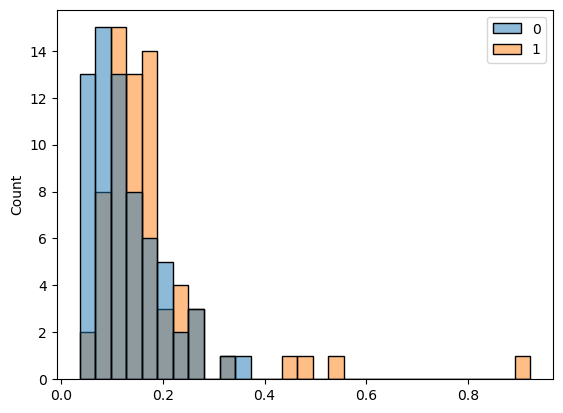

<Axes: ylabel='Count'>

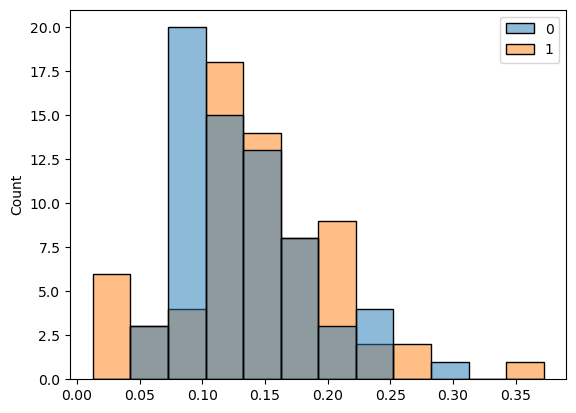

In [94]:
#comparing the traces mean values and ploting as a heatmap
pre_mean = neuron.pre_trace[good].mean(axis=1).reshape(-1, 1)
pos_mean = neuron.pos_trace[good1].mean(axis=1).reshape(-1, 1)
combined_mean = np.hstack((pre_mean, pos_mean))
sns.histplot(combined_mean)
#sns.heatmap(combined_mean)
plt.show()
pre_std = neuron.pre_trace[good].std(axis=1).reshape(-1, 1)
pos_std = neuron.pos_trace[good1].std(axis=1).reshape(-1, 1)
combined_std = np.hstack((pre_std, pos_std))
sns.histplot(combined_std)

In [ ]:
i=28
fig=go.Figure()
fig.add_trace(go.Scatter(x=np.linspace(0,12,len(neuron.pre_trace[good[i]][963::])),y=neuron.pre_trace[good[np.argsort(neuron.pre_trace[good].mean(axis=1))][i]][963::]))
fig.add_trace(go.Scatter(x=np.linspace(0,12,len(neuron.pos_trace[good1[i]][164::])),y=neuron.pos_trace[good1[np.argsort(neuron.pos_trace[good1].mean(axis=1))][i]][164::]))


<Axes: >

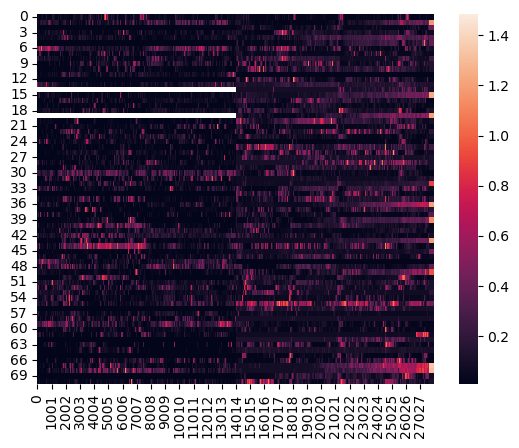

In [36]:

a=neuron.pre_trace[np.argsort(neuron.pre_trace[good].mean(axis=1))]
b=neuron.pos_trace[np.argsort(neuron.pos_trace[good].mean(axis=1))]

sns.heatmap(np.hstack((a,b)))


In [ ]:
import numpy as np
import pandas as pd
from scipy import stats, signal
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

class MultiNeuronAnalyzer:
    def __init__(self, n_neurons=len(pdx), n_windows=12, window_size=700, fps=20):
        self.n_neurons = n_neurons
        self.n_windows = n_windows
        self.window_size = window_size
        self.fps = fps
        
    def extract_windows(self, trace):
        """Extract stimulus and silence windows from a trace"""
        stim_windows = []
        silence_windows = []
        
        for i in range(self.n_windows):
            start_idx = i * (self.window_size * 2)
            # Stimulus windows
            stim_window = trace[start_idx:start_idx + self.window_size]
            # Silence windows
            silence_window = trace[start_idx + self.window_size:start_idx + 2*self.window_size]
            
            if len(stim_window) == self.window_size and len(silence_window) == self.window_size:
                stim_windows.append(stim_window)
                silence_windows.append(silence_window)
                
        return np.array(stim_windows), np.array(silence_windows)
    
    def calculate_response_metrics(self, stim_windows, silence_windows):
        """Calculate response metrics for one neuron"""
        metrics = {
            'mean_stim': np.mean(stim_windows),
            'mean_silence': np.mean(silence_windows),
            'std_stim': np.std(stim_windows),
            'std_silence': np.std(silence_windows),
            'response_ratio': np.mean(stim_windows) / (np.mean(silence_windows) + 1e-10),
            'cv_stim': np.std(stim_windows) / (np.mean(stim_windows) + 1e-10),
            'cv_silence': np.std(silence_windows) / (np.mean(silence_windows) + 1e-10),
            'response_consistency': stats.pearsonr(
                np.mean(stim_windows, axis=1),
                np.mean(silence_windows, axis=1)
            )[0]
        }
        
        # Calculate response reliability across windows
        window_correlations = []
        for i in range(len(stim_windows)):
            for j in range(i+1, len(stim_windows)):
                corr = stats.pearsonr(stim_windows[i], stim_windows[j])[0]
                window_correlations.append(corr)
        
        metrics['response_reliability'] = np.mean(window_correlations)
        return metrics
    
    def analyze_population(self, all_traces):
        """Analyze entire population of neurons"""
        all_metrics = []
        stim_responses = []
        silence_responses = []
        
        for i, trace in enumerate(all_traces):
            stim_windows, silence_windows = self.extract_windows(trace)
            metrics = self.calculate_response_metrics(stim_windows, silence_windows)
            all_metrics.append(metrics)
            
            # Store mean responses for each window
            stim_responses.append(np.std(stim_windows, axis=1))
            silence_responses.append(np.std(silence_windows, axis=1))
            
        return pd.DataFrame(all_metrics), np.array(stim_responses), np.array(silence_responses)
    
    def plot_population_analysis(self, all_traces, title="Population Analysis"):
        """Create comprehensive visualization of population response"""
        metrics_df, stim_responses, silence_responses = self.analyze_population(all_traces)
        
        # Create figure
        fig = plt.figure(figsize=(20, 15))
        gs = fig.add_gridspec(3, 3)
        
        # 1. Response ratio distribution
        ax1 = fig.add_subplot(gs[0, 0])
        sns.histplot(metrics_df['response_ratio'], ax=ax1)
        ax1.set_title('Distribution of Response Ratios')
        ax1.set_xlabel('Stimulus/Silence Ratio')
        ax1.axvline(x=1, color='r', linestyle='--')
        
        # 2. Response reliability vs ratio
        ax2 = fig.add_subplot(gs[0, 1])
        ax2.scatter(metrics_df['response_ratio'], 
                   metrics_df['response_reliability'],
                   alpha=0.5)
        ax2.set_xlabel('Response Ratio')
        ax2.set_ylabel('Response Reliability')
        ax2.set_title('Response Characteristics')
        
        # 3. PCA of response patterns
        scaler = StandardScaler()
        pca = PCA(n_components=2)
        combined_responses = np.hstack([stim_responses, silence_responses])
        responses_scaled = scaler.fit_transform(combined_responses)
        pca_result = pca.fit_transform(responses_scaled)
        
        # Perform clustering
        kmeans = KMeans(n_clusters=3, random_state=42)
        clusters = kmeans.fit_predict(responses_scaled)
        
        ax3 = fig.add_subplot(gs[0, 2])
        scatter = ax3.scatter(pca_result[:, 0], pca_result[:, 1], 
                            c=clusters, cmap='viridis', alpha=0.6)
        ax3.set_title('PCA of Response Patterns')
        ax3.set_xlabel('PC1')
        ax3.set_ylabel('PC2')
        plt.colorbar(scatter, ax=ax3, label='Cluster')
        
        # 4. Response heatmap
        ax4 = fig.add_subplot(gs[1, :])
        sns.heatmap(stim_responses, cmap='viridis', 
                   xticklabels=range(1, self.n_windows+1),
                   yticklabels=range(1, self.n_neurons+1))
        ax4.set_title('Stimulus Response Patterns Across Population')
        ax4.set_xlabel('Stimulus Window')
        ax4.set_ylabel('Neuron')
        
        # 5. Population average response
        ''' 
        ax5 = fig.add_subplot(gs[2, :])
        mean_stim = np.mean(stim_responses, axis=0)
        std_stim = np.std(stim_responses, axis=0)
        mean_silence = np.mean(silence_responses, axis=0)
        std_silence = np.std(silence_responses, axis=0)
        
        x = np.arange(self.n_windows)
        #ax5.plot(x[:11], mean_stim, 'b-', label='Stimulus')
        #ax5.fill_between(x, mean_stim-std_stim, mean_stim+std_stim, alpha=0.3)
        #ax5.plot(x, mean_silence, 'r-', label='Silence')
        #ax5.fill_between(x, mean_silence-std_silence, mean_silence+std_silence, alpha=0.3)
        ax5.set_title('Population Average Response')
        ax5.set_xlabel('Window Number')
        ax5.set_ylabel('Mean Response')
        ax5.legend()'''
        
        plt.tight_layout()
        plt.show()
        
        # Print summary statistics
        print("\nPopulation Summary:")
        print("Response Patterns:")
        for cluster in range(3):
            n_neurons = np.sum(clusters == cluster)
            mean_ratio = np.mean(metrics_df['response_ratio'][clusters == cluster])
            print(f"Cluster {cluster}: {n_neurons} neurons, mean response ratio: {mean_ratio:.2f}")
        
        # Identify strongly responding neurons
        strong_responders = metrics_df[metrics_df['response_ratio'] > 1.5]
        print(f"\nStrong responders: {len(strong_responders)} neurons")
        print(f"Mean response reliability: {metrics_df['response_reliability'].mean():.3f}")
        
        return metrics_df, clusters

    def get_neuron_clusters(self, all_traces):
        """Return neuron clusters based on response patterns"""
        _, stim_responses, silence_responses = self.analyze_population(all_traces)
        combined_responses = np.hstack([stim_responses, silence_responses])
        
        # Scale and cluster
        scaler = StandardScaler()
        responses_scaled = scaler.fit_transform(combined_responses)
        kmeans = KMeans(n_clusters=3, random_state=42)
        clusters = kmeans.fit_predict(responses_scaled)
        
        return clusters

In [ ]:
%matplotlib Qt

def create_comparison_heatmap(neuron, good, good1, protocol):
    # Create sorted traces
    a = neuron.pre_trace[np.argsort(neuron.pre_trace[good].std(axis=1))]
    b = neuron.pos_trace[np.argsort(neuron.pos_trace[good1].std(axis=1))]
    
    # Create interactive heatmap with Plotly
    fig = go.Figure()
    
    # Add pre and post trauma heatmaps side by side
    fig.add_trace(go.Heatmap(
        z=np.hstack((a,b)),
        colorscale='Hot',
        colorbar=dict(title='Activity'),
        hoverongaps=False,
        name='Traces'
    ))

    # Add vertical lines for stimulus periods 
    for i in range(0,24,2):
        fig.add_vline(x=i/2, line=dict(color="gray", width=1))
        fig.add_vline(x=i/2+0.5, line=dict(color="gray", width=1))
        fig.add_vrect(x0=i/2, x1=i/2+0.5,
                     fillcolor="gray", opacity=0.2,
                     layer="below")

    # Update layout
    fig.update_layout(
        title='Neural Activity Heatmap Pre vs Post',
        xaxis_title='Time (min)',
        yaxis_title='Neuron #',
        xaxis=dict(
            ticktext=protocol,
            tickvals=np.arange(0,12,0.5)
        ),
        width=1200,
        height=800
    )

    # Add slider for color scale
    fig.update_layout(
        sliders=[{
            'active': 0,
            'currentvalue': {"prefix": "Color Scale: "},
            'pad': {"t": 50},
            'steps': [
                {'label': 'Hot', 
                 'method': 'restyle',
                 'args': [{'colorscale': 'Hot'}]},
                {'label': 'Viridis',
                 'method': 'restyle', 
                 'args': [{'colorscale': 'Viridis'}]}
            ]
        }]
    )

    return fig

# Create comparison histograms
def plot_activity_distributions(neuron, good, good1):
    pre_mean = neuron.pre_trace[good].mean(axis=1)
    pos_mean = neuron.pos_trace[good1].mean(axis=1)
    
    fig = go.Figure()
    
    # Add histograms
    fig.add_trace(go.Histogram(
        x=pre_mean,
        name='Pre-trauma',
        opacity=0.75
    ))
    
    fig.add_trace(go.Histogram(
        x=pos_mean,
        name='Post-trauma', 
        opacity=0.75
    ))

    fig.update_layout(
        title='Distribution of Mean Activity',
        xaxis_title='Activity Level',
        yaxis_title='Count',
        barmode='overlay'
    )
    
    return fig

# Create interactive figures
heatmap = create_comparison_heatmap(neuron, good, good1, protocol)
dist_plot = plot_activity_distributions(neuron, good, good1)

# Display plots
heatmap.show()
dist_plot.show()

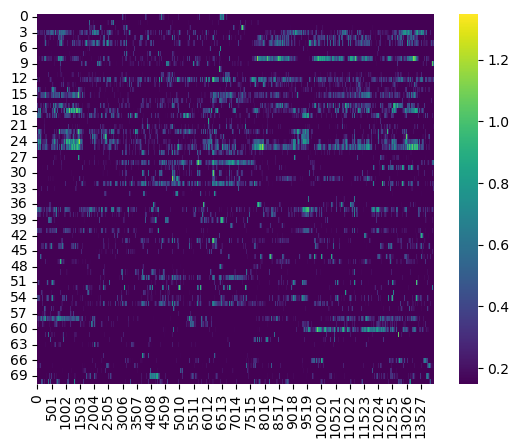

<Axes: >

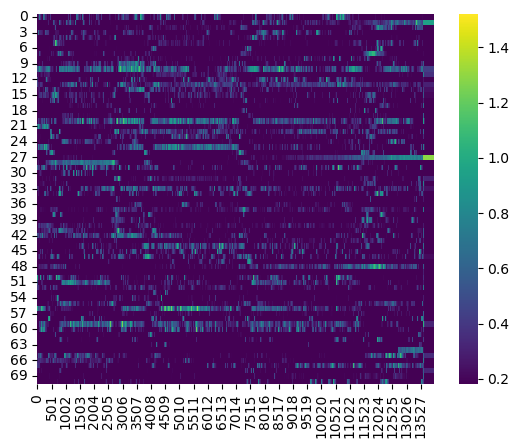

In [89]:
sns.heatmap(neuron.pre_trace[good],vmin=neuron.pre_trace[good].std(), cmap='viridis')
plt.show()
sns.heatmap(neuron.pos_trace[good1],vmin=neuron.pos_trace[good1].std(), cmap='viridis')

In [90]:
dx,dy=np.gradient(neuron.pre_trace[good])
dx1,dy1=np.gradient(neuron.pos_trace[good1])
corc=np.corrcoef(neuron.pre_trace[good],neuron.pos_trace[good1])

<Axes: >

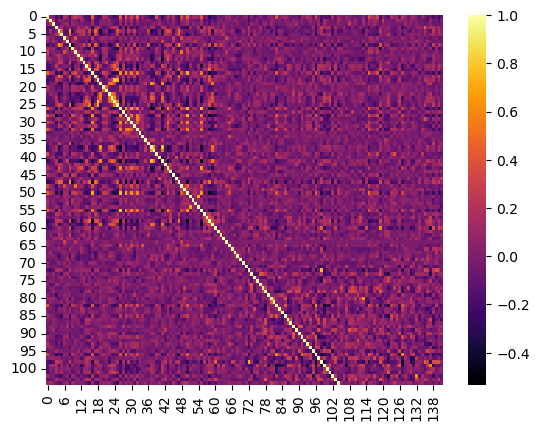

In [91]:
sns.heatmap(corc[:int(len(neuron.pre_trace)/4)],cmap='inferno')

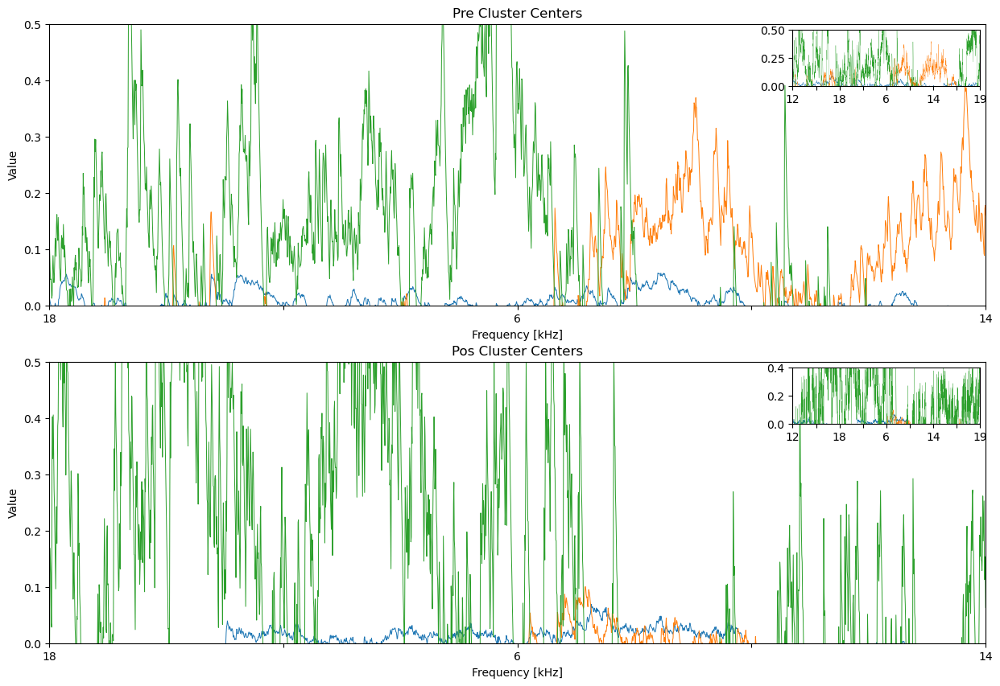

In [107]:

fig, ax = plt.subplots(2,1,figsize=(15, 10))

# Plot pre-cluster centers
for i, center in enumerate(prekmeans.cluster_centers_):
    ax[0].plot(np.linspace(0,24,len(center[963::])), center[963::],label=f'Pre Cluster {i+1}', linestyle='-', lw=0.7)#

# Plot pos-cluster centers Plot pos-cluster centers
for i, center in enumerate(poskmeans.cluster_centers_):
    ax[1].plot(np.linspace(0,24,len(center[164::])), center[164::],label=f'Pos Cluster {i+1}', linestyle='-', lw=0.7)

# Ensure the directory exists
output_dir = 'C:/Users/gabri/Desktop/Prog/LAbp/NeuroProg/Pesquisa/fig/NewFig'
os.makedirs(output_dir, exist_ok=True)
x1, x2, y1, y2 = 10, 14, 0, .5 # specify the limits for the inset

ax[0].set_title('Pre Cluster Centers')
ax[0].set_xlabel('Frequency [kHz]')
ax[0].set_ylabel('Value')
ax[0].legend()
ax[0].set_xticks(np.arange(0, 24, 1))
ax[0].set_xticklabels(protocol)
ax[0].set_xlim(x1, x2) # apply the x-limits
ax[0].set_ylim(y1, y2) # apply the y-limits
ax[1].set_title('Pos Cluster Centers')
ax[1].set_xlabel('Frequency [kHz]')
ax[1].set_ylabel('Value')
ax[1].legend() 
ax[1].set_xticks(np.arange(0, 24, 1))
ax[1].set_xticklabels(protocol)
ax[1].set_xlim(x1, x2) # apply the x-limits
ax[1].set_ylim(y1, y2) # apply the y-limits

# Create inset of the first subplot

# Define the inset axes
axins0 = inset_axes(ax[0], width="20%", height="20%", loc='upper right')
axins1 = inset_axes(ax[1], width="20%", height="20%", loc='upper right')
axins0.set_xticks(np.arange(0, 24, 1))
axins0.set_xticklabels(protocol)
axins1.set_xticks(np.arange(0, 24, 1))
axins1.set_xticklabels(protocol)
axins0.set_xlim(x1-2, x2+2) # apply the x-limits
axins0.set_ylim(y1, y2) # apply the y-limits
axins1.set_xlim(x1-2, x2+2) # apply the x-limits
axins1.set_ylim(y1, y2-0.1) # apply the y-limits

# Plot the same data on the inset axes
for i, center in enumerate(prekmeans.cluster_centers_):
    axins0.plot(np.linspace(0,24,len(center[963::])),center[963::], linestyle='-',lw=0.2)    

for i, center in enumerate(poskmeans.cluster_centers_):
    axins1.plot(np.linspace(0,24,len(center[164::])), center[164::], linestyle='-',lw=0.2)

#plt.savefig(f"{output_dir}/ClusterzoomedCenters.svg",format='svg')



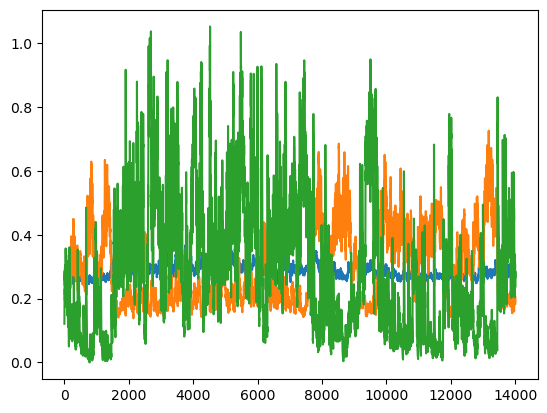

In [108]:
plt.plot(prekmeans.cluster_centers_.T-prekmeans.cluster_centers_.T.min())

In [ ]:
#np.corrcoef(prekmeans.cluster_centers_)
px.line(prekmeans.cluster_centers_.T)


In [97]:

# Define clusters for pre and post trauma
Cluster0n = good[np.where(precluster_labels == 0)]  # Neurons in the cluster 0
Cluster1n = good[np.where(precluster_labels == 1)]  # Neurons in the cluster 1
Cluster2n = good[np.where(precluster_labels == 2)]  # Neurons in the cluster 2
Cluster0b = good1[np.where(poscluster_labels == 0)]
Cluster1b = good1[np.where(poscluster_labels == 1)]
Cluster2b = good1[np.where(poscluster_labels == 2)]

# Initialize lists for matches and changes
ClusterMatch0, ClusterMatch1, ClusterMatch2 = [], [], []
ChangedCluster0, ChangedCluster1, ChangedCluster2 = [], [], []

# Iterate through matches to classify them
for i in matches:
    if i[0] in Cluster0n and i[1] in Cluster0b:
        ClusterMatch0.append(i)
    elif i[0] in Cluster1n and i[1] in Cluster1b:
        ClusterMatch1.append(i)
    elif i[0] in Cluster2n and i[1] in Cluster2b:
        ClusterMatch2.append(i)
    elif i[0] in Cluster0n and (i[1] in Cluster1b or i[1] in Cluster2b):
        ChangedCluster0.append(i)
    elif i[0] in Cluster1n and (i[1] in Cluster0b or i[1] in Cluster2b):
        ChangedCluster1.append(i)
    elif i[0] in Cluster2n and (i[1] in Cluster0b or i[1] in Cluster1b):
        ChangedCluster2.append(i)

# Print the results
print(f'Cluster 0: {len(ClusterMatch0)} matches, {len(ChangedCluster0)} changed')
print(f'Cluster 1: {len(ClusterMatch1)} matches, {len(ChangedCluster1)} changed')
print(f'Cluster 2: {len(ClusterMatch2)} matches, {len(ChangedCluster2)} changed\n')

print(f'Cluster 0 has {len(ClusterMatch0)} matches\nCluster 1 has {len(ClusterMatch1)} matches\nCluster 2 has {len(ClusterMatch2)} matches\n')
print(f'Cluster 0 has {len(Cluster0n)} neurons\nCluster 1 has {len(Cluster1n)} neurons\nCluster 2 has {len(Cluster2n)} neurons')

Cluster 0: 3 matches, 54 changed
Cluster 1: 3 matches, 8 changed
Cluster 2: 10 matches, 3 changed

Cluster 0 has 3 matches
Cluster 1 has 3 matches
Cluster 2 has 10 matches

Cluster 0 has 49 neurons
Cluster 1 has 10 neurons
Cluster 2 has 12 neurons


In [ ]:
good.sort()
good
same_cluster_0 = np.intersect1d(Cluster0n, Cluster0b)
same_cluster_1 = np.intersect1d(Cluster1n, Cluster1b)
same_cluster_2 = np.intersect1d(Cluster2n, Cluster2b)

changed_cluster_0 = np.setdiff1d(Cluster0n, Cluster0b)
changed_cluster_1 = np.setdiff1d(Cluster1n, Cluster1b)
changed_cluster_2 = np.setdiff1d(Cluster2n, Cluster2b)
# Plotting
cl1 = fig.add_subplot(gs[0, 0])
cl2 = fig.add_subplot(gs[0, 1])
cl3 = fig.add_subplot(gs[0, 2])
cl4 = fig.add_subplot(gs[1, 0])
cl5 = fig.add_subplot(gs[1, 1])
cl6 = fig.add_subplot(gs[1, 2])


In [ ]:
Precluster=[Cluster0n,Cluster1n,Cluster2n]
Poscluster=[Cluster0b,Cluster1b,Cluster2b]
intersec=[]
for i in Precluster:
    for j in Poscluster:
        intersec.append(np.intersect1d(i, j))

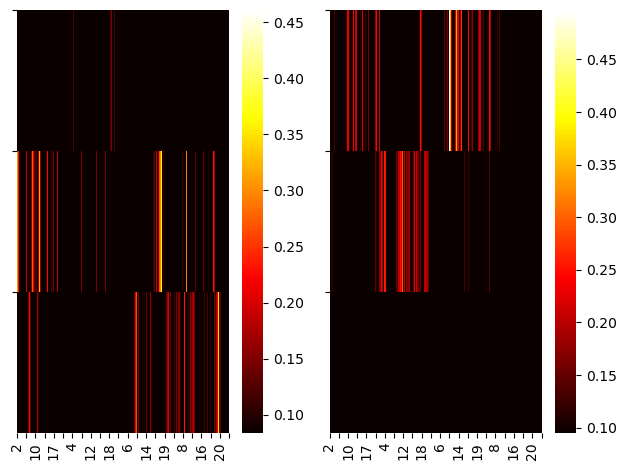

In [99]:
fig=plt.figure()
hgs=gridspec.GridSpec(1,2)
ht12=fig.add_subplot(hgs[0,0])
htpos=fig.add_subplot(hgs[0,1])

sns.heatmap(prekmeans.cluster_centers_,vmin=prekmeans.cluster_centers_.std(),cmap='hot',ax=ht12)
sns.heatmap(poskmeans.cluster_centers_,vmin=(poskmeans.cluster_centers_).std(),cmap='hot',ax=htpos)
cl1.set_title('Cluster 1')
cl2.set_title('Cluster 2')
cl3.set_title('Cluster 3')
#ht12.set_title('Pre Trauma Heatmap')
#ht12.set_xlabel('Frequency [kHz]')
#ht12.set_ylabel('Clusters')
ht12.set_yticks(np.arange(0,3,1))
#ht12.set_yticklabels(['Cluster 1','Cluster 2','Cluster 3'])
ht12.set_xticks(np.linspace(0,14000,int(14000/583)))
ht12.set_xticklabels(protocol)
#htpos.set_title('Pos Trauma Heatmap')
#htpos.set_xlabel('Frequency [kHz]')
#htpos.set_ylabel('Clusters')
htpos.set_yticks(np.arange(0,3,1))
#htpos.set_yticklabels(['Cluster 1','Cluster 2','Cluster 3'])
htpos.set_xticks(np.linspace(0,14000,int(14000/583)))
htpos.set_xticklabels(protocol)

plt.tight_layout()
#plt.savefig(f'F:/IC/caimandata/clusterwse.png',format='png')
plt.show()

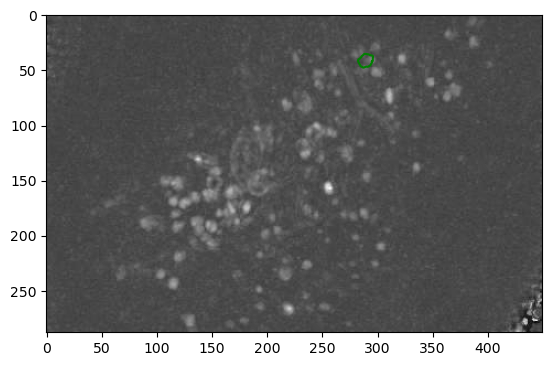

In [99]:
plt.plot(Pre_CellsCoordinates[13].T[0],Pre_CellsCoordinates[13].T[1],c='g')
plt.imshow(GrayPrnPre,cmap='gray')

In [ ]:
#np.save('F:/IC/caimandata/PrePosMatch.npy',matches)
#np.save('F:/IC/caimandata/PreIndx.npy',Pre_idx)
#np.save('F:/IC/caimandata/PosIndx.npy',Pos_idx)
#np.save('F:/IC/caimandata/PreTrace.npy',Pre_Trace)
#np.save('F:/IC/caimandata/PosTrace.npy',Pos_Trace)
#np.save('F:/IC/caimandata/PreCoM.npy',Pre_CenterOfMass)
#np.save('F:/IC/caimandata/PosCoM.npy',Pos_CenterOfMass)
#np.save('F:/IC/caimandata/PreCoord.npy',Pre_CellsCoordinates)
#np.save('F:/IC/caimandata/PosCoord.npy',Pos_CellsCoordinates)

In [70]:
def SelectNeuron(index,N_interation):
    Neurons=[]
    if N_interation>1:
        for i in range(N_interation):
            index=int(input('Enter the index of the neuron you want to select: '))
            Neurons.append(matches[index])
    else:
        Neurons.append(matches[index])
    return Neurons

Pre85 Pos39
X diff: 0.6066134246730144  Y diff: 64.39236912142437


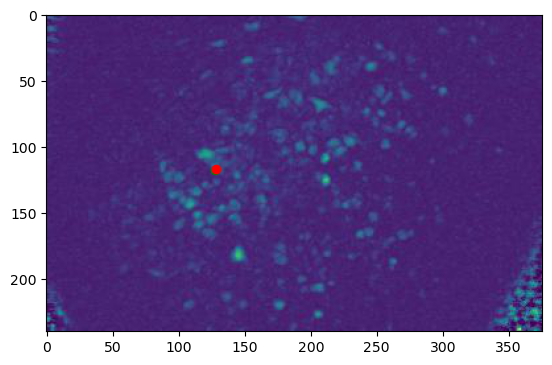

In [71]:
for i  in np.where(indices_0==85)[0]:
    if Pre_Trace[indices_0[i]].max()/2.5<=Pos_Trace[indices_1[i]].max():
        plt.scatter(Pre_CenterOfMass[indices_0[i]][1],Pre_CenterOfMass[indices_0[i]][0],c='g')
        plt.scatter(Pos_CenterOfMass[indices_1[i]][1],Pos_CenterOfMass[indices_1[i]][0],c='r')
        print(f'Pre{indices_0[i]} Pos{indices_1[i]}')
        print(f'X diff: {Pre_CenterOfMass[indices_0[i]][0]-Pos_CenterOfMass[indices_1[i]][0]}  Y diff: {Pre_CenterOfMass[indices_1[i]][1]-Pos_CenterOfMass[indices_1[i]][1]}')
plt.imshow(PnrPos)

In [100]:
print(f'{len(np.where(cle[0]<=cle[1])[0])} neurons with a higher activity in the Pos trauma group\n{len(np.where(cle[0]>cle[1])[0])} neurons with less activity in the Pos trauma group\nthis shows an increase of activity in {round(len(np.where(cle[0]<=cle[1])[0])/len(cle[0])*100,2)}% of the neurons') 

27 neurons with a higher activity in the Pos trauma group
40 neurons with less activity in the Pos trauma group
this shows an increase of activity in 40.3% of the neurons


In [ ]:
a = np.array([i for i in Astd_df_clean2.index])
possublist_indices=np.array([])
presublist_indices=np.array([])
a = a.astype(int)
for l, i in enumerate(a):
    if len(PreClusters12) > 0 and len(PreClustersNames12) > 0:
        presublist_indices = 
        #possublist_indices =np.append(possublist_indices,[index1 for index1, sublist1 in enumerate(PosClusters12) if matches[i][1] in sublist1])
        if len(presublist_indices) > 0:
            print(f'{[presublist_indices]} ')
#print(PreClustersNames12)

In [ ]:
precl=np.array([])
poscl=np.array([])
for i in a:
    presublist_indices=[index for index, sublist in enumerate(PreClusters12) if matches[i][0] in sublist]
    possublist_indices=[index1 for index1, sublist1 in enumerate(PosClusters12) if matches[i][1] in sublist1]
    if len(presublist_indices)>0:
        #print(f'{PreClustersNames12[presublist_indices[0]]} {matches[i]}')
        precl=np.append(precl,PreClustersNames12[presublist_indices[0]])
    if len(possublist_indices)>0:
        #print(f'{PosClustersNames12[possublist_indices[0]]} {matches[i]} ')
        poscl=np.append(poscl,PosClustersNames12[possublist_indices[0]])



In [ ]:

possublist_indices = [index for index, sublist in enumerate(PosClusters12) if matches[i][1] in sublist]

int(round(1 + 3.22*np.log(len(PreX_pca))))

KS Statistic Pre: 0.521134046142465
KS Statistic Post: 0.5
P-Value Pre: 1.8574433297232678e-17
P-Value Post: 5.160845271905798e-16
Two-Sample KS Statistic: 0.2835820895522388
Two-Sample P-Value: 0.00884540717245642
The two samples Pre and Pos are significantly different.


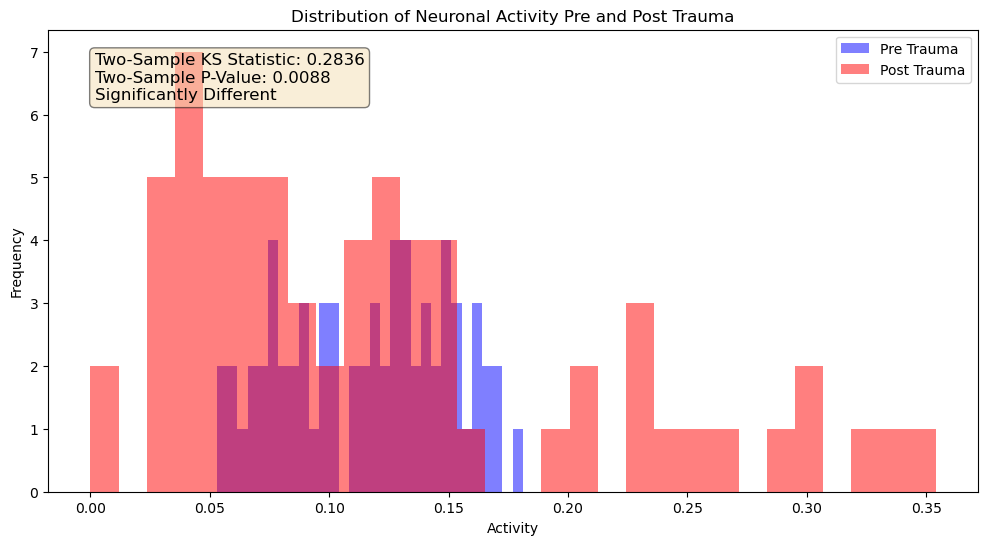

In [89]:
from scipy.stats import kstest, ks_2samp

# Perform the Kolmogorov-Smirnov test for normality
ks_statistic, p_value = kstest(cle[0], 'norm')
ks_statistic1, p_value1 = kstest(cle[1], 'norm')

print(f"KS Statistic Pre: {ks_statistic}\nKS Statistic Post: {ks_statistic1}")
print(f"P-Value Pre: {p_value}\nP-Value Post: {p_value1}")

# Perform the two-sample Kolmogorov-Smirnov test
ks_statistic_2samp, p_value_2samp = ks_2samp(cle[0], cle[1])

print(f"Two-Sample KS Statistic: {ks_statistic_2samp}")
print(f"Two-Sample P-Value: {p_value_2samp}")

# Interpretation
if p_value_2samp < 0.05:
    print("The two samples Pre and Pos are significantly different.")
else:
    print("The two samples Pre and Pos are not significantly different.")

# Plot the distributions of the two samples
plt.figure(figsize=(12, 6))
plt.hist(cle[0], bins=30, alpha=0.5, label='Pre Trauma', color='blue')
plt.hist(cle[1], bins=30, alpha=0.5, label='Post Trauma', color='red')
plt.xlabel('Activity')
plt.ylabel('Frequency')
plt.title('Distribution of Neuronal Activity Pre and Post Trauma')
plt.legend(loc='upper right')

# Add text box with KS test results
textstr = '\n'.join((
    f'Two-Sample KS Statistic: {ks_statistic_2samp:.4f}',
    f'Two-Sample P-Value: {p_value_2samp:.4f}',
    'Significantly Different' if p_value_2samp < 0.05 else 'Not Significantly Different'
))

# Place a text box in upper left in axes coords
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.gca().text(0.05, 0.95, textstr, transform=plt.gca().transAxes, fontsize=12,
               verticalalignment='top', bbox=props)

plt.show()

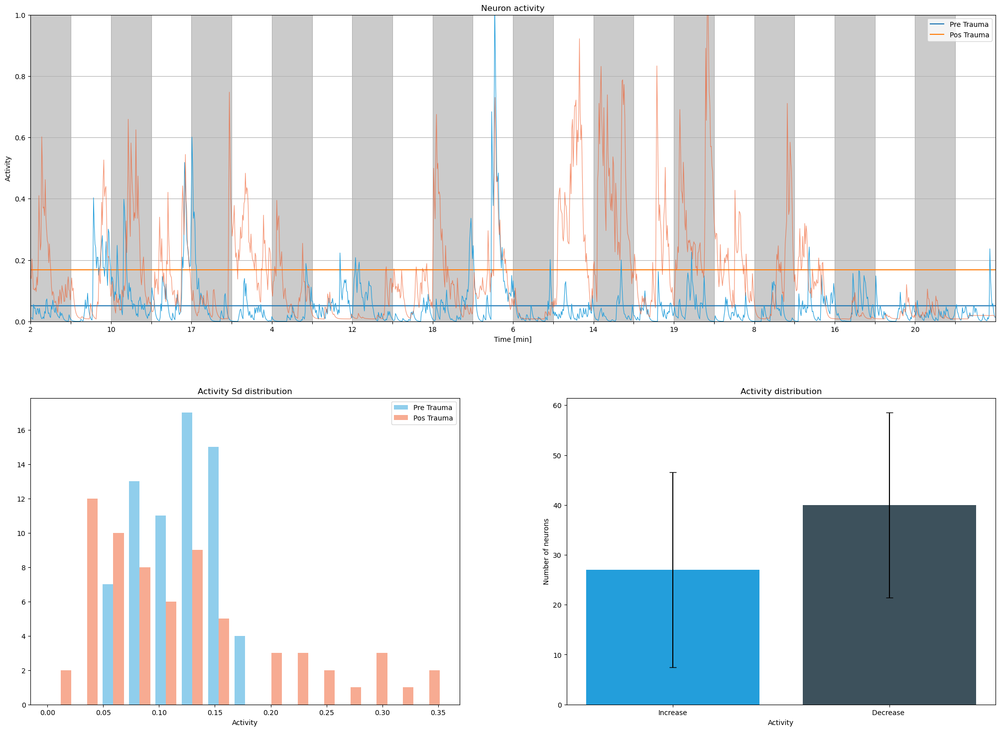

In [88]:
fig=plt.figure(figsize=(25,18))
gs1 = gridspec.GridSpec(2, 2)
ax1 = fig.add_subplot(gs1[1, 0])
ax2 = fig.add_subplot(gs1[1, 1])
ax3 = fig.add_subplot(gs1[0, :])
    
ax1.hist([(cle[0]),(cle[1])],bins=int(round(1 + 3.22*np.log(len(cle)))),alpha=0.5,label=['Pre Trauma','Pos Trauma'],color=['#239EDB','#F05926'])
ax1.set_title('Activity Sd distribution')
ax1.legend(['Pre Trauma','Pos Trauma'])
ax1.set_xlabel('Activity')#percentage of the time the neuron is above the std



#ax4.hist([np.unique(Amean_df_clean[0]),np.unique(Amean_df_clean[1])],bins=int(round(1 + 3.22*np.log(len(Amean_df_clean)))),alpha=0.5,label=['Pre Trauma','Pos Trauma'],color=['#58A31A','#F05926'])
#ax4.set_title('Activity mean distribution')
#ax4.legend(['Pre Trauma','Pos Trauma'])
#ax4.set_xlabel('Activity')#percentage of the time the neuron is above the std
ax2.set_ylabel('Number of neurons')
# Data for the bars
x = ['Increase', 'Decrease ']
y = [len(np.where(cle[0]<cle[1])[0]), len(np.where(cle[0]>cle[1])[0])]
error=[np.std(np.where(cle[0]<cle[1])[0]),np.std(np.where(cle[0]>cle[1])[0])]

# Plotting the bar plot
ax2.bar(x, y, yerr=error, capsize=5, color=['#239EDB','#3D515C'])
ax2.set_title('Activity distribution')
ax2.set_xlabel('Activity')
ax2.set_ylabel('Number of neurons')


index=0
ax3.plot(Pre_x[::10],(traces(0,indices_0[index],1)-traces(0,indices_0[index],1).min()).mean()*np.ones(len(traces(0,indices_0[index],1))))
ax3.plot(Pos_x[::10],(traces(1,indices_1[index],1)-traces(1,indices_1[index],1).min()).std()*np.ones(len(traces(1,indices_1[index],1))))
ax3.plot(Pre_x[::10],traces(0,indices_0[index],1)-traces(0,indices_0[index],0).min(),c='#239EDB',alpha=1,lw=0.85)
ax3.plot(Pos_x[::10],traces(1,indices_1[index],1)-traces(1,indices_1[index],0).min(),c='#F05926',alpha=0.65,lw=0.85)

for i in range(0, 24, 1):
    if i % 2 == 0:
        ax3.axvspan(i*.5, i*.5+.5, facecolor='#9999', alpha=0.5)
ax3.set_xlim(0,12)
ax3.legend(['Pre Trauma','Pos Trauma'])
ax3.set_xticks(Ttick)
ax3.set_xticklabels(protocol)
ax3.set_ylim(0,1)
ax3.set_title('Neuron activity')
ax3.set_xlabel('Time [min]')
ax3.set_ylabel('Activity')
ax3.grid()
plt.subplots_adjust(wspace=0.25,hspace=0.25)
#plt.savefig(f'f:/IC/caimandata/ActivityDistribution.svg',format='svg')

plt.show()


<Axes: >

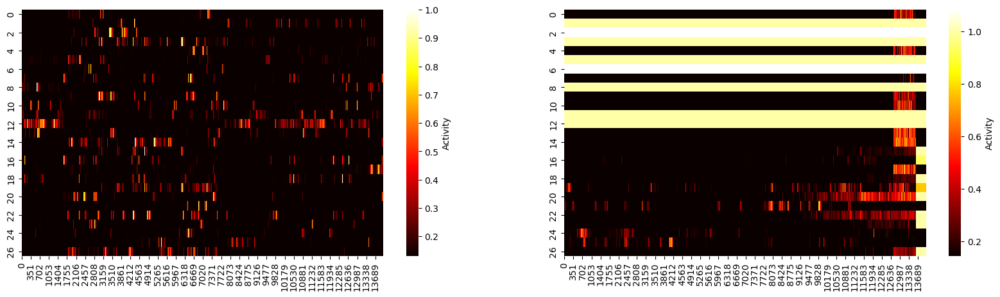

In [109]:
fig, ax = plt.subplots(1,2,figsize=(20,5))
sns.heatmap(Pre_Trace[np.argsort(indices_0[np.where(cle[0]<cle[1])[0]])], cmap='hot',vmin=np.abs(Pre_Trace[indices_0[np.where(cle[0]<cle[1])[0]]].std()), cbar_kws={'label': 'Activity'},ax=ax[0])
sns.heatmap(Pos_Trace[np.argsort(indices_1[np.where(cle[0]<cle[1])[0]]),:], cmap='hot',vmin=np.abs(Pos_Trace[indices_1[np.where(cle[0]<cle[1])[0]]].std()), cbar_kws={'label': 'Activity'},ax=ax[1])


<Axes: >

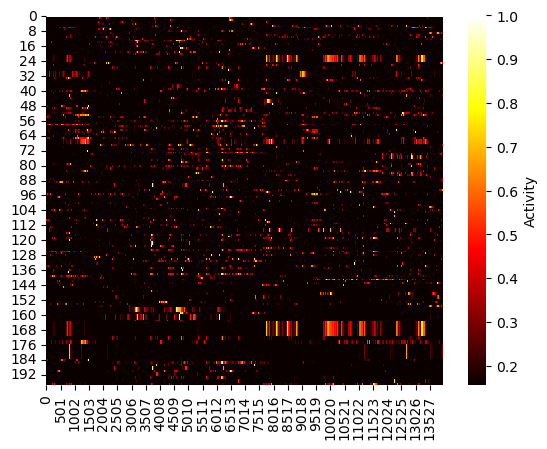

In [39]:
sns.heatmap(Pre_Trace[indices_0[np.where(Astd_df_clean[0])]], cmap='hot',vmin=np.abs(Pre_Trace[indices_0[np.where(Astd_df_clean[0])]].std()), cbar_kws={'label': 'Activity'})

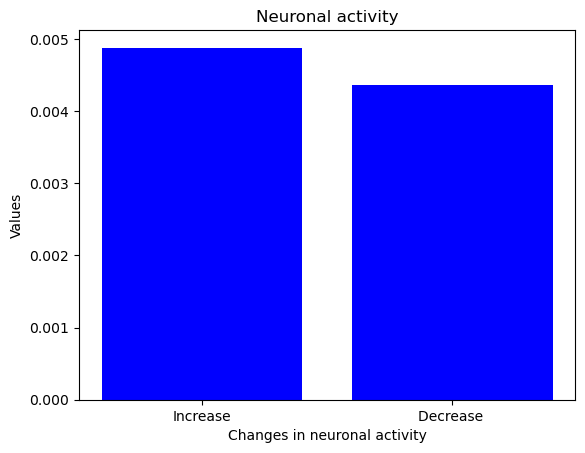

In [40]:
x1 = ['Increase', 'Decrease ']
y1 = [(Pre_Trace[indices_0]/Pre_Trace[indices_0].max()).mean(),(Pos_Trace[indices_1]/Pos_Trace[indices_1].max()).mean()]
#error1=[np.std(Pre_Trace[indices_0]/Pre_Trace[indices_0].max()),np.std(Pos_Trace[indices_1]/Pos_Trace[indices_1].max())]

# Plotting the bar plot
plt.bar(x1, y1, capsize=5, color='blue')

# Adding labels and title
plt.xlabel('Changes in neuronal activity')
plt.ylabel('Values')
plt.title('Neuronal activity')

# Displaying the plot
plt.show()

In [79]:

%matplotlib inline
o=1
Ma=2
if len(Pre_C12[o])!=0:
    fig = plt.figure(figsize=(20,15))
    gs = gridspec.GridSpec(3, 1)
    ax1 = fig.add_subplot(gs[1, 0])
    ax2 = fig.add_subplot(gs[2, 0])
    ax3 = fig.add_subplot(gs[0, 0])
else:
    print('No Neurons in this cluster')
for l,i in enumerate(Pre_Trace[Pre_C12[o]]):
    trace=i[963::]+(Ma*l/1.0)
    ax1.plot(Pre_x[963::],trace,c=f'g')
    ax1.plot(Pre_x[963::],(i.mean()*np.ones(len(trace))+Ma*l/1),c='r',lw=0.5)
    ax1.set_xticks(Ttick)
    ax1.set_xticklabels(protocol)
    ax1.set_title(f'Cluster {o}')
    for k in range(len(globals()[f'idx{Pre_C12[o][l]}_coord'][:,0])):
        xa = globals()[f'idx{Pre_C12[o][l]}_coord'][k,0]
        ya = globals()[f'idx{Pre_C12[o][l]}_coord'][k,1]
        ax3.scatter(x=xa, y=ya,s = 0.8, c='g')
    #ax3.annotate(f'{f[0]} {f[1]}', (xa, ya),(xa+5, ya+5),color='white')
    for d, f in enumerate(matches):
        if f[0]==Pre_C12[o][l]:
            ant=d-1
            
            if matches[d+1][0]==f[0]:
                trace1=Pos_Trace[f[1]][140::]+Pos_Trace[matches[d+1][1]][140::]+(Ma*l/1.0)
                ax2.plot(Pos_x[140::],trace1,c='r')
                ax2.plot(Pos_x[140::],(Pos_Trace[f[1]].mean()*np.ones(len(trace1))+Ma*l/1),c='b',lw=0.5)
                ax2.set_xticks(Ttick)
                ax2.set_xticklabels(protocol)
            elif matches[ant][0]==f[0]:
                continue
            else:
                trace1=Pos_Trace[f[1]][140::]+(Ma*l/1.0)
                ax2.plot(Pos_x[140::],trace1,c='r')
                ax2.plot(Pos_x[140::],(Pos_Trace[f[1]].mean()*np.ones(len(trace1))+Ma*l/1),c='b',lw=0.5)
                ax2.set_xticks(Ttick)
                ax2.set_xticklabels(protocol)
                    
            
            for k in range(len(globals()[f'idx{f[1]}_coord1'][:,0])):
                xa = globals()[f'idx{f[1]}_coord1'][k,0]
                ya = globals()[f'idx{f[1]}_coord1'][k,1]
                ax3.scatter(x=xa, y=ya,s = 0.8, c='r')
            ax3.annotate(f'{f[0]} {f[1]}', (xa, ya),(xa+5, ya+5),color='white')
    
for i in range(0, 24, 1):
    if i % 2 == 0:
        ax1.axvspan(i*.5, i*.5+.5, facecolor='#9999', alpha=0.5)
        ax2.axvspan(i*.5, i*.5+.5, facecolor='#9999', alpha=0.5)
        


ax3.imshow(PnrPre)

plt.tight_layout()
plt.subplots_adjust(hspace=0.2)
#plt.savefig(f"F:/IC/caimandata/ClustesteTraceroverlap.svg",format='svg')
plt.show()

NameError: name 'Pre_C12' is not defined

In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import h5py
import os
from pathlib import Path
from dataclasses import dataclass
from typing import Tuple, List, Dict, Optional
from scipy.signal import resample, find_peaks
from scipy import stats
from scipy.ndimage import gaussian_filter1d
from scipy.spatial import KDTree
from skimage.measure import moments_hu
from tqdm import tqdm
import logging

# Configuração de logging
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

@dataclass
class DataPaths:
    """Armazena todos os caminhos de dados necessários"""
    PRE_HDF5: str = r'C:/Users/gabri/Desktop/Prog/LAbp/NeuroProg/Pesquisa/analysis_results_pre.hdf5'
    POS_HDF5: str = r'C:/Users/gabri/Desktop/Prog/LAbp/NeuroProg/Pesquisa/analysis_results_pos.hdf5'
    POSITIONS: str = r'C:/Users/gabri/Desktop/Prog/LAbp/NeuroProg/Pesquisa/Positions.npy'
    PNR_PRE: str = r'U:/Pesquisa/Camp/Comparative/prePnrResult.jpg'
    PNR_POS: str = r'U:/Pesquisa/Camp/Comparative/posPnrResult.jpg'
    OUTPUT_DIR: str = r'C:/Users/gabri/Desktop/Prog/LAbp/NeuroProg/Pesquisa/results'

class CalciumImagingAnalyzer:
    def __init__(self, paths: DataPaths = DataPaths()):
        """Inicializa o analisador com os caminhos dos dados"""
        self.paths = paths
        self._validate_paths()
        self._create_output_dir()
        
        # Variáveis de dados
        self.fpre = None
        self.fpos = None
        self.positions = None
        self.pnr_pre = None
        self.pnr_pos = None
        self.pre_trace = None
        self.pos_trace = None
        self.matches = None
        self.metrics = None
        
        # Carregar dados
        self.load_data()
        
    def _validate_paths(self):
        """Verifica se todos os arquivos existem"""
        logger.info("Validando caminhos dos arquivos...")
        required_paths = [
            self.paths.PRE_HDF5,
            self.paths.POS_HDF5,
            self.paths.POSITIONS,
            self.paths.PNR_PRE,
            self.paths.PNR_POS
        ]
        
        for path in required_paths:
            if not Path(path).exists():
                raise FileNotFoundError(f"Arquivo não encontrado: {path}")
        logger.info("Todos os arquivos validados com sucesso.")
    
    def _create_output_dir(self):
        """Cria diretório de saída se não existir"""
        os.makedirs(self.paths.OUTPUT_DIR, exist_ok=True)
        logger.info(f"Diretório de saída: {self.paths.OUTPUT_DIR}")
    
    def load_data(self):
        """Carrega todos os dados necessários dos arquivos"""
        logger.info("Carregando dados...")
        
        try:
            # Carregar arquivos HDF5
            self.fpre = h5py.File(self.paths.PRE_HDF5, 'r')
            self.fpos = h5py.File(self.paths.POS_HDF5, 'r')
            
            # Carregar posições
            self.positions = np.load(self.paths.POSITIONS, allow_pickle=True)
            
            # Carregar imagens PNR
            self.pnr_pre = plt.imread(self.paths.PNR_PRE)
            self.pnr_pos = plt.imread(self.paths.PNR_POS)
            
            # Converter para escala de cinza se necessário
            if len(self.pnr_pre.shape) == 3:
                self.pnr_pre = cv2.cvtColor(self.pnr_pre, cv2.COLOR_BGR2GRAY)
                self.pnr_pos = cv2.cvtColor(self.pnr_pos, cv2.COLOR_BGR2GRAY)
            
            logger.info("Dados carregados com sucesso.")
        except Exception as e:
            logger.error(f"Erro ao carregar dados: {e}")
            raise
    
    def preprocess_traces(self, baseline_window: int = 30, response_window: int = 5):
        """
        Pré-processa os traços de cálcio com:
        - Filtragem gaussiana
        - Baseline adaptativo
        - Normalização
        """
        logger.info("Pré-processando traços de cálcio...")
        
        try:
            # Extrair traços brutos
            pre_trace = np.array(self.fpre['estimates']['C'])
            pos_trace = np.array(self.fpos['estimates']['C'])
            
            # Aplicar processamento aprimorado
            self.pre_trace = self._enhanced_zscore(pre_trace, baseline_window, response_window)
            self.pos_trace = self._enhanced_zscore(pos_trace, baseline_window, response_window)
            
            # Redimensionar traço pós para igualar o pré
            self.pos_trace = resample(self.pos_trace, self.pre_trace.shape[1], axis=1)
            
            logger.info("Traços pré-processados com sucesso.")
        except Exception as e:
            logger.error(f"Erro no pré-processamento: {e}")
            raise
    
    def _enhanced_zscore(self, traces: np.ndarray, 
                        baseline_window: int, 
                        response_window: int) -> np.ndarray:
        """
        Calcula Z-score aprimorado com:
        - Suavização gaussiana
        - Baseline adaptativo
        - Normalização
        """
        # Suavização
        smoothed = gaussian_filter1d(traces, sigma=1, axis=1)
        
        # Baseline adaptativo (percentil 20 em janela deslizante)
        baseline = np.zeros_like(smoothed)
        for i in range(smoothed.shape[1]):
            start = max(0, i - baseline_window)
            baseline[:, i] = np.percentile(smoothed[:, start:i+1], 20, axis=1)
        
        # ΔF/F calculation
        dff = (smoothed - baseline) / (baseline + 1e-6)
        
        # Normalização por neurônio
        return dff / np.max(np.abs(dff), axis=1, keepdims=True)
    
    def _get_spatial_info(self, position, dimensions) -> Tuple[np.ndarray, list]:
        """Extrai informações espaciais dos neurônios"""
        from caiman.utils import visualization
        
        contours = visualization.get_contours(position, dimensions)
        center_of_mass = np.array([c['CoM'] for c in contours])
        cells_coordinates = [c['coordinates'] for c in contours]
        
        return center_of_mass, cells_coordinates
    
    def _is_valid_contour(self, contour) -> bool:
        """Verifica se um contorno é válido para análise"""
        if not isinstance(contour, np.ndarray):
            return False
        
        if contour.ndim not in [1, 2] or (contour.ndim == 2 and contour.shape[1] != 2):
            return False
            
        if len(contour) < 5:  # Mínimo de pontos para momentos
            return False
            
        if np.any(np.isnan(contour)):
            return False
            
        return True
    
    def _ensure_contour_shape(self, contour) -> np.ndarray:
        print(contour)
        """Garante que o contorno tenha formato (N,2)"""
        contour = np.asarray(contour)
        
        if contour.ndim == 3:
            return contour.squeeze()
        if contour.ndim == 1:
            return np.column_stack((contour, contour))
        if contour.ndim == 2 and contour.shape[1] != 2:
            return contour.T if contour.shape[0] == 2 else contour
            
        return contour
    
    def _shape_similarity(self, contour1, contour2) -> float:
        """
        Calcula similaridade de forma usando momentos de Hu
        Retorna 0 para contornos inválidos
        """
        try:
            # Verificação e formatação dos contornos
            if not self._is_valid_contour(contour1) or not self._is_valid_contour(contour2):
                return 0.0
                
            contour1 = self._ensure_contour_shape(contour1)
            contour2 = self._ensure_contour_shape(contour2)
            
            # Cálculo dos momentos
            moments1 = moments_hu(contour1)
            moments2 = moments_hu(contour2)
            
            # Evita divisão por zero
            sum_moments = np.sum(moments1)
            if sum_moments == 0:
                return 0.0
                
            return 1 - np.sum(np.abs(moments1 - moments2)) / sum_moments
        except Exception as e:
            logger.warning(f"Erro no cálculo de similaridade: {e}")
            return 0.0
    
    def match_neurons(self, max_distance: float = 5.0, shape_threshold: float = 0.8) -> List[Tuple[int, int]]:
        """
        Encontra neurônios correspondentes entre pré e pós-trauma usando:
        - Posição (KDTree)
        - Similaridade de forma (momentos de Hu)
        - Filtragem por qualidade
        """
        logger.info("Iniciando matching de neurônios...")
        
        try:
            # Extrair informações espaciais
            pre_com, pre_contours = self._get_spatial_info(self.positions[0][0], self.pnr_pre.shape)
            pos_com, pos_contours = self._get_spatial_info(self.positions[1][0], self.pnr_pos.shape)
            
            # Filtrar neurônios com contornos válidos
            valid_pre = [i for i, c in enumerate(pre_contours) if self._is_valid_contour(c)]
            valid_pos = [i for i, c in enumerate(pos_contours) if self._is_valid_contour(c)]
            
            if not valid_pre or not valid_pos:
                raise ValueError("Nenhum contorno válido encontrado para matching")
            
            # KDTree para busca espacial eficiente
            tree = KDTree(pre_com[valid_pre])
            dists, idxs = tree.query(pos_com[valid_pos], distance_upper_bound=max_distance)
            
            # Filtro por similaridade de forma
            matches = []
            for pos_idx, (dist, pre_idx) in enumerate(zip(dists, idxs)):
                if not np.isinf(dist):
                    actual_pre = valid_pre[pre_idx]
                    actual_pos = valid_pos[pos_idx]
                    
                    similarity = self._shape_similarity(
                        pre_contours[actual_pre], 
                        pos_contours[actual_pos]
                    )
                    
                    if similarity > shape_threshold:
                        matches.append((actual_pre, actual_pos))
            
            self.matches = matches
            logger.info(f"Encontrados {len(matches)} pares de neurônios válidos.")
            
            # Visualização dos matches
            self._plot_matches(pre_com, pos_com, matches)
            
            return matches
        except Exception as e:
            logger.error(f"Erro no matching de neurônios: {e}")
            self.matches = []
            return []
    
    def _plot_matches(self, pre_com, pos_com, matches, max_plots=50):
        """Visualiza os neurônios correspondentes"""
        try:
            plt.figure(figsize=(12, 12))
            plt.imshow(self.pnr_pos, cmap='gray')
            
            # Limita o número de plots para melhor visualização
            plot_matches = matches[:max_plots]
            
            for pre_idx, pos_idx in plot_matches:
                plt.scatter(pre_com[pre_idx][1], pre_com[pre_idx][0], 
                          c='lime', s=40, alpha=0.7, label='Pré-trauma' if pre_idx == plot_matches[0][0] else "")
                plt.scatter(pos_com[pos_idx][1], pos_com[pos_idx][0], 
                          c='red', s=40, alpha=0.7, label='Pós-trauma' if pos_idx == plot_matches[0][1] else "")
                plt.plot(
                    [pre_com[pre_idx][1], pos_com[pos_idx][1]],
                    [pre_com[pre_idx][0], pos_com[pos_idx][0]],
                    'cyan', alpha=0.4, lw=0.8, label='Match' if (pre_idx, pos_idx) == plot_matches[0] else ""
                )
            
            plt.title(f"Neurônios Correspondentes\n{len(matches)} pares encontrados (mostrando {len(plot_matches)})")
            plt.legend()
            plt.axis('off')
            
            # Salvar figura
            output_path = os.path.join(self.paths.OUTPUT_DIR, 'matched_neurons.png')
            plt.savefig(output_path, dpi=300, bbox_inches='tight')
            logger.info(f"Plot de matches salvo em: {output_path}")
            
            plt.show()
        except Exception as e:
            logger.error(f"Erro ao plotar matches: {e}")
    
    def _calculate_neuron_metrics(self, trace: np.ndarray, prefix: str) -> Dict:
        """Calcula métricas de atividade para um único neurônio"""
        try:
            peaks, props = find_peaks(
                trace,
                height=np.percentile(trace, 80),
                prominence=np.std(trace),
                width=3
            )
            
            n_peaks = len(peaks)
            freq = n_peaks / (len(trace) / 30) if n_peaks > 0 else 0  # Assume 30fps
            amplitude = np.mean(props['peak_heights']) if n_peaks > 0 else 0
            duration = np.mean(props['widths'])/30 if n_peaks > 1 else 0  # em segundos
            
            return {
                f'{prefix}_frequency': freq,
                f'{prefix}_amplitude': amplitude,
                f'{prefix}_duration': duration,
                f'{prefix}_events': n_peaks,
                f'{prefix}_skewness': stats.skew(trace),
                f'{prefix}_kurtosis': stats.kurtosis(trace)
            }
        except Exception as e:
            logger.warning(f"Erro no cálculo de métricas: {e}")
            return {
                f'{prefix}_frequency': 0,
                f'{prefix}_amplitude': 0,
                f'{prefix}_duration': 0,
                f'{prefix}_events': 0,
                f'{prefix}_skewness': 0,
                f'{prefix}_kurtosis': 0
            }
    
    def analyze_activity(self) -> pd.DataFrame:
        """Analisa atividade dos neurônios pareados"""
        if self.matches is None:
            raise ValueError("Execute match_neurons() primeiro")
        
        logger.info("Analisando atividade neuronal...")
        
        try:
            metrics = []
            for pre_idx, pos_idx in tqdm(self.matches, desc="Analisando neurônios"):
                pre_metrics = self._calculate_neuron_metrics(self.pre_trace[pre_idx], 'pre')
                pos_metrics = self._calculate_neuron_metrics(self.pos_trace[pos_idx], 'pos')
                
                metrics.append({
                    'neuron_id': f"{pre_idx}_{pos_idx}",
                    **pre_metrics,
                    **pos_metrics,
                    'delta_amplitude': pos_metrics['pos_amplitude'] - pre_metrics['pre_amplitude'],
                    'delta_frequency': pos_metrics['pos_frequency'] - pre_metrics['pre_frequency'],
                    'delta_duration': pos_metrics['pos_duration'] - pre_metrics['pre_duration']
                })
            
            self.metrics = pd.DataFrame(metrics)
            logger.info(f"Análise concluída para {len(metrics)} pares de neurônios.")
            return self.metrics
        except Exception as e:
            logger.error(f"Erro na análise de atividade: {e}")
            raise
    
    def plot_comparison(self, neuron_ids: Optional[List[int]] = None, n_neurons: int = 5):
        """Plota comparação de traços pré/pós para neurônios selecionados"""
        if self.matches is None:
            raise ValueError("Execute match_neurons() primeiro")
        
        if neuron_ids is None:
            neuron_ids = range(min(n_neurons, len(self.matches)))
        
        try:
            fig, axs = plt.subplots(len(neuron_ids), 1, 
                                  figsize=(14, 2.5*len(neuron_ids)),
                                  squeeze=False)
            axs = axs.flatten()
            
            for i, neuron_id in enumerate(neuron_ids):
                pre_idx, pos_idx = self.matches[neuron_id]
                
                # Plot traces
                axs[i].plot(self.pre_trace[pre_idx], 'g-', label='Pré-trauma', alpha=0.8, lw=1)
                axs[i].plot(self.pos_trace[pos_idx], 'r-', label='Pós-trauma', alpha=0.8, lw=1)
                
                # Configurações do plot
                axs[i].set_title(f"Neurônio {neuron_id} (Pré: {pre_idx}, Pós: {pos_idx})", pad=10)
                axs[i].set_ylabel('ΔF/F', labelpad=10)
                axs[i].legend(loc='upper right')
                axs[i].grid(True, alpha=0.2)
                
                # Adiciona métricas como texto
                if self.metrics is not None:
                    neuron_metrics = self.metrics.iloc[neuron_id]
                    textstr = (
                        f"Freq: {neuron_metrics['pre_frequency']:.2f} → {neuron_metrics['pos_frequency']:.2f} Hz\n"
                        f"Amp: {neuron_metrics['pre_amplitude']:.2f} → {neuron_metrics['pos_amplitude']:.2f}\n"
                        f"Dur: {neuron_metrics['pre_duration']:.2f} → {neuron_metrics['pos_duration']:.2f} s"
                    )
                    axs[i].text(0.02, 0.95, textstr, transform=axs[i].transAxes,
                               fontsize=9, verticalalignment='top',
                               bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
            
            plt.tight_layout()
            
            # Salvar figura
            output_path = os.path.join(self.paths.OUTPUT_DIR, 'traces_comparison.png')
            plt.savefig(output_path, dpi=300, bbox_inches='tight')
            logger.info(f"Plot de comparação salvo em: {output_path}")
            
            plt.show()
        except Exception as e:
            logger.error(f"Erro ao plotar comparação: {e}")
            raise
    
    def statistical_analysis(self) -> pd.DataFrame:
        """Realiza análise estatística comparando pré e pós-trauma"""
        if self.metrics is None:
            self.analyze_activity()
        
        logger.info("Realizando análise estatística...")
        
        try:
            results = []
            metrics_to_compare = ['frequency', 'amplitude', 'duration', 'skewness', 'kurtosis']
            
            for metric in metrics_to_compare:
                pre_data = self.metrics[f'pre_{metric}'].dropna()
                pos_data = self.metrics[f'pos_{metric}'].dropna()
                
                # Teste de normalidade
                _, p_pre = stats.normaltest(pre_data)
                _, p_pos = stats.normaltest(pos_data)
                
                # Escolha do teste estatístico
                if p_pre > 0.05 and p_pos > 0.05:
                    # Teste paramétrico
                    stat, p = stats.ttest_rel(pre_data, pos_data)
                    test = 'paired t-test'
                else:
                    # Teste não-paramétrico
                    stat, p = stats.wilcoxon(pre_data, pos_data)
                    test = 'Wilcoxon signed-rank'
                
                # Tamanho do efeito
                effect_size = np.mean(pos_data - pre_data) / np.std(pos_data - pre_data, ddof=1)
                
                results.append({
                    'metric': metric,
                    'test': test,
                    'statistic': stat,
                    'p_value': p,
                    'effect_size': effect_size,
                    'pre_mean': np.mean(pre_data),
                    'pos_mean': np.mean(pos_data),
                    'pre_median': np.median(pre_data),
                    'pos_median': np.median(pos_data),
                    'n_neurons': len(pre_data)
                })
            
            stats_df = pd.DataFrame(results)
            
            # Salvar resultados
            output_path = os.path.join(self.paths.OUTPUT_DIR, 'statistical_results.csv')
            stats_df.to_csv(output_path, index=False)
            logger.info(f"Resultados estatísticos salvos em: {output_path}")
            
            return stats_df
        except Exception as e:
            logger.error(f"Erro na análise estatística: {e}")
            raise
    
    def save_results(self):
        """Salva todos os resultados em arquivos"""
        if self.metrics is not None:
            metrics_path = os.path.join(self.paths.OUTPUT_DIR, 'neuron_metrics.csv')
            self.metrics.to_csv(metrics_path, index=False)
            logger.info(f"Métricas neuronais salvas em: {metrics_path}")
        
        if self.matches is not None:
            matches_path = os.path.join(self.paths.OUTPUT_DIR, 'neuron_matches.csv')
            pd.DataFrame(self.matches, columns=['pre_index', 'pos_index']).to_csv(matches_path, index=False)
            logger.info(f"Matches de neurônios salvos em: {matches_path}")

def run_full_analysis():
    """Executa o pipeline completo de análise"""
    try:
        # Inicializa o analisador com os caminhos padrão
        analyzer = CalciumImagingAnalyzer()
        
        # Pré-processamento
        analyzer.preprocess_traces()
        
        # Matching de neurônios
        matches = analyzer.match_neurons(max_distance=5.0, shape_threshold=0.7)
        
        if not matches:
            logger.error("Nenhum par de neurônios encontrado. Verifique os dados de entrada.")
            return
        
        # Análise de atividade
        metrics = analyzer.analyze_activity()
        
        # Visualização
        analyzer.plot_comparison(n_neurons=5)
        
        # Análise estatística
        stats_results = analyzer.statistical_analysis()
        print(stats_results)
        
        # Salvar resultados
        analyzer.save_results()
        
        logger.info("Análise concluída com sucesso!")
        return analyzer
    except Exception as e:
        logger.error(f"Erro durante a análise: {e}")
        raise

if __name__ == "__main__":
    # Executa a análise completa quando o script é rodado diretamente
    analyzer = run_full_analysis()

INFO:__main__:Validando caminhos dos arquivos...
INFO:__main__:Todos os arquivos validados com sucesso.
INFO:__main__:Diretório de saída: C:/Users/gabri/Desktop/Prog/LAbp/NeuroProg/Pesquisa/results
INFO:__main__:Carregando dados...
INFO:__main__:Dados carregados com sucesso.
INFO:__main__:Pré-processando traços de cálcio...
C:\Users\gabri\AppData\Local\Temp\ipykernel_13272\673226922.py:148: RuntimeWarning: invalid value encountered in divide
  return dff / np.max(np.abs(dff), axis=1, keepdims=True)
INFO:__main__:Traços pré-processados com sucesso.
INFO:__main__:Iniciando matching de neurônios...
ERROR:__main__:Erro no matching de neurônios: Nenhum contorno válido encontrado para matching
ERROR:__main__:Nenhum par de neurônios encontrado. Verifique os dados de entrada.


NameError: name 'Pre_C12' is not defined

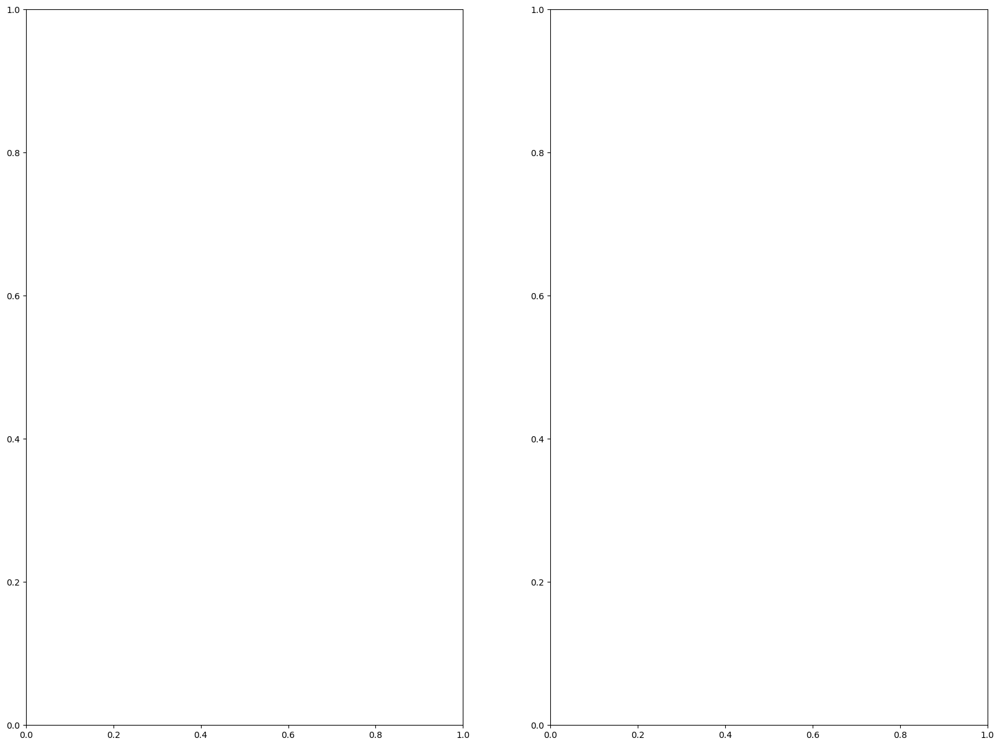

In [80]:
fig=plt.figure(figsize=(20,15))
gs = gridspec.GridSpec(1, 2)
pie1 = fig.add_subplot(gs[0, 0])
pie2 = fig.add_subplot(gs[0, 1])
pie1.pie([len(Pre_C12[i]) for i in range(len(Pre_C12))],labels=[f'Cluster {i}' for i in range(len(Pre_C12)) ],autopct='%1.1f%%',shadow=True, startangle=140)
pie2.pie([len(Pos_C12[i] )for i in range(len(Pos_C12))],labels=[f'Cluster {i}' for i in range(len(Pos_C12)) ],autopct='%1.1f%%',shadow=True, startangle=140)
#plt.savefig(f"F:/IC/caimandata/PieDistribution.svg",format='svg')

In [ ]:
%matplotlib inline
o=9
fig,ax=plt.subplots(1,1,figsize=(20,15))
Ma=np.amax(Pos_Trace[Pos_C[o]])
for l,i in enumerate(Pos_Trace[Pos_C[o]]):
    trace=i[164::10]+(Ma*l/1.0)
    ax.plot(trace,c='black')
    ax.plot(i.mean()*np.ones(len(trace))+Ma*l/1,c='r',lw=0.5)
    ax.set_xticks(Postimes[::55])
    ax.set_xticklabels(protocol)
    ax.set_title(f'Cluster {o}')

    
for i in range(25):
    if i%2==0:
        ax.axvspan(i*50,i*50+50,facecolor='#9999',alpha=0.5)
        
def NormPlot(cluster,Pre_Trace,Pre_C,Pre_x):
    fig,ax=plt.subplots(1,1,figsize=(20,15))
    Ma=np.amax(Pre_Trace[Pre_C[cluster]])
    for l,i in enumerate(Pre_Trace[Pre_C[cluster]]):
        trace=i[963::10]+(Ma*l/1.0)
        ax.plot(trace,c='black')
        ax.plot(i.mean()*np.ones(len(trace))+Ma*l/1,c='r',lw=0.5)
        ax.set_xticks(Pretimes[::55])
        ax.set_xticklabels(protocol)
        ax.set_title(f'Cluster {cluster}')
    for i in range(25):
        if i%2==0:
            ax.axvspan(i*50,i*50+50,facecolor='#9999',alpha=0.5)
    return plt.show()

In [ ]:
sns.heatmap(Pre_Trace[Pre_Trace[indices_0].mean(axis=1).argsort()],vmin=Pre_Trace[indices_0].mean(),vmax=1,cmap='hot',cbar_kws={'label': 'Activity'})

In [64]:

#963 is the correct for pre neurons/signals stamp
#164 is the correct for pos neurons/signals stamp
#600 is the correct for the duration of the stimulus at 20fps
cmatrix = []
Sound=[]
preiterations = int(len(Pre_Trace[0][963:]) / 600)  # How many frames are going to be analyzed in that interval
positerations = int(len(Pos_Trace[0][164:]) / 600)

for o in range(len(np.array(cle[2].index))):
    soon_list = []
    soof_list = []
    
    for i in range(preiterations):
        if i % 2 != 0:
            start = 963 + (i * 600)
            end = start + 600
            slice_to_append = Pre_Trace[matches[o][0]][start:end]  # Slicing the trace to be analyzed
            soon_list.append(slice_to_append)  # Append slice_to_append to soon_list

    # Repeating the same process for the post-stimulus trace
    for i in range(positerations):
        if i % 2 != 0:
            posstart = 164 + (i * 600)
            posend = posstart + 600
            posslice = Pos_Trace[matches[o][1]][posstart:posend]
            soof_list.append(posslice)

    # Convert the lists to numpy arrays
    soon = np.concatenate(soon_list, axis=0)
    soof = np.concatenate(soof_list, axis=0)
    
    if len(np.where(soon >= Pre_Trace[matches[o][0]].std())[0]):  # Compare the number of elements in the array that are greater than the mean of the pre-stimulus trace
        cmatrix.append(round(len(np.where(soof >= Pre_Trace[matches[o][0]].std())[0]) / len(np.where(soon >= Pre_Trace[matches[o][0]].std())[0]), 3))  # If they are, check how many of them are greater than the std of the pre-stimulus trace
        Sound.append(round(len(np.where(soon >= Pre_Trace[matches[o][0]].std())[0]) / len(soof), 3))  # If they are, check how many of them are greater than the std of the pre-stimulus trace

print(f'{len(np.where(cle[0]<=cle[1])[0])} neurons with a higher activity in the Pos trauma group\n{len(np.where(cle[0]>cle[1])[0])} neurons with less activity in the Pos trauma group\nthis shows an increase of activity in {round(len(np.where(cle[0]<=cle[1])[0])/len(cle[0])*100,2)}% of the neurons') 
print(f'{len(np.where(np.array(cmatrix) > 1)[0]) / len(cmatrix) * 100} have a higher activity in silence')
print(f'{len(np.where(np.array(cmatrix) < 1)[0]) / len(cmatrix) * 100} have a lower activity in silence\n\n')
print(f'{len(np.where(np.array(Sound) > 1)[0]) / len(Sound) * 100} have a higher activity in sound')
print(f'{len(np.where(np.array(Sound) < 1)[0]) / len(Sound) * 100} have a lower activity in sound')

27 neurons with a higher activity in the Pos trauma group
40 neurons with less activity in the Pos trauma group
this shows an increase of activity in 40.3% of the neurons
64.17910447761194 have a higher activity in silence
35.82089552238806 have a lower activity in silence


0.0 have a higher activity in sound
100.0 have a lower activity in sound


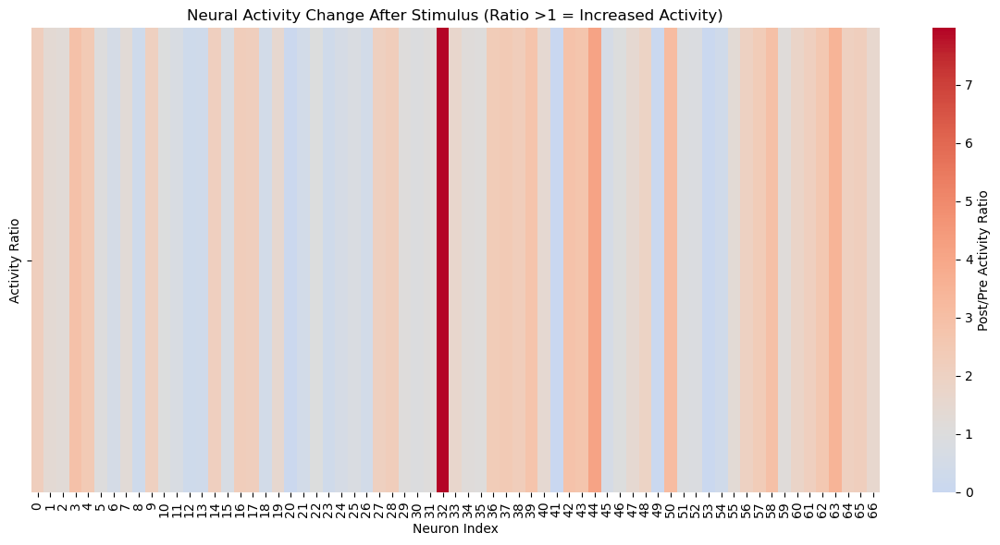

In [67]:
import seaborn as sns
import matplotlib.pyplot as plt

# Prepare data (example structure)
neurons = range(len(cmatrix))
activity_ratio = np.array(cmatrix)

plt.figure(figsize=(12, 6))
sns.heatmap([activity_ratio], 
            yticklabels=["Activity Ratio"],
            xticklabels=neurons,
            cmap="coolwarm",
            center=1,
            cbar_kws={'label': 'Post/Pre Activity Ratio'})
plt.title("Neural Activity Change After Stimulus (Ratio >1 = Increased Activity)")
plt.xlabel("Neuron Index")
plt.tight_layout()
plt.show()

In [109]:
Pos_Trace[1][164-300:164+900]

array([], dtype=float64)

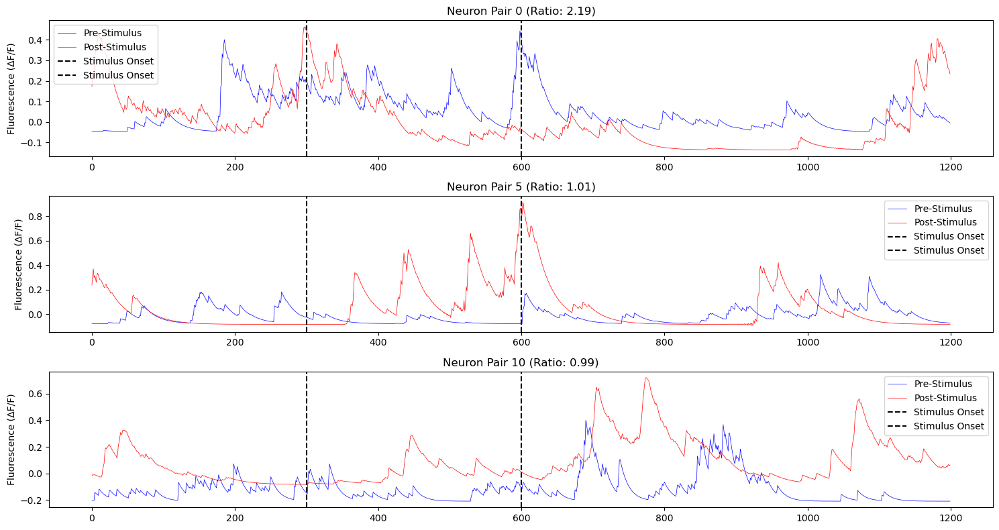

In [141]:
plt.figure(figsize=(15, 8))

# Plot example matched pairs
for i in [0, 5, 10]:  # Sample 3 representative neurons
    plt.subplot(3, 1, i//5 + 1)
    
    # Align traces by stimulus onset
    #pre_trace = Pre_Trace[matches[i][0]][963-300:963+900]  # 15s pre + 45s post
    #pos_trace = Pos_Trace[matches[i][1]][164-300:164+900]
    
    plt.plot(Pre_Trace[matches[i][0]][2*963-300:2*963+900], 'b-', label='Pre-Stimulus',lw=0.5)
    plt.plot(Pos_Trace[matches[i][1]][2*164-300:2*164+900], 'r-', label='Post-Stimulus',lw=0.5)
    plt.axvline(300, color='k', linestyle='--', label='Stimulus Onset')
    plt.axvline(600, color='k', linestyle='--', label='Stimulus Onset')

    plt.title(f"Neuron Pair {i} (Ratio: {cmatrix[i]:.2f})")
    plt.ylabel("Fluorescence (ΔF/F)")
    plt.legend()

plt.tight_layout()
plt.show()

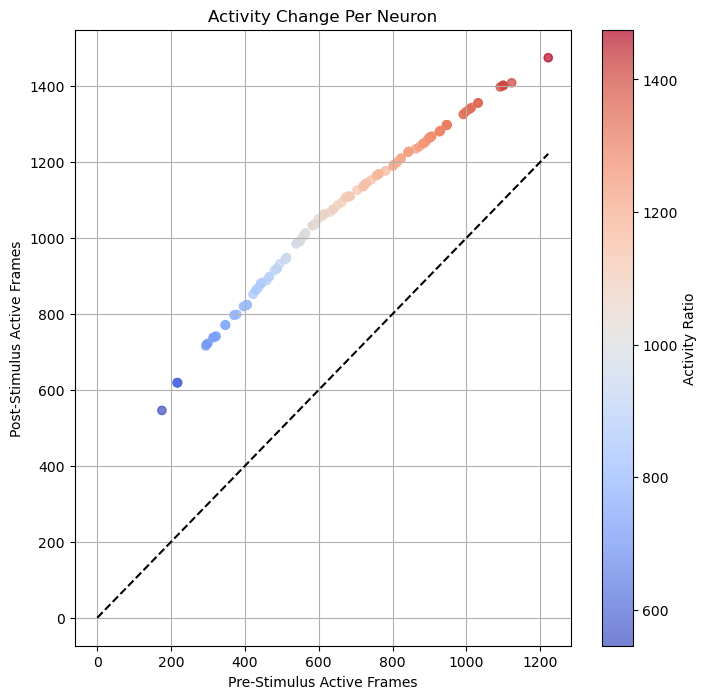

In [143]:
pre_activity = [len(np.where(soon >= Pre_Trace[m[0]].std())[0]) for m in matches]
post_activity = [len(np.where(soof >= Pre_Trace[m[0]].std())[0]) for m in matches]

plt.figure(figsize=(8, 8))
plt.scatter(pre_activity, post_activity, 
            cmap="coolwarm",c=post_activity,
            alpha=0.7)
plt.colorbar(label='Activity Ratio')
plt.plot([0, max(pre_activity)], [0, max(pre_activity)], 'k--')
plt.xlabel("Pre-Stimulus Active Frames")
plt.ylabel("Post-Stimulus Active Frames")
plt.title("Activity Change Per Neuron")
plt.grid(True)

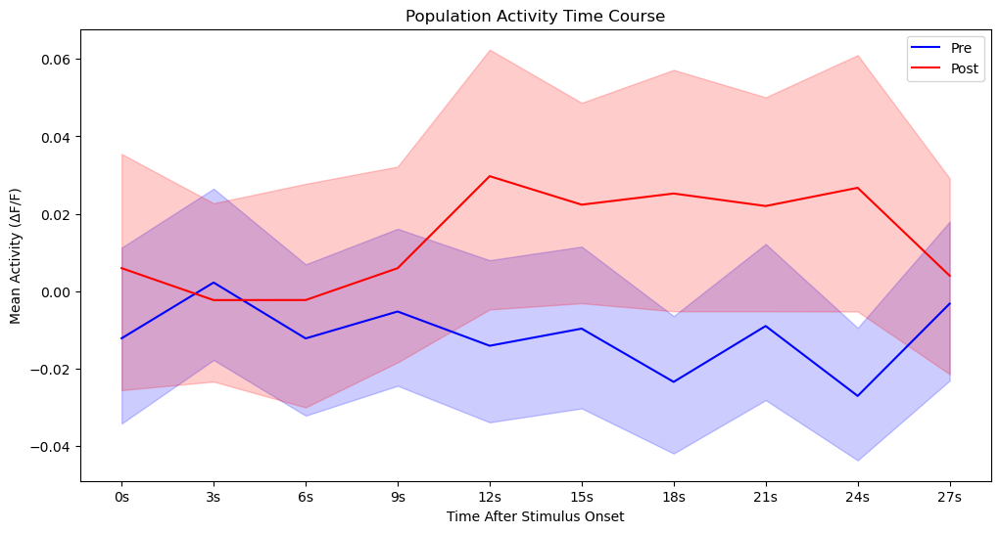

In [77]:
# Bin data into 60-frame (3s) bins
bin_size = 60
pre_bins = [np.mean(Pre_Trace[m[0]][963:963+600][i:i+bin_size]) 
            for i in range(0,600,bin_size) for m in matches]
pos_bins = [np.mean(Pos_Trace[m[1]][164:164+600][i:i+bin_size]) 
            for i in range(0,600,bin_size) for m in matches]

plt.figure(figsize=(12, 6))
sns.lineplot(x=np.tile(range(10), len(matches)), 
             y=pre_bins, 
             color='b', 
             label='Pre', 
             errorbar=('ci', 95))
sns.lineplot(x=np.tile(range(10), len(matches)),  
             y=pos_bins, 
             color='r', 
             label='Post', 
             errorbar=('ci', 95))
plt.xticks(range(10), [f"{3*i}s" for i in range(10)])
plt.xlabel("Time After Stimulus Onset")
plt.ylabel("Mean Activity (ΔF/F)")
plt.title("Population Activity Time Course")
plt.legend()

Mean Ratio: 1.5955
 Median Ratio: 1.3920
 Standard Deviation: 1.2144

 T-Statistic: 3.9840
 P-Value: 0.0002


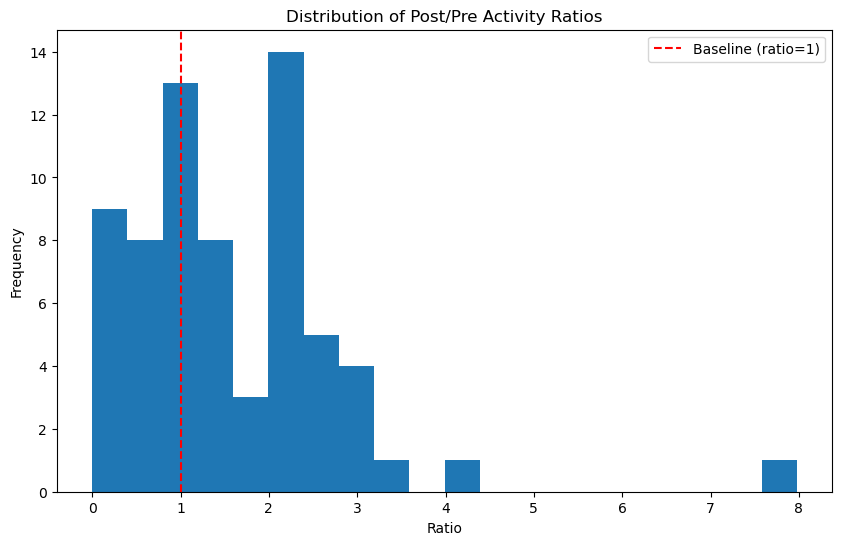

In [65]:

# Plot the ratio distribution
plt.figure(figsize=(10, 6))
plt.hist(cmatrix, bins=20)
plt.title('Distribution of Post/Pre Activity Ratios')
plt.xlabel('Ratio')
plt.ylabel('Frequency')
plt.axvline(x=1, color='r', linestyle='--', label='Baseline (ratio=1)')
plt.legend()
# Basic statistics
mean_ratio = np.mean(cmatrix)
median_ratio = np.median(cmatrix)
std_ratio = np.std(cmatrix)

# Test if the change is statistically significant
t_stat, p_value = stats.ttest_1samp(cmatrix, 1.0)  # Test against baseline of 1.0
print(f'Mean Ratio: {mean_ratio:.4f}\n Median Ratio: {median_ratio:.4f}\n Standard Deviation: {std_ratio:.4f}\n\n T-Statistic: {t_stat:.4f}\n P-Value: {p_value:.4f}')


Mean Ratio: 0.1063
 Median Ratio: 0.1090
 Standard Deviation: 0.0283

 T-Statistic: -256.9028
 P-Value: 0.0000


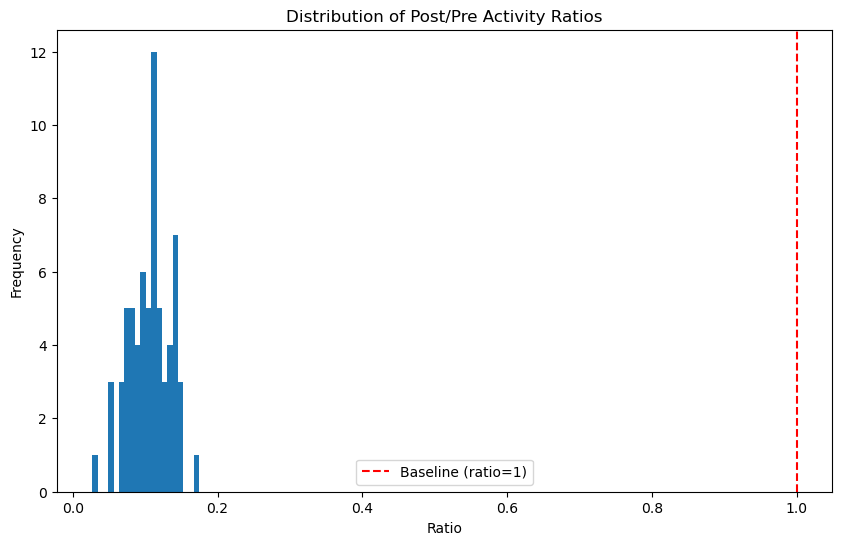

In [66]:

# Plot the ratio distribution
plt.figure(figsize=(10, 6))
plt.hist(Sound, bins=20)
plt.title('Distribution of Post/Pre Activity Ratios')
plt.xlabel('Ratio')
plt.ylabel('Frequency')
plt.axvline(x=1, color='r', linestyle='--', label='Baseline (ratio=1)')
plt.legend()
# Basic statistics
mean_ratio = np.mean(Sound)
median_ratio = np.median(Sound)
std_ratio = np.std(Sound)

# Test if the change is statistically significant
t_stat, p_value = stats.ttest_1samp(Sound, 1.0)  # Test against baseline of 1.0
print(f'Mean Ratio: {mean_ratio:.4f}\n Median Ratio: {median_ratio:.4f}\n Standard Deviation: {std_ratio:.4f}\n\n T-Statistic: {t_stat:.4f}\n P-Value: {p_value:.4f}')


In [ ]:
Pre_x=np.linspace(0,12,len(Pre_Trace[0][::]))
Pos_x = np.linspace(0, 12, len(Pos_Trace[164][::]))
Pair=matches[202]
fig, ax = plt.subplots(3, 1, figsize=(17,15))
ax[0].plot(Pre_x[::10],(Pre_Trace[Pair[0]][::10]),c='g')
ax[1].plot(Pos_x[::10],(Pos_Trace[Pair[1]][::10]),c='r')
ax[2].plot(Pre_x[::10],(Pre_Trace[Pair[0]][::10]),c='g')
ax[2].plot(Pos_x[::10],(Pos_Trace[Pair[1]][::10]),c='r')

ax[0].set_title(f'Neuron index {Pair[0]}')
ax[1].set_title(f'Neuron index {Pair[1]}')
ax[2].set_title(f'Neurons indexes {Pair[0]} and {Pair[1]}')

ax[0].set_xlabel('Frequency [Hz]')
ax[1].set_xlabel('Frequency [Hz]')
ax[2].set_xlabel('Frequency [Hz]')

ax[0].set_ylabel('Florescence [Au]')
ax[1].set_ylabel('Florescence [Au]')
ax[2].set_ylabel('Florescence [Au]')

ax[0].set_xticks(Ttick)
ax[1].set_xticks(Ttick)
ax[2].set_xticks(Ttick)

ax[0].set_xticklabels(protocol)
ax[1].set_xticklabels(protocol)
ax[2].set_xticklabels(protocol)

ax[0].set_xlim(0,12)
ax[1].set_xlim(0,12)
ax[2].set_xlim(0,12)
ax[0].legend(['Pre-Trauma'])
ax[1].legend(['Pos-Trauma'])
ax[2].legend(['Pre-Trauma','Pos-Trauma'])
for i in range(24):
    if i %2 ==0:
        ax[0].axvspan(i/2, (i/2)+0.5, facecolor='#9999', alpha=0.5)
        ax[1].axvspan(i/2, (i/2)+0.5, facecolor='#9999', alpha=0.5)
        ax[2].axvspan(i/2, (i/2)+0.5, facecolor='#9999', alpha=0.5)
    
#plt.savefig(f'F:/IC/caimandata/PrePosMatch1.svg',format='svg')

plt.show()

#### Running clusterization
##### 12 clusters all data

In [106]:
# Convert the raw traces to a feature matrix
PreX12 = np.vstack(APre_X)
PosX12 = np.vstack(APos_X)
# Perform K-means clustering with 11 clusters
Prekmeans = KMeans(n_clusters=12, random_state=0).fit(PreX12)
Poskmeans = KMeans(n_clusters=12, random_state=0).fit(PosX12)
# Assign each raw trace to a cluster
APrelabels = Prekmeans.predict(PreX12)
APoslabels = Poskmeans.predict(PosX12)
# Create a matrix where each row corresponds to a raw trace and each column corresponds to a cluster
Precluster_matrix = np.zeros((len(Pre_Trace), 12))
Poscluster_matrix = np.zeros((len(Pos_Trace), 12))
for i in range(len(Pre_Trace)):
    Precluster_matrix[i, APrelabels[i]] = 1
for i in range(len(Pos_Trace)):
    Poscluster_matrix[i, APoslabels[i]] = 1
    
Pre_Indices0,Pre_Indices1,Pre_Indices2,Pre_Indices3,Pre_Indices4,Pre_Indices5,Pre_Indices6,Pre_Indices7,Pre_Indices8,Pre_Indices9,Pre_Indices10,Pre_Indices11 = np.where(APrelabels == 0)[0],np.where(APrelabels == 1)[0],np.where(APrelabels == 2)[0],np.where(APrelabels == 3)[0],np.where(APrelabels == 4)[0],np.where(APrelabels == 5)[0],np.where(APrelabels == 6)[0],np.where(APrelabels == 7)[0],np.where(APrelabels == 8)[0],np.where(APrelabels == 9)[0],np.where(APrelabels == 10)[0],np.where(APrelabels == 11)[0]
Pos_Indices0,Pos_Indices1,Pos_Indices2,Pos_Indices3,Pos_Indices4,Pos_Indices5,Pos_Indices6,Pos_Indices7,Pos_Indices8,Pos_Indices9,Pos_Indices10,Pos_Indices11 = np.where(APoslabels == 0)[0],np.where(APoslabels == 1)[0],np.where(APoslabels == 2)[0],np.where(APoslabels == 3)[0],np.where(APoslabels == 4)[0],np.where(APoslabels == 5)[0],np.where(APoslabels == 6)[0],np.where(APoslabels == 7)[0],np.where(APoslabels == 8)[0],np.where(APoslabels == 9)[0],np.where(APoslabels == 10)[0],np.where(APoslabels == 11)[0]


Pre_Indices=[Pre_Indices0,Pre_Indices1,Pre_Indices2,Pre_Indices3,Pre_Indices4,Pre_Indices5,Pre_Indices6,Pre_Indices7,Pre_Indices8,Pre_Indices9,Pre_Indices10,Pre_Indices11]
Pos_Indices=[Pos_Indices0,Pos_Indices1,Pos_Indices2,Pos_Indices3,Pos_Indices4,Pos_Indices5,Pos_Indices6,Pos_Indices7,Pos_Indices8,Pos_Indices9,Pos_Indices10,Pos_Indices11]

Pre_C = [[] for _ in range(12)]
Pos_C = [[] for _ in range(12)]

for i in range(12):
  for j in Pre_Indices[i]:
    #if j in Pre_Idx:
    Pre_C[i].append(j)
  Pre_C[i] = np.array(Pre_C[i], dtype=int)

for i in range(12):
  for j in Pos_Indices[i]:
    #if j in Pos_pIdx:
    Pos_C[i].append(j)
  Pos_C[i] = np.array(Pos_C[i], dtype=int)

PreClusters = Pre_C
PosClusters = Pos_C
PreClustersNames = [f'Pre_C{i+1}' for i in range(12)]
PosClustersNames = [f'Pos_C{i+1}' for i in range(12)]

print(f'Pre_C1: {Pre_C[0]}\nPre_C2: {Pre_C[1]}\nPre_C3: {Pre_C[2]}\nPre_C4: {Pre_C[3]}\nPre_C5: {Pre_C[4]}\nPre_C6: {Pre_C[5]}\nPre_C7: {Pre_C[6]}\nPre_C8: {Pre_C[7]}\nPre_C9: {Pre_C[8]}\nPre_C10: {Pre_C[9]}\nPre_C11: {Pre_C[10]}\nPre_C12: {Pre_C[11]}\n')
print(f'Pos_C1: {Pos_C[0]}\nPos_C2: {Pos_C[1]}\nPos_C3: {Pos_C[2]}\nPos_C4: {Pos_C[3]}\nPos_C5: {Pos_C[4]}\nPos_C6: {Pos_C[5]}\nPos_C7: {Pos_C[6]}\nPos_C8: {Pos_C[7]}\nPos_C9: {Pos_C[8]}\nPos_C10: {Pos_C[9]}\nPos_C11: {Pos_C[10]}\nPos_C12: {Pos_C[11]}')

#Pre_x = np.linspace(0, 12, len(Pre_Trace[963::10]))
#

#print(Pre_C2,"\n", Pos_C11)





ValueError: Input X contains NaN.
KMeans does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

##### 4 clusters  all data 

##### 2 clusters  all data

In [ ]:
PreX2 = np.vstack(APre_X)
PosX2 = np.vstack(APos_X)
# Perform K-means clustering with 4 
Prekmeans3 = KMeans(n_clusters=2, random_state=0).fit(PreX2)
Poskmeans3 = KMeans(n_clusters=2, random_state=0).fit(PosX2)
# Assign each raw trace to a cluster
APrelabels2 = Prekmeans3.predict(PreX2)
APoslabels2 = Poskmeans3.predict(PosX2)
# Create a matrix where each row corresponds to a raw trace and each column corresponds to a cluster
Precluster_matrix3 = np.zeros((len(Pre_Trace), 2))
Poscluster_matrix3 = np.zeros((len(Pos_Trace), 2))

for i in range(len(Pre_Trace)):
    Precluster_matrix3[i, APrelabels2[i]] = 1
for i in range(len(Pos_Trace)):
    Poscluster_matrix3[i, APoslabels2[i]] = 1
    
Pre_Indices03,Pre_Indices13= np.where(APrelabels2 == 0)[0],np.where(APrelabels2 == 1)[0]
Pos_Indices03,Pos_Indices13= np.where(APoslabels2 == 0)[0],np.where(APoslabels2 == 1)[0]


Pre_Indices3=[Pre_Indices03,Pre_Indices13]
Pos_Indices3=[Pos_Indices03,Pos_Indices13]

Pre_C3 = [[] for _ in range(2)]
Pos_C3 = [[] for _ in range(2)]

for i in range(2):
  for j in Pre_Indices3[i]:
      Pre_C3[i].append(j)
  Pre_C3[i] = np.array(Pre_C3[i], dtype=int)

for i in range(2):
  for j in Pos_Indices3[i]:
      Pos_C3[i].append(j)
  Pos_C3[i] = np.array(Pos_C3[i], dtype=int)

PreClusters3 = Pre_C3
PosClusters3 = Pos_C3
PreClustersNames3 = [f'Pre_C{i+1}' for i in range(12)]
PosClustersNames3 = [f'Pos_C{i+1}' for i in range(12)]

print(f'Pre_C1: {Pre_C3[0]}\nPre_C2: {Pre_C3[1]}')
print(f'Pos_C1: {Pos_C3[0]}\nPos_C2: {Pos_C3[1]}')

####  Caiman selected Neurons Clusters

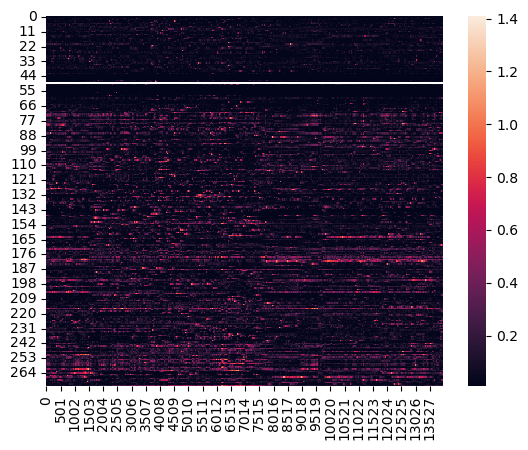

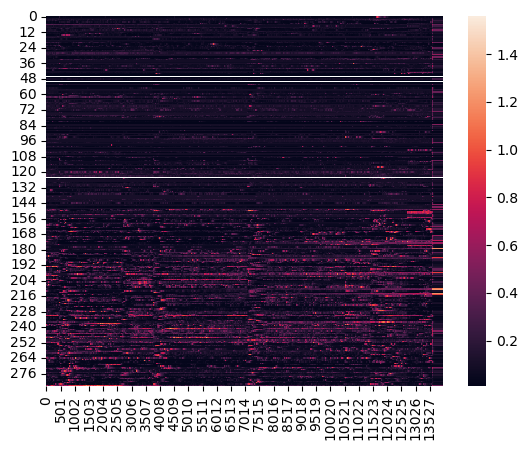

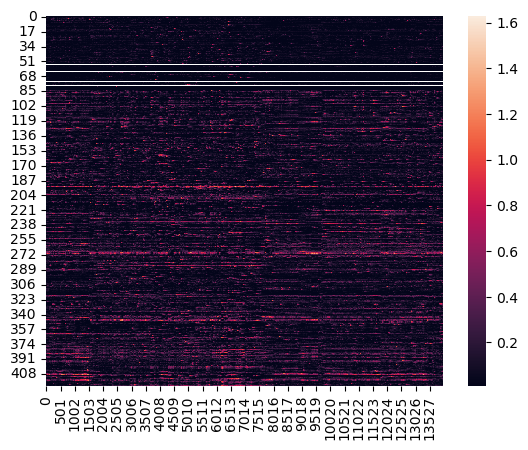

<Axes: >

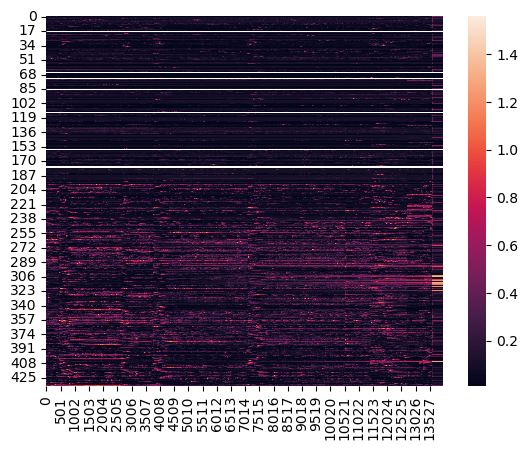

In [106]:
selected_idx = neuron.pre_idx[((neuron.pre_trace[neuron.pre_idx].std(axis=1)>0.08).argsort() ).flatten()]
sns.heatmap(neuron.pre_trace[selected_idx])
plt.show()
selected_idx2 = neuron.pos_idx[((neuron.pos_trace[neuron.pos_idx].std(axis=1)> 0.10).argsort() ).flatten()]
sns.heatmap(neuron.pos_trace[selected_idx2])
plt.show()
selected_idx = (neuron.pre_trace.std(axis=1) > 0.08).argsort().flatten()
sns.heatmap(neuron.pre_trace[selected_idx])
plt.show()
selected_idx2 = (neuron.pos_trace.std(axis=1) > 0.10).argsort().flatten()
sns.heatmap(neuron.pos_trace[selected_idx2])

In [107]:
print(f'Meédia das médias de cada vetor:\nPre: {neuron.pre_trace[neuron.pre_idx].mean(axis=1).mean()}\nPos: {neuron.pos_trace[neuron.pos_idx].mean(axis=1).mean()}')



Meédia das médias de cada vetor:
Pre: nan
Pos: nan


In [ ]:
y0=neuron.pre_trace
y1=neuron.pos_trace
y0=y0-y0.min()
y1=y1-y1.min()
o=3
x=np.linspace(0,12,len(y0[0]))
fig,ax=plt.subplots(1,1,figsize=(15,5))
for j,i in enumerate(Pos_C12[o]):
    alpha_value = min(0.25 + (0.05 * j), 1.0)  # Ensure alpha is within the range [0, 1]
    ax.plot(x[140::],y1[i][140::],lw=0.75)
    ax.hlines(y1[i][140::].mean(),0,12,alpha=alpha_value)
ax.set_xticks(Ttick)
ax.set_xticklabels(protocol)
for i in range(0, 24, 1):
    if i % 2 == 0:
        ax.axvspan(i*.5, i*.5+.5, facecolor='#9999', alpha=0.5)
plt.tight_layout()

In [ ]:
CPreX12 = np.vstack(neuron.pre_trace[neuron.pre_idx])
CPosX12 = np.vstack(neuron.pos_trace[neuron.pos_idx])
# Perform K-means clustering with 4 clusters
Prekmeans4 = KMeans(n_clusters=12, random_state=0).fit(CPreX12)
Poskmeans4 = KMeans(n_clusters=12, random_state=0).fit(CPosX12)
# Assign each raw trace to a cluster
CPrelabels12 = Prekmeans4.predict(CPreX12)
CPoslabels12 = Poskmeans4.predict(CPosX12)
# Create a matrix where each row corresponds to a raw trace and each column corresponds to a cluster
Precluster_matrix12 = np.zeros((len(CPre_X), 12))
Poscluster_matrix12 = np.zeros((len(CPos_X), 12))
for i in range(len(CPre_X)):
  Precluster_matrix12[i, CPrelabels12[i]] = 1
for i in range(len(CPos_X)):
  Poscluster_matrix12[i, CPoslabels12[i]] = 1
  
Pre_Indices02,Pre_Indices12,Pre_Indices22,Pre_Indices32,Pre_Indices42,Pre_Indices52,Pre_Indices62,Pre_Indices72,Pre_Indices82,Pre_Indices92,Pre_Indices102,Pre_Indices112 = np.where(CPrelabels12 == 0)[0],np.where(CPrelabels12 == 1)[0],np.where(CPrelabels12 == 2)[0],np.where(CPrelabels12 == 3)[0],np.where(CPrelabels12 == 4)[0],np.where(CPrelabels12 == 5)[0],np.where(CPrelabels12 == 6)[0],np.where(CPrelabels12 == 7)[0],np.where(CPrelabels12 == 8)[0],np.where(CPrelabels12 == 9)[0],np.where(CPrelabels12 == 10)[0],np.where(CPrelabels12 == 11)[0]
Pos_Indices02,Pos_Indices12,Pos_Indices22,Pos_Indices32,Pos_Indices42,Pos_Indices52,Pos_Indices62,Pos_Indices72,Pos_Indices82,Pos_Indices92,Pos_Indices102,Pos_Indices112 = np.where(CPoslabels12 == 0)[0],np.where(CPoslabels12 == 1)[0],np.where(CPoslabels12 == 2)[0],np.where(CPoslabels12 == 3)[0],np.where(CPoslabels12 == 4)[0],np.where(CPoslabels12 == 5)[0],np.where(CPoslabels12 == 6)[0],np.where(CPoslabels12 == 7)[0],np.where(CPoslabels12 == 8)[0],np.where(CPoslabels12 == 9)[0],np.where(CPoslabels12 == 10)[0],np.where(CPoslabels12 == 11)[0]


Pre_Indices12=[Pre_Indices02,Pre_Indices12,Pre_Indices22,Pre_Indices32,Pos_Indices42,Pos_Indices52,Pos_Indices62,Pos_Indices72,Pos_Indices82,Pos_Indices92,Pos_Indices102,Pos_Indices112]
Pos_Indices12=[Pos_Indices02,Pos_Indices12,Pos_Indices22,Pos_Indices32,Pos_Indices42,Pos_Indices52,Pos_Indices62,Pos_Indices72,Pos_Indices82,Pos_Indices92,Pos_Indices102,Pos_Indices112]

Pre_C12 = [[] for _ in range(12)]
Pos_C12 = [[] for _ in range(12)]

for i in range(12):
  for j in Pre_Indices12[i]:
    if j in neuron.pre_idx:
      Pre_C12[i].append(j)
  Pre_C12[i] = np.array(Pre_C12[i], dtype=int)

for i in range(12):
  for j in Pos_Indices12[i]:
    if j in neuron.pos_idx:
      Pos_C12[i].append(j)
  Pos_C12[i] = np.array(Pos_C12[i], dtype=int)

PreClusters12 = Pre_C12
PosClusters12 = Pos_C12
PreClustersNames12 = [f'Pre_C{i+1}' for i in range(12)]
PosClustersNames12 = [f'Pos_C{i+1}' for i in range(12)]

print(f'Pre_C1: {Pre_C12[0]}\nPre_C2: {Pre_C12[1]}\nPre_C3: {Pre_C12[2]}\nPre_C4: {Pre_C12[3]} Pre_C5: {Pre_C12[4]}\nPre_C6: {Pre_C12[5]}\nPre_C7: {Pre_C12[6]}\nPre_C8: {Pre_C12[7]} Pre_C9: {Pre_C12[8]}\nPre_C10: {Pre_C12[9]}\nPre_C11: {Pre_C12[10]}\nPre_C12: {Pre_C12[11]}')
print(f'Pos_C1: {Pos_C12[0]}\nPos_C2: {Pos_C12[1]}\nPos_C3: {Pos_C12[2]}\nPos_C4: {Pos_C12[3]}\nPos_C5: {Pos_C12[4]}\nPos_C6: {Pos_C12[5]}\nPos_C7: {Pos_C12[6]}\nPos_C8: {Pos_C12[7]}\nPos_C9: {Pos_C12[8]}\nPos_C10: {Pos_C12[9]}\nPos_C11: {Pos_C12[10]}\nPos_C12: {Pos_C12[11]}')



In [ ]:
'''
def findcor(index,select=0):
    if select==0:
        preindex=neuron.pre_idx[index]
        Nmatches(preindex,matches=matches,select=0)
    posindex=neuron.pos_idx[index]
'''

In [ ]:
Pos_C12[2]

In [ ]:
neuron.pos_idx[Pos_C12[2]]

In [ ]:
for i in range(len(Pos_C12[2])):
    print(i)
#Nmatches(neuron.pos_idx[Pos_C12[2][i]],matches=matches,select=2)


In [ ]:
traces(0,neuron.pos_idx[Pos_C12[2][1]],1)


In [ ]:
o=1
gs=gridspec.GridSpec(2*len(Pos_C12[o]), 1)
fig = plt.figure(figsize=(30, 180))
for i, j in enumerate(Pos_C12[o]):
    #Sele=Nmatches(neuron.pos_idx[j],matches=matches,select=2)
    if i%2==0:
        ax = fig.add_subplot(gs[i, 0])
        ax.plot(Pre_x[::], traces(0,neuron.pos_idx[j],0),c='g',lw=0.65)
        ax.plot(Pre_x[::],np.ones(len(traces(0,neuron.pos_idx[j],0)))*traces(0,neuron.pos_idx[j],0).std() ,c='b',lw=0.4,alpha=0.5)
        ax.set_title(f'Neuron {i} Pre Noise')
        ax.set_xticks(Ttick)
        ax.set_xticklabels(protocol)
        ax.set_xlim(0, 12)
        ax.set_ylim(0, 1)
        ax.legend(['Activity','Noise'])
        for k in range(0, 24, 1):
            if k % 2 == 0:
                ax.axvspan(k*.5, k*.5+.5, facecolor='#9999', alpha=0.5)
    else:
        ax = fig.add_subplot(gs[i, 0])
        ax.plot(Pos_x[::], neuron.pos_trace[j][164::],c='r',lw=0.65)
        ax.plot(Pos_x[::], np.ones(len(neuron.pos_trace[j][164::]))*neuron.pos_trace[j][164::].std(),c='b',lw=0.4,alpha=0.5)
        ax.set_title(f'Neuron {i-1} Pos Noise')
        ax.set_xticks(Ttick)
        ax.set_xticklabels(protocol)
        ax.set_xlim(0, 12)
        ax.set_ylim(0, 1)
        ax.legend(['Activity','Noise'])

        for k in range(0, 24, 1):
            if k % 2 == 0:
                ax.axvspan(k*.5, k*.5+.5, facecolor='#9999', alpha=0.5)
plt.savefig(f'C:/Users/gabri/Desktop/Prog/LAbp/NeuroProg/Pesquisa/fig/TraceNoise.svg',format='svg')


In [ ]:
o=4
for l,i in enumerate(Pre_Trace[Pre_C12[o]]):
    trace=i[963::10]+(Ma*l/1.0)
    ax1.plot(Pre_x[::10],trace,c=f'g')
    ax1.plot(Pre_x[::10],(i.mean()*np.ones(len(trace))+Ma*l/1),c='r',lw=0.5)
    ax1.set_xticks(Ttick)
    ax1.set_xticklabels(protocol)
    ax1.set_title(f'Cluster {o}')
    for k in range(len(globals()[f'idx{Pre_C12[o][l]}_coord'][:,0])):
        xa = globals()[f'idx{Pre_C12[o][l]}_coord'][k,0]
        ya = globals()[f'idx{Pre_C12[o][l]}_coord'][k,1]
        ax3.scatter(x=xa, y=ya,s = 0.8, c='g')
    ax3.annotate(f'{f[0]} {f[1]}', (xa, ya),(xa+5, ya+5),color='white')
    for d, f in enumerate(matches):
        if f[0]==Pre_C12[o][l]:
            ant=d-1
            
            if matches[d+1][0]==f[0]:
                trace1=Pos_Trace[f[1]][164::10]+Pos_Trace[matches[d+1][1]][164::10]+(Ma*l/1.0)
                ax2.plot(Pos_x[::10],trace1,c='r')
                ax2.plot(Pos_x[::10],(Pos_Trace[f[1]].mean()*np.ones(len(trace1))+Ma*l/1),c='b',lw=0.5)
                ax2.set_xticks(Ttick)
                ax2.set_xticklabels(protocol)
            elif matches[ant][0]==f[0]:
                continue
            else:
                trace1=Pos_Trace[f[1]][164::10]+(Ma*l/1.0)
                ax2.plot(Pos_x[::10],trace1,c='r')
                ax2.plot(Pos_x[::10],(Pos_Trace[f[1]].mean()*np.ones(len(trace1))+Ma*l/1),c='b',lw=0.5)
                ax2.set_xticks(Ttick)
                ax2.set_xticklabels(protocol)
    

In [ ]:
%matplotlib inline
o=2
for i in range(len(Pos_C12[o])):
    trace=Pos_Trace[Pos_C12[o][i]][140::]
    plt.plot(trace)
    #plt.show()
#plt.plot(traces(0,neuron.pos_idx[Pos_C12[1][2]],0))
#traces(0,neuron.pre_idx[Pre_C12[0][0]],0)


In [ ]:
plt.plot(Pre_Trace[Pre_C12[9]].mean(axis=0))

In [ ]:
CPreX4 = np.vstack(CPre_X)
CPosX4 = np.vstack(CPos_X)
# Perform K-means clustering with 4 clusters
Prekmeans4 = KMeans(n_clusters=4, random_state=0).fit(CPreX4)
Poskmeans4 = KMeans(n_clusters=4, random_state=0).fit(CPosX4)
# Assign each raw trace to a cluster
CPrelabels4 = Prekmeans4.predict(CPreX4)
CPoslabels4 = Poskmeans4.predict(CPosX4)
# Create a matrix where each row corresponds to a raw trace and each column corresponds to a cluster
Precluster_matrix4 = np.zeros((len(CPre_X), 4))
Poscluster_matrix4 = np.zeros((len(CPos_X), 4))
for i in range(len(CPre_X)):
  Precluster_matrix4[i, CPrelabels4[i]] = 1
for i in range(len(CPos_X)):
  Poscluster_matrix4[i, CPoslabels4[i]] = 1
  
Pre_Indices02,Pre_Indices12,Pre_Indices22,Pre_Indices32 = np.where(CPrelabels4 == 0)[0],np.where(CPrelabels4 == 1)[0],np.where(CPrelabels4 == 2)[0],np.where(CPrelabels4 == 3)[0]
Pos_Indices02,Pos_Indices12,Pos_Indices22,Pos_Indices32 = np.where(CPoslabels4 == 0)[0],np.where(CPoslabels4 == 1)[0],np.where(CPoslabels4 == 2)[0],np.where(CPoslabels4 == 3)[0]


Pre_Indices2=[Pre_Indices02,Pre_Indices12,Pre_Indices22,Pre_Indices32]
Pos_Indices2=[Pos_Indices02,Pos_Indices12,Pos_Indices22,Pos_Indices32]

Pre_C4 = [[] for _ in range(4)]
Pos_C4 = [[] for _ in range(4)]

for i in range(4):
  for j in Pre_Indices2[i]:
    if j in Pre_Idx:
      Pre_C4[i].append(j)
  Pre_C4[i] = np.array(Pre_C4[i], dtype=int)

for i in range(4):
  for j in Pos_Indices2[i]:
    if j in Pos_pIdx:
      Pos_C4[i].append(j)
  Pos_C4[i] = np.array(Pos_C4[i], dtype=int)

PreClusters4 = Pre_C4
PosClusters4 = Pos_C4
PreClustersNames4 = [f'Pre_C{i+1}' for i in range(12)]
PosClustersNames4 = [f'Pos_C{i+1}' for i in range(12)]

print(f'Pre_C1: {Pre_C4[0]}\nPre_C2: {Pre_C4[1]}\nPre_C3: {Pre_C4[2]}\nPre_C4: {Pre_C4[3]}')
print(f'Pos_C1: {Pos_C4[0]}\nPos_C2: {Pos_C4[1]}\nPos_C3: {Pos_C4[2]}\nPos_C4: {Pos_C4[3]}')

In [ ]:
CPreX2 = np.vstack(CPre_X)
CPosX2 = np.vstack(CPos_X)
# Perform K-means clustering with 2 clusters
Prekmeans2 = KMeans(n_clusters=2, random_state=0).fit(CPreX2)
Poskmeans2 = KMeans(n_clusters=2, random_state=0).fit(CPosX2)
# Assign each raw trace to a cluster
CPrelabels2 = Prekmeans2.predict(CPreX2)
CPoslabels2 = Poskmeans2.predict(CPosX2)
# Create a matrix where each row corresponds to a raw trace and each column corresponds to a cluster
Precluster_matrix2 = np.zeros((len(CPre_X), 2))
Poscluster_matrix2 = np.zeros((len(CPos_X), 2))
for i in range(len(CPre_X)):
    Precluster_matrix2[i, CPrelabels2[i]] = 1
for i in range(len(CPos_X)):
    Poscluster_matrix2[i, CPoslabels2[i]] = 1

Pre_Indices03,Pre_Indices13= np.where(CPrelabels2 == 0)[0],np.where(CPrelabels2 == 1)[0]
Pos_Indices03,Pos_Indices13= np.where(CPoslabels2 == 0)[0],np.where(CPoslabels2 == 1)[0]


Pre_Indices2=[Pre_Indices03,Pre_Indices13]
Pos_Indices2=[Pos_Indices03,Pos_Indices13]

Pre_C2 = [[] for _ in range(2)]
Pos_C2 = [[] for _ in range(2)]

for i in range(2):
  for j in Pre_Indices3[i]:
    if j in Pre_Idx:
      Pre_C2[i].append(j)
  Pre_C2[i] = np.array(Pre_C2[i], dtype=int)

for i in range(2):
  for j in Pos_Indices3[i]:
    if j in Pos_pIdx:
      Pos_C2[i].append(j)
  Pos_C2[i] = np.array(Pos_C2[i], dtype=int)

PreClusters2 = Pre_C2
PosClusters2 = Pos_C2
PreClustersNames2 = [f'Pre_C{i+1}' for i in range(2)]
PosClustersNames2 = [f'Pos_C{i+1}' for i in range(2)]

print(f'Pre_C1: {Pre_C2[0]}\nPre_C2: {Pre_C2[1]}')
print(f'Pos_C1: {Pos_C2[0]}\nPos_C2: {Pos_C2[1]}')



In [ ]:
%matplotlib inline


fig,ax=plt.subplots(2,2,figsize=(20,10))

ax[0,0].set_title('Pre 12 AClusters ')
ax[0,1].set_title('Pre 2 CClusters ')
ax[1,0].set_title('Pos 12 AClusters ')
ax[1,1].set_title('Pos 2 CClusters ')

sns.heatmap(Pre_Trace[np.argsort(APrelabels)], vmin=Pre_Trace.std(), cmap='hot', ax=ax[0,0])
sns.heatmap(Pre_Trace[np.argsort(CPrelabels2)], vmin=Pre_Trace.std(),  cmap='hot', ax=ax[0,1])
#sns.heatmap(Pre_Trace[np.argsort(CPrelabels4)]-Pre_Trace[np.argsort(CPrelabels4)].min(), vmin=Pre_Trace[Pre_idx].max()/Pre_Trace[Pre_idx].mean(), vmax=500, cmap='hot', ax=ax[0,2])
#sns.heatmap(Pre_Trace[np.argsort(CPrelabels12)]-Pre_Trace[np.argsort(CPrelabels12)].min(), vmin=Pre_Trace[Pre_idx].max()/Pre_Trace[Pre_idx].mean(), vmax=500, cmap='hot', ax=ax[0,3])
sns.heatmap(Pos_Trace[np.argsort(APoslabels)], vmin=Pos_Trace.std(),  cmap='hot',ax=ax[1,0])
sns.heatmap(Pos_Trace[np.argsort(CPoslabels2)], vmin=Pos_Trace.std(),  cmap='hot',ax=ax[1,1])
#sns.heatmap(Pos_Trace[np.argsort(CPoslabels4)]-Pos_Trace[np.argsort(CPoslabels4)].min(), vmin=2*os_Trace.std(), vmax=250, cmap='hot', ax=ax[1,2])
#sns.heatmap(Pos_Trace[np.argsort(CPoslabels12)]-Pos_Trace[np.argsort(CPoslabels12)].min(), vmin=2*Pos_Trace.std(), vmax=250, cmap='hot', ax=ax[1,3])
ax[0,0].set_xticks(np.arange(0,14000,600))
ax[0,1].set_xticks(np.arange(0,14000,600))
ax[1,0].set_xticks(np.arange(0,11000,460))
ax[1,1].set_xticks(np.arange(0,11000,460))
ax[0,0].set_xticklabels(protocol)
ax[0,1].set_xticklabels(protocol)
ax[1,0].set_xticklabels(protocol)
ax[1,1].set_xticklabels(protocol)
ax[0,0].set_ylabel('Neurons#')
ax[0,1].set_ylabel('Neurons#')
ax[1,0].set_ylabel('Neurons#')
ax[1,1].set_ylabel('Neurons#')
ax[0,0].set_yticklabels(np.argsort(APrelabels)[:25])
ax[0,1].set_yticklabels(np.argsort(CPrelabels2)[:25])
ax[1,0].set_yticklabels(np.argsort(APoslabels)[:25])
ax[1,1].set_yticklabels(np.argsort(CPoslabels2)[:24])
for i in range(14000):
    ax[0,0].axvline((i*700),(i*700)+1663 , c='w')
    ax[0,1].axvline((i*550),(i*550)+714, c='w')
    ax[1,0].axvline((i*700),(i*700)+1663 , c='w')
    ax[1,1].axvline((i*550),(i*550)+714, c='w')
    #ax[0,2].axvspan(i/2, (i/2)+0.5, facecolor='#9999', alpha=0.5)
    #ax[0,3].axvspan(i/2, (i/2)+0.5, facecolor='#9999', alpha=0.5)
    #ax[1,2].axvspan(i/2, (i/2)+0.5, facecolor='#9999', alpha=0.5)
    #ax[1,3].axvspan(i/2, (i/2)+0.5, facecolor='#9999', alpha=0.5)

#plt.savefig(f"F:/IC/caimandata/HeatMap.png",format='png')
plt.tight_layout()

NameError: name 'CPrelabels2' is not defined

In [ ]:
from scipy import stats
t_stat, p_val = stats.ttest_ind(Pre_Trace[indices_0].mean(axis=1), Pos_Trace[indices_1].mean(axis=1))
print(f'T-test statistic: {t_stat}\np-value: {p_val}')

In [ ]:
Pre_Trace_zscore = stats.zscore((Pre_Trace[indices_0]).mean(axis=1))
Pos_Trace_zscore = stats.zscore((Pos_Trace[indices_1]).mean(axis=1))

t_stat, p_val = stats.ttest_ind(Pre_Trace_zscore, Pos_Trace_zscore)
print(Pre_Trace_zscore,Pos_Trace_zscore)
print(f'T-test statistic: {t_stat}\np-value: {p_val}')

In [ ]:
plt.hist(Pre_Trace_zscore, bins=20, alpha=0.5,  color='g')

In [ ]:
highMe=np.array([])
for l,i in enumerate(Pre_Trace):
    if np.mean(i)>=5:
        l=int(l)
        highMe=np.append(highMe,l)
        highMe=highMe.astype(int)
PoshighMe=np.array([])
for l,i in enumerate(Pos_Trace):
    if np.mean(i)>=3:
        l=int(l)
        PoshighMe=np.append(PoshighMe,l)
        PoshighMe=PoshighMe.astype(int)
print(len(highMe))

In [ ]:
plt.plot(Pre_Trace[indices_0[5]]/Pre_Trace[indices_0[5]].max(),c='g')
#print(f'Relative error {((Pos_Trace[int(indices_1[3])].std()-Pre_Trace[int(indices_0[3])].std())/Pre_Trace[int(indices_0[3])].std())*100}%')


In [ ]:
print(np.isin(PoshighMe,Pos_idx))

In [ ]:

acc=np.diff(np.diff(Pos_Trace[Pos_idx]))**2
fig,ax=plt.subplots(5,2,figsize=(20,15))
for l,i in enumerate(acc[2:7]):
    ax[l,0].set_title(f'Neuron {Pos_idx[2+l]}')
    ax[l,0].plot(Pos_Trace[Pos_idx[2+l]])
    ax[l,1].plot(abs(i))
    ax[l,1].plot(i.std()*np.ones(len(acc[10])))
    print(i)

In [ ]:
def numbers_above_std(arr):
    std = np.std(arr)
    return arr[arr > std]

# Example usage
result = numbers_above_std(acc[9])
print(result)
#np.where(result==acc[10])

plt.plot(result)
plt.plot(np.std(acc[9])*np.ones(len(result)))

In [ ]:
Pre_Trace[highMe].std()

In [ ]:
print(Pre_Trace[highMe].argmax(axis=1))


NameError: name 'PoshighMe' is not defined

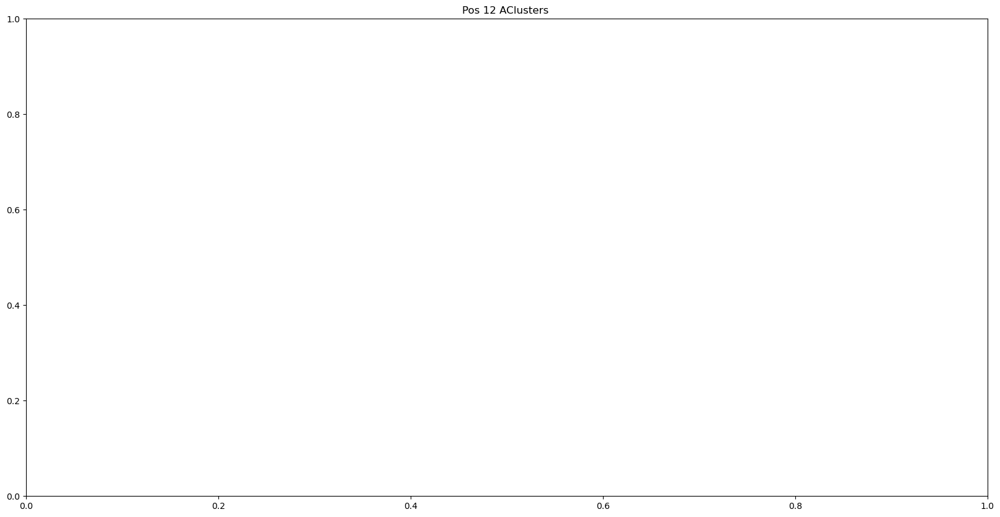

In [37]:
%matplotlib inline


fig,ax=plt.subplots(1,1,figsize=(20,10))

#ax.set_title('Pre 12 AClusters ')
#ax.set_title('Pre 2 CClusters ')
ax.set_title('Pos 12 AClusters ')
#ax.set_title('Pos 2 CClusters ')

#sns.heatmap(Pre_Trace[highMe]-Pre_Trace[highMe].min(), vmin=2*Pre_Trace.std(), vmax=500, cmap='hot')
#ax.set_yticklabels(highMe[:53])
#sns.heatmap(Pre_Trace[np.argsort(CPrelabels2)]-Pre_Trace[np.argsort(CPrelabels2)].min(), vmin=Pre_Trace.std(), vmax=500, cmap='hot', ax=ax[0,1])
#sns.heatmap(Pre_Trace[np.argsort(CPrelabels4)]-Pre_Trace[np.argsort(CPrelabels4)].min(), vmin=Pre_Trace[Pre_idx].max()/Pre_Trace[Pre_idx].mean(), vmax=500, cmap='hot', ax=ax[0,2])
#sns.heatmap(Pre_Trace[np.argsort(CPrelabels12)]-Pre_Trace[np.argsort(CPrelabels12)].min(), vmin=Pre_Trace[Pre_idx].max()/Pre_Trace[Pre_idx].mean(), vmax=500, cmap='hot', ax=ax[0,3])
#sns.heatmap(Pos_Trace[np.argsort(APoslabels)]-Pos_Trace[np.argsort(APoslabels)].min(), vmin=2*Pos_Trace.std(), vmax=250, cmap='hot',ax=ax[1,0])
#sns.heatmap(Pos_Trace[np.argsort(CPoslabels2)]-Pos_Trace[np.argsort(CPoslabels2)].min(), vmin=2*Pos_Trace.std(), vmax=250, cmap='hot',ax=ax[1,1])
#sns.heatmap(Pos_Trace[np.argsort(CPoslabels4)]-Pos_Trace[np.argsort(CPoslabels4)].min(), vmin=2*Pos_Trace.std(), vmax=250, cmap='hot', ax=ax[1,2])
sns.heatmap(Pos_Trace[PoshighMe]-Pos_Trace[PoshighMe].min(), vmin=2.5*Pos_Trace.std(), vmax=250, cmap='hot')
ax.set_xticks(np.arange(164,11000,460))
#ax[0,1].set_xticks(np.arange(0,14000,600))
#ax[1,0].set_xticks(np.arange(0,11000,460))
#ax[1,1].set_xticks(np.arange(0,11000,460))
ax.set_xticklabels(protocol)
#ax[0,1].set_xticklabels(protocol)
#ax[1,0].set_xticklabels(protocol)
#ax[1,1].set_xticklabels(protocol)
ax.set_ylabel('Neurons#')
#ax[0,1].set_ylabel('Neurons#')
#ax[1,0].set_ylabel('Neurons#')
#ax[1,1].set_ylabel('Neurons#')
#ax.set_yticklabels(np.argsort(APrelabels)[:54])
#ax[0,1].set_yticklabels(np.argsort(CPrelabels2)[:25])
#ax[1,0].set_yticklabels(np.argsort(APoslabels)[:25])
#ax[1,1].set_yticklabels(np.argsort(CPoslabels2)[:24])
#ax.set_xlim(1,14000)
ax.set_xlim(1,11000)
for i in range(11000):
    ax.axvline((i*600),(i*600)+(963+600) , c='w')
    #ax.axvline((i*600),(i*600)+(963+600) , c='w')
    #ax[0,1].axvline((i*550),(i*550)+714, c='w')
    #ax[1,0].axvline((i*700),(i*700)+1663 , c='w')
    #ax[1,1].axvline((i*550),(i*550)+714, c='w')
    #ax[0,2].axvspan(i/2, (i/2)+0.5, facecolor='#9999', alpha=0.5)
    #ax[0,3].axvspan(i/2, (i/2)+0.5, facecolor='#9999', alpha=0.5)
    #ax[1,2].axvspan(i/2, (i/2)+0.5, facecolor='#9999', alpha=0.5)
    #ax[1,3].axvspan(i/2, (i/2)+0.5, facecolor='#9999', alpha=0.5)

#plt.savefig(f"F:/IC/caimandata/zoomposHeatMap.png",format='png')
plt.tight_layout()

#### Stimulos on or off array

C:\Users\gabri\AppData\Local\Temp\ipykernel_23492\319346655.py:38: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

C:\Users\gabri\AppData\Local\Temp\ipykernel_23492\319346655.py:39: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



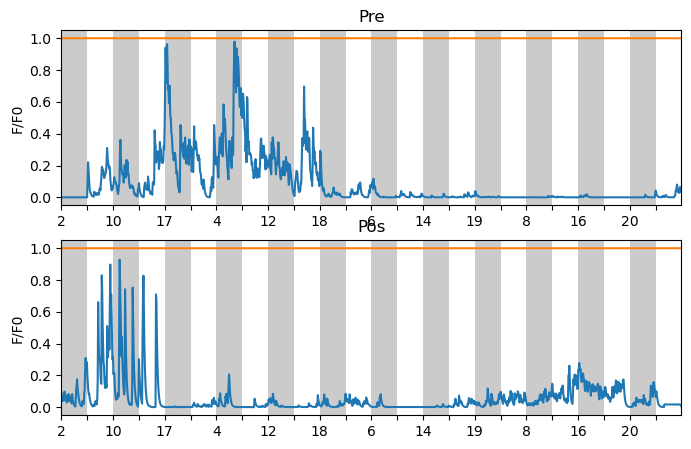

In [89]:
%matplotlib inline
Stimonpre=np.array([])
Stimoffpre=np.array([])
Stimonpos=np.array([])
Stimoffpos=np.array([])

Spre=np.array([])
Spre1=np.array([])
Spos=np.array([])
Spos1=np.array([])
j=2
for i in range(24):
    if i%2==0:
        Spre=np.append(Spre,Pre_Trace[matches[j][0]][963+(i*600):(i*600)+(600+963)])
        Spos=np.append(Spos,Pos_Trace[matches[j][1]][164+(i*600):(i*600)+(164+600)])
        
        #print(f'{963+(i*600)} : {(i*600)+(600+963)}')
        
        #Spre1=np.append(Spre1,np.ones(len(Pre_Trace[matches[j][0]][963+(i*600):(i*600)+(963+600)]))*Pre_Trace[matches[j][0]].mean())
        #Spos1=np.append(Spos1,np.ones(len(Pos_Trace[matches[j][1]][164+(i*600):(i*600)+(164+600)]))*Pos_Trace[matches[j][1]].mean())
        
        
    else:
        Spre1=np.append(Spre1,Pre_Trace[matches[j][0]][963+(i*600):(i*600)+(600+963)])
        Spos1=np.append(Spos1,Pos_Trace[matches[j][1]][164+i*600:(i*600)+(164+600)])
        
        
        #Spre=np.append(Spre,np.ones(len(Pre_Trace[matches[j][0]][963+(i*600):(i*600)+(600+963)]))*Pre_Trace[matches[j][0]].mean())
        #Spos=np.append(Spos,np.ones(len(Pos_Trace[matches[j][1]][164+i*600:(i*600)+(164+600)]))*Pos_Trace[matches[j][1]].mean())
Spre=Spre-Spre.min()
fig,ax=plt.subplots(2,1,figsize=(8,5))
ax[0].plot(np.linspace(0,12,len(Pre_Trace[0][963::10])),(Pre_Trace[matches[j][0]][963::10]))
ax[0].plot(np.linspace(0,12,len(Pre_Trace[0][963::10])),np.ones(len((Pre_Trace[matches[j][0]][963::10]))))
ax[1].plot(np.linspace(0,12,len(Pos_Trace[0][164::10])),(Pos_Trace[matches[j][1]][164::10]))
ax[1].plot(np.linspace(0,12,len(Pos_Trace[0][164::10])),np.ones(len((Pos_Trace[matches[j][1]][164::10]))))
ax[0].set_title('Pre')
ax[1].set_title('Pos')
ax[0].set_xticklabels(protocol)
ax[1].set_xticklabels(protocol)
ax[0].set_ylabel('F/F0')
ax[1].set_ylabel('F/F0')
ax[0].set_xlim(0,12)
ax[1].set_xlim(0,12)
ax[0].set_xticks(Ttick)
ax[1].set_xticks(Ttick)
for i in range(0,24,1):
    if i%2==0:
        ax[0].axvspan(i/2,(i/2)+0.5,facecolor='#9999',alpha=0.5)
        ax[1].axvspan(i/2,(i/2)+0.5,facecolor='#9999',alpha=0.5)
plt.show()


In [ ]:
len(Pre_Trace[0][963::])/600
len(Pos_Trace[0][140::])/600

In [ ]:
print(soon)
for i in range(int(len(Pre_Trace[0][963::])/600)):
    if i%2!=0:
        soon=np.append(soon,(Pre_Trace[matches[j][0]][963+(i*600):(i+1*600)+(963)]))
        print(f'{963+(i*600)}:{((i+1)*600)+(963)}\n{len(soon)}')

In [ ]:
plt.plot(soon-soon.min(),c='g')
    plt.plot(np.ones(len(soon))*Pre_Trace[matches[j][0]].std())
    plt.show()
    #print(len(soon))
    #print(len(soof))
    plt.plot(soof-soof.min(),c='r')
    plt.plot(np.ones(len(soof))*Pre_Trace[matches[j][0]].mean())


In [ ]:
lll=np.array([])
#Pre_Trace[matches[j][0]][963+(i*600):(i+1*600)+(963)])
#Pos_Trace[matches[j][1]][164+(i*600):(i+1*600)+(164)]
for i in range(12):
    star=963+(i*600)
    end=((i+1)*600)+(963)
    if i%2==0:
        lll=np.append((lll),Pre_Trace[10][star:end])
    #lll=np.append((lll),Pre_Trace[10][star:end])
    print(f'{star}\n {end}')
    print(lll[0:5])
print(len(lll))
    

In [ ]:
fig,ax=plt.subplots(1,1)
plt.scatter(Pre_CenterOfMass[matches[j][0]][1],Pre_CenterOfMass[matches[j][0]][0],c='g')
plt.scatter(Pos_CenterOfMass[matches[j][1]][1],Pos_CenterOfMass[matches[j][1]][0],c='r')
plt.imshow(PnrPre)
plt.show()

In [ ]:
fig,ax=plt.subplots(3,1,figsize=(15,15))
Pre_x=np.linspace(0,12,len(Pre_Trace[0]))
ax[0].plot(Pre_x[::],Pre_Trace[j][::])
ax[1].plot(Pre_x[963:],Spre-Spre.min())
ax[2].plot(Pre_x[963:],Spre1-Spre1.min())
ax[0].set_title('Pre'),ax[1].set_title('Only sound'),ax[2].set_title('Only Silence')
ax[0].set_xticks(Ttick)
ax[1].set_xticks(Ttick)
ax[2].set_xticks(Ttick)

ax[0].set_xticklabels(protocol)
ax[1].set_xticklabels(protocol)
ax[2].set_xticklabels(protocol)
for i in range(0,24,1):
    if i%2==0:
        ax[0].axvspan(i/2,(i/2)+0.5,facecolor='#9999',alpha=0.5)
        ax[1].axvspan(i/2,(i/2)+0.5,facecolor='#9999',alpha=0.5)
        ax[2].axvspan(i/2,(i/2)+0.5,facecolor='#9999',alpha=0.5)

In [ ]:
fig,ax=plt.subplots(1,1,figsize=(15,10))
Pos_x=np.linspace(0,12,len(Pos_Trace[0]))

nrm=(Pos_Trace[Pos_idx]/Pos_Trace[Pos_idx].std()).mean()
#plt.plot(Pos_x,Pos_Trace[9]*nrm)
plt.plot(Pos_x,nrm*np.ones(len(Pos_x)))
for i in range(len(Pos_Trace)):
    plt.plot(Pos_x[164:-350:10],(Pos_Trace[i][164:-350:10]-Pos_Trace[i][164:-350:10].min())*nrm)
for i in range(0,24,1):
    if i%2==0:
        ax.axvspan(i/2,(i/2)+0.5,facecolor='#9999',alpha=0.5)

In [ ]:
%matplotlib inline

fig,ax=plt.subplots(4,2,figsize=(25,22))
#Griding
ax[0,0].grid(),ax[1,0].grid(),ax[2,0].grid(),ax[3,0].grid()
ax[0,1].grid(),ax[1,1].grid(),ax[2,1].grid(),ax[3,1].grid()
ax[0,0].set_xlim(1,12),ax[1,0].set_xlim(1,12),ax[2,0].set_xlim(1,12),ax[3,0].set_xlim(1,12)
ax[0,1].set_xlim(1,12),ax[1,1].set_xlim(1,12),ax[2,1].set_xlim(1,12),ax[3,1].set_xlim(1,12)

ax[0,0].set_xticks(Ttick),ax[1,0].set_xticks(Ttick),ax[2,0].set_xticks(Ttick),ax[3,0].set_xticks(Ttick)
ax[0,1].set_xticks(Ttick),ax[1,1].set_xticks(Ttick),ax[2,1].set_xticks(Ttick),ax[3,1].set_xticks(Ttick)

ax[0,0].set_xticklabels(protocol),ax[1,0].set_xticklabels(protocol),ax[2,0].set_xticklabels(protocol),ax[3,0].set_xticklabels(protocol)
ax[0,1].set_xticklabels(protocol),ax[1,1].set_xticklabels(protocol),ax[2,1].set_xticklabels(protocol),ax[3,1].set_xticklabels(protocol)

ax[0,0].set_xlabel('Frequency [kHz]'),ax[1,0].set_xlabel('Frequency [kHz]'),ax[2,0].set_xlabel('Frequency [kHz]'),ax[3,0].set_xlabel('Frequency [kHz]')
ax[0,1].set_xlabel('Frequency [kHz]'),ax[1,1].set_xlabel('Frequency [kHz]'),ax[2,1].set_xlabel('Frequency [kHz]'),ax[3,1].set_xlabel('Frequency [kHz')

ax[0,0].set_ylabel('DF/F'),ax[1,0].set_ylabel('DF/F'),ax[2,0].set_ylabel('DF/F'),ax[3,0].set_ylabel('DF/F')
ax[0,1].set_ylabel('DF/F'),ax[1,1].set_ylabel('DF/F'),ax[2,1].set_ylabel('DF/F'),ax[3,1].set_ylabel('DF/F')

for j,k in enumerate(PreClusters):
    for i in k:
        if j < ax.shape[0] and 0 < ax.shape[1]:
            ax[j,0].plot(Pre_x,Pre_Trace[i][963::]-Pre_Trace[i][963::].min(),c=f'#0{j}{j}{j}00')
            ax[j,0].plot(Pre_x,(Pre_Trace[Pre_C[j]].std())*np.ones(len(Pre_x)),c='r')
            ax[j,0].set_title(f'Cluster :{j+1}')

for j,k in enumerate(PosClusters):
    for i in k:
        if j < ax.shape[0] and 1 < ax.shape[1]:
            ax[j,1].plot(Pos_x,Pos_Trace[i][164::]-Pos_Trace[i][164::].min(),c=f'#FA{j}{j}00')
            ax[j,1].plot(Pos_x,(Pos_Trace[Pos_C[j]].std())*np.ones(len(Pos_x)),c='b')
            ax[j,1].set_title(f'Cluster :{j+1}')

for i in range(0,24,1):
    if i%2==0:
        ax[0,0].axvspan(i/2,(i/2)+0.5,facecolor='#9999',alpha=0.5)
        ax[0,1].axvspan(i/2,(i/2)+0.5,facecolor='#9999',alpha=0.5)
        ax[1,0].axvspan(i/2,(i/2)+0.5,facecolor='#9999',alpha=0.5)
        ax[1,1].axvspan(i/2,(i/2)+0.5,facecolor='#9999',alpha=0.5)
plt.tight_layout()
plt.subplots_adjust(hspace=0.4)


In [ ]:
matches

In [ ]:
sile=np.array([])
fig=plt.figure(figsize=(25,10))
plt.plot(Pre_x,Pre_Trace[55][::])
for i in range(0,14000,600):
    plt.axvline(x=i/1000, c='r')
    

In [ ]:

fig,ax=plt.subplots(12,3,figsize=(25,22))
for i, j in enumerate(PreClusters2):
    if len(j)==0:
        continue  
    else:
        for k in j:
            ax[i,0].plot(Pre_x[963::10],Pre_Trace[k][963::10]-Pre_Trace[k][963::10].min())
            ax[i,0].plot(Pre_x,(Pre_Trace[Pre_C2[i]].std())*np.ones(len(Pre_x)),c='r')
            ax[i,0].set_title(f'Cluster :{i+1}')
for i, j in enumerate(PreClusters4):
    if len(j)==0:
        continue
    else:
        for k in j:
            ax[i,1].plot(Pre_x[963::10],Pre_Trace[k][963::10]-Pre_Trace[k][963::10].min())
            ax[i,1].plot(Pre_x,(Pre_Trace[Pre_C4[i]].std())*np.ones(len(Pre_x)),c='r')
            ax[i,1].set_title(f'Cluster :{i+1}')
for i, j in enumerate(PreClusters12):
    if len(j)==0:
        continue
    else:
        for k in j:
            ax[i,2].plot(Pre_x[963::10],Pre_Trace[k][963::10]-Pre_Trace[k][963::10].min())
            ax[i,2].plot(Pre_x,(Pre_Trace[Pre_C12[i]].std())*np.ones(len(Pre_x)),c='r')
            ax[i,2].set_title(f'Cluster :{i+1}')
        plt.show()

In [ ]:
PreActivity = np.diff(Pre_Trace[:])
PosActivity = np.diff(Pos_Trace[:])
PreActivity.shape
index=18
Pre_x=np.linspace(0,12,len(Pre_Trace[0]))
Pos_x=np.linspace(0,12,len(Pos_Trace[0]))
fig,ax=plt.subplots(2,1,figsize=(25,22))


ax[1].plot(Pre_x[963::10],PreActivity[matches[index][0]][963::10]/Pre_Trace[matches[index][0]][963::10].mean(),c='g')
ax[1].plot(Pos_x[1::],(PosActivity[matches[index][1]][::])/Pos_Trace[matches[index][1]][1::].mean(),c='r',alpha=0.5)

ax[0].plot(Pre_x[963::10],Pre_Trace[matches[index][0]][963::10]-Pre_Trace[matches[index][0]][963::10].min(),c='g')
ax[0].plot(Pos_x[164::10],Pos_Trace[matches[index][1]][164::10]-Pos_Trace[matches[index][1]][164::10].min(),alpha=0.5,c='r')



ax[0].set_title('Raw Traces')
ax[0].set_xlabel('Frequency [kHz]')
ax[0].set_ylabel('DF/F')
ax[0].legend([f'Neuron: {matches[index][0]}',f'Neuron: {matches[index][1]}'])

ax[0].set_xticks(Ttick)
ax[0].set_xticklabels(protocol)
ax[0].set_xlim(0,12)

ax[1].set_title('Activity Traces')
ax[1].set_xlabel('Frequency [kHz]')
ax[1].set_ylabel('DF/F')
ax[1].legend([f'Neuron: {matches[index][0]}',f'Neuron: {matches[index][1]}'])
ax[1].set_xticks(Ttick)
ax[1].set_xticklabels(protocol)
ax[1].set_xlim(0,12)

for i in range(0,24,1):
    if i%2==0:
        ax[0].axvspan(i/2,(i/2)+0.5,facecolor='#9999',alpha=0.5)
        ax[1].axvspan(i/2,(i/2)+0.5,facecolor='#9999',alpha=0.5)
plt.tight_layout()
#plt.savefig(f"F:/IC/caimandata/Activity.svg",format='svg')


In [ ]:
from sklearn.decomposition import PCA

fig,ax=plt.subplots(1,2,figsize=(20,16))
scaler = StandardScaler()
Pos_Trace_scaled = scaler.fit_transform(Pos_Trace)
Pre_Trace_scaled = scaler.fit_transform(Pre_Trace)
# Assume X is your data
pca = PCA(n_components=3)  # Reduce to 2 dimensions
PreX_pca = pca.fit_transform(Pre_Trace_scaled)
PosX_pca = pca.fit_transform(Pos_Trace_scaled)


PreX_pcaexplained_variance_ratio = pca.explained_variance_ratio_
PosX_pcaexplained_variance_ratio = pca.explained_variance_ratio_

Pren_components=np.arange(1,len(PreX_pcaexplained_variance_ratio)+1)
Posn_components=np.arange(1,len(PosX_pcaexplained_variance_ratio)+1)

ax[0].scatter(PreX_pca[:,0], PreX_pca[:,1],cmap='viridis',c=APrelabels )
ax[1].scatter(PosX_pca[:,0],PosX_pca[:,1],cmap='viridis',c=APoslabels)
ax[0].set_title('Pre')
ax[1].set_title('Pos')
ax[0].set_xlabel('PCA 1')
ax[0].set_ylabel('PCA 2')
ax[1].set_xlabel('PCA 1')
ax[1].set_ylabel('PCA 2')


plt.show()
plt.plot(Pren_components, PreX_pcaexplained_variance_ratio, 'go-')
plt.plot(Posn_components,PosX_pcaexplained_variance_ratio,'r-*')

plt.xlabel('Principal Component')
plt.ylabel('Proportion of Variance Explained')
plt.title('Scree Plot')
plt.show()
print(f'PReX:{PreX_pcaexplained_variance_ratio}\n PosX:{PosX_pcaexplained_variance_ratio}')

In [ ]:

from mpl_toolkits.mplot3d import Axes3D
angle_of_view=60

fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=angle_of_view, azim=30)

# Scatter plot the PCA results
ax.scatter(PreX_pca[:,0], PreX_pca[:, 1], PreX_pca[:, 2],c=APrelabels, cmap='viridis', label='Pre', s=50)

# Set labels and title
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title('PCA 3D Plot')

# Show the plot
plt.show()


In [ ]:
from mpl_toolkits.mplot3d import Axes3D
angle_of_view=15

fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=angle_of_view, azim=55)

# Scatter plot the PCA results
ax.scatter(PosX_pca[:,0], PosX_pca[:, 1], PosX_pca[:, 2],c=APoslabels, cmap='viridis', label='Pre', s=50)

# Set labels and title
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title('PCA 3D Plot')

In [ ]:
#sns.histplot(PreX_pca[:,0],PreX_pca[:,1],kde=True)#bins=(int(round(1 + 3.22*np.log(len(PreX_pca)))))
plt.hist(PreX_pca[:,0])
plt.hist(PreX_pca[:,1])
plt.hist(PreX_pca[:,2])

In [ ]:
Pre_C12

In [ ]:
cumsum=np.cumsum(pca.explained_variance_ratio_)
d=np.argmax(cumsum>=.95)+1
plt.plot(cumsum)
plt.vlines(d,0,1,colors='r',linestyles='dashed')
plt.hlines(.95,0,120,colors='r',linestyles='dashed')
print(f'PreX:{d}')

## Vizualization of cluster

NameError: name 'APrelabels2' is not defined

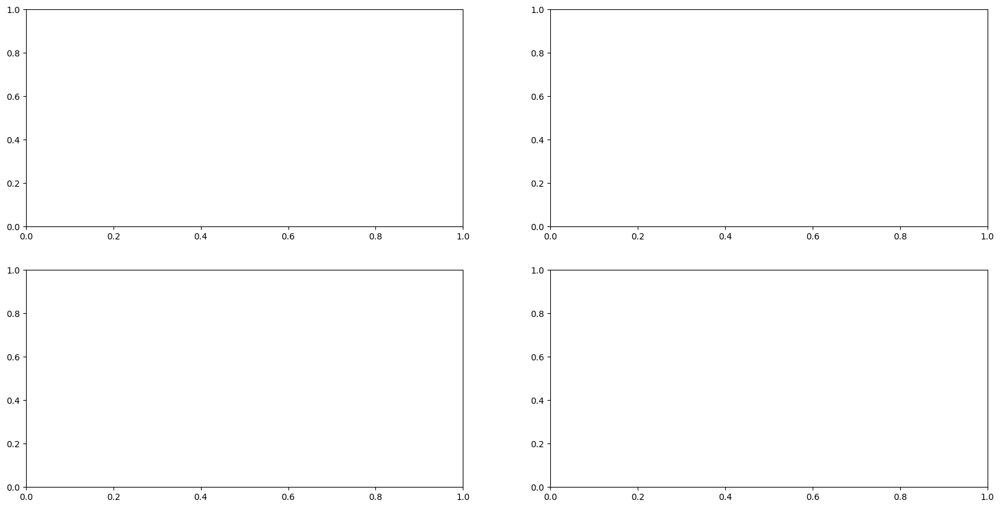

In [90]:
%matplotlib inline
fig,ax=plt.subplots(2,2,figsize=(20,10))
sns.heatmap(Pre_Trace[np.argsort(APrelabels2)],vmin=Pre_Trace[np.argsort(APrelabels2)].min(), vmax=Pre_Trace[np.argsort(APrelabels2)].max(), cmap='hot',ax=ax[0,0])
sns.heatmap(Pos_Trace[np.argsort(APoslabels2)][164::],vmin=Pos_Trace[np.argsort(APoslabels2)].min(), vmax=250, cmap='hot',ax=ax[1,0])
sns.heatmap(Pre_Trace[np.argsort(CPrelabels2)],vmin=Pre_Trace[np.argsort(CPrelabels2)].min(), vmax=Pre_Trace[np.argsort(CPrelabels2)].max(), cmap='hot',ax=ax[0,1])
sns.heatmap(Pos_Trace[np.argsort(CPoslabels2)][164::],vmin=Pos_Trace[np.argsort(CPoslabels2)].min(), vmax=250, cmap='hot',ax=ax[1,1])
ax[0,0].set_title('Pre 2 Clusters')
ax[1,0].set_title('Pos 2 Clusters')
ax[0,1].set_title('Pre Caiman 2 Clusters')
ax[1,1].set_title('Pos Caiman 2 Clusters')

In [ ]:
%matplotlib Qt
fig,ax=plt.subplots(2,1,figsize=(20,10))
sns.heatmap(Pre_Trace[np.argsort(CPrelabels2)],vmin=20, vmax=500, cmap='hot',ax=ax[0])
sns.heatmap(Pos_Trace[np.argsort(CPoslabels2)][164::],vmin=0, vmax=250, cmap='hot',ax=ax[1])

In [ ]:
%matplotlib Qt
fig,ax=plt.subplots(2,3,figsize=(20,10))
sns.heatmap(Pre_Trace[np.argsort(Prelabels)], vmin=Pre_Trace.std(), vmax=1, cmap='hot', ax=ax[0,0])
sns.heatmap(Pre_Trace[np.argsort(Prelabels1)], vmin=Pre_Trace.std(), vmax=1, cmap='hot', ax=ax[0,1])
sns.heatmap(Pre_Trace[np.argsort(Prelabels2)], vmin=Pre_Trace.std(), vmax=1, cmap='hot', ax=ax[0,2])
sns.heatmap(Pos_Trace[np.argsort(Poslabels)], vmin=Pos_Trace.std(), vmax=1, cmap='hot',ax=ax[1,0])
sns.heatmap(Pos_Trace[np.argsort(Poslabels1)], vmin=Pos_Trace.std(), vmax=1, cmap='hot',ax=ax[1,1])
sns.heatmap(Pos_Trace[np.argsort(Prelabels2)], vmin=Pos_Trace.std(), vmax=1, cmap='hot', ax=ax[1,2])
ax[0,0].set_title('Pre 12 Clusters ')
ax[0,1].set_title('Pre 4 Clusters ')
ax[0,2].set_title('Pre 4 Clusters ')
ax[1,0].set_title('Pos 12 Clusters ')
ax[1,1].set_title('Pos 4 Clusters ')
ax[1,2].set_title('Pos 4 Clusters ')

In [ ]:
%matplotlib inline
fig,ax=plt.subplots(2,1)
sns.heatmap(np.corrcoef(Pre_Trace[Pre_C12[1]]), cmap='hot',ax=ax[0])
sns.heatmap(np.corrcoef(Pos_Trace[Pos_C12[8]]), cmap='hot',ax=ax[1])


In [ ]:
gs = gridspec.GridSpec(2, 2)

# Create a figure
fig = plt.figure()
gs = gridspec.GridSpec(2, 2, width_ratios=[1, 2], height_ratios=[2, 1])
# Add subplots to the figure using the gridspec
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[1, :])

In [ ]:
image_path = r'F:/IC/caimandata/posPnrResult.jpg'
image_data = plt.imread(image_path)
plt.imshow(image_data)


In [ ]:
for j in PreClusters12:
    if j.size==0:
        continue
    else:
        fig,ax=plt.subplots(1,1)
        for l,i in enumerate(j):
            for k in range(len(globals()[f'idx{i}_coord'][:,0])):
                xa = globals()[f'idx{i}_coord'][k,0]
                ya = globals()[f'idx{i}_coord'][k,1]
                plt.scatter(x=xa, y=ya,s = 0.8, c=f'#10{l}{l}{l}0')
                
            plt.imshow(PnrPre)
            plt.title(f'Cluster {l+1}')
        plt.savefig(f"F:/IC/caimandata/PRECluster{l+1}.svg",format='svg')
            #ax.plot(Pre_x,Pre_Trace[i]-Pre_Trace[i].min())
            #ax.plot(Pre_x,(Pre_Trace[Pre_C12[0]].std())*np.ones(len(Pre_x)))
            #ax.set_title(f'Cluster :{j+1}')
    

In [ ]:
Pre_C12

In [ ]:
Pre_CenterOfMass[Pre_C12[8][l]][1]

In [ ]:

fig,ax=plt.subplots(1,1)
for l,i in enumerate(Pre_C12[8]):
    for k in range(len(globals()[f'idx{i}_coord'][:,0])):
        xa = globals()[f'idx{i}_coord'][k,0]
        ya = globals()[f'idx{i}_coord'][k,1]
        plt.scatter(x=xa, y=ya,s = 0.8, c=f'#16{l+1}{l+2}{l}2')            
    plt.annotate(f'{i}',(Pre_CenterOfMass[Pre_C12[8][l]][1],Pre_CenterOfMass[Pre_C12[8][l]][0]),(Pre_CenterOfMass[Pre_C12[8][l]][1]+5,Pre_CenterOfMass[Pre_C12[8][l]][0]-5),color='w')
    plt.imshow(PnrPos)
plt.title(f'Cluster {9}')
#ax.set_title(f'Cluster :{j+1}')
plt.savefig(f"F:/IC/caimandata/PRECluster{8}.svg",format='svg')


In [ ]:
fig,ax=plt.subplots(1,1)
for l,i in enumerate(Pre_C12[8]):
    for k in range(len(globals()[f'idx{i}_coord'][:,0])):
        xa = globals()[f'idx{i}_coord'][k,0]
        ya = globals()[f'idx{i}_coord'][k,1]
        plt.scatter(x=xa, y=ya,s = 0.8, c=f'#16{l+1}{l+2}{l}2')            
    plt.annotate(f'{i}',(Pre_CenterOfMass[Pre_C12[8][l]][1],Pre_CenterOfMass[Pre_C12[8][l]][0]),(Pre_CenterOfMass[Pre_C12[8][l]][1]+5,Pre_CenterOfMass[Pre_C12[8][l]][0]-5),color='w')
    plt.imshow(PnrPos)
plt.title(f'Cluster {9}')
#ax.set_title(f'Cluster :{j+1}')
plt.savefig(f"F:/IC/caimandata/PRECluster{l+1}.svg",format='svg')

In [ ]:
for j in PosClusters12:
    if j.size==0:
        continue
    else:
        fig,ax=plt.subplots(1,1)
        for l,i in enumerate(j):
            for k in range(len(globals()[f'idx{i}_coord1'][:,0])):
                xa = globals()[f'idx{i}_coord1'][k,0]
                ya = globals()[f'idx{i}_coord1'][k,1]
                plt.scatter(x=xa, y=ya,s = 0.8, c='r',label=f'Neuron {i}')
            plt.imshow(PnrPos)
            plt.title(f'Cluster {l+1}')
        plt.savefig(f"F:/IC/caimandata/PosCluster{l+1}.svg",format='svg')

## Table

In [ ]:

dortedmathces=sorted(matches)
counted_values = Counter(dortedmathces)
print((counted_values))

matchescp=matches.copy()
matchescp=np.array(matchescp)

Pssbcheck=Counter(matchescp[:,1])
CheckNeed=np.array([])
CheckNeed=[i for i in Pssbcheck if Pssbcheck[i]<2]

print(CheckNeed)

Pairscheck=[i for i in matches if np.where(CheckNeed==i[1])[0]]
print(Pairscheck)

for i in range(len(Pairscheck)):
    plt.scatter(Pre_CenterOfMass[Pairscheck[i][0]][1],Pre_CenterOfMass[Pairscheck[i][0]][0],c='g')
    plt.scatter(Pos_CenterOfMass[Pairscheck[i][1]][1],Pos_CenterOfMass[Pairscheck[i][1]][0],c='r')
    plt.imshow(PnrPos)
#plt.savefig(f'F:/IC/CAIMANDATA/CheckNeed.svg',format='svg')
    

def clean_data(Astd_df):
    # Drop duplicate rows across all columns
    Astd_df = Astd_df.drop_duplicates()
    # Round columns 0, 1 (Number of decimals: 3)
    Astd_df = Astd_df.round({0: 3, 1: 3})
    return Astd_df

# Loaded variable 'Astd' from kernel state
Astd_df = pd.DataFrame(Astd if len(Astd.shape) > 2 else Astd)

Astd_df_clean = clean_data(Astd_df)
print(Astd_df_clean)


In [ ]:
for i in range(len(matches)):
    plt.scatter(Pre_CenterOfMass[matches[i][0]][1],Pre_CenterOfMass[matches[i][0]][0],c='g')
    plt.scatter(Pos_CenterOfMass[matches[i][1]][1],Pos_CenterOfMass[matches[i][1]][0],c='r')
    plt.imshow(PnrPos)
#plt.savefig(f'F:/IC/CAIMANDATA/CheckNeed.svg',format='svg')

In [ ]:
Pre_Trace = fpre['estimates']['C']#[np.unique(PreNormalNeurons)]
Pos_Trace= fpos['estimates']['C']#[np.unique(PosNormalNeurons)]
Pos_Trace = np.hstack((Pos_Trace, np.zeros((435, 1))))

# Convert the raw traces to a feature matrix
PreX = np.vstack((Pre_Trace[indices_0],Pos_Trace[indices_1]))
#PosX = np.vstack(Pos_Trace)
# Perform K-means clustering with 11 clusters
kmeans = KMeans(n_clusters=12, random_state=0).fit(PreX)
#Poskmeans = KMeans(n_clusters=12, random_state=0).fit(PosX)
# Assign each raw trace to a cluster
alabels = kmeans.predict(PreX)
#Poslabels = Poskmeans.predict(PosX)
# Create a matrix where each row corresponds to a raw trace and each column corresponds to a cluster
aPrecluster_matrix = np.zeros((len(PreX), 12))
#Poscluster_matrix = np.zeros((len(Pos_Trace), 12))
for i in range(len(Pre_Trace)):
    aPrecluster_matrix[i, alabels[i]] = 1
#for i in range(len(Pos_Trace)):
    #Poscluster_matrix[i, Poslabels[i]] = 1

In [ ]:
matchesdf = pd.DataFrame(index=range(len(dortedmathces)), columns=['Pair','Cluster_Pre','Cluster_Pos','Pre_CoM','Pos_CoM','Pre_max','Pos_max','Pre_activity','Pos_activity','gain','Gain activity','Pre_Mean','Pos_Mean','Pre_Std','Pos_Std','Pre_CV','Pos_CV','Pre_Skew','Pos_Skew','Pre_Kurt','Pos_Kurt'])
#Paramcheck= pd.DataFrame(index=range(len(Pairscheck)),columns=['Pair','Pre_data_max','Pos_data_max','Pre_data_activity','Pos_data_activity'])

for i in range(len(dortedmathces)):
  matchesdf['Pair'][i]=dortedmathces[i]
  
  matchesdf['Pre_max'][i]=round((Pre_Trace[dortedmathces[i][0]]-Pre_Trace[dortedmathces[i][0]].min()).max(),1)
  matchesdf['Pos_max'][i]=round((Pos_Trace[dortedmathces[i][1]]-Pos_Trace[dortedmathces[i][1]].min()).max(),1)
  
  matchesdf['Pre_activity'][i]=round(abs(np.diff(Pre_Trace[dortedmathces[i][0]][963::10])).mean(),1)
  matchesdf['Pos_activity'][i]=round(abs(np.diff(Pos_Trace[dortedmathces[i][1]][164::10])).mean(),1)
  
  matchesdf['gain'][i]=round(matchesdf['Pos_max'][i]/matchesdf['Pre_max'][i],1)
  matchesdf['Gain activity'][i]=round(matchesdf['Pos_activity'][i]/matchesdf['Pre_activity'][i],1)
  
  matchesdf['Pre_CoM'][i]=Pre_CenterOfMass[dortedmathces[i][0]]
  matchesdf['Pos_CoM'][i]=Pos_CenterOfMass[dortedmathces[i][1]]
  
  matchesdf['Cluster_Pre'][i]=PreClustersNames[[index for index, sublist in enumerate(PreClusters) if dortedmathces[i][0] in sublist][0]]
  matchesdf['Cluster_Pos'][i]=PosClustersNames[[index for index, sublist in enumerate(PosClusters) if dortedmathces[i][1] in sublist][0]]
  
  matchesdf['Pre_Mean'][i]=round(Pre_Trace[dortedmathces[i][0]].mean(),1)
  matchesdf['Pos_Mean'][i]=round(Pos_Trace[dortedmathces[i][1]].mean(),1)
  
  matchesdf['Pre_Std'][i]=round(Pre_Trace[dortedmathces[i][0]].std(),1)
  matchesdf['Pos_Std'][i]=round(Pos_Trace[dortedmathces[i][1]].std(),1)
  
  matchesdf['Pre_CV'][i]=round(Pre_Trace[dortedmathces[i][0]].std()/Pre_Trace[dortedmathces[i][0]].mean(),1)
  matchesdf['Pos_CV'][i]=round(Pos_Trace[dortedmathces[i][1]].std()/Pos_Trace[dortedmathces[i][1]].mean(),1)
  
  matchesdf['Pre_Skew'][i] = round(skew(Pre_Trace[dortedmathces[i][0]]), 1)
  matchesdf['Pos_Skew'][i] = round(skew(Pos_Trace[dortedmathces[i][1]]), 1)
  
  matchesdf['Pre_Kurt'][i] = round(kurtosis(Pre_Trace[dortedmathces[i][0]]), 1)
  matchesdf['Pos_Kurt'][i] = round(kurtosis(Pos_Trace[dortedmathces[i][1]]), 1)
  
display(matchesdf)


matchesdf.to_csv('Matches.csv',sep=',') # Save matchesdf as CSV file


In [ ]:
Prenomr=Pre_Trace[indices_0]/Pre_Trace[indices_0].max()
Posnorm=Pos_Trace[indices_1]/Pos_Trace[indices_1].max()
plt.plot(Prenomr[5])
plt.plot(np.ones(len(Prenomr[3]))*Prenomr[5].std())

In [ ]:
print(f'Mean activity: {Astd_df_clean.mean()} \n Std activity: {Astd_df_clean.std()}')
plt.bar(Astd_df_clean.index, Astd_df_clean[0], color='g', label='Pre')
plt.bar(Astd_df_clean.index, Astd_df_clean[1], color='r',alpha=0.5, label='Pos')

u:\Anconda\envs\caiman\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning:

invalid value encountered in divide

u:\Anconda\envs\caiman\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning:

invalid value encountered in divide



<Axes: >

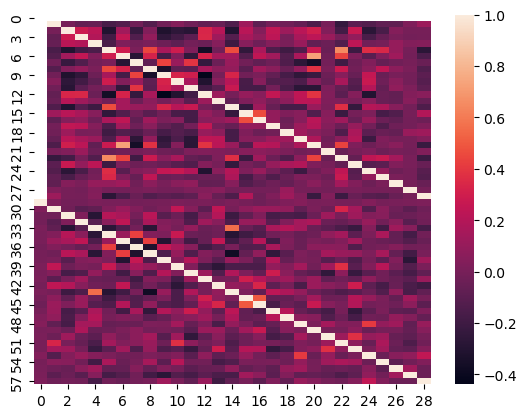

In [91]:
a=np.corrcoef(Pre_Trace[indices_0])
b=np.corrcoef(Pos_Trace[indices_1])
c=np.vstack((a,b))
sns.heatmap(c)
#print(f'{a}\n{b}\n{c}')

In [ ]:
sns.heatmap(np.corrcoef(Pre_Trace[indices_0[np.where(Astd_df_clean[0]<=Astd_df_clean[1])[0]]]))

In [ ]:
sns.heatmap(np.corrcoef(Pos_Trace[indices_1[np.where(Astd_df_clean[0]<=Astd_df_clean[1])[0]]]))
#np.where(indices_0[Astd_df_clean[0]<Astd_df_clean[1]])

In [ ]:
sns.heatmap(matchesdf.iloc[:,15:17])

In [ ]:
for k in range(len(globals()[f'idx{index}_coord'][:,0])):
      xa = globals()[f'idx{index}_coord'][k,0]
      ya = globals()[f'idx{index}_coord'][k,1]
      plt.scatter(x=xa, y=ya,s = 0.8, c='g')
      plt.annotate(f"Match {match}", (Pre_CenterOfMass[match[0]][1], Pre_CenterOfMass[match[0]][0]), textcoords="offset points", xytext=(0, 10), ha='center', fontsize=8, color='black')

for select in PosClusters:
  for index in (select):
    index=int(index)
    for k in range(len(globals()[f'idx{index}_coord1'][:,0])):
      xa = globals()[f'idx{index}_coord1'][k,0]
      ya = globals()[f'idx{index}_coord1'][k,1]
      plt.scatter(x=xa, y=ya,s = 0.8, c='r')
      plt.annotate(f"Match {match}", (Pre_CenterOfMass[match[0]][1], Pre_CenterOfMass[match[0]][0]), textcoords="offset points", xytext=(0, 10), ha='center', fontsize=8, color='black')
plt.imshow(PnrPre)

In [ ]:
for j in PreClusters12:
    if j.size==0:
        continue
    elif j.size==1:
        continue
    else:
        fig,ax=plt.subplots(len(j),1,figsize=(15,len(j)*5))
        for l,i in enumerate(j):
            ax[l].plot(Pre_x[::10],Pre_Trace[i][::10]-Pre_Trace[i][::10].min())
            #ax[l].plot(Pre_x,(Pre_Trace[Pre_C12[l]].std())*np.ones(len(Pre_x)),c='r')
            ax[l].set_title(f'Neuron: {i}')
            ax[l].set_xticks(Ttick)
            ax[l].set_xticklabels(protocol)
            #ax[l].set_xlim(0,12)
            
            for i in range(0,24,1):
                if i%2==0:
                    ax[l].axvspan(i/2,(i/2)+0.5,facecolor='#9999',alpha=0.5)
        plt.show()
        plt.tight_layout()
        plt.title(f'Cluster {l+1}')
            #plt.savefig(f"F:/IC/caimandata/Cluster: {l+1}.svg",format='svg')
            #ax.plot(Pre_x,Pre_Trace[i]-Pre_Trace[i].min())
            #ax.plot(Pre_x,(Pre_Trace[Pre_C12[0]].std())*np.ones(len(Pre_x)))
            #ax.set_title(f'Cluster :{j+1}')

Aqui

In [ ]:
Pre_x=np.linspace(0,12,len(Pre_Trace[0]))
Pos_x=np.linspace(0,12,len(Pos_Trace[0]))

In [ ]:
%matplotlib inline
o=11
if len(Pre_C12[o])!=0:
    fig,ax=plt.subplots(2*len(Pre_C12[o][:5]),1,figsize=(15,20))
else:
    print('No Neurons in this cluster')
for l,i in enumerate(Pre_C12[o][:5]):
    ax[l*2].plot(Pre_x[::10],Pre_Trace[i][::10]-Pre_Trace[i][::10].min(),c=f'#10{l}{l}{l}0')
    ax[l*2].plot(Pre_x,(Pre_Trace[Pre_C12[o]].std())*np.ones(len(Pre_x)),c='r')
    ax[l*2].set_title(f'Neuron: {i}')
    ax[l*2].set_xticks(Ttick)
    ax[l*2].set_xticklabels(protocol)
    #ax[l].set_xlim(0,12)
    ax[l*2].set_ylabel('Fluorescence [AU]')
    ax[l*2].set_xlabel('Frequency [kHz]')
    for j in matches:
        if i==j[0]:
            ax[l*2+1].plot(Pos_x,(Pos_Trace[j[1]].std())*np.ones(len(Pos_x)),c='r')
            ax[l*2+1].plot(Pos_x[::10],Pos_Trace[j[1]][::10]-Pos_Trace[j[1]][::10].min(),c=f'#99{l}{l}{l}0')
            ax[l*2+1].set_title(f'Neuron: {j[1]}')
            ax[l*2+1].set_xticks(Ttick)
            ax[l*2+1].set_xticklabels(protocol)
            #ax[l].set_xlim(0,12)
            ax[l*2+1].set_ylabel('Fluorescence [AU]')
            ax[l*2+1].set_xlabel('Frequency [kHz]')
            for i in range(24):
                if i%2==0:
                    ax[l*2+1].axvspan(i/2,(i/2)+0.5,facecolor='#9999',alpha=0.5)            
                    ax[l*2].axvspan(i/2,(i/2)+0.5,facecolor='#9999',alpha=0.5)


plt.tight_layout()
plt.subplots_adjust(hspace=0.7)
#plt.savefig(f"F:/IC/caimandata/Cluster{o}Trace.svg",format='svg')
plt.show()

## Beauty overlap

In [ ]:

##
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 8))


for k in range(len(globals()[f'idx{Pair[0]}_coord'][:,0])):
      xa = globals()[f'idx{Pair[0]}_coord'][k,0]
      ya = globals()[f'idx{Pair[0]}_coord'][k,1]
      ax1.scatter(x=xa, y=ya,s = 0.8, c='g')
      #ax1.annotate(f"Cell {Pair[0]}", (Pre_CenterOfMass[Pair[0]][1], Pre_CenterOfMass[Pair[0]][0]), textcoords="offset points", xytext=(10, 10), ha='center', fontsize=8, color='black')
ax1.set_title('Pre Trauma cell position')
ax1.imshow(PnrPre)

#ndex=int(3)
for k in range(len(globals()[f'idx{Pair[1]}_coord1'][:,0])):
      xa = globals()[f'idx{Pair[1]}_coord1'][k,0]
      ya = globals()[f'idx{Pair[1]}_coord1'][k,1]
      ax2.scatter(x=xa, y=ya,s = 0.8, c='r')
      #ax2.annotate(f"Cell {Pair[1]}", (Pos_CenterOfMass[Pair[1]][1], Pos_CenterOfMass[Pair[1]][0]), textcoords="offset points", xytext=(10, 10), ha='center', fontsize=8, color='black')
ax2.set_title('Pos Trauma cell position')
ax2.imshow(PnrPos)


#index=int(10)
for k in range(len(globals()[f'idx{Pair[0]}_coord'][:,0])):
      xa = globals()[f'idx{Pair[0]}_coord'][k,0]
      ya = globals()[f'idx{Pair[0]}_coord'][k,1]
      ax3.scatter(x=xa, y=ya,s = 0.8, c='g')
ax3.imshow(PnrPre)
index=int(3)
for k in range(len(globals()[f'idx{Pair[1]}_coord1'][:,0])):
      xa = globals()[f'idx{Pair[1]}_coord1'][k,0]
      ya = globals()[f'idx{Pair[1]}_coord1'][k,1]
      ax3.scatter(x=xa, y=ya,s = 0.8, c='r')
      #ax3.annotate(f"Cell {Pair}", (Pos_CenterOfMass[Pair[1]][1], Pos_CenterOfMass[Pair[1]][0]), textcoords="offset points", xytext=(10, 10), ha='center', fontsize=8, color='w')
ax3.set_title('Pre and Pos Trauma position overlapped')
ax3.imshow(PnrPre)
#plt.savefig(f'F:/IC/CAIMANDATA/Overlaped.sv$g',format='svg')
plt.show()


In [ ]:
print(len(np.unique(PossiblePre_idx))/len(PossiblePre_idx))
print(len(Pre_idx)/len(Pos_idx))

print(len(np.unique(PossiblePos_idx))/len(PossiblePos_idx))


print(f"Values:\n{len(not_repeated_values)}\n{len(repeated_values)}")

In [ ]:
import math

num_matches = len(matches)
num_rows = math.ceil(num_matches / 5)

fig, axs = plt.subplots(num_rows, 5, figsize=(20, num_rows*3))

for i, match in enumerate(matches):
    row = i // 5
    col = i % 5
    
    ax = axs[row, col]
    ax.scatter(Pre_CenterOfMass[match[0]][1], Pre_CenterOfMass[match[0]][0], c='g')
    ax.scatter(Pos_CenterOfMass[match[1]][1], Pos_CenterOfMass[match[1]][0], c='r')
    ax.annotate(f"Match {match}", (Pre_CenterOfMass[match[0]][1], Pre_CenterOfMass[match[0]][0]), textcoords="offset points", xytext=(0, 10), ha='center', fontsize=8, color='white')
    ax.imshow(PnrPre)

# Remove empty subplots
for i in range(num_matches, num_rows*5):
    row = i // 5
    col = i % 5
    axs[row, col].axis('off')

plt.tight_layout()
plt.show()
    

In [ ]:

Pre_repeated_positions = []
Pos_repeated_positions = []
for i in range(len(NewaPossible_Matches[0])):
    if NewaPossible_Matches[0][i] in NewaPossible_Matches[0][i+1:]:
        Pre_repeated_positions.append(i)
for i in range(len(NewaPossible_Matches[1])):
    if NewaPossible_Matches[1][i] in NewaPossible_Matches[1][i+1:]:
        Pos_repeated_positions.append(i)
print(Pos_repeated_positions)


In [ ]:
print(f'{len(NewaPossible_Matches[0][Pre_repeated_positions])}\n\n{len(NewaPossible_Matches[1][Pos_repeated_positions])}')


In [ ]:
PreNormalNeurons=np.array([])
PosNormalNeurons=np.array([])
for i in PossiblePre_idx:
  if len(globals()[f'idx{int(i)}_coord'][:,0])<=70:
    PreNormalNeurons=(np.append(PreNormalNeurons,int(i))).astype(int)
for i in PossiblePos_idx:
  if len(globals()[f'idx{int(i)}_coord1'][:,0])<=70:
    PosNormalNeurons=(np.append(PosNormalNeurons,int(i))).astype(int)
#print(len(PreNormalNeurons))
print((PreNormalNeurons))
print((PosNormalNeurons))


In [ ]:
test=np.where(Pre_Trace[:]==PreNormalNeurons[:])[0]
print(test)
np.unique(PreNormalNeurons)
pretes = fpre['estimates']['C'][np.unique(PreNormalNeurons)]
print(pretes)

In [ ]:
for i in PreNormalNeurons:
  testarr=np.stack(Pre_Trace[i])
print(np.shape(testarr))

In [ ]:
from sklearn.linear_model import LogisticRegression

# Combine the cluster matrices and create labels for each data point
X = np.vstack((Precluster_matrix, Poscluster_matrix))
y = np.concatenate((np.zeros(len(Pre_Trace)), np.ones(len(Pos_Trace))))

# Split the data into training and testing sets
from sklearn.model_selection import  train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=95)

# Fit a logistic regression model on the training set
model = LogisticRegression()
model.fit(X_train, y_train)

# Evaluate the model on the testing set
accuracy = model.score(X_test, y_test)
print("Accuracy:", accuracy)

In [ ]:
# Importing the libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score
# Splitting the dataset into the Training set and Test set


# Creating a Polynomial Regression model
poly_reg = PolynomialFeatures(degree = 10)
X_poly = poly_reg.fit_transform(X_train)
lin_reg = LinearRegression()
lin_reg.fit(X_poly, y_train)

# Predicting the output using the Test set
y_pred = lin_reg.predict(poly_reg.transform(X_test))

# Evaluating the performance of the model
r2_score(y_test, y_pred)


In [ ]:
#print(len(np.unique(NewaPossible_Matches[0])))
Pre_Trace1 = fpre['estimates']['C'][np.unique(NewaPossible_Matches[0])]

Pos_Trace1= fpos['estimates']['C'][np.unique(NewaPossible_Matches[1])]


In [ ]:

totals=np.stack((NewaPossible_Matches[0],NewaPossible_Matches[1]))
#
# Convert the raw traces to a feature matrix
PreX = np.vstack(Pre_Trace)
PosX = np.vstack(Pos_Trace)
# Perform K-means clustering with 11 clusters
Prekmeans = KMeans(n_clusters=35, random_state=0).fit(PreX)
Poskmeans = KMeans(n_clusters=35, random_state=0).fit(PosX)
# Assign each raw trace to a cluster
Prelabels = Prekmeans.predict(PreX)
Poslabels = Poskmeans.predict(PosX)
# Create a matrix where each row corresponds to a raw trace and each column corresponds to a cluster
Precluster_matrix = np.zeros((len(Pre_Trace), 35))
Poscluster_matrix = np.zeros((len(Pos_Trace), 35))
for i in range(len(Pre_Trace)):
    Precluster_matrix[i, Prelabels[i]] = 1
for i in range(len(Pos_Trace)):
    Poscluster_matrix[i, Poslabels[i]] = 1
# Create a heatmap of the cluster matrix
#

In [ ]:
for select in PreClusters:
  for index in (select):
    index=int(index)
    for k in range(len(globals()[f'idx{index}_coord'][:,0])):
      xa = globals()[f'idx{index}_coord'][k,0]
      ya = globals()[f'idx{index}_coord'][k,1]
      plt.scatter(x=xa, y=ya,s = 0.8, c='g')
      plt.annotate(f"Match {match}", (Pre_CenterOfMass[match[0]][1], Pre_CenterOfMass[match[0]][0]), textcoords="offset points", xytext=(0, 10), ha='center', fontsize=8, color='black')

for select in PosClusters:
  for index in (select):
    index=int(index)
    for k in range(len(globals()[f'idx{index}_coord1'][:,0])):
      xa = globals()[f'idx{index}_coord1'][k,0]
      ya = globals()[f'idx{index}_coord1'][k,1]
      plt.scatter(x=xa, y=ya,s = 0.8, c='r')
      plt.annotate(f"Match {match}", (Pre_CenterOfMass[match[0]][1], Pre_CenterOfMass[match[0]][0]), textcoords="offset points", xytext=(0, 10), ha='center', fontsize=8, color='black')
plt.imshow(PnrPre)

In [ ]:
tamanhoideal=np.array([])
for select in PreClusters:
  for index in (select):
    index=int(index)
    tamanhoideal=np.append(tamanhoideal,len(globals()[f'idx{index}_coord'][:,0]))
print(f'{tamanhoideal.std()+tamanhoideal.mean()}')

In [ ]:
# Convert the image to grayscale
gray = cv2.cvtColor(PnrPre-PnrPos, cv2.COLOR_BGR2GRAY)

# Apply a threshold to the grayscale image
thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)[1]

# Convert the thresholded image to binary
binary = cv2.threshold(thresh, 0, 255, cv2.THRESH_BINARY)[1]
# Display the binary image
cv2.imshow('Binary Image', binary)
cv2.waitKey(0)
cv2.destroyAllWindows()
#plt.imshow((PnrPre-PnrPos))

In [ ]:
indices = np.where(np.isin(Pre_C[6], Pre_idx))[0]
print(Pre_C[6][indices])
fig, axs = plt.subplots()
for index in (Pre_C[6][indices]):
    print(index)
    plt.plot(Pre_Trace[index], c='g')
    plt.show()

In [ ]:
PreSelecText=['Pre_C1', 'Pre_C2', 'Pre_C3', 'Pre_C4', 'Pre_C5', 'Pre_C6', 'Pre_C7', 'Pre_C8', 'Pre_C9', 'Pre_C10', 'Pre_C11', 'Pre_C12']
PosSelecText=['Pos_C1', 'Pos_C2', 'Pos_C3', 'Pos_C4', 'Pos_C5', 'Pos_C6', 'Pos_C7', 'Pos_C8', 'Pos_C9', 'Pos_C10', 'Pos_C11', 'Pos_C12']

select=Pre_C[1][indices]

fig, axs = plt.subplots(len(select), 1, figsize=(20, 25), constrained_layout=False)
x = np.linspace(0,12,len(Pre_Trace[0][963::10]))
for ax, index in zip(axs.flat,select):
    ax.set_title(f'ID={index}')
    ax.plot(x, Pre_Trace[index][963::10]-Pre_Trace[index][963::10].min(), lw=0.9)
    ax.set_xticks(np.arange(0,12,0.5))
    ax.set_xlim(0,12)
    ax.set_xlabel('Frequency [kHz]')
    ax.set_xticklabels(protocol)
    ax.set_ylabel('[DF/F]')
    ax.grid()
    for i in range(0, 24, 1):
        if i % 2 == 0:
            ax.axvspan(i/2, (i/2)+0.5, facecolor='#9999', alpha=0.5)
#fig.savefig(f"C:/Users/gabri/Desktop/Prog/LAbp/NeuroProg/Pesquisa/{PreSelecText[1]}.svg",format="svg")

In [ ]:
print(sorted(np.append(selectpre1,selectpre)))

In [ ]:
selectpre=Pre_C2[np.where(np.isin(Pre_C2, [35, 217, 227, 292, 484], assume_unique=True))[0]].astype(int)
selectpre1=Pre_C10[np.where(np.isin(Pre_C10, [24,187]))[0]]
selectpre=sorted(np.append(selectpre1,selectpre))
selectpos= Pos_C2


fig, axs = plt.subplots(len(selectpos), 2, figsize=(25, 17), constrained_layout=True)
x1 = np.linspace(0, 12, len(Pre_Trace[0][963::10]))
x2 = np.linspace(0, 12, len(Pos_Trace[0][164::10]))

for ax, index in zip(axs[:, 1].flat, selectpos):
    ax.set_title(f'ID={index}')
    ax.plot(x2, Pos_Trace[index][164::10] - Pos_Trace[index][164::10].min(), lw=0.9, c='r')
    ax.set_xticks(np.arange(0, 12, 0.5))
    ax.set_xlim(0, 12)
    ax.set_xlabel('Frequency [Hz]')
    ax.set_xticklabels(protocol)
    ax.set_ylabel('Fluorescence [Au]')
    ax.grid()
    for i in range(0, 24, 1):
        if i % 2 == 0:
            ax.axvspan(i / 2, (i / 2) + 0.5, facecolor='#9999', alpha=0.5)

for ax, indexe in zip(axs[:, 0].flat, selectpre):
    ax.set_title(f'ID={indexe}')
    ax.plot(x1, Pre_Trace[indexe][963::10] - Pre_Trace[indexe][963::10].min(), lw=0.9, c='g')
    ax.set_xticks(np.arange(0, 12, 0.5))
    ax.set_xlim(0, 12)
    ax.set_xlabel('Frequency [kHz]')
    ax.set_xticklabels(protocol)
    ax.set_ylabel('[DF/F]')
    ax.grid()
    for i in range(0, 24, 1):
        if i % 2 == 0:
            ax.axvspan(i / 2, (i / 2) + 0.5, facecolor='#9999', alpha=0.5)

            


In [ ]:
na=25
ao=13
fig,axs=plt.subplots(1,1,figsize=(25, 10), constrained_layout=True)
axs.plot(Pre_Trace[na][964::]-Pre_Trace[na][964::].min(),'g')
axs.plot(Pos_Trace[ao][164::]-Pos_Trace[ao][164::].min(),'r')
axs.set_xticks(np.arange(0,12,0.5))
axs.set_xlim(0,12)
axs.set_xlabel('Frequency [kHz]')
axs.set_xticklabels(protocol)
axs.set_ylabel('[DF/F]')

axs.grid()
for i in range(0, 24, 1):
    if i % 2 == 0:
        axs.axvspan(i/2, (i/2)+0.5, facecolor='#9999', alpha=0.5)
        
plt.show()

plt.scatter(Pre_CenterOfMass[na][1],Pre_CenterOfMass[na][0],c='g')
plt.scatter(Pos_CenterOfMass[ao][1],Pos_CenterOfMass[ao][0],c='r')
plt.imshow(PnrPre)

In [ ]:
fig,axs=plt.subplots(1,1,figsize=(15, 10))
for i in matches[3:6]:
    axs.plot(x1,Pre_Trace[i[0]][963::10],'g')
    axs.plot(x2,Pos_Trace[i[1]][164::10],'r')
#plt.plot(x1,Pre_Trace[95][963::10]-Pre_Trace[95][963::10].min(), lw=0.9,c='g')
#plt.plot(x2,Pos_Trace[4][164::10]-Pos_Trace[63][164::10].min(), lw=0.9,c='r')

In [ ]:


fig, axs = plt.subplots(4, 4, figsize=(20, 20), constrained_layout=True)

for i, select in enumerate(PreClusters):
    row = i // 4
    col = i % 4
    for index in select:
        index = int(index)
        for k in range(len(globals()[f'idx{index}_coord'][:, 0])):
            xa = globals()[f'idx{index}_coord'][k, 0]
            ya = globals()[f'idx{index}_coord'][k, 1]
            axs[row, col].scatter(x=xa, y=ya, s=0.8, c='g')
            axs[row, col].set_title(f'PreCluster {i+1}')
            axs[row, col].set_xlabel('X')
            axs[row, col].set_ylabel('Y')
            #axs[row, col].set_xlim(0, image_width)  # Adjust the x-axis limits if needed
            #axs[row, col].set_ylim(0, image_height)  # Adjust the y-axis limits if needed
            axs[row, col].invert_yaxis()  # Invert the y-axis if needed
    axs[row, col].imshow(PnrPre)

plt.show()


In [ ]:
ajudst=Pos_Trace[index][-1]
print(ajudst)

In [ ]:
PreClusterMean = np.zeros((1, len(PreClusters)))
AllMean = np.vstack((AllMean, abs(Pre_Trace[index].mean())))
AllMean = np.vstack((AllMean, abs(Pos_Trace[index].mean())))


In [ ]:
print(np.shape(matches))

In [ ]:
Preshape = (1, len(Pre_Trace))
Posshape = (1, len(Pos_Trace))
PreClusterMax=np.zeros(shape)
print(PreClusterMax.shape)

In [ ]:
PosClusters12

## aqui

#### Move PRe bAse to Top

In [ ]:

        
for i in range(len(PreClusters12)):
  if PreClusters12[i].size==0:
    continue
  else:
    PreClusterSum=np.append(PreClusterSum,len(PreClusters12[i]))
    PreClusterSum=np.sum(PreClusterSum).astype(int)
    PosClustersSum=np.append(PosClustersSum,len(PosClusters12[i]))
    PosClustersSum=np.sum(PosClustersSum).astype(int)
for select, k in enumerate(PreClusters12):
  for index in k:
    PreClusterMean=np.append(PreClusterMean,(abs(Pre_Trace[index].mean())))
    PreClusterMax=np.append(PreClusterMax,(abs(Pre_Trace[index].max())))
    PreClusterStd=np.append(PreClusterStd,(abs(Pre_Trace[index].std())))
    PreClusterVelocity=np.append(PreClusterVelocity,(abs(np.diff(Pre_Trace[index][963::10])).mean())  )     

for select,k in enumerate(PosClusters12):
  for index in k:
    PosClusterMean=np.append(PosClusterMean,(abs(Pos_Trace[index].mean())))
    PosClusterStd=np.append(PosClusterStd,(abs(Pos_Trace[index].std())))
    PosClusterMax=np.append(PosClusterMax,(abs(Pos_Trace[index].max())))
    PosClusterVelocity=np.append(PosClusterVelocity,(abs(np.diff(Pos_Trace[index][169::10])).mean()))

Result_Mean=np.append(PreClusterMean,PosClusterMean)
Result_Std=np.append(PreClusterStd,PosClusterStd)
Result_Max=np.append(PreClusterMax,PosClusterMax)
Result_MeanVelocity=np.append(PreClusterVelocity,PosClusterVelocity)

In [ ]:


fig, ax = plt.subplots(1, 4, figsize=(18, 5))
ax[0].hist(Result_Mean[np.isfinite(Result_Mean)], bins=20)
ax[0].set_xlabel('Mean')
ax[0].set_ylabel('Frequency')
ax[0].set_title('Histogram of Mean')
ax[1].hist(Result_Std[np.isfinite(Result_Std)], bins=20)
ax[1].set_xlabel('Std')
ax[1].set_ylabel('Frequency')
ax[1].set_title('Histogram of Std')
ax[2].hist(Result_Max[np.isfinite(Result_Max)], bins=20)
ax[2].set_xlabel('Max')
ax[2].set_ylabel('Frequency')
ax[2].set_title('Histogram of Max')
ax[3].hist(Result_MeanVelocity, bins=20)
ax[3].set_xlabel('Mean Activity')
ax[3].set_ylabel('Frequency')
ax[3].set_title('Histogram of Mean Activity')
print(f'{PreClusterVelocity.mean()} std: {PreClusterVelocity.std()}\n {PosClusterVelocity.mean() } std: {PosClusterVelocity.std()}')
#plt.savefig(f"C:/Users/gabri/Desktop/Prog/LAbp/NeuroProg/Pesquisa/Histogram of Mean Velocity.svg",format="svg")
plt.show()


In [ ]:
%matplotlib inline
# Define the data
periods = ['Pre Trauma', 'Pos Trauma']
mean_activities = [PreClusterVelocity.mean(), PosClusterVelocity.mean()]
std_activities = [PreClusterVelocity.std(), PosClusterVelocity.std()]

# Create the bar plot with error bars
plt.bar(periods,std_activities, yerr=mean_activities,  capsize=5)

# Add labels and title
plt.xlabel('Period')
plt.ylabel('Mean Activity')
plt.title('Comparison of Mean Activities')

# Show the plot
#plt.savefig(f"F:/IC/CAIMANDATA/Mean Activities.svg",format="svg")
plt.show()


In [ ]:
%matplotlib Qt
fig, axs = plt.subplots(len(Pre_C4), 1, figsize=(15, 16), constrained_layout=True)
x = np.linspace(0,12,len(Pre_Trace[0]))
for ax, index in zip(axs.flat,Pre_C4):
    ax.set_title(f'ID={index}')
    ax.plot(x, Pre_Trace[index], lw=0.9)
    ax.set_xticks(np.arange(0,12,0.5))
    ax.set_xlim(0,12)
    ax.set_xlabel('Frequency [Hz]')
    ax.set_xticklabels(protocol)
    ax.set_ylabel('Fluorescence [Au]')
    ax.grid()
    for i in range(0, 24, 1):
        if i % 2 == 0:
            ax.axvspan(i/2, (i/2)+0.5, facecolor='#9999', alpha=0.5)

In [ ]:
plt.plot(PreClusterVelocity,c='g')
plt.plot(PosClusterVelocity,c='r')

In [ ]:
PreClusterVelocity

In [ ]:
print(f'{PreClusterVelocity.mean()}\n{PosClusterVelocity.mean()}')

In [ ]:
import numpy as np

matches_array = np.array([np.array(t) for t in matches])
matches_array


In [ ]:
Pre_Data = fpre['estimates']['S']#[np.unique(PreNormalNeurons)]
Pos_Data= fpos['estimates']['S']#[np.unique(PosNormalNeurons)]
Pos_Data = np.hstack((Pos_Data, np.zeros((435, 1))))

# Convert the raw traces to a feature matrix
#
# Convert the raw traces to a feature matrix
PreaX = np.vstack(Pre_Data)
PosaX = np.vstack(Pos_Data)
# Perform K-means clustering with 11 clusters
Preakmeans = KMeans(n_clusters=12, random_state=0).fit(PreaX)
Posakmeans = KMeans(n_clusters=12, random_state=0).fit(PosaX)
# Assign each raw trace to a cluster
Prealabels = Preakmeans.predict(PreaX)
Posalabels = Posakmeans.predict(PosaX)
# Create a matrix where each row corresponds to a raw trace and each column corresponds to a cluster
Preacluster_matrix = np.zeros((len(Pre_Data), 12))
Posacluster_matrix = np.zeros((len(Pos_Data), 12))
for i in range(len(Pre_Data)):
    Preacluster_matrix[i, Prealabels[i]] = 1
for i in range(len(Pos_Data)):
    Posacluster_matrix[i, Posalabels[i]] = 1

In [ ]:

print("Indices 0:", len(indices_0))
print("Indices 1:", len(indices_1))

    


In [ ]:
Pos_Trace[indices_1] += 0
Pos_Trace[indices_1].shape


In [ ]:
Pre_Trace[indices_0].reshape(-1, Pre_Trace.shape[1])

print(Pos_Trace[indices_1].shape)

In [ ]:
fig,axs=plt.subplots(1,1,figsize=(15, 15))
# Create the correlation matrix
correlation_matrix = np.corrcoef(Pre_Trace[indices_0], Pos_Trace[indices_1])

# Plot the correlation matrix
axs.imshow(correlation_matrix, cmap='coolwarm')

# Add a darker line in the middle section
axs.axvline(x=len(indices_0), color='black', linewidth=2)
axs.axhline(y=len(indices_1), color='black', linewidth=2)

axs.set_title('Correlation Matrix')
axs.set_xlabel('Pos_Trace')
axs.set_ylabel('Pre_Trace')
plt.show()


In [ ]:
from sklearn.metrics import confusion_matrix
# Limit Pre_Data and Pos_Data based on matches array
Pre_Data1 = Pre_Data[matches_array[:][0]]
Pos_Data2 = Pos_Data[matches_array[:][1]]
print(np.shape(Pre_Data[matches_array[:]]))


In [ ]:
matches[1]

In [ ]:
sorted_Preacluster = Preacluster_matrix[np.argsort(Prealabels)]
sorted_Posacluster = Posacluster_matrix[np.argsort(Posalabels)]
print(sorted_Preacluster)
print(sorted_Posacluster)

In [ ]:
data = Pre_Trace[13][963::10]

# Calculate the time interval between data points
time_interval = abs(np.mean(np.diff(data)))
#time_interval = abs(np.mean(np.diff(data)))


# Calculate the frequency
frequency = 1 / time_interval

print(f"The frequency of the given array is: {frequency} Hz")

Pre_data = fpre['estimates']['S'][20][964::10]#Pre_Trace[19][963::10]
Pos_data = fpos['estimates']['S'][13][164::10]

# Calculate the time interval between data points
Pre_time_interval = abs(np.mean(np.diff(Pre_data)))
Pos_time_interval = abs(np.mean(np.diff(Pos_data)))
#time_interval = abs(np.mean(np.diff(data)))


# Calculate the frequency
Pre_frequency = 1 / Pre_time_interval
Pos_frequency = 1 / Pos_time_interval


print(f"The frequency of the given array is: {frequency} Hz")
fig,ax=plt.subplots(1,2)
ax[0].specgram(Pre_data,Fs=Pre_frequency)
ax[1].specgram(Pos_data,Fs=Pos_frequency)


In [ ]:
fig,ax=plt.subplots(1,2)
ax[0].plot(Pre_Trace[13][963::10])
ax[0].plot(abs(np.diff(Pre_data)))

ax[1].plot(np.diff(Pos_data))

In [ ]:
from IPython.display import Audio

# Specify the sampling rate
sampling_rate = 4000

# Play the sound
Audio(Pre_Trace[25], rate=sampling_rate)


In [ ]:


# Define the parameters
duration = 5  # duration in seconds
frequency = 440  # frequency in Hz

# Generate the time axis
t = np.linspace(0, duration, int(duration * 44100), endpoint=False)

# Generate the sine wave
audio = np.sin(2 * np.pi * frequency * t)

# Play the audio
sd.play(audio, samplerate=44100)
sd.wait()


In [ ]:
plt.hist2d(PreClusterVelocity[:len(PosClusterVelocity)],PosClusterVelocity, bins=10)

In [ ]:
print(f'{PreClusterMean.mean()} std: {PreClusterMean.std()}\n {PosClusterMean.mean() } std: {PosClusterMean.std()}')

In [ ]:
# Assuming the array is stored in the variable 'data'
data = Pre_Trace[94][963::10]

# Calculate the time interval between data points
time_interval = abs(np.mean(np.diff(data)))
#time_interval = abs(np.mean(np.diff(data)))


# Calculate the frequency
frequency = 1 / time_interval

print(f"The frequency of the given array is: {frequency} Hz")


In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(15, 8))
#protocol=np.array(['2Hz','Silence', '10Hz','Silence', '17Hz','Silence', '4Hz','Silence', '12Hz','Silence', '18Hz','Silence', '6Hz','Silence', '14Hz','Silence','19Hz','Silence', '8Hz','Silence', '16Hz','Silence', '20Hz','Silence'])
#protocol=protocol.astype(str)
Pretimes1 = np.arange(1, len(Pre_Trace[0][963::10]), 1)
Postimes1 = np.arange(1, len(Pos_Trace[0][169::10]), 1)

ax.plot(Pretimes1, np.diff(Pre_Trace[20][963::10]) / np.diff(Pretimes),c='g')
ax.plot(Postimes1, np.diff(Pos_Trace[13][169::10]) / np.diff(Postimes),c='r',alpha=0.5)
ax.set_xticks(Ttick)

ax.set_xlabel('Frequency [Hz]')
ax.set_title('Activity of Neurons  20 and 13')

ax.set_xticklabels(protocol)
ax.set_ylabel('DFluorescence/dt')


ax.grid()
#plt.savefig(f"C:/Users/gabri/Desktop/Prog/LAbp/NeuroProg/Pesquisa/Activity of Neurons  20 and 13.svg",format="svg")



In [ ]:
data=np.vstack((Result_Mean,Result_Std,Result_Max,Result_MeanVelocity))
dataframe=pd.DataFrame(data=data.T,columns=['Mean','Std','Max','Mean Velocity'])


In [ ]:
sns.heatmap(dataframe.corr(),annot=True)
#plt.savefig(f"C:/Users/gabri/Desktop/Prog/LAbp/NeuroProg/Pesquisa/Heatmap.svg",format="svg")

In [ ]:
sns.pairplot(dataframe, kind='reg', diag_kind='hist')
plt.savefig(f"C:/Users/gabri/Desktop/Prog/LAbp/NeuroProg/Pesquisa/Pairplot.svg",format="svg")

In [ ]:

print("Original shape:", Pos_Trace.shape)

# Add a column of zeros to the array
print("New shape:", Pos_Trace.shape)


In [ ]:
data[1]

In [ ]:
print((PreClusterMean))

In [ ]:
data={'AllMean':AllMean,'PreClusterMean':PreClusterMean,'PosClusterMean':PosClusterMean,'PreClusterMax':PreClusterMax,'PosClusterMax':PosClusterMax,'PreClusterStd':PreClusterStd,'PosClusterStd':PosClusterStd,'PreClusterVelocity':PreClusterVelocity,'PosClusterVelocity':PosClusterVelocity}

In [ ]:
print(len(PreClusterVelocity))

In [ ]:
display(data['AllMean'])

In [ ]:
print(PreClusterMean.mean(),PosClusterMean.mean())
print(f'{PreClusterSum}\n{PosClustersSum}')
print(len(Pos_Trace),len(PreClusters))
plt.hist(PreClusterMean,bins=12,alpha=0.5)
plt.hist(PosClusterMean,bins=12,alpha=0.5)
plt.show()
plt.hist(AllMean,bins=12,alpha=1)

In [ ]:
venn2(subsets =(len(Pre_Trace),len(Pos_Trace),len(matches)),set_labels = ('Pre Trauma Neurons', 'Pos Trauma Neurons','Overlaped Neurons'),set_colors=('green','red'))
plt.title('Neurons in both sessions with possible correlation between session')
#plt.savefig(f"F:/IC/CAIMANDATA/Matches.svg",format="svg")

In [ ]:
matches=np.array(matches)
print(len(np.unique(matches[:,1])))
print(len(np.unique(matches[:,0])))
#print(matches[:,(np.unique(matches[:,1]))])
print(matches[:,matches[:,1]])

In [ ]:
print(len(np.unique(NewaPossible_Matches[1])))

In [ ]:
select=Pos_C1
for index in (select):
  index=int(index)
  plt.annotate(f"Match {index}", (Pos_CenterOfMass[index][1], Pos_CenterOfMass[index][0]), textcoords="offset points", xytext=(0, -20), ha='center', fontsize=8, color='white')
  for k in range(len(globals()[f'idx{index}_coord1'][:,0])):
    xa = globals()[f'idx{index}_coord1'][k,0]
    ya = globals()[f'idx{index}_coord1'][k,1]
    plt.scatter(x=xa, y=ya,s = 0.8, c= 'r' )
plt.title('Pos Trauma Neurons cluster 1') 
plt.imshow(PnrPos)

plt.savefig(f"C:/Users/gabri/Desktop/Prog/LAbp/NeuroProg/Pesquisa/Pos_Trauma_Neurons_cluster_1.svg",format="svg")

## Cluster Plots

In [ ]:
APrelabels
from collections import Counter

# Count occurrences in APos_X
APos_X_counts = Counter(APos_X.flatten())

# Count occurrences in APoslabels
APoslabels_counts = Counter(APoslabels)

# Count occurrences in APoslabels2
APoslabels2_counts = Counter(APoslabels2)

# Count occurrences in APre_X
APre_X_counts = Counter(APre_X.flatten())

# Count occurrences in APrelabels
APrelabels_counts = Counter(APrelabels)

# Print the counts
print("Counts in APos_X:")
print(APos_X_counts)
print()

print("Counts in APoslabels:")
print(APoslabels_counts)
print()

print("Counts in APoslabels2:")
print(APoslabels2_counts)
print()

print("Counts in APre_X:")
print(APre_X_counts)
print()

print("Counts in APrelabels:")
print(APrelabels_counts)

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))

# Create a countplot of the cluster assignments
sns.countplot(x=APrelabels,order=APrelabels,hue=APrelabels ,ax=ax[0])
sns.countplot(x=APoslabels,order=APoslabels,hue=APoslabels ,ax=ax[1])
#for i in range(pd.Series.value_counts(APrelabels)):
    #if i==0:
        #continue
    #else:
        #ax[0].text(i, APrelabels[i], str(APrelabels[i]), ha='center', va='bottom')
#for i in range(len(pd.Series.value_counts(APoslabels))):
    #if i==0:
        #continue
    #else:
        #ax[1].text(i, APoslabels[i], str(APoslabels[i]), ha='center', va='bottom')

# Amplify the resolution of the smaller bars
ax[0].set_title("Cluster Pre Trauma Quantity")
ax[1].set_title("Cluster Pos Trauma Quantity")
ax[0].set_ylim(0, max(ax[0].get_ylim())*1)  # Amplify the y-axis limit of the first plot
ax[1].set_ylim(0, max(ax[1].get_ylim())*1 )  # Amplify the y-axis limit of the second plot

#Cluster_Quantity.svg",format="svg
#plt.savefig(f"F:/IC/CAIMANDATA/Cluster_Quantity1.svg",format="svg")

In [ ]:
%matplotlib Qt
idx = widgets.IntText(value=0,min=0,max=11, description='Cluster :')
def update_frequency(change):
    selector = int(change['new'])  # Convert the value to an integer
    fig, ax = plt.subplots(len(Pre_C[selector]), 1, figsize=(15, 15), constrained_layout=True)
    for i, neuron in enumerate(Pre_C[selector]):
        ax[i].plot(np.linspace(0, 12, len(Pre_Trace[neuron][963::10])), Pre_Trace[neuron][963::10])
        ax[i].set_title(f'Neuron = {neuron}')
        ax[i].set_xticks(np.arange(0, 12, 0.5))
        ax[i].set_xticklabels(protocol)
        for j in range(0, 24, 1):
            if j % 2 == 0:
                ax[i].axvspan(j/2, (j/2)+0.5, facecolor='#9999', alpha=0.5)
    plt.show()
idx.observe(update_frequency, 'value')
display(idx)



### Showing only the good

In [ ]:

for i in range(len(Pre_C)):
    result1 =[idx for idx in Pre_C[i] if idx in Pre_idx]
    result2 =[idx for idx in Pos_C[i] if idx in Pos_idx]
    print(f'Pre Cluster{i} Good idx in {result1}\nPos Cluster{i} Good idx in {result2}\n\n')

In [ ]:
for i in matches:
    for k,j in enumerate(Pre_C12):
        if i[0] in j:
            #print(i[0])
            print(k)
            print('\n')
            
    for k,j in enumerate(Pos_C12):
        if i[1] in j:
            #print(i[1])
            print(k)
            #print('\n')


In [ ]:
for i in matches:
    [pair for pair in i if pair in Pre_idx]


In [ ]:
for i in range(len(Pre_C12)):
    print(np.where(np.isin(Pre_C12[i], matches, assume_unique=True)))

In [ ]:
for i in range(len(matches)):
    plt.scatter(Pre_CenterOfMass[matches[i][0]][1],Pre_CenterOfMass[matches[i][0]][0],c='g')
    plt.scatter(Pos_CenterOfMass[matches[i][1]][1],Pos_CenterOfMass[matches[i][1]][0],c='r')
    plt.imshow(PnrPre)

In [ ]:
for i in range(len(Pre_idx)):
    plt.scatter(Pre_CenterOfMass[Pre_idx[i]][1],Pre_CenterOfMass[Pre_idx[i]][0],c='g')
    plt.imshow(PnrPos)

for i in range(len(Pos_idx)):
    plt.scatter(Pos_CenterOfMass[Pos_idx[i]][1],Pos_CenterOfMass[Pos_idx[i]][0],c='r')
    plt.imshow(PnrPos)

print(len(Prelabels[Prelabels==3]))
for i in range(12):
  
  print(f'Pre cluster number :{i}:{np.where(Prelabels==i)[0]} \n\n')
  print(f'Pos cluster number :{i}:{np.where(Poslabels==i)[0]} \n\n')

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=35)
pca.fit(PreX)
a=np.cumsum(pca.explained_variance_ratio_)
#print(pca.components_)
#print(pca.explained_variance_)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
print(a.max())

In [ ]:
pca.fit(PosX)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
a=np.cumsum(pca.explained_variance_ratio_)
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
print(a.max())

In [ ]:
from sklearn.ensemble import IsolationForest
PreXclf = IsolationForest(contamination=0.1)  # Adjust the contamination parameter as needed
PreXclf.fit(PreX)
PreXpredictions = PreXclf.predict(PreX)
PreXoutliers = PreX[PreXpredictions == -1]
print(PreXoutliers[:])

PosXclf = IsolationForest(contamination=0.1)  # Adjust the contamination parameter as needed
PosXclf.fit(PosX)
PosXpredictions = PosXclf.predict(PosX)
PosXoutliers = PosX[PosXpredictions == -1]
print(PosXoutliers[:])



In [ ]:
PrePred=(np.where(PreXpredictions==-1)[0])
PoSpred=(np.where(PosXpredictions==-1)[0])
print(f'{len(PrePred)} Pre Trauma Outliers\n{len(PoSpred)} Pos Trauma Outliers')

In [ ]:
t=np.array([2,'Silence', 10,'Silence', 17,'Silence', 4,'Silence', 12,'Silence', 18,'Silence', 6,'Silence', 14,'Silence',19,'Silence', 8,'Silence', 16,'Silence', 20,'Silence'])
t=t.astype(str)
print(t)

In [ ]:
#print(np.where(predictions==-1)[0])
fig, axs = plt.subplots(len(Pre_Indices4), 1, figsize=(15, 30), constrained_layout=True)
x = np.linspace(0,12,len(Pre_Trace[0][963::7]))

for ax, index in zip(axs.flat,Pre_Indices4):
    ax.set_title(f'ID={index}')
    ax.plot(x, Pre_Trace[index][963::7], lw=0.9)
    ax.set_xticks(np.arange(0,12,0.5))
    ax.set_xlim(0,12)
    ax.set_xlabel('Frequency [Hz]')
    ax.set_xticklabels(protocol)
    ax.set_ylabel('Fluorescence [Au]')
    ax.grid()
    for i in range(0, 24, 1):
        if i % 2 == 0:
            ax.axvspan(i/2, (i/2)+0.5, facecolor='#9999', alpha=0.5)
plt.show()
#print(np.where(predictions==-1)[0])

In [ ]:
fig, axs = plt.subplots(len(PoSpred), 1, figsize=(15, 30), constrained_layout=True)
x = np.linspace(0,12,len(Pos_Trace[0][164::10]))
for ax, index in zip(axs.flat,PoSpred):
    ax.set_title(f'ID={index}')
    ax.plot(x, Pos_Trace[index][164::10], lw=0.9)
    ax.set_xticks(np.arange(0,12,0.5))
    ax.set_xlim(0,12)
    ax.set_xlabel('Time [Min]')
    ax.set_ylabel('Fluorescence [Au]')
    ax.grid()

In [ ]:
for index in (PrePred):
  index=int(index)
  if len(globals()[f'idx{index}_coord'][:,0]) <100:
    for k in range(len(globals()[f'idx{index}_coord'][:,0])):
      xa = globals()[f'idx{index}_coord'][k,0]
      ya = globals()[f'idx{index}_coord'][k,1]
      plt.scatter(x=xa, y=ya,s = 0.8, c= 'g' )
for index in (PoSpred):
  index=int(index)
  if len(globals()[f'idx{index}_coord'][:,0]) <100:
    for k in range(len(globals()[f'idx{index}_coord'][:,0])):
      xa = globals()[f'idx{index}_coord'][k,0]
      ya = globals()[f'idx{index}_coord'][k,1]
      plt.scatter(x=xa, y=ya,s = 0.8, c= 'r' )
plt.imshow(PnrPos)
plt.show()

In [ ]:
ch=120
fig, ax = plt.subplots(2 ,1, figsize=(15, 5), constrained_layout=True)
for k in range(len(globals()[f'idx{ch}_coord'][:,0])):
    xa = globals()[f'idx{ch}_coord'][k,0]
    ya = globals()[f'idx{ch}_coord'][k,1]
    ax[0].scatter(x=xa, y=ya,s = 0.8, c= 'r' )
ax[0].imshow(PnrPre)
print(len(globals()[f'idx{ch}_coord'][:,0]))
x = np.linspace(0,12,len(Pre_Trace[0][963::10]))

ax[1].set_title(f'ID={ch}')
ax[1].plot(x, Pre_Trace[ch][963::10], lw=0.9)
ax[1].set_xticks(np.arange(0,12,0.5))
ax[1].set_xlim(0,12)
ax[1].set_xlabel('Time [Min]')
ax[1].set_ylabel('Fluorescence [Au]')
ax[1].grid()


In [ ]:
fig, axs = plt.subplots(len(PrePred), 1, figsize=(15, 30), constrained_layout=True)
x =np.linspace(0,12, len(np.diff(Pre_Trace[13][963::10])))
for ax, index in zip(axs.flat,PrePred):
    ax.set_title(f'ID={index}')
    y = np.diff(Pre_Trace[index][963::10])/len(Pre_Trace[index][963::10])

    ax.plot(x, y, lw=0.9)
    ax.set_xticks(np.arange(0,12,0.5))
    ax.set_xlim(0,12)
    ax.set_xlabel('Time [Min]')
    ax.set_ylabel('Fluorescence [Au]')
    ax.grid()
plt.show()

In [ ]:
fig, axs = plt.subplots(len(PrePred), 1, figsize=(15, 30), constrained_layout=True)
x =np.linspace(0,12, len((Pre_Trace[13][963::10])))
for ax, index in zip(axs.flat,PrePred):
    ax.set_title(f'ID={index}')
    y =(Pre_Trace[index][963::10])

    ax.plot(x, y, lw=0.9)
    ax.set_xticks(np.arange(0,12,0.5))
    ax.set_xlim(0,12)
    ax.set_xlabel('Time [Min]')
    ax.set_ylabel('Fluorescence [Au]')
    ax.grid()
plt.show()

In [1]:

x =np.linspace(0,12, len(np.diff(Pre_Trace[85][963::10])))
y = np.diff(Pre_Trace[121][963::10])
#print(len(y))
fig,ax=plt.subplots(2,1,figsize=(60, 10))
ax[0].plot(x, (y))
ax[1].plot(np.linspace(0,12, len((Pre_Trace[85][963::10]))), (Pre_Trace[121][963::10]))

# Set grid color to a darker shade of gray'

# Set grid color for both subplots
# Set xticks for both subplots
ax[0].set_xticks(np.arange(0,12,0.5))
ax[1].set_xticks(np.arange(0,12,0.5))
for i in range(0, 24, 1):
    if i % 2 == 0:
        ax[0].axvspan(i/2, (i/2)+0.5, facecolor='#9999', alpha=0.5)
        ax[1].axvspan(i/2, (i/2)+0.5, facecolor='#9999', alpha=0.5)


NameError: name 'np' is not defined

In [ ]:
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

# define the function to fit
def func(x, a, b, c):
    return a * x**2 + b * x + c

# create some sample data
x = np.linspace(0, 10, 100)
y = 2 * x**2 + 3 * x + 1 + np.random.normal(scale=0.5, size=len(x))

# fit the function to the data
popt, pcov = curve_fit(func, x, y)

# plot the data and the fitted function
fig, ax = plt.subplots()
ax.plot(x, y, 'b.', label='data')
ax.plot(x, func(x, *popt), 'r-', label='fit')
ax.legend()

# show the plot
plt.show()

In [ ]:
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

# define the function to fit
def func(x, a, b, c, d):
    return a * np.sin(b * x + c) + d

# create some sample data
x=np.linspace(0,12,len(np.diff(Pre_Trace[index][963::10])))
y =  np.diff(Pre_Trace[index][963::10])

# fit the function to the data
popt, pcov = curve_fit(Vau,y,x)

# plot the data and the fitted function
fig, ax = plt.subplots()
ax.plot(x, y, 'b.', label='data')
ax.plot(x, func(x, *popt), 'r-', label='fit')
ax.legend()

# show the plot
plt.show()

In [ ]:



# Convert the raw traces to a feature matrix
PreX = np.vstack(Pre_Trace)
PosX = np.vstack(Pos_Trace)
# Perform K-means clustering with 11 clusters
Prekmeans = KMeans(n_clusters=12, random_state=0).fit(PreX)
Poskmeans = KMeans(n_clusters=12, random_state=0).fit(PosX)
# Assign each raw trace to a cluster
Prelabels = Prekmeans.predict(PreX)
Poslabels = Poskmeans.predict(PosX)
# Create a matrix where each row corresponds to a raw trace and each column corresponds to a cluster
Precluster_matrix = np.zeros((len(Pre_Trace), 12))
Poscluster_matrix = np.zeros((len(Pos_Trace), 12))
for i in range(len(Pre_Trace)):
    Precluster_matrix[i, Prelabels[i]] = 1
for i in range(len(Pos_Trace)):
    Poscluster_matrix[i, Poslabels[i]] = 1

## Audio Protocol

In [ ]:
%matplotlib inline
import numpy as np
from scipy.signal import butter, filtfilt
import sounddevice as sd


# create a sound stimulation array

centre_frequencies = np.array([[2, 4, 6, 8], [10, 12, 14, 16], [17, 18, 19, 20]]) * 1000  # Center frequencies to be tested
Fs = 48000
band = 500  # Band around the frequency
SFTime = 30  # Sound stimulus duration in seconds
random_seed = 0  # Random seed for reproducibility
np.random.seed(random_seed)

sounds = {}

for ii in range(centre_frequencies.shape[1]):
    for jj in range(centre_frequencies.shape[0]):
        S1 = np.random.randn(Fs * SFTime)
        b, a = butter(4, centre_frequencies[jj][ii] / (Fs/2), btype='low')
        sounds[(ii, jj)] = {'c': filtfilt(b, a, S1)}

# Play sounds

# Play in 4 amplitudes
# You will have to measure the levels with a sound level meter
#amps = [0.25, 0.5, 0.75, 1]
asd=np.array([])
kk=0.6
for ii in range(centre_frequencies.shape[1]):
    for jj in range(centre_frequencies.shape[0]):
        #sd.play((amps[kk] * sounds[(ii, jj)]['c']), Fs)
        Stimuli=np.concatenate((asd,kk* sounds[(ii, jj)]['c']))
        plt.plot(kk * sounds[(ii, jj)]['c'])
        print(f'{len(kk * sounds[(ii, jj)]["c"])}')
        print(f'Freq = {centre_frequencies[jj, ii]}')
        #print(f'{jj}  ')
        plt.show()
        #sd.wait()
            #
#sd.play(Stimuli, Fs)
  # Wait until the sound finishes playing'''

In [ ]:
len(Stimuli)

In [ ]:
print(matches[1][1])

In [ ]:
#print(type(Neuron[0]))
plt.plot(Pre_Trace[Neuron[0]])
plt.show()

In [ ]:
%matplotlib Qt
fig,ax=plt.subplots(2,1)
Neuron = matches[3]
Ttick=np.arange(0,12,0.5)
ax[0].set_xticks(Ttick)#Tickrate X axis
ax[1].set_xticks(Ttick)#Tickrate X axis
ax[0].plot(Pre_Trace[Neuron[0]])	
ax[1].plot((Pos_Trace[Neuron[1]]))
ax[0].set_xticklabels(protocol)
ax[0].set_title(f'Neuron index {Neuron[0]}')
ax[1].set_xticklabels(protocol)
ax[1].set_title(f'Neuron index {Neuron[1]}')
for i in range(0, 24, 1):
    if i % 2 == 0:
        ax[0].axvspan(i/2, (i/2)+0.5, facecolor='#9999', alpha=0.5)
        ax[1].axvspan(i/2, (i/2)+0.5, facecolor='#9999', alpha=0.5)
plt.subplots_adjust(wspace=1.75,hspace=0.4)
plt.show()

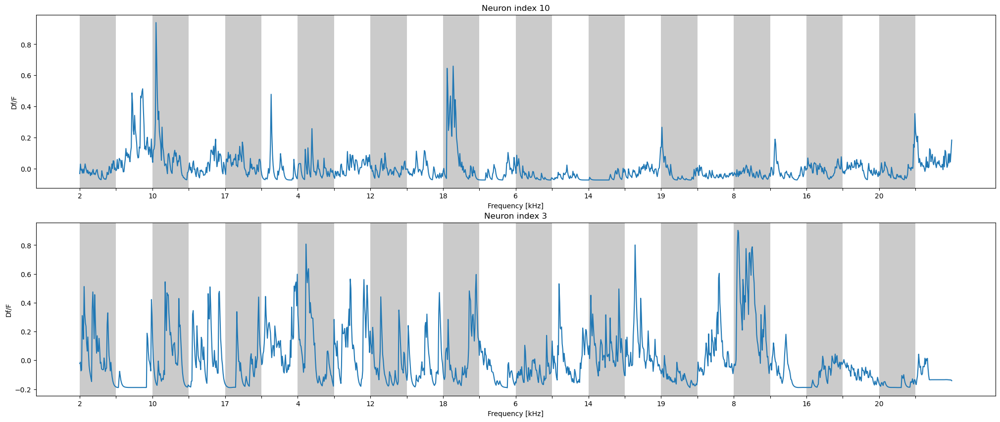

In [64]:
%matplotlib inline
Neuron = matches[1]
fig,ax=plt.subplots(2,1,figsize=(25, 10))
ax[0].plot(np.linspace(0,12, len((Pre_Trace[Neuron[0]][963::10]))),(Pre_Trace[Neuron[0]][963::10]))
ax[0].set_xticks(np.arange(0,12,0.5))
ax[0].set_xticklabels(protocol)
ax[0].set_title(f'Neuron index {Neuron[0]}')
ax[0].set_ylabel('Df/F')
ax[0].set_xlabel('Frequency [kHz]')
ax[1].plot(np.linspace(0,12, len((Pos_Trace[Neuron[1]][::10]))),(Pos_Trace[Neuron[1]][::10]))
ax[1].set_xticks(np.arange(0,12,0.5))
ax[1].set_xticklabels(protocol)
ax[1].set_title(f'Neuron index {Neuron[1]}')
ax[1].set_ylabel('Df/F')
ax[1].set_xlabel('Frequency [kHz]')
for i in range(0, 24, 1):
    if i % 2 == 0:
        ax[0].axvspan(i/2, (i/2)+0.5, facecolor='#9999', alpha=0.5)
        ax[1].axvspan(i/2, (i/2)+0.5, facecolor='#9999', alpha=0.5)


In [ ]:
'''            
def matchesneurons(Pre_CenterOfMass, Pos_CenterOfMass):
    global matches
    PossiblePre_idx = []
    PossiblePos_idx = []
    NewaPossible_Matches = []

    for i, pre_com in enumerate(Pre_CenterOfMass):
        for j, pos_com in enumerate(Pos_CenterOfMass):
            if abs(pre_com[0] - pos_com[0]) <= 2 and abs(pre_com[1] - pos_com[1]) <= 5:
                PossiblePre_idx.append(i)
                PossiblePos_idx.append(j)

    PossiblePre_idx = np.array(PossiblePre_idx, dtype=int)
    PossiblePos_idx = np.array(PossiblePos_idx, dtype=int)

    print(f'Tamanho de únicos  neurônios pre {len(np.unique(PossiblePre_idx))}')
    print(f'Tamanho de únicos  neurônios pos {len(np.unique(PossiblePos_idx))}')

    for i in PossiblePre_idx:
        for j in PossiblePos_idx:
            if abs(Pre_CenterOfMass[i][0] - Pos_CenterOfMass[j][0]) <= 1.5 and abs(Pre_CenterOfMass[i][1] - Pos_CenterOfMass[j][1]) <= 1.5:
                print(f'Pre {i} Pos {j}')
                if abs(Pre_CenterOfMass[i][0] - Pos_CenterOfMass[j][0]) <= 1.25 and abs(Pre_CenterOfMass[i][1] - Pos_CenterOfMass[j][1]) <= 1.35:
                    print(f'Pre1 {i} Pos1 {j}')
                    if 25 <= Pre_CenterOfMass[i][1] <= 325:
                        plt.scatter(Pre_CenterOfMass[i][1], Pre_CenterOfMass[i][0], c='g')
                        plt.scatter(Pos_CenterOfMass[j][1], Pos_CenterOfMass[j][0], c='r')
                        NewaPossible_Matches.append((i, j))

    plt.imshow(PnrPos)
    matches = NewaPossible_Matches
    print(f'Quantidade de mathces {len(matches)}')

    return matches
'''

In [139]:

import math

class ImageComparator:
    def __init__(self, image1_path, image2_path):
        self.image1 = cv2.imread(image1_path)
        self.image2 = cv2.imread(image2_path)
        
        if self.image1 is None or self.image2 is None:
            raise ValueError("One or both images could not be loaded. Check the file paths.")
            
        self.points1 = []
        self.points2 = []
        self.current_image = 1
        self.window_name = "Image Comparator - Click on the same element in both images"
        self.focal_length = None  # Can be set if known, otherwise calculated from FOV change
        self.image_center = (self.image1.shape[1]//2, self.image1.shape[0]//2)
        
    def click_event(self, event, x, y, flags, param):
        if event == cv2.EVENT_LBUTTONDOWN:
            if self.current_image == 1:
                self.points1.append((x, y))
                print(f"Point marked on Image 1 at: ({x}, {y})")
                cv2.circle(self.image1, (x, y), 5, (0, 0, 255), -1)
                cv2.imshow(self.window_name, self.image1)
                self.current_image = 2
                cv2.imshow(self.window_name, self.image2)
            else:
                self.points2.append((x, y))
                print(f"Point marked on Image 2 at: ({x}, {y})")
                cv2.circle(self.image2, (x, y), 5, (0, 0, 255), -1)
                cv2.imshow(self.window_name, self.image2)
                self.current_image = 1
                cv2.imshow(self.window_name, self.image1)
                
    def calculate_shifts(self):
        if len(self.points1) != len(self.points2):
            raise ValueError("Number of points marked in both images must be equal.")
            
        results = []
        for p1, p2 in zip(self.points1, self.points2):
            dx = p2[0] - p1[0]
            dy = p2[1] - p1[1]
            radial_shift = math.sqrt(dx**2 + dy**2)
            
            # Calculate angle of movement (in degrees)
            angle = math.degrees(math.atan2(dy, dx)) % 360
            
            results.append({
                'dx': dx,
                'dy': dy,
                'radial_shift': radial_shift,
                'angle': angle,
                'point1': p1,
                'point2': p2
            })
            
        return results
    
    def calculate_fov_change(self, shifts):
        if len(shifts) < 2:
            print("Need at least 2 points to estimate FOV change")
            return None
        
        # Calculate scaling factors between point pairs
        scales = []
        for i in range(len(shifts)):
            for j in range(i+1, len(shifts)):
                # Original distance between points in image1
                p1_i = np.array(shifts[i]['point1'])
                p1_j = np.array(shifts[j]['point1'])
                orig_dist = np.linalg.norm(p1_j - p1_i)
                
                # New distance between points in image2
                p2_i = np.array(shifts[i]['point2'])
                p2_j = np.array(shifts[j]['point2'])
                new_dist = np.linalg.norm(p2_j - p2_i)
                
                if orig_dist > 0:
                    scale = new_dist / orig_dist
                    scales.append(scale)
        
        if not scales:
            return None
            
        avg_scale = np.mean(scales)
        fov_change = None
        
        if avg_scale != 1:
            # Assuming the FOV change is uniform (zoom in/out)
            # FOV2 = 2 * arctan(scale * tan(FOV1/2))
            # Without knowing original FOV, we can only report scale factor
            fov_change = {
                'scale_factor': avg_scale,
                'percent_change': (avg_scale - 1) * 100
            }
        
        return fov_change
    
    def show_overlap(self, shifts):
        height = max(self.image1.shape[0], self.image2.shape[0])
        width = max(self.image1.shape[1], self.image2.shape[1])
        
        composite = np.zeros((height, width, 3), dtype=np.uint8)
        composite[:self.image1.shape[0], :self.image1.shape[1]] = self.image1
        overlay = composite.copy()
        overlay[:self.image2.shape[0], :self.image2.shape[1]] = self.image2
        
        alpha = 0.5
        composite = cv2.addWeighted(composite, alpha, overlay, 1 - alpha, 0)
        
        for shift in shifts:
            p1 = shift['point1']
            p2 = shift['point2']
            cv2.circle(composite, p1, 5, (0, 255, 0), -1)  # Green for image1
            cv2.circle(composite, p2, 5, (255, 0, 0), -1)   # Blue for image2
            cv2.line(composite, p1, p2, (0, 255, 255), 2)   # Shift vector
            
            # Label with radial shift
            label_pos = (p1[0] + 10, p1[1] - 10)
            cv2.putText(composite, f"{shift['radial_shift']:.1f}px", 
                       label_pos, cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
        
        return composite
    
    def run(self):
        cv2.namedWindow(self.window_name)
        cv2.setMouseCallback(self.window_name, self.click_event)
        
        cv2.imshow(self.window_name, self.image1)
        
        print("Instructions:")
        print("1. Click on an element in the first image")
        print("2. Click on the same element in the second image")
        print("3. Repeat for at least 2 points for FOV change estimation")
        print("4. Press 'c' to calculate shifts and show overlap")
        print("5. Press 'q' to quit")
        
        while True:
            key = cv2.waitKey(1) & 0xFF
            
            if key == ord('c'):
                if len(self.points1) > 0 and len(self.points2) > 0:
                    try:
                        shifts = self.calculate_shifts()
                        fov_change = self.calculate_fov_change(shifts)
                        
                        print("\n=== Shift Results ===")
                        for i, shift in enumerate(shifts, 1):
                            print(f"Point {i}:")
                            print(f"  X shift: {shift['dx']:.1f} pixels")
                            print(f"  Y shift: {shift['dy']:.1f} pixels")
                            print(f"  Radial shift: {shift['radial_shift']:.1f} pixels")
                            print(f"  Movement angle: {shift['angle']:.1f}°")
                        
                        if fov_change:
                            print("\n=== FOV Change ===")
                            print(f"Scale factor: {fov_change['scale_factor']:.4f}")
                            print(f"Percentage change: {fov_change['percent_change']:.2f}%")
                            if fov_change['scale_factor'] > 1:
                                print("Interpretation: Zoomed in (FOV decreased)")
                            else:
                                print("Interpretation: Zoomed out (FOV increased)")
                        else:
                            print("\nCould not calculate FOV change (need at least 2 points)")
                        
                        composite = self.show_overlap(shifts)
                        cv2.imshow("Overlay with Shift Vectors", composite)
                        
                    except ValueError as e:
                        print(f"Error: {e}")
                else:
                    print("Please mark at least one point in each image first.")
            
            elif key == ord('q'):
                break
                
        cv2.destroyAllWindows()

comparator = ImageComparator(r'U:/Pesquisa/CAnalysis/prenew/results2/prePnrResult.jpg', r'U:/Pesquisa/CAnalysis/posnew/results2/posPnrResult.jpg')
comparator.run()


Instructions:
1. Click on an element in the first image
2. Click on the same element in the second image
3. Repeat for at least 2 points for FOV change estimation
4. Press 'c' to calculate shifts and show overlap
5. Press 'q' to quit
Point marked on Image 1 at: (257, 155)
Point marked on Image 2 at: (254, 153)
Point marked on Image 1 at: (297, 229)
Point marked on Image 2 at: (286, 201)
Point marked on Image 1 at: (302, 215)
Point marked on Image 2 at: (294, 196)
Point marked on Image 1 at: (312, 201)
Point marked on Image 2 at: (301, 189)
Point marked on Image 1 at: (248, 268)
Point marked on Image 2 at: (246, 273)
Point marked on Image 1 at: (223, 266)
Point marked on Image 2 at: (215, 267)
Point marked on Image 1 at: (238, 227)
Point marked on Image 2 at: (251, 249)
Point marked on Image 1 at: (216, 236)
Point marked on Image 2 at: (214, 223)
Point marked on Image 1 at: (130, 276)
Point marked on Image 2 at: (131, 265)
Point marked on Image 1 at: (116, 244)
Point marked on Image 2 a